### Imports (Extracted from the Original Notebook, most of them are not used at all)

In [ ]:
!pip install tsfel

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 824.5 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 9.5 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
import pandas as pd
import os
import re
import matplotlib.pyplot as plt
import glob
import seaborn as sns
import numpy as np
import h5py
import math
import glob
from scipy.stats import zscore
import matplotlib.dates as mdates
from datetime import datetime, timedelta

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score, KFold
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_predict, KFold
from sklearn.preprocessing import LabelEncoder

from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier, VotingClassifier, BaggingClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier, RidgeClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier, RadiusNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB, ComplementNB
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import Perceptron, PassiveAggressiveClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

import plotly.express as px

from mpl_toolkits.mplot3d import Axes3D


In [ ]:
import tsfel as tsfel

In [ ]:
!pip install h5py

In [ ]:
import h5py as h5

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


### Convert Oli h5 files to .csv files

In [ ]:
def list_datasets(h5file, path='/'):
    """
    Recursively lists all datasets in an HDF5 file along with their full paths.
    """
    datasets = []
    def visitor_func(name, node):
        if isinstance(node, h5py.Dataset):
            datasets.append((path+name, node.shape, node.dtype))
    h5file.visititems(visitor_func)
    return datasets

In [ ]:
# Path to your HDF5 file
h5_file_path = '/content/drive/MyDrive/Tesis/PATITA Data/CSVs/visual/Tlaxcala/Oli - FrustrationDLC_dlcrnetms5_SamsNov6shuffle1_50000.h5'

# Open the HDF5 file
with h5py.File(h5_file_path, 'r') as file:
    # List all datasets
    all_datasets = list_datasets(file)

    # Print dataset information
    for dataset_path, shape, dtype in all_datasets:
        print(f"Dataset Path: {dataset_path}, Shape: {shape}, Data Type: {dtype}")

Dataset Path: /df_with_missing/_i_table/index/abounds, Shape: (0,), Data Type: int64
Dataset Path: /df_with_missing/_i_table/index/bounds, Shape: (0, 127), Data Type: int64
Dataset Path: /df_with_missing/_i_table/index/indices, Shape: (0, 131072), Data Type: uint32
Dataset Path: /df_with_missing/_i_table/index/indicesLR, Shape: (131072,), Data Type: uint32
Dataset Path: /df_with_missing/_i_table/index/mbounds, Shape: (0,), Data Type: int64
Dataset Path: /df_with_missing/_i_table/index/mranges, Shape: (0,), Data Type: int64
Dataset Path: /df_with_missing/_i_table/index/ranges, Shape: (0, 2), Data Type: int64
Dataset Path: /df_with_missing/_i_table/index/sorted, Shape: (0, 131072), Data Type: int64
Dataset Path: /df_with_missing/_i_table/index/sortedLR, Shape: (131201,), Data Type: int64
Dataset Path: /df_with_missing/_i_table/index/zbounds, Shape: (0,), Data Type: int64
Dataset Path: /df_with_missing/table, Shape: (922,), Data Type: [('index', '<i8'), ('values_block_0', '<f8', (72,))]


In [ ]:
def load_and_normalize_hdf5(file_path, csv_file_path):
    new_keypoints = ['nose','upper_jaw','right_eye','right_earbase','right_earend','left_eye', 'left_earbase','left_earend','throat_end','back_base','tail_base','tail_end', 'front_left_thai'
    , 'front_left_knee','front_left_paw','front_right_thai', 'front_right_knee','front_right_paw','back_left_thai', 'back_left_knee','back_left_paw','back_right_thai', 'back_right_knee','back_right_paw']
    keypoints = ['LFPaw', 'LFWrist', 'LFElbow', 'LRPaw', 'LRWrist', 'LRElbow', 'RFPaw', 'RFWrist', 'RFElbow',
                 'RBPaw', 'RBWrist', 'RBElbow', 'TailSet' , 'TailTip', 'LBEar' , 'LREar' , 'Nose',
                 'Chin', 'LTEar', 'RTEar', 'LEye', 'REye', 'Withers', 'Throat']
    with h5py.File(file_path, 'r') as f:
        # Assuming data is stored in a specific dataset - adjust as per the actual structure
        dataset = f['/df_with_missing/table']
        data = pd.DataFrame(dataset[:]['values_block_0'])
        flat_columns = ['{}_{}'.format(coord, kp) for kp in keypoints for coord in ['x', 'y', 'likelihood']]
        data.columns = flat_columns
        data.to_csv(csv_file_path, index=False)

    return data

In [ ]:
load_and_normalize_hdf5('/content/drive/MyDrive/Tesis/PATITA Data/CSVs/visual/Tlaxcala/Oli - PettingDLC_dlcrnetms5_SamsNov6shuffle1_50000.h5',
                        'Oli PettingDLC_dlcrnetms5_SamsNov6shuffle1_50000.h5')

,x_LFPaw,y_LFPaw,likelihood_LFPaw,x_LFWrist,y_LFWrist,likelihood_LFWrist,x_LFElbow,y_LFElbow,likelihood_LFElbow,x_LRPaw,...,likelihood_LEye,x_REye,y_REye,likelihood_REye,x_Withers,y_Withers,likelihood_Withers,x_Throat,y_Throat,likelihood_Throat
0,231.472977,747.125305,0.992478,261.109802,665.543823,0.930639,282.631836,587.653809,0.470800,417.578674,...,0.036104,190.557159,334.312653,0.048858,306.334534,418.158356,0.868004,211.920654,491.593658,0.761795
1,227.973816,738.499817,0.970353,260.827332,656.360840,0.949978,271.667175,584.813782,0.478904,411.479065,...,0.823449,165.658524,316.600555,0.831599,307.424377,417.025482,0.927075,193.933365,465.344391,0.977402
2,235.899231,736.278992,0.966259,269.714081,653.215881,0.844597,285.164307,573.301392,0.778976,418.715668,...,0.829247,167.990768,290.998199,0.797838,325.082642,429.482910,0.977348,210.746643,463.939850,0.912829
3,249.448578,730.202637,0.983675,284.515045,647.058716,0.917924,302.335907,570.122620,0.607006,432.674835,...,0.529494,192.461868,284.669800,0.418688,349.603760,426.816040,0.964421,227.986099,439.769623,0.952421
4,256.551605,718.835144,0.971855,288.749451,633.044800,0.963214,307.426666,557.394043,0.618839,438.336578,...,0.024253,359.298737,363.735168,0.009195,366.552521,428.219452,0.574001,246.191467,421.175995,0.974500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
913,376.030792,431.365845,0.614610,382.406342,394.031555,0.920558,392.543121,341.449585,0.890237,453.745850,...,0.004380,337.258759,222.401199,0.014756,357.649292,237.357742,0.802712,322.822052,278.926178,0.711094
914,379.145813,419.761139,0.684831,388.955627,383.738739,0.864590,401.971283,329.039764,0.901812,462.979584,...,0.043846,328.110840,213.193329,0.087591,370.982452,226.233978,0.787069,328.124512,266.444580,0.777474
915,377.357117,431.553802,0.527705,389.031708,389.696869,0.790919,403.391937,335.983032,0.975858,458.663025,...,0.020920,332.471619,205.723511,0.050302,369.735229,237.796249,0.885646,323.955963,280.898346,0.574464
916,374.141754,401.059875,0.668448,381.977448,363.240417,0.884025,399.760284,308.752930,0.834581,455.437805,...,0.043001,335.248993,168.094162,0.082142,369.920013,205.169388,0.842376,322.127655,252.565796,0.645239


In [ ]:
def process_csv_files(input_folder, output_folder):
    """
    Process all CSV files in the input_folder, applying the column renaming and formatting,
    and then save them to the output_folder.

    Args:
    input_folder (str): Path to the folder containing the CSV files.
    output_folder (str): Path to the folder where processed files will be saved.
    """
    # Ensure the output directory exists
    os.makedirs(output_folder, exist_ok=True)

    # List all CSV files in the input directory
    csv_files = [f for f in os.listdir(input_folder) if f.endswith('.csv')]

    # Define a function to adjust column names
    def adjust_column_names(columns):
        refined_names = ['Frame']  # Start with 'Frame' for the first column
        for i in range(1, len(columns), 3):  # Start from the second element, step by 3
            body_part = columns[i].split('.')[0]  # Get the base body part name from the original headers
            refined_names.extend([
                f"x_{body_part}",
                f"y_{body_part}",
                f"likelihood_{body_part}"
            ])
        return refined_names

    # Process each file
    for file_name in csv_files:
        file_path = os.path.join(input_folder, file_name)
        data = pd.read_csv(file_path, header=1)  # Read the file, skipping the original headers

        # Apply the adjusted column names
        new_column_names = adjust_column_names(data.columns)
        data.columns = new_column_names

        # Save the processed file to the output folder
        output_path = os.path.join(output_folder, file_name)
        data.to_csv(output_path, index=False)
        print(f"Processed and saved: {output_path}")


In [ ]:
# Example usage:
process_csv_files('/content/drive/MyDrive/Tesis/PATITA Data/CSVs/visual/Tlaxcala', '/content/drive/MyDrive/Tesis/PATITA Data/CSVs/visual/Processed Visual Data')

Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/visual/Processed Visual Data/Sam - AbandonmentDLC_resnet50_SamsNov6shuffle1_180000.csv
Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/visual/Processed Visual Data/Sam - FrustrationDLC_resnet50_SamsNov6shuffle1_180000.csv
Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/visual/Processed Visual Data/Sam - PettingDLC_resnet50_SamsNov6shuffle1_180000.csv
Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/visual/Processed Visual Data/Sam - ToyDLC_resnet50_SamsNov6shuffle1_180000.csv
Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/visual/Processed Visual Data/Archi AbandonmentDLC_resnet50_ArchiMar13shuffle1_200000_filtered.csv
Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/visual/Processed Visual Data/Archi ToyDLC_resnet50_ArchiMar13shuffle1_200000_filtered.csv
Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/visual/

In [ ]:
# File path to your HDF5 file
# Path to the dataset within the HDF5 file
dataset_name = '/df_with_missing/table'
# File path for the resulting CSV file
csv_file_path = 'h5 to csv convertion test.csv'

# Open the HDF5 file
with h5py.File(h5_file_path, 'r') as file:
    # Check if the dataset exists
    if dataset_name in file:
        # Load the dataset
        data = file[dataset_name][()]
    else:
        print(f"Dataset {dataset_name} not found in the file.")
        exit()

# Convert the data to a pandas DataFrame
df = pd.DataFrame(data)

# Save the DataFrame to a CSV file
df.to_csv(csv_file_path, index=False)

print(f'Data from {dataset_name} saved to {csv_file_path}')

ValueError: Data must be 1-dimensional, got ndarray of shape (922, 72) instead

### Merge Pose estimation CSVs with bounding box values

In [ ]:
def process_videos(pose_folder, bbox_folder, output_folder, scale_factor=1/3):
    """
    Processes multiple pose estimation and bounding box files.

    Args:
    pose_folder (str): Path to the folder containing pose estimation CSV files.
    bbox_folder (str): Path to the folder containing bounding box CSV files.
    output_folder (str): Path to save the merged output files.
    scale_factor (float): Factor to scale down the bounding box coordinates.
    """
    # Ensure the output directory exists
    os.makedirs(output_folder, exist_ok=True)

    # List all CSV files in both directories
    pose_files = [f for f in os.listdir(pose_folder) if f.endswith('.csv') and "Sam " in f]
    bbox_files = [f for f in os.listdir(bbox_folder) if f.endswith('.csv') and "Sam " in f]

    # Process each file pair
    for pose_file in pose_files:
        pose_path = os.path.join(pose_folder, pose_file)
        pose_name = pose_file.split("DLC")[0]
        print(pose_name)
        bbox_file = f"{pose_name}_dogs.csv"  # Assuming a naming pattern to find corresponding files
        bbox_path = os.path.join(bbox_folder, bbox_file)

        if bbox_file not in bbox_files:
            print(f"Bounding box file not found for {pose_file}")
            break

        # Load data
        pose_data = pd.read_csv(pose_path)
        bbox_data = pd.read_csv(bbox_path)

        # Calculate centroids
        x_columns = [col for col in pose_data.columns if col.startswith('x_')]
        y_columns = [col for col in pose_data.columns if col.startswith('y_')]
        pose_data['centroid_x'] = pose_data[x_columns].mean(axis=1)
        pose_data['centroid_y'] = pose_data[y_columns].mean(axis=1)

        # Scale bounding box coordinates
        bbox_data[['X1', 'Y1', 'X2', 'Y2']] *= scale_factor
        bbox_data['Center X'] = (bbox_data['X1'] + bbox_data['X2']) / 2
        bbox_data['Center Y'] = (bbox_data['Y1'] + bbox_data['Y2']) / 2

        # Merge and find closest boxes
        pose_data["Frame"]= range(len(pose_data))
        merged_data = pd.merge(pose_data, bbox_data, on='Frame', how='left')
        closest_boxes = find_closest_boxes(merged_data)

        # Save processed data
        output_path = os.path.join(output_folder, pose_file)
        closest_boxes.to_csv(output_path, index=False)
        print(f"Processed and saved: {output_path}")

def find_closest_boxes(merged_data):
    closest_boxes = []
    for _, group in merged_data.groupby('Frame'):
        if group.shape[0] == 1:
            closest_boxes.append(group)
        else:
            centroids = group[['centroid_x', 'centroid_y']].values[0]
            centers = group[['Center X', 'Center Y']].values
            distances = [np.sqrt((centroids[0] - center[0]) ** 2 + (centroids[1] - center[1]) ** 2) for center in centers]
            closest_box_index = np.argmin(distances)
            closest_boxes.append(group.iloc[[closest_box_index]])
    return pd.concat(closest_boxes)

def adjust_column_names_new_pose(columns):
    refined_names = ['Frame']
    for i in range(1, len(columns), 3):
        body_part = columns[i].split('.')[0]
        refined_names.extend([
            f"x_{body_part}",
            f"y_{body_part}",
            f"likelihood_{body_part}"
        ])
    return refined_names

In [ ]:
process_videos("/content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features", "/content/drive/MyDrive/Tesis/PATITA Data/CSVs/visual/Bbox CSVs", '/content/drive/MyDrive/Tesis/PATITA Data/CSVs/visual/Processed and Merged Visual Data')

### Load files and merge them into a single CSV file

In [ ]:
def load_merged_csv(dir):
  files = [f for f in os.listdir(dir) if f.endswith('- imu.csv')]
  dfs = []

  for file in files:
      # Load the file
      parts = file.split(' - ')
      dog_name, trial = parts[0], parts[1]
      file_path = os.path.join(dir, file)
      df = pd.read_csv(file_path)

      # Shift the file to 0 and append DogName and Trial to the resulting DF
      for col in ['AccX', 'AccY', 'AccZ', 'GyrX', 'GyrY', 'GyrZ']:
          df[col] -= df[col].mean()
      df['AccMagnitude'] = (df['AccX']**2 + df['AccY']**2 + df['AccZ']**2)**0.5
      df['GyrMagnitude'] = (df['GyrX']**2 + df['GyrY']**2 + df['GyrZ']**2)**0.5
      df['DogName'] = dog_name
      df['TrialType'] = trial
      dfs.append(df)
      # Concatenate all DataFrames into one
      merged_df = pd.concat(dfs, ignore_index=True)
  return merged_df

In [ ]:
def load_merged_polar(dir):
  files = [f for f in os.listdir(dir) if f.endswith('- polar.csv')]
  dfs = []

  for file in files:
      # Load the file, obtain trial and dog name
      parts = file.split(' - ')
      dog_name, trial = parts[0], parts[1]
      file_path = os.path.join(dir, file)
      df = pd.read_csv(file_path)
      df['DogName'] = dog_name
      df['TrialType'] = trial
      dfs.append(df)
      merged_df = pd.concat(dfs, ignore_index=True)
  return merged_df


In [ ]:
def load_merged_temp(dir):
  files = [f for f in os.listdir(dir) if f.endswith('- temp.csv')]
  dfs = []

  for file in files:
      # Load the file, obtain trial and dog name
      parts = file.split(' - ')
      dog_name, trial = parts[0], parts[1]
      file_path = os.path.join(dir, file)
      df = pd.read_csv(file_path)
      df['DogName'] = dog_name
      df['TrialType'] = trial
      dfs.append(df)
      merged_df = pd.concat(dfs, ignore_index=True)
  return merged_df

### Obtain the best frames

In [ ]:
def select_best_frames_from_csv(csv_folder, output_folder):
    """
    Processes CSV files to select the best frame per second.

    Args:
    csv_folder (str): Directory containing the merged CSV files.
    output_folder (str): Directory to save the processed CSV files with best frames.
    """
    os.makedirs(output_folder, exist_ok=True)
    for file_name in os.listdir(csv_folder):
      if "Sam " in file_name:
        if file_name.endswith('.csv'):
            file_path = os.path.join(csv_folder, file_name)
            df = pd.read_csv(file_path)

            # Determine frames per second
            total_frames = len(df)
            if 850 <= total_frames <= 1000:
                fps = 15
            elif total_frames > 1700:
                fps = 30
            else:
                print(f"Skipping {file_name}, unclear fps.")
                continue

            # Calculate average likelihood and check for bounding box presence
            likelihood_columns = [col for col in df.columns if 'likelihood' in col]
            df['average_likelihood'] = df[likelihood_columns].mean(axis=1)
            df['has_bbox'] = df[['Center X', 'Center Y']].notna().all(axis=1)

            best_frames = []

            # Select the best frame for each second
            for second_start in range(0, total_frames, fps):
                second_frames = df.iloc[second_start:second_start + fps]
                # Sort by has_bbox (True first), then by average_likelihood (higher first)
                best_frame = second_frames.sort_values(by=['has_bbox', 'average_likelihood'], ascending=[False, False]).iloc[0]
                best_frames.append(best_frame)

            # Save the selected best frames to a new CSV
            best_frames_df = pd.DataFrame(best_frames)
            output_path = os.path.join(output_folder, file_name)
            best_frames_df.to_csv(output_path, index=False)
            print(f"Processed and saved: {output_path}")

In [ ]:
def process_and_normalize_files(input_folder, output_folder):
    """
    Processes CSV files in the input folder to normalize coordinates and remove unnecessary columns,
    then saves the modified data to the output folder.

    Args:
    input_folder (str): Directory containing the CSV files.
    output_folder (str): Directory to save the processed CSV files.
    """
    # Ensure the output directory exists
    os.makedirs(output_folder, exist_ok=True)

    # List all CSV files in the input directory
    csv_files = [f for f in os.listdir(input_folder) if f.endswith('.csv')]

    for file_name in csv_files:
      if "Sam " in file_name:
        file_path = os.path.join(input_folder, file_name)
        df = pd.read_csv(file_path)
        # Fill missing bounding box data with the average of the column
        bbox_columns = ['X1', 'Y1', 'X2', 'Y2', 'Center X', 'Center Y']
        for col in bbox_columns:
            if col in df.columns:
                df[col] = df[col].fillna(df[col].mean())
        # Normalize coordinates
        df = normalize_coordinates(df)


        # Remove likelihood and centroid columns
        likelihood_columns = [col for col in df.columns if 'likelihood' in col or 'centroid' in col]
        df.drop(columns=likelihood_columns, inplace=True)

        # Save the processed data
        output_path = os.path.join(output_folder, file_name)
        df = df.replace(r'^\s*$', np.nan, regex=True)
        df = df.dropna()
        df.to_csv(output_path, index=False)
        print(f"Processed and saved: {output_path}")

def normalize_coordinates(df):
    """
    Normalizes the pose estimation coordinates based on the center of the bounding box.

    Args:
    df (pandas.DataFrame): DataFrame containing the pose estimation and bounding box data.

    Returns:
    pandas.DataFrame: DataFrame with normalized pose estimation coordinates.
    """
    # Columns to normalize
    x_columns = [col for col in df.columns if col.startswith('x_') and 'Center' not in col]
    y_columns = [col for col in df.columns if col.startswith('y_') and 'Center' not in col]

    # Normalize coordinates
    for x_col, y_col in zip(x_columns, y_columns):
        df[x_col] = df[x_col] - df['Center X']
        df[y_col] = df[y_col] - df['Center Y']

    return df

In [ ]:
select_best_frames_from_csv('/content/drive/MyDrive/Tesis/PATITA Data/CSVs/visual/Processed and Merged Visual Data', '/content/drive/MyDrive/Tesis/PATITA Data/CSVs/visual/Best Frames Data (Final Version Before FE)')

In [ ]:
process_and_normalize_files('/content/drive/MyDrive/Tesis/PATITA Data/CSVs/visual/Best Frames Data (Final Version Before FE)', "/content/drive/MyDrive/Tesis/PATITA Data/CSVs/[Completed Data] Normalized, Stripped, Best Frames Data")


In [ ]:
keys = pd.read_csv("/content/drive/MyDrive/Tesis/PATITA Data/CSVs/[Completed Data] Normalized, Stripped, Best Frames Data/Archi AbandonmentDLC_resnet50_ArchiMar13shuffle1_200000_filtered.csv")

In [ ]:
keys.columns

### Visual data feature extraction

In [ ]:
def calculate_kinematic_features(df, num_seconds):
    """Calculate displacement, velocity, and acceleration for all keypoints over N seconds."""
    keypoints = [col for col in df.columns if col.startswith('x_') or col.startswith('y_')]
    for keypoint in keypoints:
        # Calculate displacement as the difference in position between N-second intervals
        df[f'displacement_{keypoint}'] = df[keypoint].diff(periods=num_seconds).fillna(0)

        # Calculate velocity as displacement over N seconds
        df[f'velocity_{keypoint}'] = df[f'displacement_{keypoint}'] / num_seconds

        # Calculate acceleration as change in velocity over N seconds
        df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds

    return df

def bounding_box_features(df):
    """Calculate bounding box features: width, height, aspect ratio, and area."""
    df['bbox_width'] = df['X2'] - df['X1']
    df['bbox_height'] = df['Y2'] - df['Y1']
    df['bbox_aspect_ratio'] = df['bbox_width'] / df['bbox_height'].replace(0, np.nan)
    df['bbox_area'] = df['bbox_width'] * df['bbox_height']

    return df

def process_files(input_folder, output_folder, num_seconds):
    """Process each CSV file to calculate features and save the updated DataFrame."""
    os.makedirs(output_folder, exist_ok=True)

    for file_name in os.listdir(input_folder):
        if not file_name.endswith('.csv'):
            continue  # Skip non-CSV files

        file_path = os.path.join(input_folder, file_name)
        df = pd.read_csv(file_path)

        # Calculate kinematic features
        df = calculate_kinematic_features(df, num_seconds)

        # Calculate bounding box features
        df = bounding_box_features(df)

        # Extract trial name from file name
        trial_name = file_name.split('DLC')[0].strip().split()[-1]
        dog_name = file_name.split(" ")[0]
        df['Trial Name'] = trial_name
        df['Dog Name'] = dog_name

        # Save the updated dataframe to a new CSV file in the output folder
        output_file_path = os.path.join(output_folder, file_name)
        df.to_csv(output_file_path, index=False)
        print(f"Processed and saved: {output_file_path}")

input_folder = '/content/drive/MyDrive/Tesis/PATITA Data/CSVs/[Completed Data] Normalized, Stripped, Best Frames Data'
output_folder = '/content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features'
num_seconds = 5  # Number of seconds to calculate kinematic features over

# Call the function to process the files
process_files(input_folder, output_folder, num_seconds)

<ipython-input-73-f8fe67d1555a>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'velocity_{keypoint}'] = df[f'displacement_{keypoint}'] / num_seconds
<ipython-input-73-f8fe67d1555a>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds
<ipython-input-73-f8fe67d1555a>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Archi AbandonmentDLC_resnet50_ArchiMar13shuffle1_200000_filtered.csv


<ipython-input-73-f8fe67d1555a>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'velocity_{keypoint}'] = df[f'displacement_{keypoint}'] / num_seconds
<ipython-input-73-f8fe67d1555a>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds
<ipython-input-73-f8fe67d1555a>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Archi PettingDLC_resnet50_ArchiMar13shuffle1_200000_filtered.csv


<ipython-input-73-f8fe67d1555a>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'velocity_{keypoint}'] = df[f'displacement_{keypoint}'] / num_seconds
<ipython-input-73-f8fe67d1555a>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds
<ipython-input-73-f8fe67d1555a>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Miel FrustrationDLC_resnet50_MielApr12shuffle1_150000_filtered.csv


<ipython-input-73-f8fe67d1555a>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'velocity_{keypoint}'] = df[f'displacement_{keypoint}'] / num_seconds
<ipython-input-73-f8fe67d1555a>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds
<ipython-input-73-f8fe67d1555a>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Archi ToyDLC_resnet50_ArchiMar13shuffle1_200000_filtered.csv


<ipython-input-73-f8fe67d1555a>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'velocity_{keypoint}'] = df[f'displacement_{keypoint}'] / num_seconds
<ipython-input-73-f8fe67d1555a>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds
<ipython-input-73-f8fe67d1555a>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Lumiere AbandonmentDLC_resnet50_lumiereMar13shuffle1_200000_filtered.csv


<ipython-input-73-f8fe67d1555a>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'velocity_{keypoint}'] = df[f'displacement_{keypoint}'] / num_seconds
<ipython-input-73-f8fe67d1555a>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds
<ipython-input-73-f8fe67d1555a>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Archi FrustrationDLC_resnet50_ArchiMar13shuffle1_200000_filtered.csv


<ipython-input-73-f8fe67d1555a>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'velocity_{keypoint}'] = df[f'displacement_{keypoint}'] / num_seconds
<ipython-input-73-f8fe67d1555a>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds
<ipython-input-73-f8fe67d1555a>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Lumiere PettingDLC_resnet50_lumiereMar13shuffle1_200000_filtered.csv


<ipython-input-73-f8fe67d1555a>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'velocity_{keypoint}'] = df[f'displacement_{keypoint}'] / num_seconds
<ipython-input-73-f8fe67d1555a>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds
<ipython-input-73-f8fe67d1555a>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Miel AbandonmentDLC_resnet50_MielApr12shuffle1_150000_filtered.csv


<ipython-input-73-f8fe67d1555a>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'velocity_{keypoint}'] = df[f'displacement_{keypoint}'] / num_seconds
<ipython-input-73-f8fe67d1555a>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds
<ipython-input-73-f8fe67d1555a>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Miel PettingDLC_resnet50_MielApr12shuffle1_150000_filtered.csv


<ipython-input-73-f8fe67d1555a>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'velocity_{keypoint}'] = df[f'displacement_{keypoint}'] / num_seconds
<ipython-input-73-f8fe67d1555a>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds
<ipython-input-73-f8fe67d1555a>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Lumiere FrustrationDLC_resnet50_lumiereMar13shuffle1_200000_filtered.csv


<ipython-input-73-f8fe67d1555a>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'velocity_{keypoint}'] = df[f'displacement_{keypoint}'] / num_seconds
<ipython-input-73-f8fe67d1555a>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds
<ipython-input-73-f8fe67d1555a>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Lumiere ToyDLC_resnet50_lumiereMar13shuffle1_200000_filtered.csv
Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Oli PettingDLC_dlcrnetms5_SamsNov6shuffle1_50000.csv


<ipython-input-73-f8fe67d1555a>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'velocity_{keypoint}'] = df[f'displacement_{keypoint}'] / num_seconds
<ipython-input-73-f8fe67d1555a>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds
<ipython-input-73-f8fe67d1555a>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Sam PettingDLC_resnet50_SamsNov6shuffle1_180000.csv
Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Oli FrustrationDLC_dlcrnetms5_SamsNov6shuffle1_50000.csv


<ipython-input-73-f8fe67d1555a>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'velocity_{keypoint}'] = df[f'displacement_{keypoint}'] / num_seconds
<ipython-input-73-f8fe67d1555a>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds
<ipython-input-73-f8fe67d1555a>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Sam AbandonmentDLC_resnet50_SamsNov6shuffle1_180000.csv
Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Sam ToyDLC_resnet50_SamsNov6shuffle1_180000.csv

<ipython-input-73-f8fe67d1555a>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'velocity_{keypoint}'] = df[f'displacement_{keypoint}'] / num_seconds
<ipython-input-73-f8fe67d1555a>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds
<ipython-input-73-f8fe67d1555a>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

<ipython-input-73-f8fe67d1555a>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'velocity_{keypoint}'] = df[f'displacement_{keypoint}'] / num_seconds
<ipython-input-73-f8fe67d1555a>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds
<ipython-input-73-f8fe67d1555a>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Sam FrustrationDLC_resnet50_SamsNov6shuffle1_180000.csv


<ipython-input-73-f8fe67d1555a>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds
<ipython-input-73-f8fe67d1555a>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'displacement_{keypoint}'] = df[keypoint].diff(periods=num_seconds).fillna(0)
<ipython-input-73-f8fe67d1555a>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance

Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Miel ToyDLC_resnet50_MielApr12shuffle1_150000_filtered.csv


<ipython-input-73-f8fe67d1555a>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'velocity_{keypoint}'] = df[f'displacement_{keypoint}'] / num_seconds
<ipython-input-73-f8fe67d1555a>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds
<ipython-input-73-f8fe67d1555a>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Oli AbandonmentDLC_dlcrnetms5_SamsNov6shuffle1_50000.csv
Processed and saved: /content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Oli ToyDLC_dlcrnetms5_SamsNov6shuffle1_50000.csv


<ipython-input-73-f8fe67d1555a>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'velocity_{keypoint}'] = df[f'displacement_{keypoint}'] / num_seconds
<ipython-input-73-f8fe67d1555a>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'acceleration_{keypoint}'] = df[f'velocity_{keypoint}'].diff(periods=num_seconds).fillna(0) / num_seconds
<ipython-input-73-f8fe67d1555a>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consi

In [ ]:
def rename_columns_in_csv(input_folder, output_folder, mapping):
    """
    Rename columns in all CSV files in the input folder based on a given mapping,
    and save the modified CSV files to the output folder.

    Parameters:
        input_folder (str): Directory containing the original CSV files.
        output_folder (str): Directory where the renamed CSV files will be saved.
        mapping (dict): Dictionary with values as current column substrings and keys as new names.
    """
    # Ensure the output directory exists
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Reverse the provided mapping for correct usage
    correct_mapping = {v: k for k, v in mapping.items()}

    # Process each file in the input directory
    for filename in os.listdir(input_folder):
      if "Sam " in filename:
        if filename.endswith('.csv'):
            file_path = os.path.join(input_folder, filename)
            df = pd.read_csv(file_path)

            # Rename columns based on mapping
            new_columns = {}
            for col in df.columns:
                for original, new in correct_mapping.items():
                    if original in col:
                        new_columns[col] = col.replace(original, new)
            print(df.columns.tolist())
            df.rename(columns=new_columns, inplace=True)
            print(df.columns.tolist())
            # Save the renamed dataframe
            df.to_csv(os.path.join(output_folder, filename), index=False)
            print(f"Processed and saved: {filename}")

# Example usage:
input_folder = '/content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features'
output_folder = '/content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features'
mapping = {
    'nose': 'Nose', 'back_base': 'Withers', 'tail_base': 'TailSet', 'tail_end': 'TailTip',
    'left_earbase': 'LBEar', 'right_earbase': 'LREar', 'left_earend': 'LTEar', 'right_earend': 'RTEar',
    'upper_jaw': 'Chin', 'throat_end': 'Throat', 'front_left_thai': 'LFElbow', 'front_left_knee': 'LFWrist',
    'front_left_paw': 'LFPaw', 'front_right_thai': 'RFElbow', 'front_right_knee': 'RFWrist',
    'front_right_paw': 'RFPaw', 'back_left_thai': 'LRElbow', 'back_left_knee': 'LRWrist',
    'back_left_paw': 'LRPaw', 'back_right_thai': 'RBElbow', 'back_right_knee': 'RBWrist',
    'back_right_paw': 'RBPaw', 'left_eye' : 'LEye', 'right_eye': 'REye'
}
rename_columns_in_csv(input_folder, output_folder, mapping)

['Frame', 'x_LFPaw', 'y_LFPaw', 'x_LFWrist', 'y_LFWrist', 'x_LFElbow', 'y_LFElbow', 'x_LRPaw', 'y_LRPaw', 'x_LRWrist', 'y_LRWrist', 'x_LRElbow', 'y_LRElbow', 'x_RFPaw', 'y_RFPaw', 'x_RFWrist', 'y_RFWrist', 'x_RFElbow', 'y_RFElbow', 'x_RBPaw', 'y_RBPaw', 'x_RBWrist', 'y_RBWrist', 'x_RBElbow', 'y_RBElbow', 'x_TailSet', 'y_TailSet', 'x_TailTip', 'y_TailTip', 'x_LBEar', 'y_LBEar', 'x_LREar', 'y_LREar', 'x_Nose', 'y_Nose', 'x_Chin', 'y_Chin', 'x_LTEar', 'y_LTEar', 'x_RTEar', 'y_RTEar', 'x_LEye', 'y_LEye', 'x_REye', 'y_REye', 'x_Withers', 'y_Withers', 'x_Throat', 'y_Throat', 'X1', 'Y1', 'X2', 'Y2', 'Center X', 'Center Y', 'has_bbox', 'displacement_x_LFPaw', 'velocity_x_LFPaw', 'acceleration_x_LFPaw', 'displacement_y_LFPaw', 'velocity_y_LFPaw', 'acceleration_y_LFPaw', 'displacement_x_LFWrist', 'velocity_x_LFWrist', 'acceleration_x_LFWrist', 'displacement_y_LFWrist', 'velocity_y_LFWrist', 'acceleration_y_LFWrist', 'displacement_x_LFElbow', 'velocity_x_LFElbow', 'acceleration_x_LFElbow', 'displ

### Extract columns out of the merged DataFrame

In [ ]:
polar_df = load_merged_polar('/content/drive/MyDrive/Tesis/PATITA Data/CSVs/polar')
polar_df.head(), polar_df['DogName'].unique(), polar_df['TrialType'].unique()
polar_df.to_csv("polar df.csv")

In [ ]:
temp_df = load_merged_temp('/content/drive/MyDrive/Tesis/PATITA Data/CSVs/temp')
temp_df.head(), temp_df['DogName'].unique(), temp_df['TrialType'].unique()
temp_df.to_csv("temp df.csv")

In [ ]:
merged_df = load_merged_csv('/content/drive/MyDrive/Tesis/PATITA Data/CSVs/imu') # <- Need to change this path!
merged_df.head(), merged_df['DogName'].unique(), merged_df['TrialType'].unique()
merged_df.to_csv("merged df.csv")

### Perform the Windowing process and extract features out of the resulting windows

In [ ]:
from scipy.signal import find_peaks

def calculate_statistical_features(df, signals, window_size_seconds):
    # Calculate sampling frequency using the Timestamp column
    df['Timestamp'] = pd.to_datetime(df['Timestamp'])
    df['TimeDiff'] = df['Timestamp'].diff().dt.total_seconds().fillna(0)
    freq = 1 / df['TimeDiff'].median()
    window_size_samples = int(window_size_seconds * freq)

    features_list = []

    # Group by DogName and TrialType then perform windowing
    grouped = df.groupby(['DogName', 'TrialType'])
    for (dog, trial), group in grouped:
        # Calculate the index of each window's start
        for start_idx in range(0, len(group), window_size_samples):
            window = group.iloc[start_idx:start_idx + window_size_samples]
            if window.empty:
                continue

            # Initialize the feature vector
            features = {
                'DogName': dog,
                'TrialType': trial,
                'StartTimestamp': window['Timestamp'].min(),
                'EndTimestamp': window['Timestamp'].max(),
            }

            # Calculate statistical features for each signal in the window
            for signal in signals:
                signal_data = window[signal].dropna()  # Drop NA values for accurate calculations
                peaks, _ = find_peaks(signal_data)
                zero_crossings = np.where(np.diff(np.sign(signal_data)))[0]

                def entropy(signal):
                    prob_density = np.histogram(signal, bins=10, density=True)[0]
                    return -np.sum(prob_density * np.log2(prob_density + np.finfo(float).eps))

                def autocorr(x, t=1):
                    return np.corrcoef(np.array([x[:-t], x[t:]]))[0, 1]

                signal_features = {
                    f'{signal}_Mean': signal_data.mean(),
                    f'{signal}_Median': signal_data.median(),
                    f'{signal}_Std': signal_data.std(),
                    f'{signal}_Variance': signal_data.var(),
                    f'{signal}_Min': signal_data.min(),
                    f'{signal}_Max': signal_data.max(),
                    f'{signal}_Range': signal_data.max() - signal_data.min(),
                    f'{signal}_Q1': signal_data.quantile(0.25),
                    f'{signal}_Q3': signal_data.quantile(0.75),
                    f'{signal}_IQR': signal_data.quantile(0.75) - signal_data.quantile(0.25),
                    f'{signal}_Skew': signal_data.skew(),
                    f'{signal}_Kurtosis': signal_data.kurtosis(),
                    f'{signal}_RMS': np.sqrt(np.mean(signal_data**2)),
                    f'{signal}_Entropy': entropy(signal_data),
                    f'{signal}_NumPeaks': len(peaks),
                    f'{signal}_SMA': np.sum(np.abs(signal_data)),
                    f'{signal}_Energy': np.sum(signal_data**2),
                }
                features.update(signal_features)

            features_list.append(features)

    # Create a DataFrame from the features list
    features_df = pd.DataFrame(features_list)

    return features_df

In [ ]:
def calculate_tsfel_features(df, signals, window_size_seconds):
    # Calculate sampling frequency using the Timestamp column
    df['Timestamp'] = pd.to_datetime(df['Timestamp'])
    df['TimeDiff'] = df['Timestamp'].diff().dt.total_seconds().fillna(0)
    freq = math.ceil(1 / df['TimeDiff'].median())
    print(freq)
    window_size_samples = int(window_size_seconds * freq)

    features_list = []

    # Group by DogName and TrialType then perform windowing
    grouped = df.groupby(['DogName', 'TrialType'])
    for (dog, trial), group in grouped:
        # Calculate the index of each window's start
        for start_idx in range(0, len(group), window_size_samples):
            window = group.iloc[start_idx:start_idx + window_size_samples]
            if window.empty or len(window) < window_size_samples:
                continue

            # Initialize the feature vector
            features = {
                'DogName': dog,
                'TrialType': trial,
                'StartTimestamp': window['Timestamp'].min(),
                'EndTimestamp': window['Timestamp'].max(),
            }

            # Extract TSFEL features for each signal in the window
            for signal in signals:
                if signal not in window.columns:
                    continue

                signal_data = window[signal].dropna()  # Drop NA values for accurate calculations
                if signal_data.empty or len(signal_data) < window_size_samples:
                    continue

                # Extract TSFEL features
                try:
                    cfg = tsfel.get_features_by_domain()
                    tsfel_features = tsfel.time_series_features_extractor(cfg, signal_data, verbose=0)

                    # Append TSFEL features to the feature dictionary
                    for col in tsfel_features.columns:
                        features[f'{signal}_{col}'] = tsfel_features[col].iloc[0]
                except Exception as e:
                    print(f"Error extracting features for {signal}: {e}")
                    continue

            features_list.append(features)

    # Create a DataFrame from the features list
    features_df = pd.DataFrame(features_list)

    # Drop columns where there are only 0s or few unique values
    nunique = features_df.nunique()
    cols_to_drop = nunique[nunique <= 1].index
    features_df.drop(columns=cols_to_drop, inplace=True)

    return features_df

In [ ]:
def extract_features_aich_phys(data, frequency):
    """Function that extracts features according to Aich et al. (2019) work."""
    # Calculate window_size and overlap
    window_size = int(frequency * 5)  # 20 seconds window
    overlap = 0.5  # 10% overlap
    data = data.drop(["Timestamp", "TrialType", 'DogName'], axis=1, errors='ignore')
    cfg = tsfel.get_features_by_domain("statistical")

    # Ensure there are enough data points for the window
    if len(data) < window_size:
        print(f"Skipping window, not enough data points: {len(data)}")
        return pd.DataFrame()

    # Extract features
    features = tsfel.time_series_features_extractor(cfg, data, fs=frequency, window_size=window_size, overlap=overlap, verbose=0)
    return features

def build_phys_feature_matrix(data, frequency):
    """Groups the dataset by 'TrialType' and extracts features for each group."""
    grouped = data.groupby(['DogName', 'TrialType'])
    features_df = pd.DataFrame()

    for (dog_name, trial_name), group in grouped:
        trial_features = extract_features_aich_phys(group, frequency)
        if trial_features.empty:
            continue
        trial_features['DogName'] = dog_name  # Appending the dog name
        trial_features['TrialType'] = trial_name  # Appending the trial name
        features_df = pd.concat([features_df, trial_features], ignore_index=True)

    return features_df

def calculate_tsfel_features(df, signals, window_size_seconds):
    # Calculate sampling frequency using the Timestamp column
    df['Timestamp'] = pd.to_datetime(df['Timestamp'])
    df['TimeDiff'] = df['Timestamp'].diff().dt.total_seconds().fillna(0)
    frequency = math.ceil(1 / df['TimeDiff'].median())

    # Select relevant columns
    selected_columns = ['Timestamp', 'DogName', 'TrialType'] + signals
    df = df[selected_columns]

    # Extract features
    features_df = build_phys_feature_matrix(df, frequency)

    # Drop columns where there are only 0s or few unique values
    nunique = features_df.nunique()
    cols_to_drop = nunique[nunique <= 1].index
    features_df.drop(columns=cols_to_drop, inplace=True)

    return features_df

### Plots

In [ ]:

def plot_signal_over_time(df, trial_type, dog, measure='Temperature'):
    """
    Plot the signal over time for a specific trial type. This can include temperature, heart rate,
    or the three axes of accelerometer and gyroscope data.

    Parameters:
    - file_path: Path to the CSV file.
    - trial_type: The trial type to filter by (e.g., 'petting').
    - measure: Specify 'Temperature', 'HR', 'Accelerometer', or 'Gyroscope'.
    """

    # Convert 'Timestamp' to datetime
    df['Timestamp'] = pd.to_datetime(df['Timestamp'])

    # Filter by the specified trial type
    df_filtered = df[df['TrialType'] == trial_type]
    # Filter by the specified trial type
    df_filtered = df_filtered[df_filtered['DogName'] == dog]

    plt.figure(figsize=(12, 4))
    plt.locator_params(axis='y', nbins=5)
    plt.xticks(fontsize=22)
    plt.yticks(fontsize=16)
    if measure in ['Temperature', 'HR']:
        # Plotting for Temperature or Heart Rate
        y_col = 'Target_Temperature' if measure == 'Temperature' else 'HR'
        y_col2 =  'Ambient_Temperature' if measure =='Temperature' else ''
        sns.lineplot(data=df_filtered, x='Timestamp', y=y_col, label=y_col, linewidth=3, marker='o', legend=False)
        if measure == 'Temperature': sns.lineplot(data=df_filtered, x='Timestamp', y=y_col2, label=y_col2, linewidth=3, marker='o', legend=False)
        if measure == 'Temperature': plt.ylabel("Temperature (°C)", fontsize=22)
        else: plt.ylabel(measure, fontsize=22)
    else:

        if measure == 'Acc':
              col_name = f'AccMagnitude'  # e.g., AccX, GyrX
              df_filtered[col_name] = df_filtered[col_name].rolling(window=30, min_periods=1).mean()
              sns.lineplot(data=df_filtered, x='Timestamp', y=col_name, label=f'AccMagnitude', legend=False)
              plt.ylabel(f'Acceleration', fontsize=22)
        else:
                col_name = f'GyrMagnitude'  # e.g., AccX, GyrX
                df_filtered[col_name] = df_filtered[col_name].rolling(window=30, min_periods=1).mean()
                sns.lineplot(data=df_filtered, x='Timestamp', y=col_name, label=f'GyrMagnitude', legend=False, color='r')
                plt.ylabel(f'Angular velocity', fontsize=22)

    locator = mdates.AutoDateLocator(maxticks=3)
    plt.gca().xaxis.set_major_locator(locator)
    plt.xlabel('Time', fontsize=22)
    #plt.xticks([])
    #plt.xlabel(f'')
    plt.rc('legend',fontsize=20) # using a size in points
    plt.tight_layout()
    plt.legend(title=f'Axes', loc='upper left')
    plt.savefig(f'{dog} {measure} {trial_type}.png')
    plt.show()

In [ ]:
plot_signal_over_time(temp_df, "toy", "Lumiere" ,"Temperature")


In [ ]:
plot_signal_over_time(temp_df, "toy", "Lumiere" ,"Temperature")
plot_signal_over_time(temp_df, "petting", "Lumiere" ,"Temperature")
plot_signal_over_time(temp_df, "abandonment", "Lumiere" ,"Temperature")

plot_signal_over_time(polar_df, "toy", "Lumiere" ,"HR")
plot_signal_over_time(polar_df, "petting", "Lumiere" ,"HR")
plot_signal_over_time(polar_df, "abandonment", "Lumiere" ,"HR")

plot_signal_over_time(merged_df, "toy", "Lumiere" ,"Acc")
plot_signal_over_time(merged_df, "petting", "Lumiere" ,"Acc")
plot_signal_over_time(merged_df, "abandonment", "Lumiere" ,"Acc")

plot_signal_over_time(merged_df, "toy", "Lumiere" ,"Gyr")
plot_signal_over_time(merged_df, "petting", "Lumiere" ,"Gyr")
plot_signal_over_time(merged_df, "abandonment", "Lumiere" ,"Gyr")

In [ ]:
plot_signal_over_time(merged_df, "toy", "Lumiere" ,"Acc")
plot_signal_over_time(merged_df, "petting", "Lumiere" ,"Acc")
plot_signal_over_time(merged_df, "abandonment", "Lumiere" ,"Acc")



In [ ]:
plot_signal_over_time(merged_df, "frustration", "Lumiere" ,"Acc")
plot_signal_over_time(merged_df, "frustration", "Lumiere" ,"Gyr")



In [ ]:
plot_signal_over_time(merged_df, "toy", "Lumiere" ,"Gyr")
plot_signal_over_time(merged_df, "petting", "Lumiere" ,"Gyr")
plot_signal_over_time(merged_df, "abandonment", "Lumiere" ,"Gyr")

In [ ]:
plot_signal_over_time(temp_df, "frustration", "Lumiere" ,"Temperature")
plot_signal_over_time(merged_df, "frustration", "Lumiere" ,"Acc")
plot_signal_over_time(merged_df, "frustration", "Lumiere" ,"Gyr")


In [ ]:
plot_signal_over_time(polar_df, "frustration", "Lumiere" ,"HR")

In [ ]:
plot_signal_over_time(polar_df, "toy", "Lumiere" ,"HR")
plot_signal_over_time(polar_df, "petting", "Lumiere" ,"HR")
plot_signal_over_time(polar_df, "frustration", "Lumiere" ,"HR")

### Feature Extraction

In [ ]:
def extract_nth_frame(input_folder, n):
    """
    Extract every nth frame from each CSV in a given folder and append to a new DataFrame.

    Args:
    input_folder (str): The directory containing the CSV files.
    n (int): The interval of frames to extract (e.g., every 5th frame).

    Returns:
    visual_features_df (DataFrame): A DataFrame containing the extracted frames from each file.
    """
    visual_features_df = pd.DataFrame()

    for file_name in os.listdir(input_folder):
        if file_name.endswith('.csv'):
            file_path = os.path.join(input_folder, file_name)
            df = pd.read_csv(file_path)
            # Extract every nth frame
            df.drop(list(df.filter(regex = 'Eye')), axis = 1, inplace = True)
            df.drop(list(df.filter(regex = 'eye')), axis = 1, inplace = True)
            print(f"el archivo {file_name} tiene {len(df.columns)} columnas")
            nth_frames = df.iloc[::n, :].reset_index(drop=True)
            visual_features_df = pd.concat([visual_features_df, nth_frames], ignore_index=True)

    return visual_features_df

In [ ]:
visual_features_df = extract_nth_frame("/content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features",5)

el archivo Archi AbandonmentDLC_resnet50_ArchiMar13shuffle1_200000_filtered.csv tiene 190 columnas
el archivo Archi PettingDLC_resnet50_ArchiMar13shuffle1_200000_filtered.csv tiene 190 columnas
el archivo Archi ToyDLC_resnet50_ArchiMar13shuffle1_200000_filtered.csv tiene 190 columnas
el archivo Lumiere AbandonmentDLC_resnet50_lumiereMar13shuffle1_200000_filtered.csv tiene 190 columnas
el archivo Archi FrustrationDLC_resnet50_ArchiMar13shuffle1_200000_filtered.csv tiene 190 columnas
el archivo Miel FrustrationDLC_resnet50_MielApr12shuffle1_150000_filtered.csv tiene 190 columnas
el archivo Lumiere ToyDLC_resnet50_lumiereMar13shuffle1_200000_filtered.csv tiene 190 columnas
el archivo Lumiere PettingDLC_resnet50_lumiereMar13shuffle1_200000_filtered.csv tiene 190 columnas
el archivo Lumiere FrustrationDLC_resnet50_lumiereMar13shuffle1_200000_filtered.csv tiene 190 columnas
el archivo Miel PettingDLC_resnet50_MielApr12shuffle1_150000_filtered.csv tiene 190 columnas
el archivo Miel ToyDLC_res

In [ ]:
visual_features_df.to_csv("visual df.csv")

## FEATURE EXTRACTION FROM SAVED CSVs

In [ ]:
visual_features_df = pd.read_csv("visual df.csv")

In [ ]:
# Build it using both magnitudes: I left DogName in the features_df in case we need to perform Leave-One-Group-Out later.
merged_df = pd.read_csv("merged df.csv", index_col=False)
polar_df = pd.read_csv("polar df.csv", index_col=False)
temp_df = pd.read_csv("temp df.csv", index_col=False)


merged_df = merged_df.drop(columns=["Unnamed: 0"])
polar_df = polar_df.drop(columns=["Unnamed: 0"])
temp_df = temp_df.drop(columns=["Unnamed: 0", "Ambient_Temperature"])

FileNotFoundError: [Errno 2] No such file or directory: 'merged df.csv'

In [ ]:
# Build the features dataframe using different signals:

# features_df = calculate_statistical_features(merged_df, ["AccMagnitude"], 10)
# features_df = calculate_statistical_features(merged_df, ["GyrMagnitude"], 10)
# features_df = calculate_statistical_features(merged_df, ['AccX', 'AccY', 'AccZ'], 10)
# features_df = calculate_statistical_features(merged_df, ['GyrX', 'GyrY', 'GyrZ'], 10)

features_df = calculate_tsfel_features(merged_df, ['AccX', 'AccY', 'AccZ','GyrX', 'GyrY', 'GyrZ', "AccMagnitude", "GyrMagnitude"], 5)
#features_df = calculate_statistical_features(merged_df, ['AccX', 'AccY', 'AccZ','GyrX', 'GyrY', 'GyrZ', "AccMagnitude", "GyrMagnitude"], 5)
#polar_features_df = calculate_statistical_features(polar_df, ["HR"], 5)
#temp_features_df = calculate_statistical_features(temp_df, ["Target_Temperature", "Ambient_Temperature"], 5)


In [ ]:
polar_df = pd.read_csv("polar df.csv")

In [ ]:
polar_features_df = calculate_tsfel_features(polar_df, ["HR"], 5)

/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.kurtosis(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:550: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.skew(signal)


/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.kurtosis(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:550: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.skew(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.kurtosis(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:550: RuntimeWarning: Precision loss occurred in moment

/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.kurtosis(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:550: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.skew(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.kurtosis(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:550: RuntimeWarning: Precision loss occurred in moment

/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.kurtosis(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:550: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.skew(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.kurtosis(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:550: RuntimeWarning: Precision loss occurred in moment

/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.kurtosis(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:550: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.skew(signal)


/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.kurtosis(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:550: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.skew(signal)


/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.kurtosis(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:550: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.skew(signal)


/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.kurtosis(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:550: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.skew(signal)


/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.kurtosis(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:550: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.skew(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.kurtosis(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:531: RuntimeWarning: Precision loss occurred in moment

/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.kurtosis(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:550: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.skew(signal)


In [ ]:
polar_features_df.to_csv("xd.csv")

In [ ]:
temp_features_df = calculate_tsfel_features(temp_df, ["Target_Temperature"], 5)

/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.kurtosis(signal)
/usr/local/lib/python3.10/dist-packages/tsfel/feature_extraction/features.py:550: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return scipy.stats.skew(signal)


In [ ]:
temp_features_df.head()

In [ ]:
polar_features_df.head()

In [ ]:
# Function to find and merge closest timestamps
def merge_on_closest(df_base, df_other, time_col='StartTimestamp'):
    closest_idxs = []
    for i, row in df_other.iterrows():
        min_idx = (df_base[time_col] - row[time_col]).abs().idxmin()
        closest_idxs.append(min_idx)

    # Merge based on the index of the closest timestamp
    df_other['closest_idx'] = closest_idxs
    df_base = df_base.reset_index()
    merged_df = pd.merge(df_base, df_other, left_on='index', right_on='closest_idx', suffixes=('', '_other'))
    merged_df.fillna(0, inplace=True)

    return merged_df.drop(['index', 'closest_idx', 'DogName_other' , 'TrialType_other', 'StartTimestamp_other', 'EndTimestamp_other'], axis=1)

def append_to_rest_of_data(visual_features_df, rest_of_data_df):
    """
    Append visual features DataFrame to the rest of the data using the index as the alignment key.

    Args:
    visual_features_df (DataFrame): The visual features data to append.
    rest_of_data_df (DataFrame): The rest of the data to which the visual features will be appended.

    Returns:
    merged_df (DataFrame): The combined DataFrame with visual features appended.
    """
    # Ensure the indices match before merging
    visual_features_df.reset_index(drop=True, inplace=True)
    rest_of_data_df.reset_index(drop=True, inplace=True)

    # Append the visual features to the rest of the data
    merged_df = pd.concat([rest_of_data_df, visual_features_df], axis=1)

    return merged_df

# Merge dfs based on their timestamp
merged_features_df = merge_on_closest(features_df, temp_features_df)
final_merged_df = merge_on_closest(merged_features_df, polar_features_df)


KeyError: 'StartTimestamp'

In [ ]:
features_df.to_csv("IMU Feature matrix 5s.csv")
temp_features_df.to_csv("Temp Feature matrix 5s.csv")
polar_features_df.to_csv("Polar Feature matrix 5s.csv")

NameError: name 'features_df' is not defined

In [ ]:
visual_features_df = visual_features_df.drop(columns=["Frame"])

In [ ]:
visual_features_df.to_csv("Visual Feature matrix 5s.csv")

In [ ]:
multimodal_df = append_to_rest_of_data(visual_features_df, final_merged_df)

In [ ]:
multimodal_df = multimodal_df.replace(r'^\s*$', np.nan, regex=True)
multimodal_df = multimodal_df.dropna()

In [ ]:
multimodal_df

In [ ]:
final_merged_df

In [ ]:
phys_merged_df = merge_on_closest(polar_features_df, temp_features_df)
phys_merged_df = phys_merged_df.drop(columns=['closest_idx_other'])

In [ ]:
phys_merged_df.to_csv("phys_df.csv")

In [ ]:
def merge_and_clean_feature_matrices(temp_path, polar_path, imu_path, visual_path):
    # Load the feature matrices and visual data
    temp_feature_matrix = pd.read_csv(temp_path)
    polar_feature_matrix = pd.read_csv(polar_path)
    imu_feature_matrix = pd.read_csv(imu_path)
    visual_df = pd.read_csv(visual_path)

    # Print initial number of rows and NaN values
    print(f"Temp feature matrix rows: {temp_feature_matrix.shape[0]}")
    print(f"Temp feature matrix NaNs: {temp_feature_matrix.isna().sum().sum()}")
    print(f"Polar feature matrix rows: {polar_feature_matrix.shape[0]}")
    print(f"Polar feature matrix NaNs: {polar_feature_matrix.isna().sum().sum()}")
    print(f"IMU feature matrix rows: {imu_feature_matrix.shape[0]}")
    print(f"IMU feature matrix NaNs: {imu_feature_matrix.isna().sum().sum()}")
    print(f"Visual dataframe rows: {visual_df.shape[0]}")
    print(f"Visual dataframe NaNs: {visual_df.isna().sum().sum()}")

    # Remove the 'Unnamed: 0' column if it exists
    temp_feature_matrix.drop(columns=['Unnamed: 0'], inplace=True, errors='ignore')
    polar_feature_matrix.drop(columns=['Unnamed: 0'], inplace=True, errors='ignore')
    imu_feature_matrix.drop(columns=['Unnamed: 0'], inplace=True, errors='ignore')

    # Merge the Temp, Polar, and IMU feature matrices on their indices
    merged_features = temp_feature_matrix.merge(polar_feature_matrix, left_index=True, right_index=True, suffixes=('_temp', '_polar'))
    merged_features = merged_features.merge(imu_feature_matrix, left_index=True, right_index=True)

    # Print number of rows and NaN values after merging the feature matrices
    print(f"Merged feature matrices rows: {merged_features.shape[0]}")
    print(f"Merged feature matrices NaNs: {merged_features.isna().sum().sum()}")

    # Align visual data with the combined feature matrix based on their labels
    visual_df = visual_df.rename(columns={"Trial Name": "TrialName"})
    merged_features = merged_features.rename(columns={"TrialType": "TrialName"})
    visual_df['TrialName'] = visual_df['TrialName'].str.lower()

    # Aggregate visual data by TrialName and calculate mean for each group
    visual_df_agg = visual_df.groupby('TrialName').mean().reset_index()

    # Print unique TrialName values in both dataframes
    print(f"Unique TrialName values in merged_features: {merged_features['TrialName'].unique()}")
    print(f"Unique TrialName values in visual_df: {visual_df_agg['TrialName'].unique()}")

    # Print number of rows and NaN values before merging with visual data
    print(f"Rows before merging with visual data: {merged_features.shape[0]}")
    print(f"NaNs before merging with visual data: {merged_features.isna().sum().sum()}")

    # Merge visual data with the combined feature matrix
    final_features = merged_features.merge(visual_df_agg, on='TrialName', how='left')

    # Print number of rows and NaN values after merging with visual data
    print(f"Rows after merging with visual data: {final_features.shape[0]}")
    print(f"NaNs after merging with visual data: {final_features.isna().sum().sum()}")

    # Remove rows with NaN values
    final_features.dropna(inplace=True)

    # Print number of rows and NaN values after removing NaN values
    print(f"Rows after dropping NaN values: {final_features.shape[0]}")
    print(f"NaNs after dropping NaN values: {final_features.isna().sum().sum()}")

    return final_features

# File paths for the feature matrices and visual data
temp_path = 'Temp Feature matrix 5s.csv'
polar_path = 'Polar Feature matrix 5s.csv'
imu_path = 'IMU Feature matrix 5s.csv'
visual_path = 'Visual Feature matrix 5s.csv'

# Call the function to merge and clean the feature matrices
final_features = merge_and_clean_feature_matrices(temp_path, polar_path, imu_path, visual_path)
final_features.to_csv("Multimodal Feature Matrix.csv")

Temp feature matrix rows: 643
Temp feature matrix NaNs: 2
Polar feature matrix rows: 245
Polar feature matrix NaNs: 26
IMU feature matrix rows: 301
IMU feature matrix NaNs: 0
Visual dataframe rows: 276
Visual dataframe NaNs: 0
Merged feature matrices rows: 245
Merged feature matrices NaNs: 26
Unique TrialName values in merged_features: ['abandonment' 'frustration' 'petting' 'toy']
Unique TrialName values in visual_df: ['abandonment' 'frustration' 'petting' 'toy']
Rows before merging with visual data: 245
NaNs before merging with visual data: 26
Rows after merging with visual data: 245
NaNs after merging with visual data: 26
Rows after dropping NaN values: 232
NaNs after dropping NaN values: 0


In [ ]:
final_features

,Target_Temperature_Absolute energy,Target_Temperature_Average power,Target_Temperature_ECDF Percentile Count_0,Target_Temperature_ECDF Percentile Count_1,Target_Temperature_ECDF Percentile_0,Target_Temperature_ECDF Percentile_1,Target_Temperature_Entropy,Target_Temperature_Interquartile range,Target_Temperature_Kurtosis,Target_Temperature_Max,...,displacement_x_back_right_paw,velocity_x_back_right_paw,acceleration_x_back_right_paw,displacement_y_back_right_paw,velocity_y_back_right_paw,acceleration_y_back_right_paw,bbox_width,bbox_height,bbox_aspect_ratio,bbox_area
0,5682.0541,1420.513525,1.0,4.0,33.51,33.91,0.827729,0.36,-1.625915,34.03,...,-5.842878,-1.168576,0.011511,0.965214,0.193043,0.027900,324.773532,336.975021,0.989765,117675.574797
1,5761.8821,1440.470525,1.0,4.0,33.55,34.09,1.000000,0.18,-0.410952,34.15,...,-5.842878,-1.168576,0.011511,0.965214,0.193043,0.027900,324.773532,336.975021,0.989765,117675.574797
2,5827.0429,1456.760725,1.0,4.0,34.03,34.17,1.000000,0.08,-1.043687,34.25,...,-5.842878,-1.168576,0.011511,0.965214,0.193043,0.027900,324.773532,336.975021,0.989765,117675.574797
3,5723.3421,1430.835525,1.0,4.0,33.19,34.17,1.000000,0.78,-1.692636,34.25,...,-5.842878,-1.168576,0.011511,0.965214,0.193043,0.027900,324.773532,336.975021,0.989765,117675.574797
4,5604.6573,1401.164325,1.0,4.0,33.19,33.39,1.000000,0.18,0.060792,34.25,...,-5.842878,-1.168576,0.011511,0.965214,0.193043,0.027900,324.773532,336.975021,0.989765,117675.574797
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239,5136.4125,1284.103125,1.0,4.0,31.29,32.25,1.000000,0.82,-0.622550,33.43,...,-2.602410,-0.520482,-0.001710,4.039293,0.807859,0.204871,313.482255,334.971476,1.017939,116504.952519
240,5342.2981,1335.574525,1.0,4.0,31.29,33.43,0.827729,1.62,-1.631053,33.43,...,-2.602410,-0.520482,-0.001710,4.039293,0.807859,0.204871,313.482255,334.971476,1.017939,116504.952519
241,5587.8269,1396.956725,1.0,4.0,33.41,33.43,0.655459,0.02,-0.500000,33.47,...,-2.602410,-0.520482,-0.001710,4.039293,0.807859,0.204871,313.482255,334.971476,1.017939,116504.952519
242,5587.8269,1396.956725,1.0,4.0,33.41,33.43,0.655459,0.02,-0.500000,33.47,...,-2.602410,-0.520482,-0.001710,4.039293,0.807859,0.204871,313.482255,334.971476,1.017939,116504.952519


In [ ]:
def merge_based_on_visual_data(temp_path, polar_path, imu_path, visual_path):
    # Load the visual data
    visual_df = pd.read_csv(visual_path)
    visual_df = visual_df.rename(columns={"Trial Name": "TrialName"})
    visual_df['TrialName'] = visual_df['TrialName'].str.lower()

    # Load the feature matrices
    temp_feature_matrix = pd.read_csv(temp_path)
    polar_feature_matrix = pd.read_csv(polar_path)
    imu_feature_matrix = pd.read_csv(imu_path)

    # Ensure 'DogName' and 'TrialType' columns are present
    if 'DogName' not in temp_feature_matrix.columns or 'TrialType' not in temp_feature_matrix.columns:
        raise ValueError("DogName or TrialType column missing in temp_feature_matrix")
    if 'DogName' not in polar_feature_matrix.columns or 'TrialType' not in polar_feature_matrix.columns:
        raise ValueError("DogName or TrialType column missing in polar_feature_matrix")
    if 'DogName' not in imu_feature_matrix.columns or 'TrialType' not in imu_feature_matrix.columns:
        raise ValueError("DogName or TrialType column missing in imu_feature_matrix")

    # Create a TrialName column in the feature matrices to match the visual data
    temp_feature_matrix['TrialName'] = (temp_feature_matrix['DogName'].str.lower() + "_" + temp_feature_matrix['TrialType'].str.lower())
    polar_feature_matrix['TrialName'] = (polar_feature_matrix['DogName'].str.lower() + "_" + polar_feature_matrix['TrialType'].str.lower())
    imu_feature_matrix['TrialName'] = (imu_feature_matrix['DogName'].str.lower() + "_" + imu_feature_matrix['TrialType'].str.lower())

    # Ensure we only use numeric columns for aggregation
    numeric_columns_temp = temp_feature_matrix.select_dtypes(include=[float, int]).columns
    numeric_columns_polar = polar_feature_matrix.select_dtypes(include=[float, int]).columns
    numeric_columns_imu = imu_feature_matrix.select_dtypes(include=[float, int]).columns

    # Aggregate the feature matrices to match the visual data time windows
    temp_feature_agg = temp_feature_matrix.groupby(['DogName', 'TrialName'])[numeric_columns_temp].mean().reset_index()
    polar_feature_agg = polar_feature_matrix.groupby(['DogName', 'TrialName'])[numeric_columns_polar].mean().reset_index()
    imu_feature_agg = imu_feature_matrix.groupby(['DogName', 'TrialName'])[numeric_columns_imu].mean().reset_index()

    # Merge the aggregated feature matrices on DogName and TrialName
    merged_features = temp_feature_agg.merge(polar_feature_agg, on=['DogName', 'TrialName'], suffixes=('_temp', '_polar'))
    merged_features = merged_features.merge(imu_feature_agg, on=['DogName', 'TrialName'])

    # Merge with visual data
    final_features = visual_df.merge(merged_features, on='TrialName', how='left')

    # Remove rows with NaN values
    final_features.dropna(inplace=True)

    return final_features

# Parameters for merging
window_size_seconds = 5  # Define your window size in seconds

# File paths for the feature matrices and visual data
temp_path = 'Temp Feature matrix 5s.csv'
polar_path = 'Polar Feature matrix 5s.csv'
imu_path = 'IMU Feature matrix 5s.csv'
visual_path = 'Visual Feature matrix 5s.csv'

# Call the function to merge based on visual data
final_features = merge_based_on_visual_data(temp_path, polar_path, imu_path, visual_path)

# Save the final merged dataframe to a CSV file
final_features.to_csv('Multimodal Feature Matrix 5s visual pivot.csv', index=False)

In [ ]:
multimodal_df = pd.read_csv("Multimodal Feature Matrix.csv")

In [ ]:
final_features

,Unnamed: 0_x,x_nose,y_nose,x_upper_jaw,y_upper_jaw,x_right_earbase,y_right_earbase,x_right_earend,y_right_earend,x_left_earbase,...,GyrZ_Mean,GyrZ_Mean absolute deviation,GyrZ_Median,GyrZ_Median absolute deviation,GyrZ_Min,GyrZ_Peak to peak distance,GyrZ_Root mean square,GyrZ_Skewness,GyrZ_Standard deviation,GyrZ_Variance


In [ ]:
import pandas as pd
def merge_test(imu_df, polar_df, temp_df, visual_df):
    # Find the dataframe with the least number of rows
    min_rows = min(len(imu_df), len(polar_df), len(temp_df), len(visual_df))

    # Rename columns for consistency
    imu_df.rename(columns={'TrialType': 'Trial Name', 'DogName': 'Dog Name'}, inplace=True, errors='ignore')
    polar_df.rename(columns={'TrialType': 'Trial Name', 'DogName': 'Dog Name'}, inplace=True, errors='ignore')
    temp_df.rename(columns={'TrialType': 'Trial Name', 'DogName': 'Dog Name'}, inplace=True, errors='ignore')
    imu_df.drop(columns=['Unnamed: 0'], inplace=True, errors='ignore')
    polar_df.drop(columns=['Unnamed: 0'], inplace=True, errors='ignore')
    temp_df.drop(columns=['Unnamed: 0'], inplace=True, errors='ignore')
    visual_df.drop(columns=['Unnamed: 0'], inplace=True, errors='ignore')

    # Standardize 'Trial Name' to lowercase across all dataframes
    imu_df['Trial Name'] = imu_df['Trial Name'].str.lower()
    polar_df['Trial Name'] = polar_df['Trial Name'].str.lower()
    temp_df['Trial Name'] = temp_df['Trial Name'].str.lower()
    visual_df['Trial Name'] = visual_df['Trial Name'].str.lower()

    # Get the row counts by Dog_Name and Trial_Type for each dataframe
    imu_counts = imu_df.groupby(['Dog Name', 'Trial Name']).size().reset_index(name='count')
    polar_counts = polar_df.groupby(['Dog Name', 'Trial Name']).size().reset_index(name='count')
    temp_counts = temp_df.groupby(['Dog Name', 'Trial Name']).size().reset_index(name='count')
    visual_counts = visual_df.groupby(['Dog Name', 'Trial Name']).size().reset_index(name='count')
    print(visual_df.columns.tolist())
    print(visual_df.shape)


    # Identify the dataframe with the least rows and use its counts
    least_df_counts = min([imu_counts, polar_counts, temp_counts, visual_counts], key=len)

    # Function to get a subset of rows matching the counts
    def get_subset(df, counts):
        aligned_data = []
        for _, row in counts.iterrows():
            dog_name, trial_type, count = row
            df_subset = df[(df['Dog Name'] == dog_name) & (df['Trial Name'] == trial_type)].head(count)
            aligned_data.append(df_subset)
        return pd.concat(aligned_data, ignore_index=True)

    # Get subsets for each dataframe
    imu_subset = get_subset(imu_df, least_df_counts)
    polar_subset = get_subset(polar_df, least_df_counts)
    temp_subset = get_subset(temp_df, least_df_counts)
    visual_subset = get_subset(visual_df, least_df_counts)

    print(imu_subset.shape)
    print(polar_subset.shape)
    print(temp_subset.shape)
    print(visual_subset.shape)

    # Merge the subsets
    merged_df_subset_imupolar = pd.concat([imu_subset.reset_index(drop=True), polar_subset.reset_index(drop=True).drop(columns=['Dog Name', 'Trial Name'])], axis=1)
    print(merged_df_subset_imupolar.shape)

    merged_df_subset_temp = pd.concat([merged_df_subset_imupolar.reset_index(drop=True), temp_subset.reset_index(drop=True).drop(columns=['Dog Name', 'Trial Name'])], axis=1)
    print(merged_df_subset_temp.shape)

    merged_df_subset = pd.concat([merged_df_subset_temp.reset_index(drop=True), visual_subset.reset_index(drop=True).drop(columns=['Dog Name', 'Trial Name'])], axis=1)
    # Drop rows with NaN values
    merged_df_subset.dropna(inplace=True)
    print(merged_df_subset.shape)

    return merged_df_subset

temp_df = pd.read_csv('Temp Feature matrix 5s.csv', index_col=False)
polar_df = pd.read_csv('Polar Feature matrix 5s.csv', index_col=False)
imu_df = pd.read_csv('IMU Feature matrix 5s.csv', index_col=False)
visual_df = pd.read_csv('Visual Feature matrix 5s.csv', index_col=False)



multimodal_df_grouped = merge_test(imu_df, polar_df, temp_df, visual_df)

['x_nose', 'y_nose', 'x_upper_jaw', 'y_upper_jaw', 'x_right_earbase', 'y_right_earbase', 'x_right_earend', 'y_right_earend', 'x_left_earbase', 'y_left_earbase', 'x_left_earend', 'y_left_earend', 'x_throat_end', 'y_throat_end', 'x_back_base', 'y_back_base', 'x_tail_base', 'y_tail_base', 'x_tail_end', 'y_tail_end', 'x_front_left_thai', 'y_front_left_thai', 'x_front_left_knee', 'y_front_left_knee', 'x_front_left_paw', 'y_front_left_paw', 'x_front_right_thai', 'y_front_right_thai', 'x_front_right_knee', 'y_front_right_knee', 'x_front_right_paw', 'y_front_right_paw', 'x_back_left_thai', 'y_back_left_thai', 'x_back_left_knee', 'y_back_left_knee', 'x_back_left_paw', 'y_back_left_paw', 'x_back_right_thai', 'y_back_right_thai', 'x_back_right_knee', 'y_back_right_knee', 'x_back_right_paw', 'y_back_right_paw', 'X1', 'Y1', 'X2', 'Y2', 'Center X', 'Center Y', 'has_bbox', 'displacement_x_nose', 'velocity_x_nose', 'acceleration_x_nose', 'displacement_y_nose', 'velocity_y_nose', 'acceleration_y_nose',

In [ ]:
# File paths for the feature matrices and visual data
temp_df = pd.read_csv('Temp Feature matrix 5s.csv')
polar_df = pd.read_csv('Polar Feature matrix 5s.csv')
imu_df = pd.read_csv('IMU Feature matrix 5s.csv')
visual_df = pd.read_csv('Visual Feature matrix 5s.csv')

In [ ]:
def standardize_df(df):
  # Rename columns for consistency
    df.rename(columns={'TrialType': 'Trial Name', 'DogName': 'Dog Name'}, inplace=True)
    df.drop(columns=['Unnamed: 0'], inplace=True, errors='ignore')
    # Standardize 'Trial Name' to lowercase across all dataframes
    df['Trial Name'] = df['Trial Name'].str.lower()
    return df
temp_df = standardize_df(temp_df)
visual_df = standardize_df(visual_df)
polar_df = standardize_df(polar_df)
imu_df = standardize_df(imu_df)


In [ ]:
imu_df.to_csv("IMU Feature matrix 5s.csv")
temp_df.to_csv("Temp Feature matrix 5s.csv")
polar_df.to_csv("Polar Feature matrix 5s.csv")

In [ ]:
def merge_test(imu_df, polar_df, temp_df, visual_df, merge_options):
    # Rename columns for consistency
    imu_df.rename(columns={'TrialType': 'Trial Name', 'DogName': 'Dog Name'}, inplace=True)
    polar_df.rename(columns={'TrialType': 'Trial Name', 'DogName': 'Dog Name'}, inplace=True)
    temp_df.rename(columns={'TrialType': 'Trial Name', 'DogName': 'Dog Name'}, inplace=True)
    imu_df.drop(columns=['Unnamed: 0'], inplace=True, errors='ignore')
    polar_df.drop(columns=['Unnamed: 0'], inplace=True, errors='ignore')
    temp_df.drop(columns=['Unnamed: 0'], inplace=True, errors='ignore')
    visual_df.drop(columns=['Unnamed: 0'], inplace=True, errors='ignore')

    # Standardize 'Trial Name' to lowercase across all dataframes
    imu_df['Trial Name'] = imu_df['Trial Name'].str.lower()
    polar_df['Trial Name'] = polar_df['Trial Name'].str.lower()
    temp_df['Trial Name'] = temp_df['Trial Name'].str.lower()
    visual_df['Trial Name'] = visual_df['Trial Name'].str.lower()

    # Get the row counts by Dog_Name and Trial_Type for each dataframe
    imu_counts = imu_df.groupby(['Dog Name', 'Trial Name']).size().reset_index(name='count')
    polar_counts = polar_df.groupby(['Dog Name', 'Trial Name']).size().reset_index(name='count')
    temp_counts = temp_df.groupby(['Dog Name', 'Trial Name']).size().reset_index(name='count')
    visual_counts = visual_df.groupby(['Dog Name', 'Trial Name']).size().reset_index(name='count')

    # Identify the dataframe with the least rows and use its counts
    least_df_counts = min([imu_counts, polar_counts, temp_counts, visual_counts], key=len)

    # Function to get a subset of rows matching the counts
    def get_subset(df, counts):
        aligned_data = []
        for _, row in counts.iterrows():
            dog_name, trial_type, count = row
            df_subset = df[(df['Dog Name'] == dog_name) & (df['Trial Name'] == trial_type)].head(count)
            aligned_data.append(df_subset)
        return pd.concat(aligned_data, ignore_index=True)

    # Get subsets for each dataframe based on the merge options
    subsets = {}
    if 'imu' in merge_options:
        subsets['imu'] = get_subset(imu_df, least_df_counts)
    if 'polar' in merge_options:
        subsets['polar'] = get_subset(polar_df, least_df_counts)
    if 'temp' in merge_options:
        subsets['temp'] = get_subset(temp_df, least_df_counts)
    if 'visual' in merge_options:
        subsets['visual'] = get_subset(visual_df, least_df_counts)

    print("Subsets shapes:")
    for key, value in subsets.items():
        print(f"{key}: {value.shape}")

    # Merge the selected subsets
    merged_df = None
    for i, key in enumerate(subsets):
        if merged_df is None:
            merged_df = subsets[key]
        else:
            merged_df = pd.concat([merged_df.reset_index(drop=True), subsets[key].reset_index(drop=True).drop(columns=['Dog Name', 'Trial Name'])], axis=1)

    # Drop rows with NaN values
    if merged_df is not None:
        merged_df.dropna(inplace=True)
        print(merged_df.shape)
    else:
        print("No dataframes to merge")

    return merged_df

# Test different combinations
# Define the merge options for each specific combination
merge_options_all = ['imu', 'visual', 'temp', 'polar']
merge_options_imuv = ['imu', 'visual']
merge_options_tp = ['temp', 'polar']
merge_options_imutp = ['imu', 'temp', 'polar']
merge_options_vtp = ['visual', 'temp', 'polar']
merge_options_imuvtp = ['imu', 'visual', 'temp', 'polar']

# Apply the merge_test function to each combination
merged_df_all = merge_test(imu_df, polar_df, temp_df, visual_df, ['imu', 'visual', 'temp', 'polar'])
merged_df_imu = merge_test(imu_df, polar_df, temp_df, visual_df, ['imu'])
merged_df_visual = merge_test(imu_df, polar_df, temp_df, visual_df, ['visual'])
merged_df_tp = merge_test(imu_df, polar_df, temp_df, visual_df, ['temp', 'polar'])
merged_df_imuv = merge_test(imu_df, polar_df, temp_df, visual_df, ['imu', 'visual'])
merged_df_imutp = merge_test(imu_df, polar_df, temp_df, visual_df, ['imu', 'temp', 'polar'])
merged_df_vtp = merge_test(imu_df, polar_df, temp_df, visual_df, ['visual', 'temp', 'polar'])
merged_df_imuvtp = merge_test(imu_df, polar_df, temp_df, visual_df, ['imu', 'visual', 'temp', 'polar'])


Subsets shapes:
imu: (226, 220)
polar: (226, 22)
temp: (226, 22)
visual: (220, 189)
(203, 447)
Subsets shapes:
imu: (226, 220)
(226, 220)
Subsets shapes:
visual: (220, 189)
(220, 189)
Subsets shapes:
polar: (226, 22)
temp: (226, 22)
(208, 42)
Subsets shapes:
imu: (226, 220)
visual: (220, 189)
(220, 407)
Subsets shapes:
imu: (226, 220)
polar: (226, 22)
temp: (226, 22)
(208, 260)
Subsets shapes:
polar: (226, 22)
temp: (226, 22)
visual: (220, 189)
(203, 229)
Subsets shapes:
imu: (226, 220)
polar: (226, 22)
temp: (226, 22)
visual: (220, 189)
(203, 447)


In [ ]:
merged_df_all.to_csv("Multimodal Feature matrix 5s.csv")
merged_df_tp.to_csv("Phys Feature matrix 5s.csv")

In [ ]:
multimodal_df_grouped.shape

(203, 447)

In [ ]:
merged_df

,AccMagnitude_Absolute energy,AccMagnitude_Average power,AccMagnitude_ECDF Percentile_0,AccMagnitude_ECDF Percentile_1,AccMagnitude_Entropy,AccMagnitude_Histogram_5,AccMagnitude_Histogram_6,AccMagnitude_Histogram_7,AccMagnitude_Histogram_8,AccMagnitude_Histogram_9,...,displacement_x_back_right_paw,velocity_x_back_right_paw,acceleration_x_back_right_paw,displacement_y_back_right_paw,velocity_y_back_right_paw,acceleration_y_back_right_paw,bbox_width,bbox_height,bbox_aspect_ratio,bbox_area
0,58.287200,11.666773,0.129520,0.258796,1.0,678.0,546.0,26.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,232.000000,186.666667,1.242857,43306.666667
1,6626.765471,1326.414226,0.617943,2.330834,1.0,15.0,80.0,133.0,157.0,128.0,...,0.0,0.0,0.0,0.0,0.0,0.0,719.333333,602.666667,1.193584,433518.222222
2,798.594918,159.846861,0.277461,0.986010,1.0,103.0,346.0,263.0,164.0,132.0,...,0.0,0.0,0.0,0.0,0.0,0.0,269.666667,349.000000,0.772684,94113.666667
3,23134.092662,4630.522951,1.449401,5.589749,1.0,0.0,10.0,29.0,39.0,40.0,...,0.0,0.0,0.0,0.0,0.0,0.0,413.666667,356.333333,1.160898,147403.222222
4,5414.660035,1083.799046,0.431076,2.505323,1.0,126.0,109.0,75.0,83.0,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,449.333333,376.000000,1.195035,168949.333333
5,1963.901374,393.094751,0.083804,1.484008,1.0,498.0,119.0,70.0,98.0,84.0,...,0.0,0.0,0.0,0.0,0.0,0.0,263.666667,353.666667,0.745523,93250.111111
6,942.904251,188.731836,0.163025,0.749023,1.0,332.0,379.0,189.0,120.0,66.0,...,0.0,0.0,0.0,0.0,0.0,0.0,299.666667,384.333333,0.779705,115171.888889
7,2780.096632,556.464498,0.925028,1.823422,1.0,6.0,38.0,55.0,78.0,119.0,...,0.0,0.0,0.0,0.0,0.0,0.0,153.000000,264.333333,0.578815,40443.000000
8,45.118106,9.030846,0.163225,0.210312,1.0,854.0,396.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,264.666667,319.666667,0.827946,84605.111111
9,604.521359,121.001073,0.107741,0.392473,1.0,611.0,396.0,59.0,17.0,33.0,...,0.0,0.0,0.0,0.0,0.0,0.0,203.666667,236.333333,0.861777,48133.222222


In [ ]:
merged_df.to_csv("experiment gone wrong.csv")

## XDD

In [ ]:
def evaluate_models_matrix(features_df):
    # Data preparation: Neither the name of the dog nor the timestamps aren't relevant to the evaluation, so we drop them.
    X = features_df.drop(['Dog Name', 'StartTimestamp', 'EndTimestamp', 'Trial Name', 'has_bbox'], axis=1, errors='ignore')
    y = features_df['Trial Name']
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)

    # Define valence and arousal labels
    valence_mapping = {'frustration': 'negative', 'abandonment': 'negative', 'toy': 'positive', 'petting': 'positive'}
    arousal_mapping = {'frustration': 'high', 'abandonment': 'low', 'toy': 'high', 'petting': 'low'}

    y_valence = y.map(valence_mapping)
    y_arousal = y.map(arousal_mapping)

    le_valence = LabelEncoder()
    y_valence_encoded = le_valence.fit_transform(y_valence)

    le_arousal = LabelEncoder()
    y_arousal_encoded = le_arousal.fit_transform(y_arousal)

    # Models to evaluate the data
    models = {
        "Naive Bayes": GaussianNB(var_smoothing=1e-9, priors=None),
        "KNN": KNeighborsClassifier(n_neighbors=5, weights='uniform', algorithm='auto', leaf_size=30, p=2, metric='minkowski'),
        "SVM": make_pipeline(StandardScaler(), SVC(C=1.0, kernel='rbf', gamma='auto', degree=3, coef0=0.0, probability=False, shrinking=True)),
        "Decision Tree": DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, splitter='best', min_samples_leaf=1, max_features=None, random_state=None),
        "Extra Trees": ExtraTreesClassifier(n_estimators=100, criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1, random_state=None)
    }

    # Balance dataset by downsampling each class to 50 instances
    balanced_df = pd.DataFrame()
    classes = features_df['Trial Name'].unique()
    for c in classes:
        class_subset = features_df[features_df['Trial Name'] == c]
        if len(class_subset) > 50:
            class_subset = class_subset.sample(n=50, random_state=42)
        balanced_df = pd.concat([balanced_df, class_subset], axis=0)

    # After balancing the classes, reselect X and y
    X_balanced = balanced_df.drop(['Dog Name', 'Trial Name', 'StartTimestamp', 'EndTimestamp', 'has_bbox'], axis=1, errors='ignore')
    y_balanced = balanced_df['Trial Name']
    y_balanced_encoded = le.fit_transform(y_balanced)

    y_valence_balanced = y_balanced.map(valence_mapping)
    y_arousal_balanced = y_balanced.map(arousal_mapping)

    y_valence_balanced_encoded = le_valence.fit_transform(y_valence_balanced)
    y_arousal_balanced_encoded = le_arousal.fit_transform(y_arousal_balanced)

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Function to evaluate a model and print the classification report and confusion matrix
    def evaluate(model, X, y, y_labels, label_encoder):
        predictions = cross_val_predict(model, X, y, cv=skf)
        predictions_decoded = label_encoder.inverse_transform(predictions)

        print(f"Model: {model.__class__.__name__}")
        print("Classification Report:")
        print(classification_report(y_labels, predictions_decoded))

        print("Confusion Matrix:")
        cm = confusion_matrix(y_labels, predictions_decoded, labels=label_encoder.classes_, normalize="true")
        print(cm)
        print("\n")
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_encoder.classes_)
        fig, ax = plt.subplots(figsize=(7, 7))
        disp.plot(ax=ax, cmap='Blues', colorbar=True)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.rcParams.update({'font.size': 14})
        plt.show()

    # Evaluate each model for valence, arousal, and original classes
    for name, model in models.items():
        print(f"Evaluating model: {name} for valence")
        evaluate(model, X_balanced, y_valence_balanced_encoded, y_valence_balanced, le_valence)

        print(f"Evaluating model: {name} for arousal")
        evaluate(model, X_balanced, y_arousal_balanced_encoded, y_arousal_balanced, le_arousal)

        print(f"Evaluating model: {name} for original classes")
        evaluate(model, X_balanced, y_balanced_encoded, y_balanced, le)

In [ ]:
from sklearn.feature_selection import SelectFromModel
def prepare_data(features_df):
    X = features_df.drop(['Dog Name', 'StartTimestamp', 'EndTimestamp', 'Trial Name', 'has_bbox'], axis=1, errors='ignore')
    y = features_df['Trial Name']
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)

    valence_mapping = {'frustration': 'negative', 'abandonment': 'negative', 'toy': 'positive', 'petting': 'positive'}
    arousal_mapping = {'frustration': 'high', 'abandonment': 'low', 'toy': 'high', 'petting': 'low'}

    y_valence = y.map(valence_mapping)
    y_arousal = y.map(arousal_mapping)

    le_valence = LabelEncoder()
    y_valence_encoded = le_valence.fit_transform(y_valence)

    le_arousal = LabelEncoder()
    y_arousal_encoded = le_arousal.fit_transform(y_arousal)

    balanced_df = pd.DataFrame()
    classes = features_df['Trial Name'].unique()
    for c in classes:
        class_subset = features_df[features_df['Trial Name'] == c]
        if len(class_subset) > 50:
            class_subset = class_subset.sample(n=50, random_state=42)
        balanced_df = pd.concat([balanced_df, class_subset], axis=0)

    X_balanced = balanced_df.drop(['Dog Name', 'Trial Name', 'StartTimestamp', 'EndTimestamp', 'has_bbox'], axis=1, errors='ignore')
    y_balanced = balanced_df['Trial Name']
    y_balanced_encoded = le.fit_transform(y_balanced)

    y_valence_balanced = y_balanced.map(valence_mapping)
    y_arousal_balanced = y_balanced.map(arousal_mapping)

    y_valence_balanced_encoded = le_valence.fit_transform(y_valence_balanced)
    y_arousal_balanced_encoded = le_arousal.fit_transform(y_arousal_balanced)

    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X_balanced, y_balanced_encoded)
    selector = SelectFromModel(rf, threshold="1.25*mean")
    X_selected = selector.transform(X_balanced)

    return X_balanced, y_balanced_encoded, y_valence_balanced_encoded, y_arousal_balanced_encoded, le, le_valence, le_arousal, X_selected

def evaluate_models(dataframes):
    results = []

    models = {
        "Naive Bayes": GaussianNB(var_smoothing=1e-9, priors=None),
        "KNN": KNeighborsClassifier(n_neighbors=5, weights='uniform', algorithm='auto', leaf_size=30, p=2, metric='minkowski'),
        "SVM": make_pipeline(StandardScaler(), SVC(C=1.0, kernel='rbf', gamma='auto', degree=3, coef0=0.0, probability=False, shrinking=True)),
        "Decision Tree": DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, splitter='best', min_samples_leaf=1, max_features=None, random_state=None),
        "Extra Trees": ExtraTreesClassifier(n_estimators=100, criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1, random_state=None)
    }

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    def evaluate(model, X, y, y_encoded, label_encoder, feature_set, task, df_name):
        predictions = cross_val_predict(model, X, y_encoded, cv=skf)

        report = classification_report(y_encoded, predictions, output_dict=True, target_names=label_encoder.classes_)
        for label, metrics in report.items():
            if label in label_encoder.classes_:
                results.append({
                    'DataFrame': df_name,
                    'Model': model.__class__.__name__,
                    'Feature Set': feature_set,
                    'Task': task,
                    'Label': label,
                    'Precision': metrics['precision'],
                    'Recall': metrics['recall'],
                    'F1-Score': metrics['f1-score']
                })

    for df_name, features_df in dataframes.items():
        X_balanced, y_balanced_encoded, y_valence_balanced_encoded, y_arousal_balanced_encoded, le, le_valence, le_arousal, X_selected = prepare_data(features_df)

        for name, model in models.items():
            evaluate(model, X_balanced, y_valence_balanced_encoded, y_valence_balanced_encoded, le_valence, 'All Features', 'Valence', df_name)
            evaluate(model, X_selected, y_valence_balanced_encoded, y_valence_balanced_encoded, le_valence, 'Selected Features', 'Valence', df_name)
            evaluate(model, X_balanced, y_arousal_balanced_encoded, y_arousal_balanced_encoded, le_arousal, 'All Features', 'Arousal', df_name)
            evaluate(model, X_selected, y_arousal_balanced_encoded, y_arousal_balanced_encoded, le_arousal, 'Selected Features', 'Arousal', df_name)
            evaluate(model, X_balanced, y_balanced_encoded, y_balanced_encoded, le, 'All Features', 'Original', df_name)
            evaluate(model, X_selected, y_balanced_encoded, y_balanced_encoded, le, 'Selected Features', 'Original', df_name)

    results_df = pd.DataFrame(results)
    results_df.to_csv('evaluation_results.csv', index=False)
    print("Results saved to evaluation_results.csv")
# Create a dictionary of the dataframes with names
dataframes = {
    'merged_df_all': merged_df_all,
    'merged_df_imu': merged_df_imu,
    'merged_df_visual': merged_df_visual,
    'merged_df_tp': merged_df_tp
}

# Run the evaluation
evaluate_models(dataframes)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:458: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:458: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:458: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:458: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


Results saved to evaluation_results.csv


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:458: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


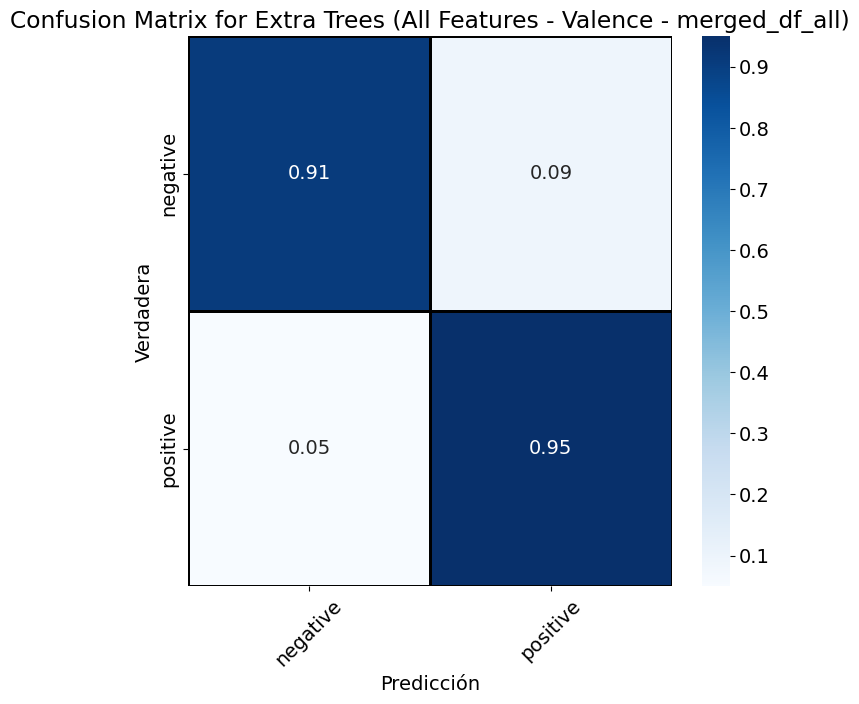

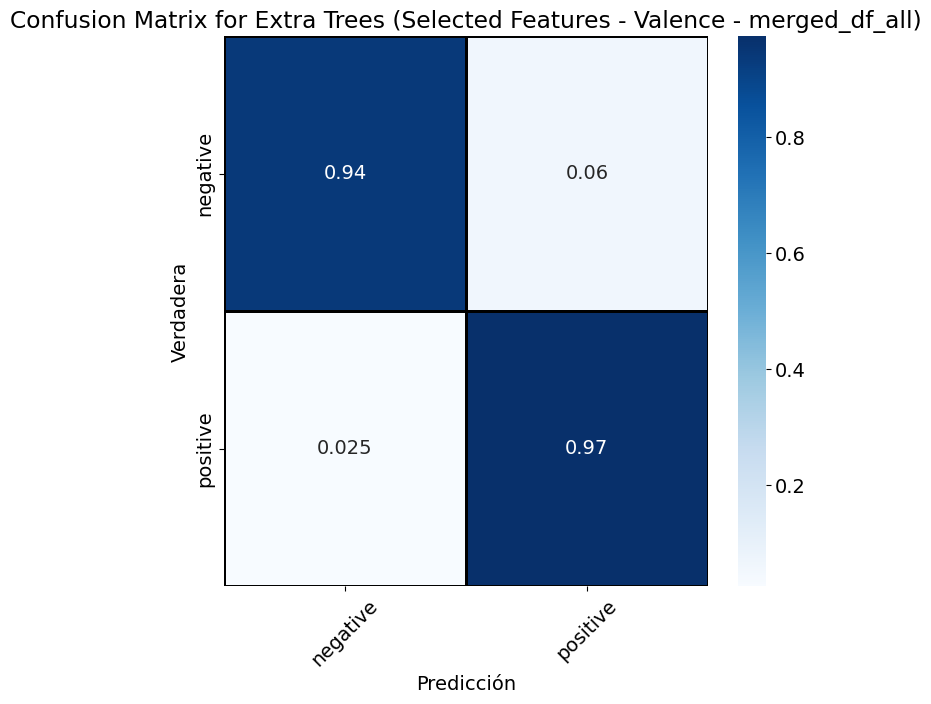

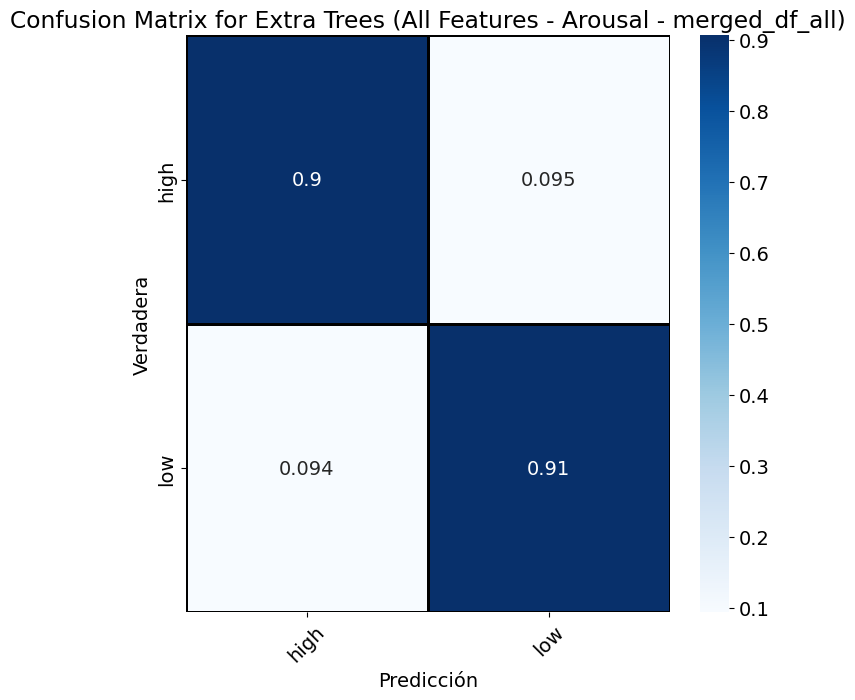

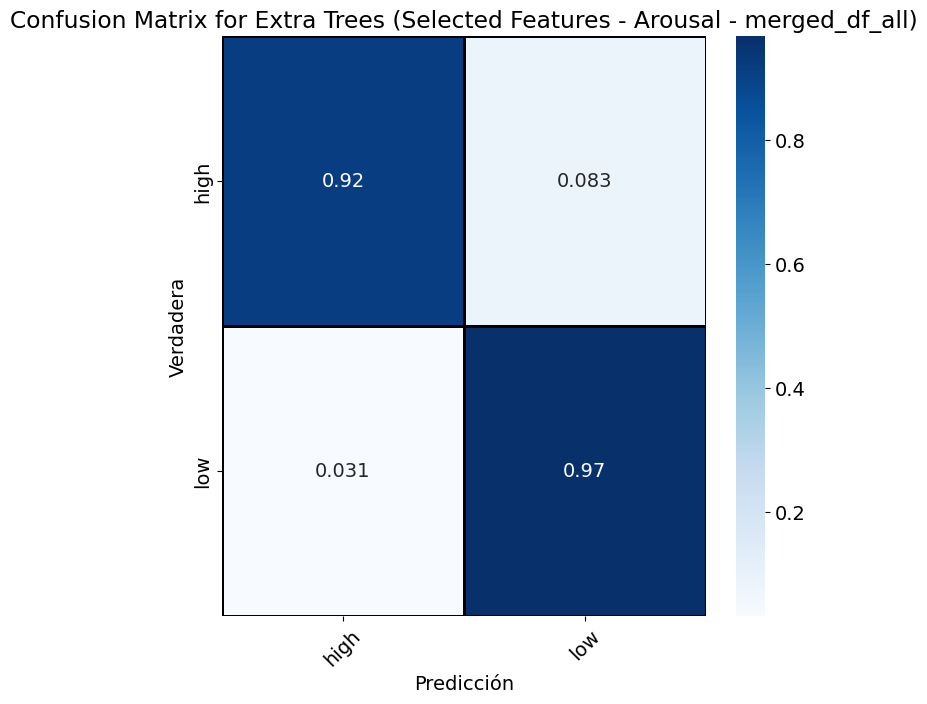

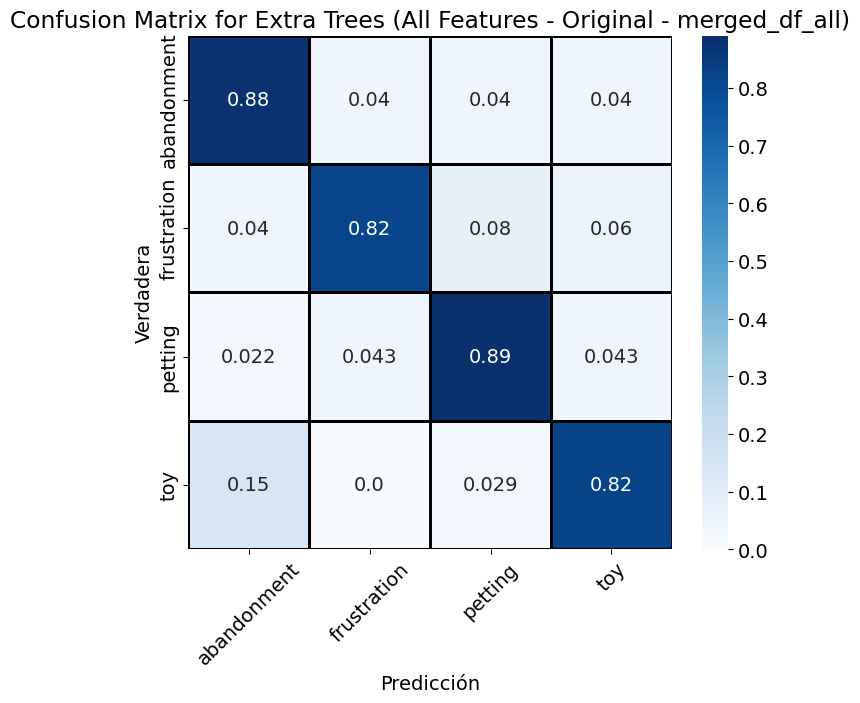

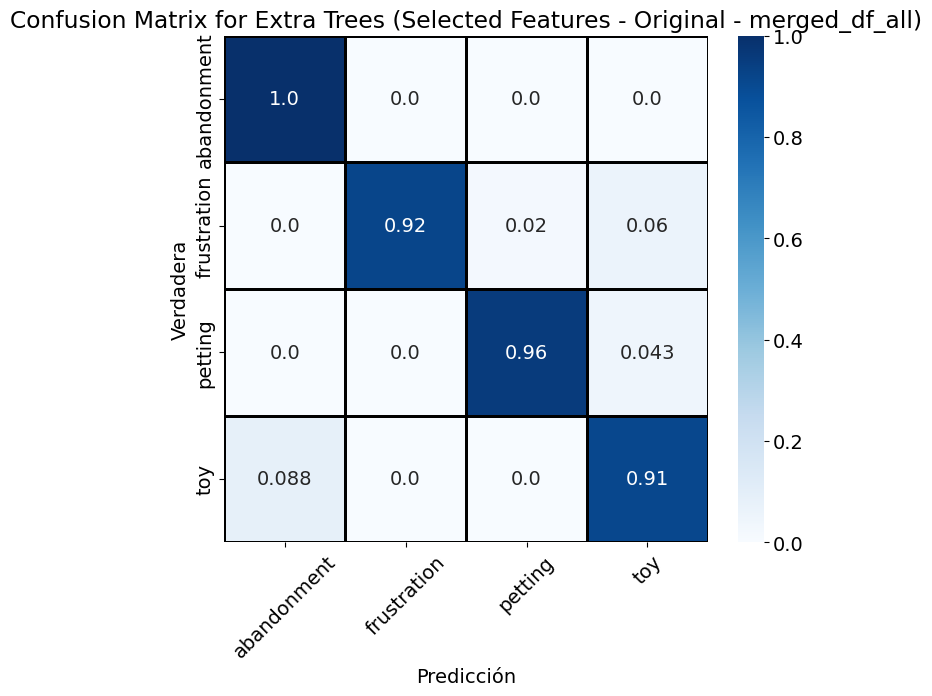

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:458: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


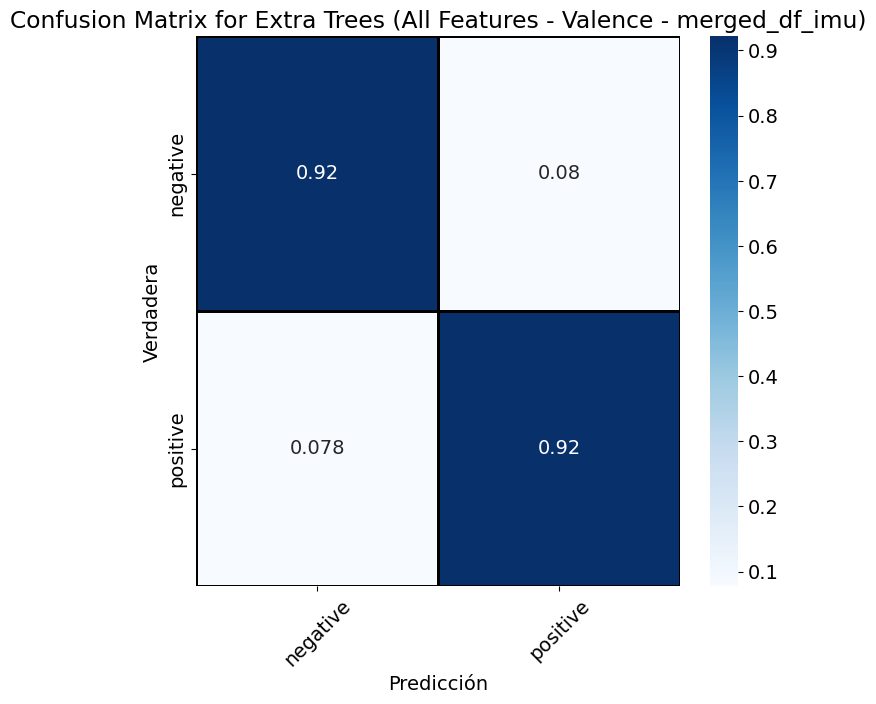

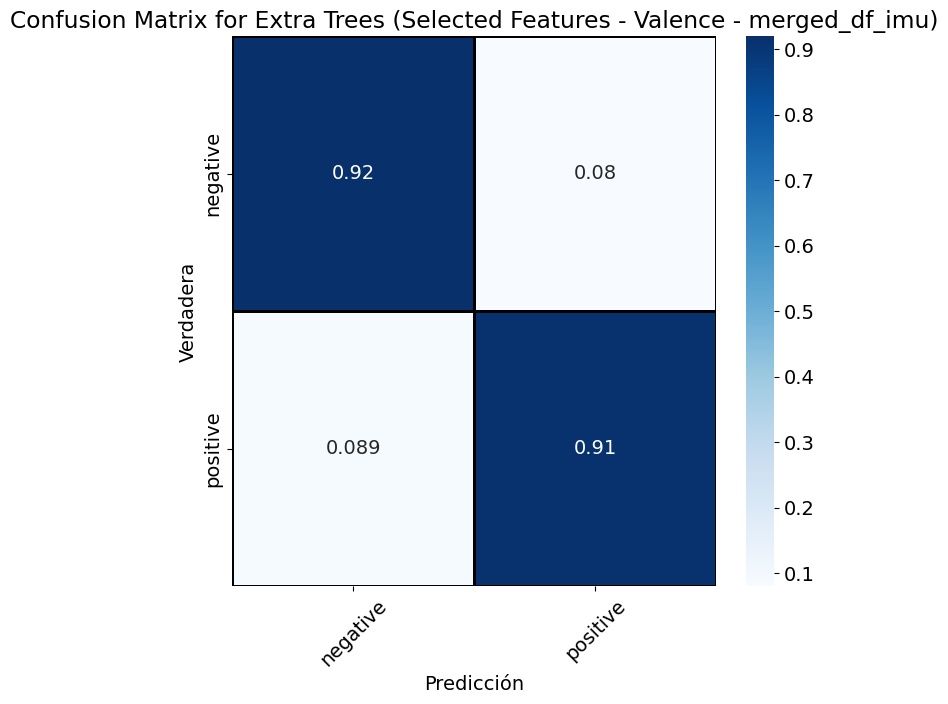

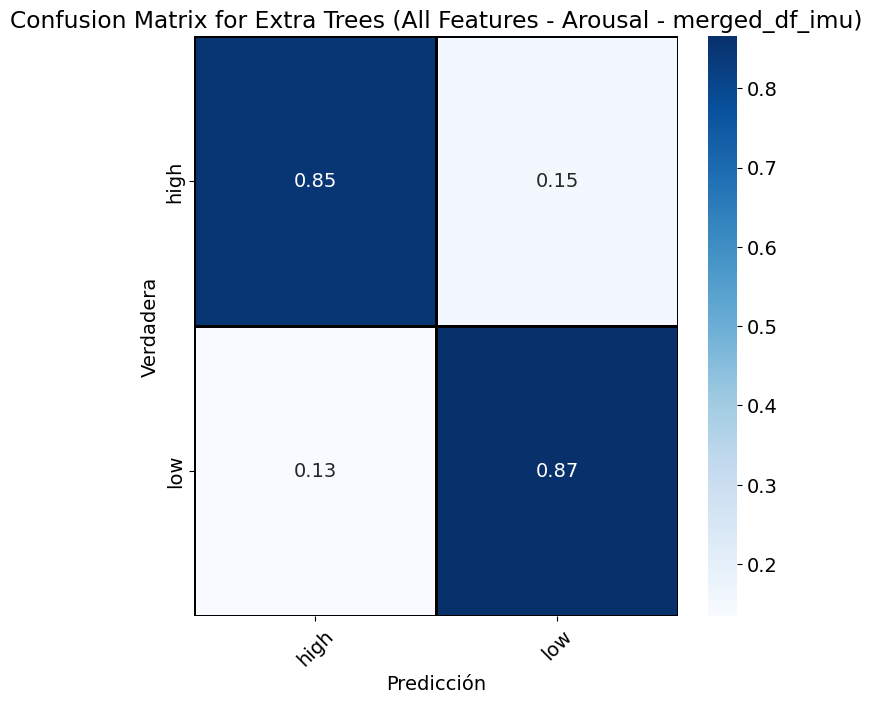

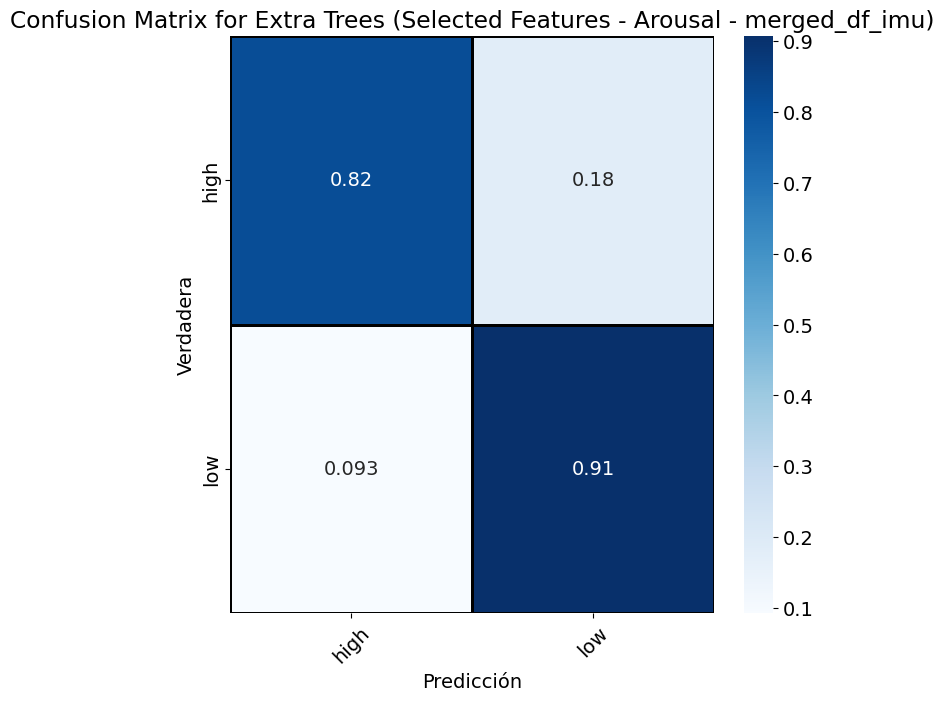

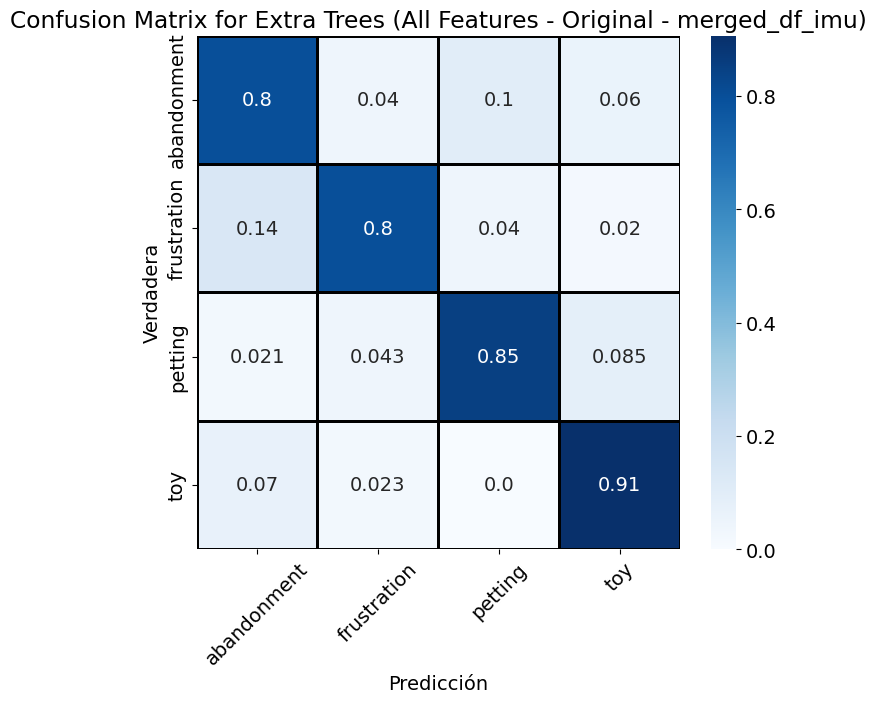

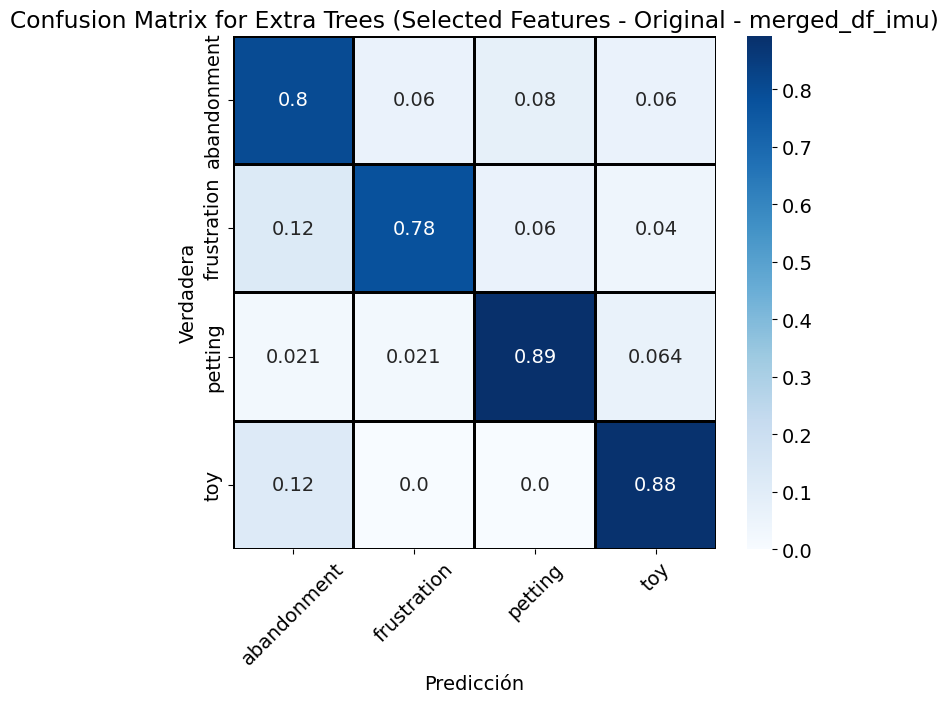

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:458: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


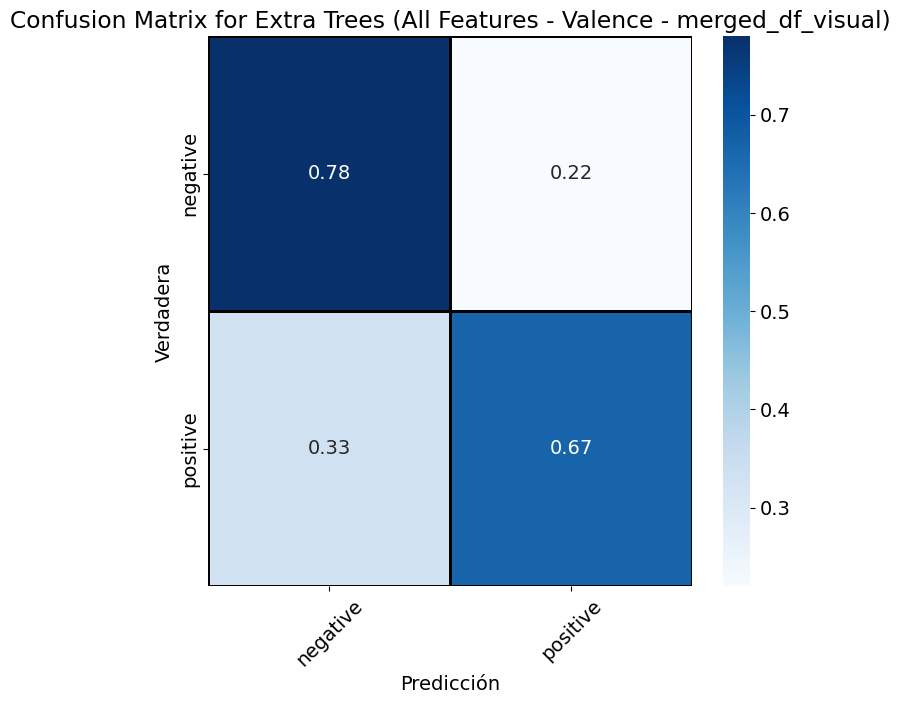

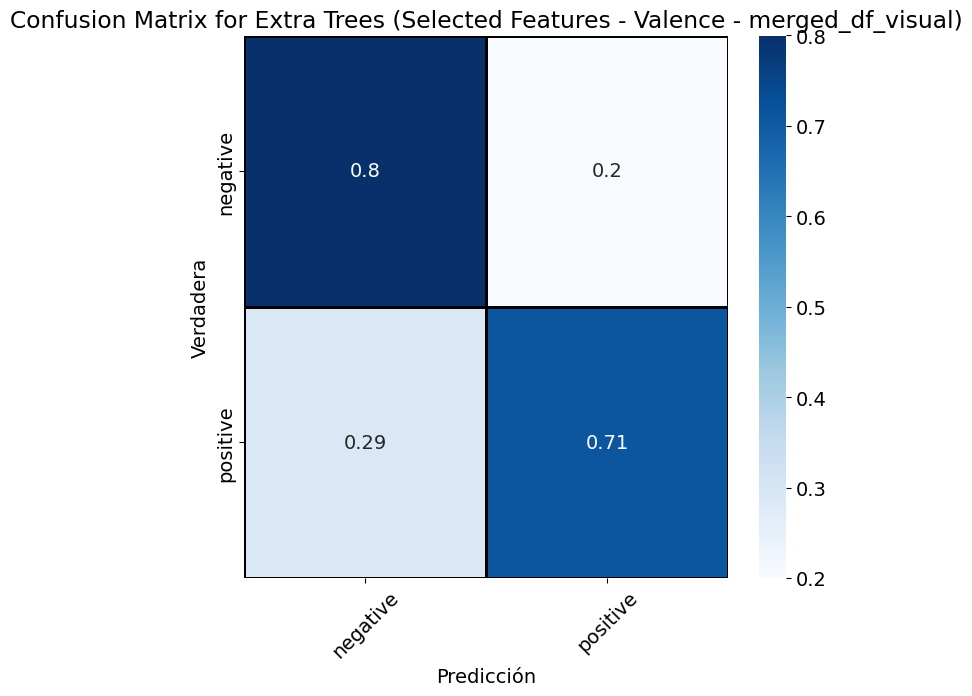

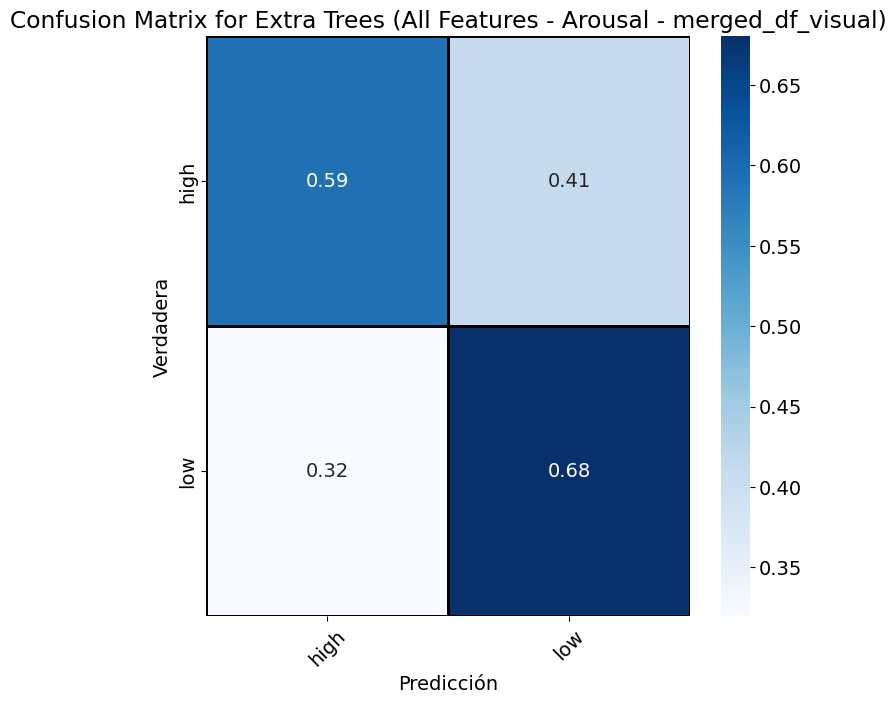

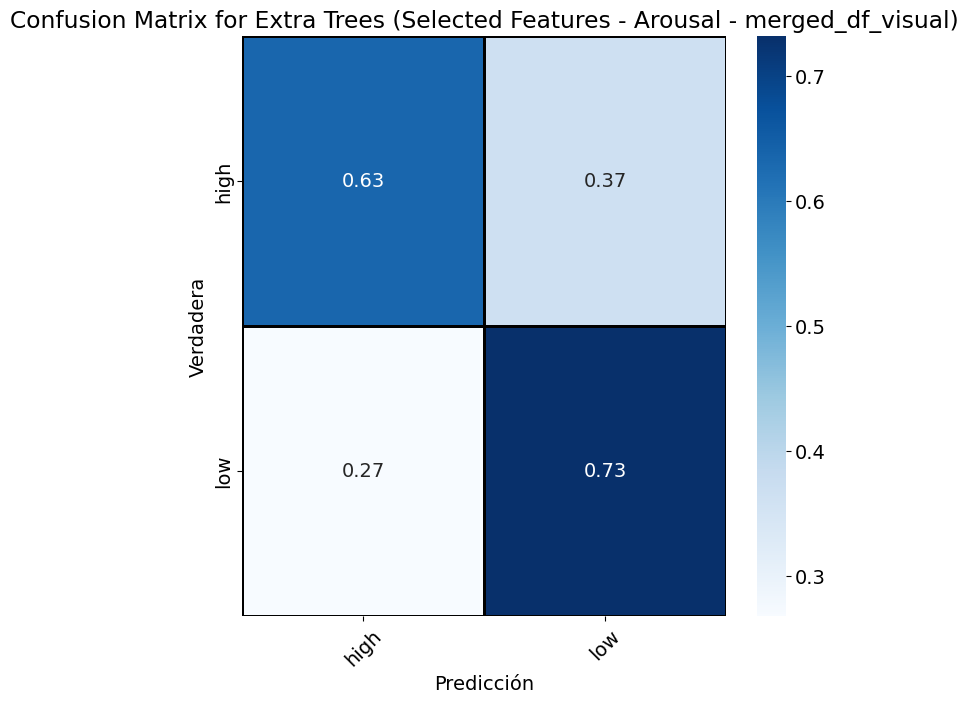

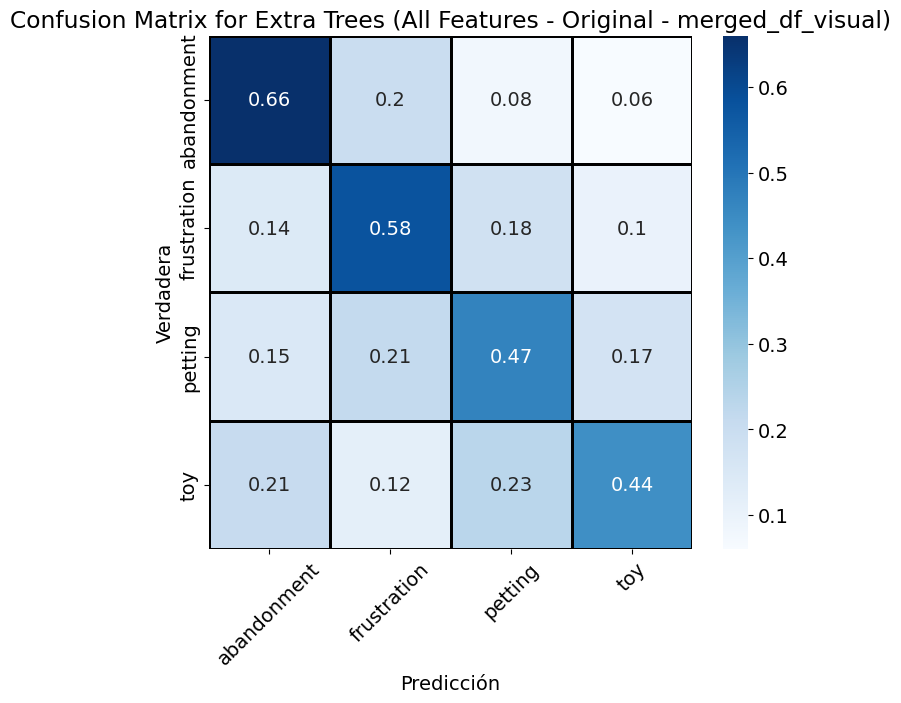

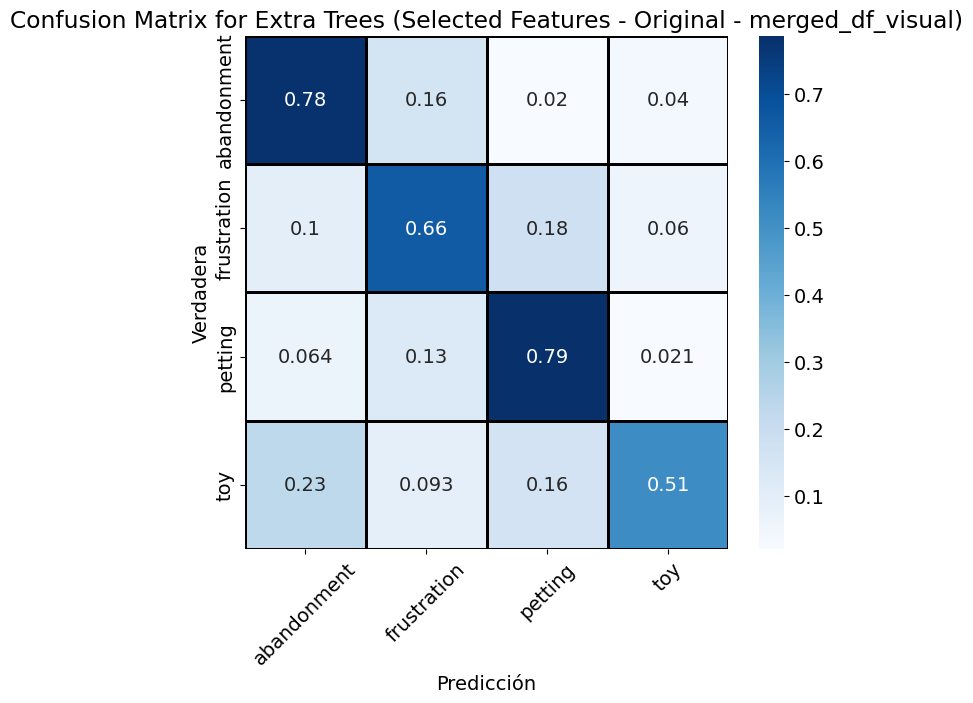

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:458: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


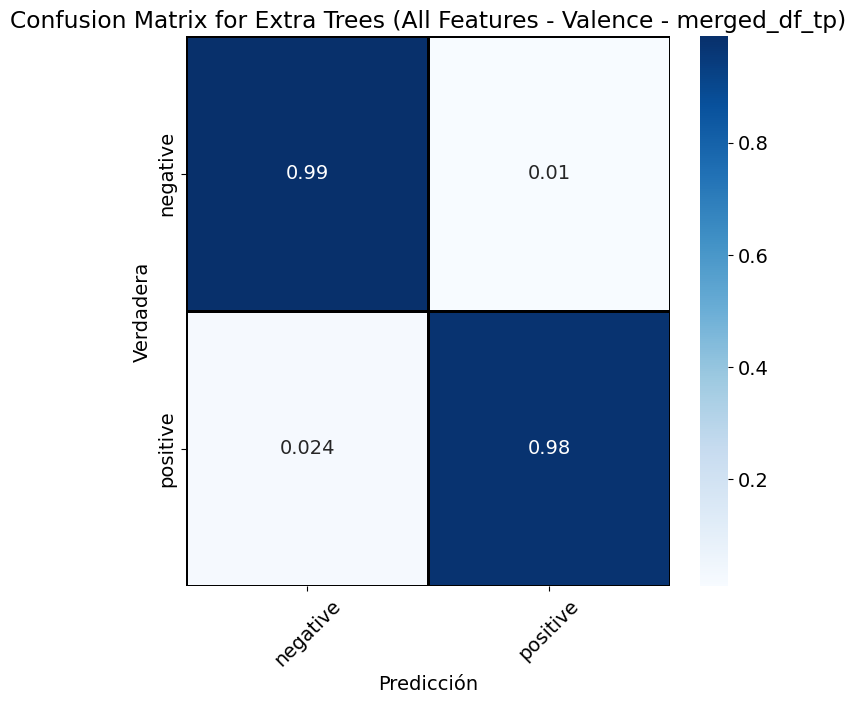

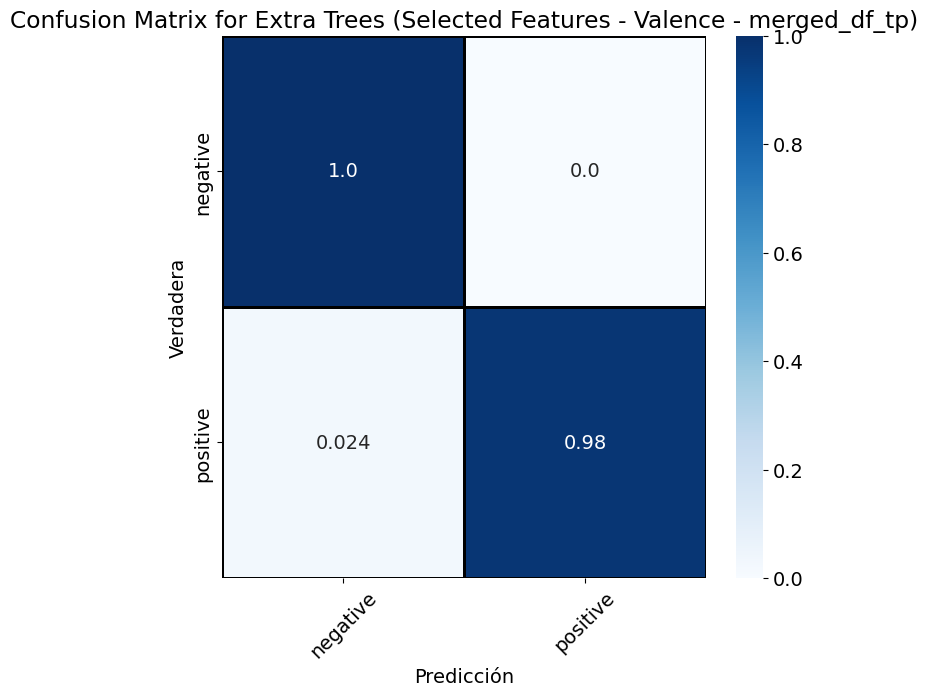

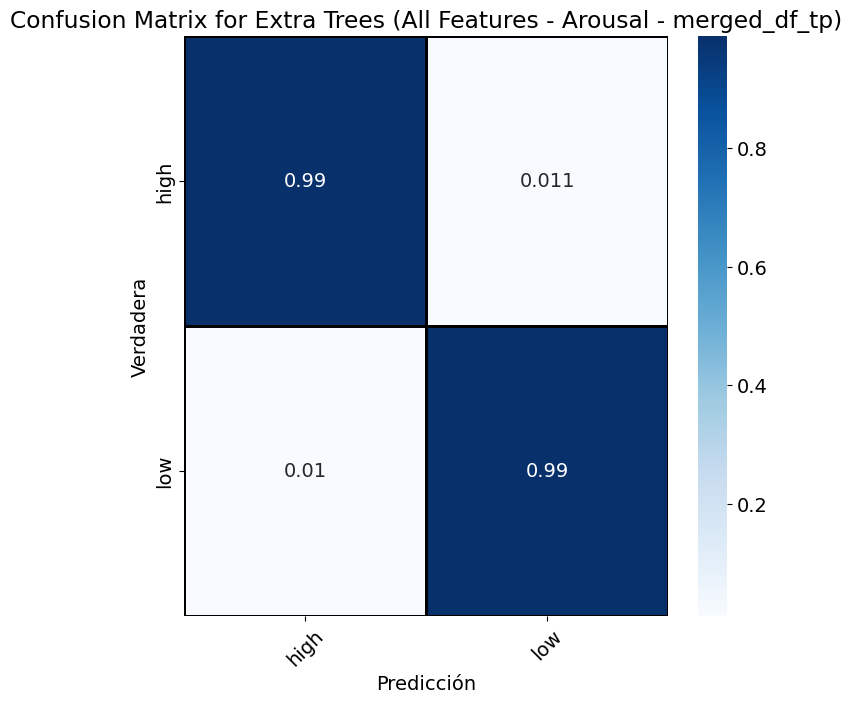

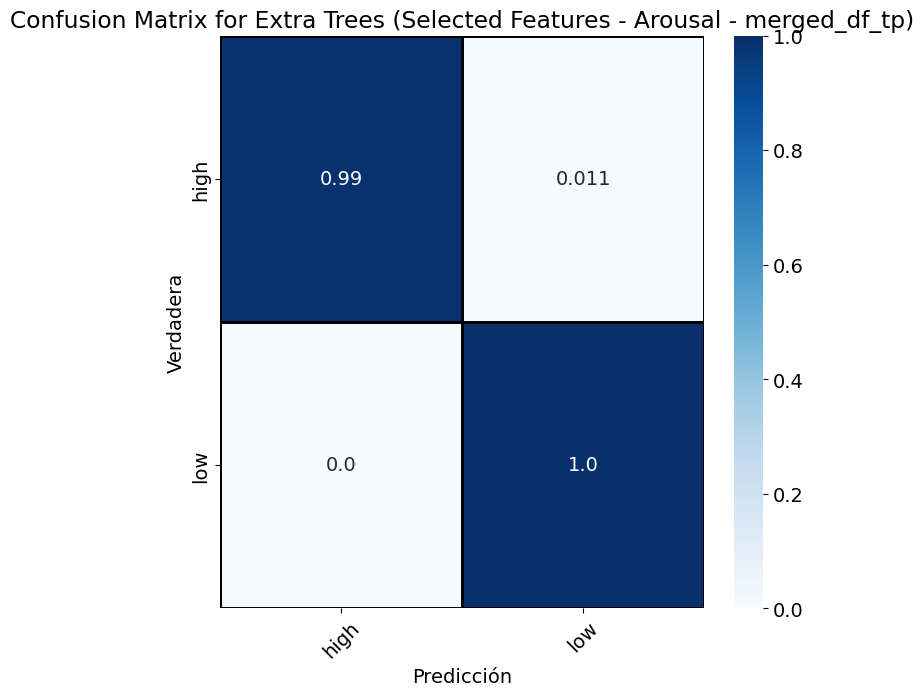

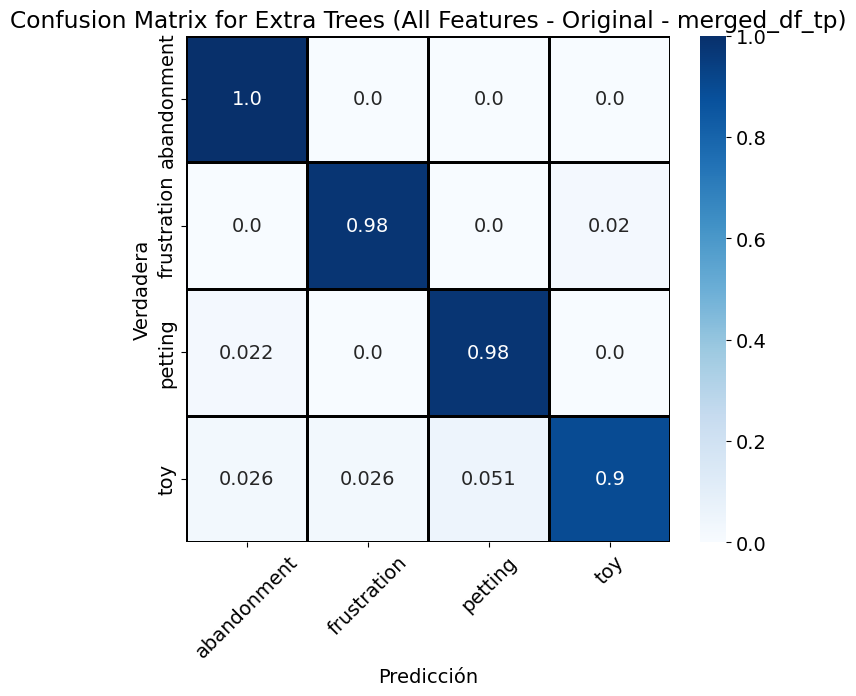

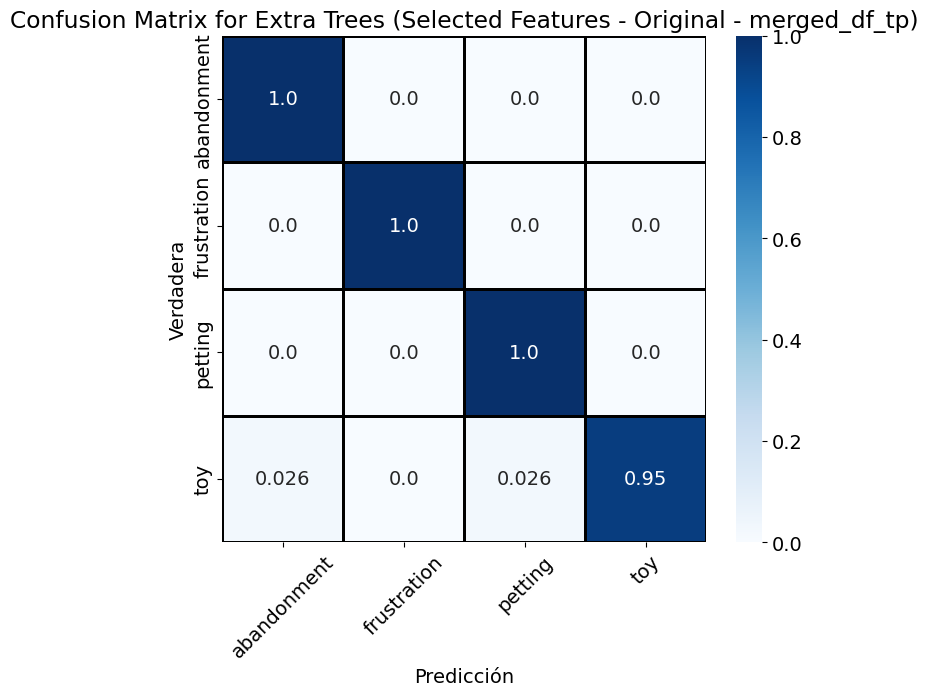

Results saved to evaluation_results.csv


In [ ]:
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

def prepare_data(features_df):
    X = features_df.drop(['Dog Name', 'StartTimestamp', 'EndTimestamp', 'Trial Name', 'has_bbox'], axis=1, errors='ignore')
    y = features_df['Trial Name']
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)

    valence_mapping = {'frustration': 'negative', 'abandonment': 'negative', 'toy': 'positive', 'petting': 'positive'}
    arousal_mapping = {'frustration': 'high', 'abandonment': 'low', 'toy': 'high', 'petting': 'low'}

    y_valence = y.map(valence_mapping)
    y_arousal = y.map(arousal_mapping)

    le_valence = LabelEncoder()
    y_valence_encoded = le_valence.fit_transform(y_valence)

    le_arousal = LabelEncoder()
    y_arousal_encoded = le_arousal.fit_transform(y_arousal)

    balanced_df = pd.DataFrame()
    classes = features_df['Trial Name'].unique()
    for c in classes:
        class_subset = features_df[features_df['Trial Name'] == c]
        if len(class_subset) > 50:
            class_subset = class_subset.sample(n=50, random_state=42)
        balanced_df = pd.concat([balanced_df, class_subset], axis=0)

    X_balanced = balanced_df.drop(['Dog Name', 'Trial Name', 'StartTimestamp', 'EndTimestamp', 'has_bbox'], axis=1, errors='ignore')
    y_balanced = balanced_df['Trial Name']
    y_balanced_encoded = le.fit_transform(y_balanced)

    y_valence_balanced = y_balanced.map(valence_mapping)
    y_arousal_balanced = y_balanced.map(arousal_mapping)

    y_valence_balanced_encoded = le_valence.fit_transform(y_valence_balanced)
    y_arousal_balanced_encoded = le_arousal.fit_transform(y_arousal_balanced)

    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X_balanced, y_balanced_encoded)
    selector = SelectFromModel(rf, threshold="1.25*mean")
    X_selected = selector.transform(X_balanced)

    return X_balanced, y_balanced_encoded, y_valence_balanced_encoded, y_arousal_balanced_encoded, le, le_valence, le_arousal, X_selected

def evaluate_models(dataframes):
    results = []

    models = {
        "Naive Bayes": GaussianNB(var_smoothing=1e-9, priors=None),
        "KNN": KNeighborsClassifier(n_neighbors=5, weights='uniform', algorithm='auto', leaf_size=30, p=2, metric='minkowski'),
        "SVM": make_pipeline(StandardScaler(), SVC(C=1.0, kernel='rbf', gamma='auto', degree=3, coef0=0.0, probability=False, shrinking=True)),
        "Decision Tree": DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, splitter='best', min_samples_leaf=1, max_features=None, random_state=None),
        "Extra Trees": ExtraTreesClassifier(n_estimators=100, criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1, random_state=None)
    }

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    def evaluate(model, X, y, y_encoded, label_encoder, feature_set, task, df_name):
        predictions = cross_val_predict(model, X, y_encoded, cv=skf)

        report = classification_report(y_encoded, predictions, output_dict=True, target_names=label_encoder.classes_)
        for label, metrics in report.items():
            if label in label_encoder.classes_:
                results.append({
                    'DataFrame': df_name,
                    'Model': model.__class__.__name__,
                    'Feature Set': feature_set,
                    'Task': task,
                    'Label': label,
                    'Precision': metrics['precision'],
                    'Recall': metrics['recall'],
                    'F1-Score': metrics['f1-score']
                })

        # If the model is Extra Trees, compute and print or save the confusion matrix
        if isinstance(model, ExtraTreesClassifier):
            cm = confusion_matrix(y_encoded, predictions)
            cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
            plt.figure(figsize=(7, 7))
            sns.heatmap(cm_percentage, annot=True, fmt='.2', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_, linewidths=1, linecolor='black')
            plt.xlabel('Predicción')
            plt.ylabel('Verdadera')
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.rcParams.update({'font.size': 14})
            plt.title(f'Confusion Matrix for Extra Trees ({feature_set} - {task} - {df_name})')
            plt.savefig(f'confusion_matrix_extra_trees_{feature_set}_{task}_{df_name}.png')
            plt.show()
    for df_name, features_df in dataframes.items():
        X_balanced, y_balanced_encoded, y_valence_balanced_encoded, y_arousal_balanced_encoded, le, le_valence, le_arousal, X_selected = prepare_data(features_df)

        for name, model in models.items():
            evaluate(model, X_balanced, y_valence_balanced_encoded, y_valence_balanced_encoded, le_valence, 'All Features', 'Valence', df_name)
            evaluate(model, X_selected, y_valence_balanced_encoded, y_valence_balanced_encoded, le_valence, 'Selected Features', 'Valence', df_name)
            evaluate(model, X_balanced, y_arousal_balanced_encoded, y_arousal_balanced_encoded, le_arousal, 'All Features', 'Arousal', df_name)
            evaluate(model, X_selected, y_arousal_balanced_encoded, y_arousal_balanced_encoded, le_arousal, 'Selected Features', 'Arousal', df_name)
            evaluate(model, X_balanced, y_balanced_encoded, y_balanced_encoded, le, 'All Features', 'Original', df_name)
            evaluate(model, X_selected, y_balanced_encoded, y_balanced_encoded, le, 'Selected Features', 'Original', df_name)

    results_df = pd.DataFrame(results)
    results_df.to_csv('evaluation_results.csv', index=False)
    print("Results saved to evaluation_results.csv")

# Create a dictionary of the dataframes with names
dataframes = {
    'merged_df_all': merged_df_all,
    'merged_df_imu': merged_df_imu,
    'merged_df_visual': merged_df_visual,
    'merged_df_tp': merged_df_tp
}

# Run the evaluation
evaluate_models(dataframes)


Evaluating model: Naive Bayes for valence
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

    negative       0.79      0.73      0.76       100
    positive       0.69      0.76      0.73        80

    accuracy                           0.74       180
   macro avg       0.74      0.75      0.74       180
weighted avg       0.75      0.74      0.75       180

Confusion Matrix:
[[0.73   0.27  ]
 [0.2375 0.7625]]




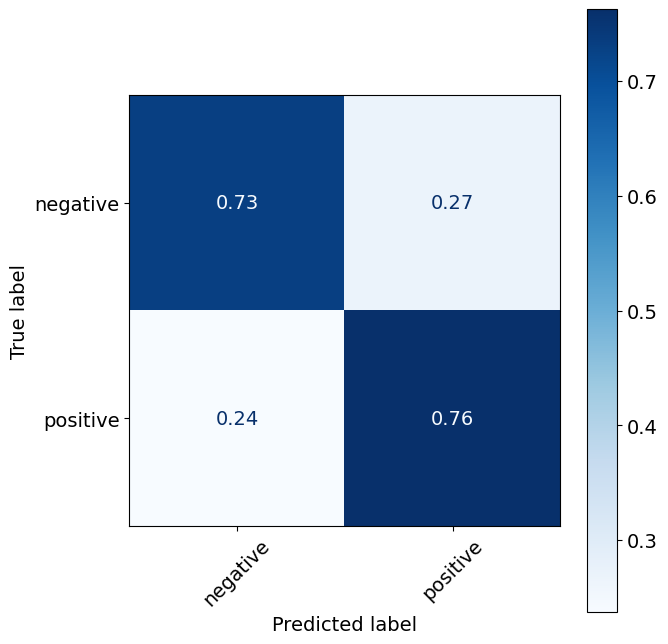

Evaluating model: Naive Bayes for arousal
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

        high       0.77      0.60      0.67        84
         low       0.70      0.84      0.77        96

    accuracy                           0.73       180
   macro avg       0.74      0.72      0.72       180
weighted avg       0.73      0.73      0.72       180

Confusion Matrix:
[[0.5952381 0.4047619]
 [0.15625   0.84375  ]]




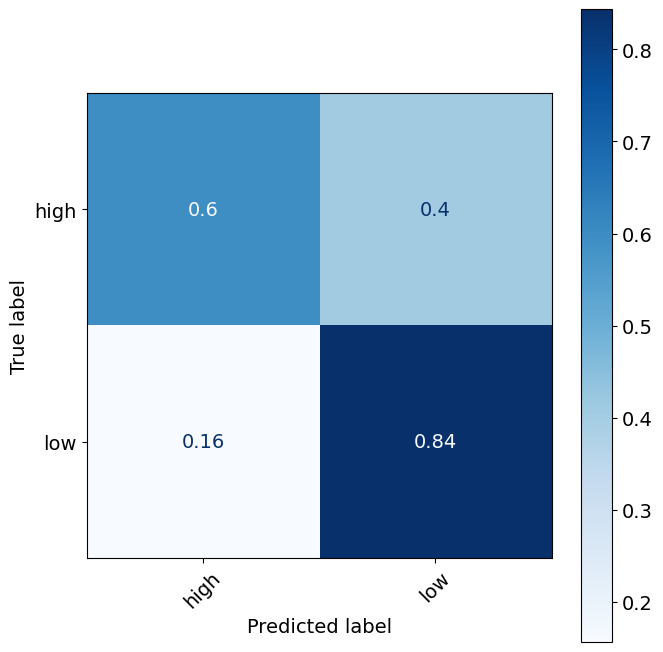

Evaluating model: Naive Bayes for original classes
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.52      0.78      0.62        50
 frustration       0.75      0.18      0.29        50
     petting       0.76      0.76      0.76        46
         toy       0.62      0.85      0.72        34

    accuracy                           0.62       180
   macro avg       0.66      0.64      0.60       180
weighted avg       0.66      0.62      0.58       180

Confusion Matrix:
[[0.78       0.04       0.06       0.12      ]
 [0.52       0.18       0.14       0.16      ]
 [0.13043478 0.02173913 0.76086957 0.08695652]
 [0.11764706 0.         0.02941176 0.85294118]]




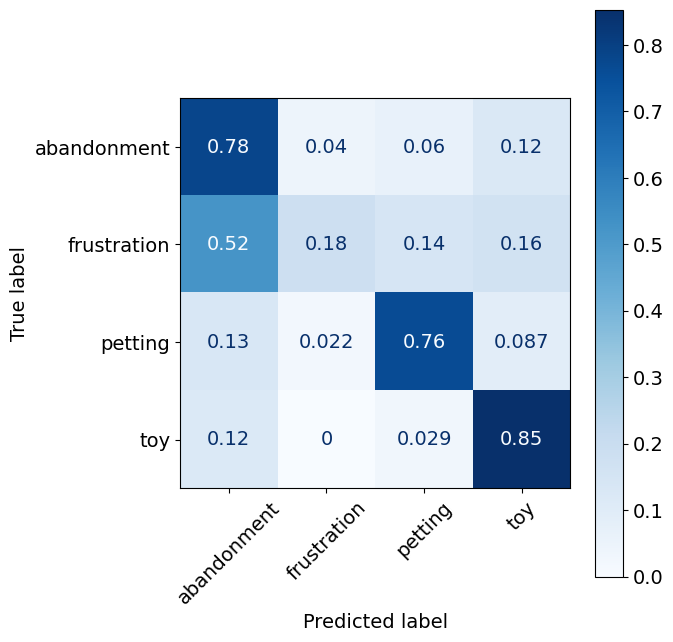

Evaluating model: KNN for valence
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.80      0.82      0.81       100
    positive       0.77      0.75      0.76        80

    accuracy                           0.79       180
   macro avg       0.79      0.78      0.79       180
weighted avg       0.79      0.79      0.79       180

Confusion Matrix:
[[0.82 0.18]
 [0.25 0.75]]




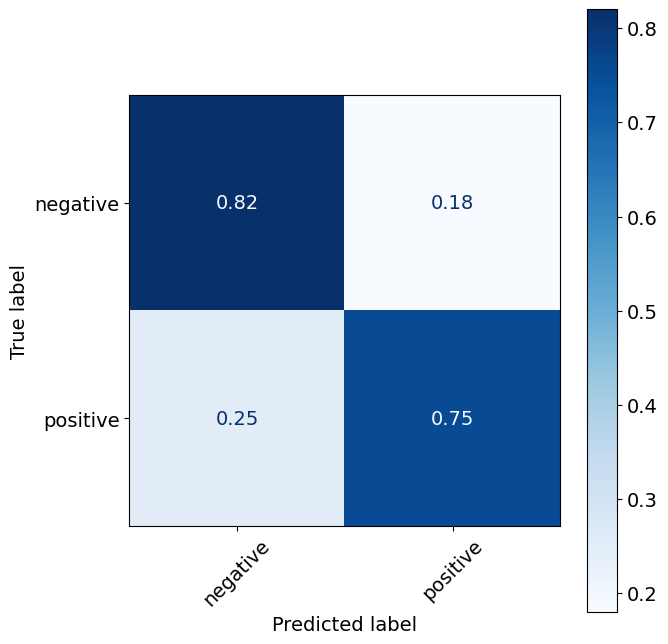

Evaluating model: KNN for arousal
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.77      0.71      0.74        84
         low       0.76      0.81      0.79        96

    accuracy                           0.77       180
   macro avg       0.77      0.76      0.76       180
weighted avg       0.77      0.77      0.77       180

Confusion Matrix:
[[0.71428571 0.28571429]
 [0.1875     0.8125    ]]




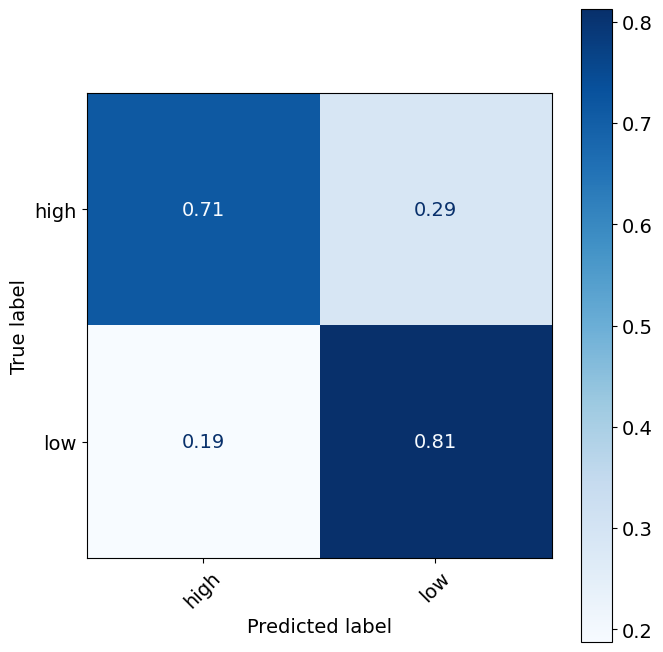

Evaluating model: KNN for original classes
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.65      0.72      0.69        50
 frustration       0.64      0.60      0.62        50
     petting       0.60      0.65      0.63        46
         toy       0.71      0.59      0.65        34

    accuracy                           0.64       180
   macro avg       0.65      0.64      0.64       180
weighted avg       0.65      0.64      0.64       180

Confusion Matrix:
[[0.72       0.1        0.16       0.02      ]
 [0.18       0.6        0.18       0.04      ]
 [0.04347826 0.19565217 0.65217391 0.10869565]
 [0.23529412 0.08823529 0.08823529 0.58823529]]




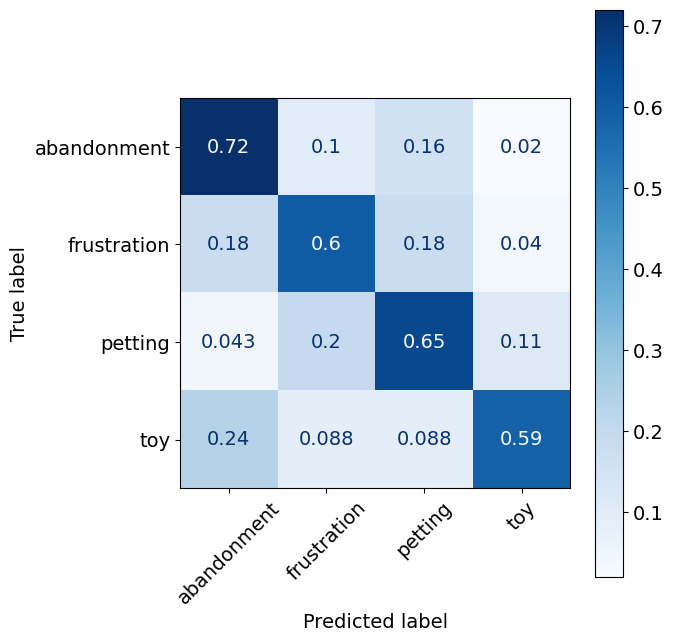

Evaluating model: SVM for valence
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.85      0.86       100
    positive       0.82      0.85      0.83        80

    accuracy                           0.85       180
   macro avg       0.85      0.85      0.85       180
weighted avg       0.85      0.85      0.85       180

Confusion Matrix:
[[0.85 0.15]
 [0.15 0.85]]




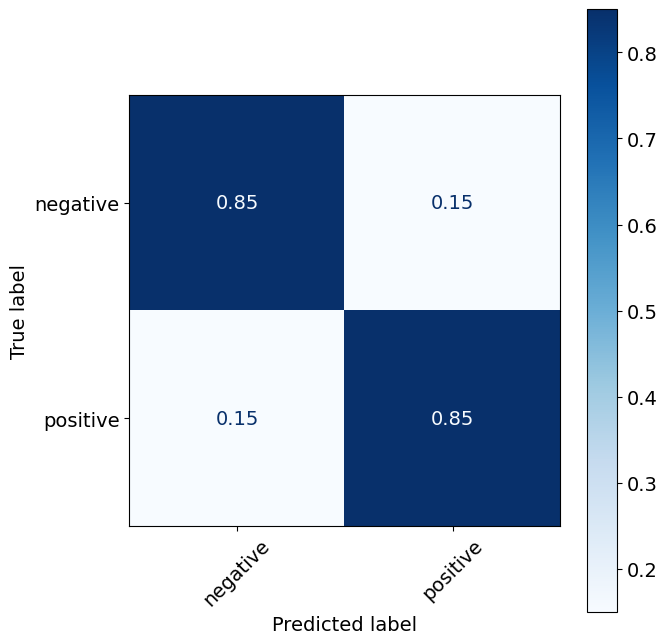

Evaluating model: SVM for arousal
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

        high       0.74      0.70      0.72        84
         low       0.75      0.78      0.77        96

    accuracy                           0.74       180
   macro avg       0.74      0.74      0.74       180
weighted avg       0.74      0.74      0.74       180

Confusion Matrix:
[[0.70238095 0.29761905]
 [0.21875    0.78125   ]]




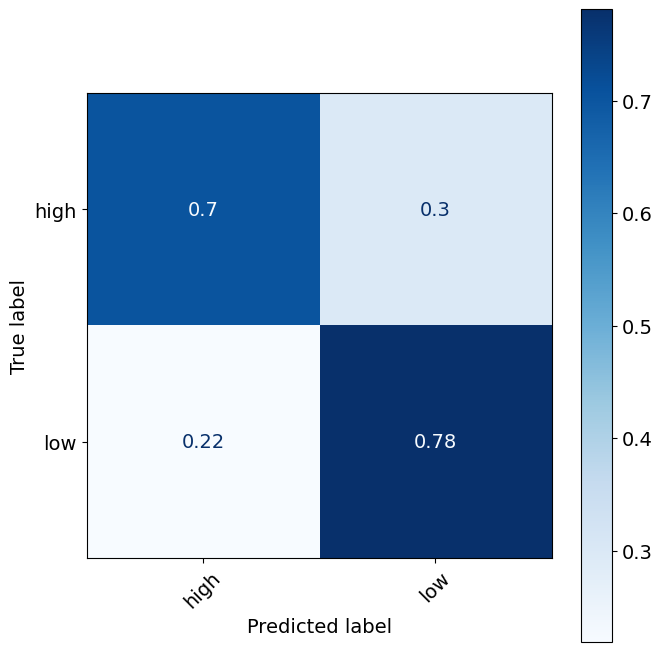

Evaluating model: SVM for original classes
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.67      0.70      0.69        50
 frustration       0.59      0.48      0.53        50
     petting       0.83      0.83      0.83        46
         toy       0.66      0.79      0.72        34

    accuracy                           0.69       180
   macro avg       0.69      0.70      0.69       180
weighted avg       0.69      0.69      0.68       180

Confusion Matrix:
[[0.7        0.22       0.02       0.06      ]
 [0.26       0.48       0.12       0.14      ]
 [0.04347826 0.04347826 0.82608696 0.08695652]
 [0.05882353 0.11764706 0.02941176 0.79411765]]




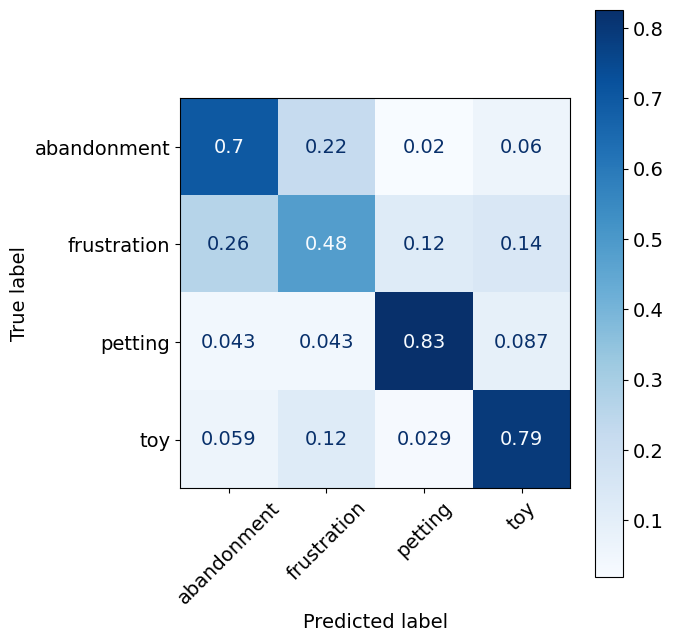

Evaluating model: Decision Tree for valence
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.81      0.83      0.82       100
    positive       0.78      0.76      0.77        80

    accuracy                           0.80       180
   macro avg       0.80      0.80      0.80       180
weighted avg       0.80      0.80      0.80       180

Confusion Matrix:
[[0.83   0.17  ]
 [0.2375 0.7625]]




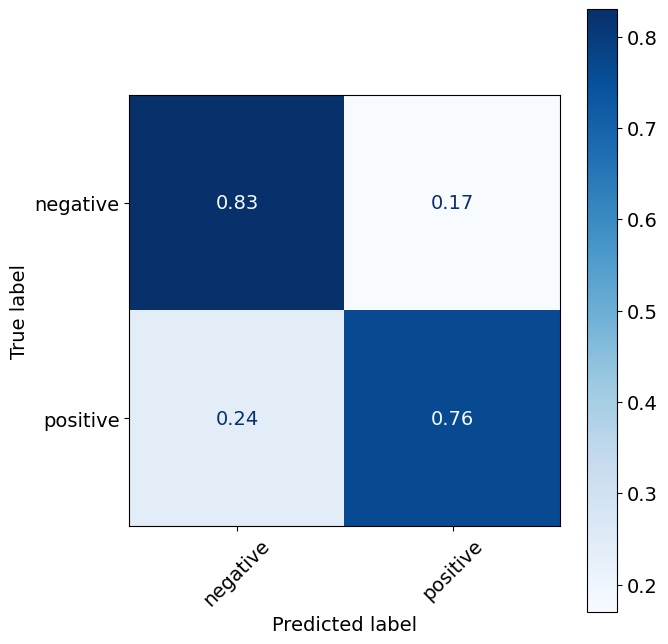

Evaluating model: Decision Tree for arousal
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.78      0.82      0.80        84
         low       0.84      0.79      0.81        96

    accuracy                           0.81       180
   macro avg       0.81      0.81      0.81       180
weighted avg       0.81      0.81      0.81       180

Confusion Matrix:
[[0.82142857 0.17857143]
 [0.20833333 0.79166667]]




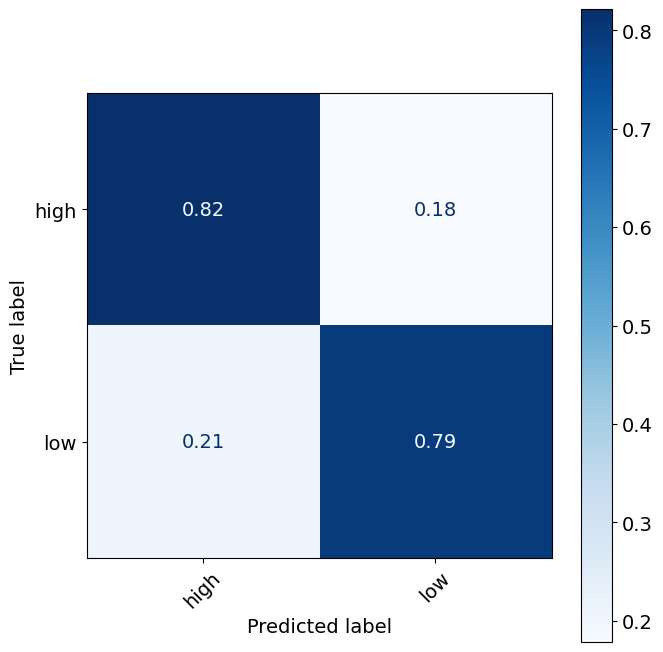

Evaluating model: Decision Tree for original classes
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.64      0.78      0.70        50
 frustration       0.70      0.62      0.66        50
     petting       0.88      0.76      0.81        46
         toy       0.60      0.62      0.61        34

    accuracy                           0.70       180
   macro avg       0.70      0.69      0.70       180
weighted avg       0.71      0.70      0.70       180

Confusion Matrix:
[[0.78       0.12       0.         0.1       ]
 [0.22       0.62       0.06       0.1       ]
 [0.10869565 0.04347826 0.76086957 0.08695652]
 [0.17647059 0.14705882 0.05882353 0.61764706]]




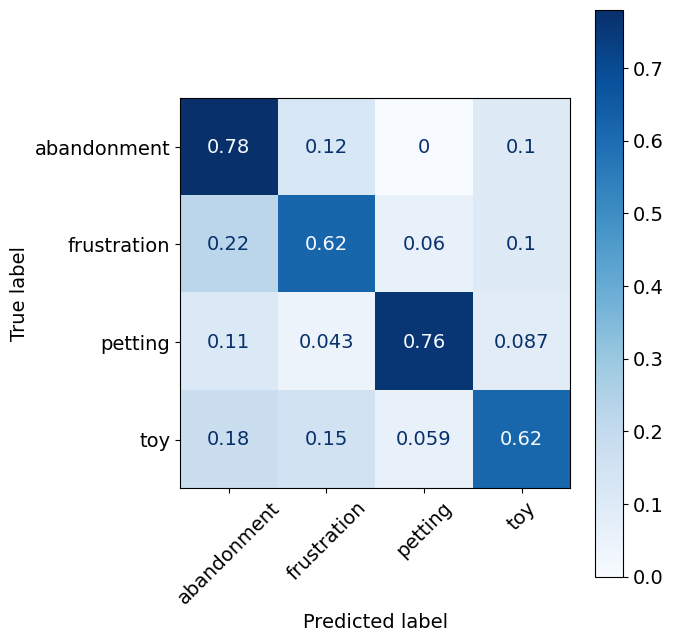

Evaluating model: Extra Trees for valence
Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.94      0.91      0.92       100
    positive       0.89      0.93      0.91        80

    accuracy                           0.92       180
   macro avg       0.91      0.92      0.92       180
weighted avg       0.92      0.92      0.92       180

Confusion Matrix:
[[0.91  0.09 ]
 [0.075 0.925]]




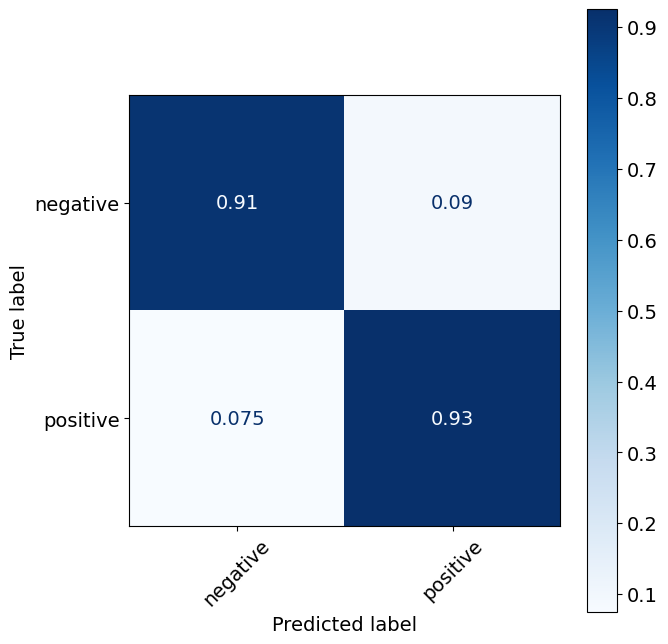

Evaluating model: Extra Trees for arousal
Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.91      0.92      0.91        84
         low       0.93      0.92      0.92        96

    accuracy                           0.92       180
   macro avg       0.92      0.92      0.92       180
weighted avg       0.92      0.92      0.92       180

Confusion Matrix:
[[0.91666667 0.08333333]
 [0.08333333 0.91666667]]




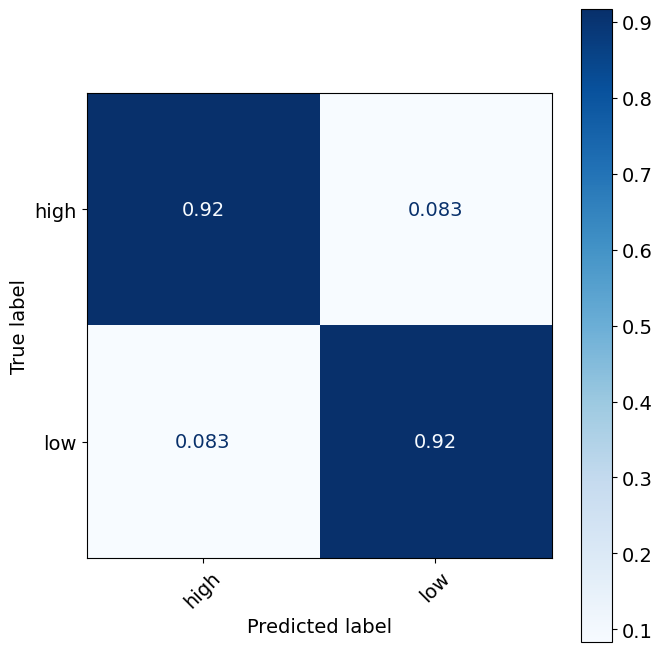

Evaluating model: Extra Trees for original classes
Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.81      0.86      0.83        50
 frustration       0.91      0.82      0.86        50
     petting       0.87      0.85      0.86        46
         toy       0.78      0.85      0.82        34

    accuracy                           0.84       180
   macro avg       0.84      0.85      0.84       180
weighted avg       0.85      0.84      0.85       180

Confusion Matrix:
[[0.86       0.06       0.04       0.04      ]
 [0.06       0.82       0.08       0.04      ]
 [0.04347826 0.02173913 0.84782609 0.08695652]
 [0.14705882 0.         0.         0.85294118]]




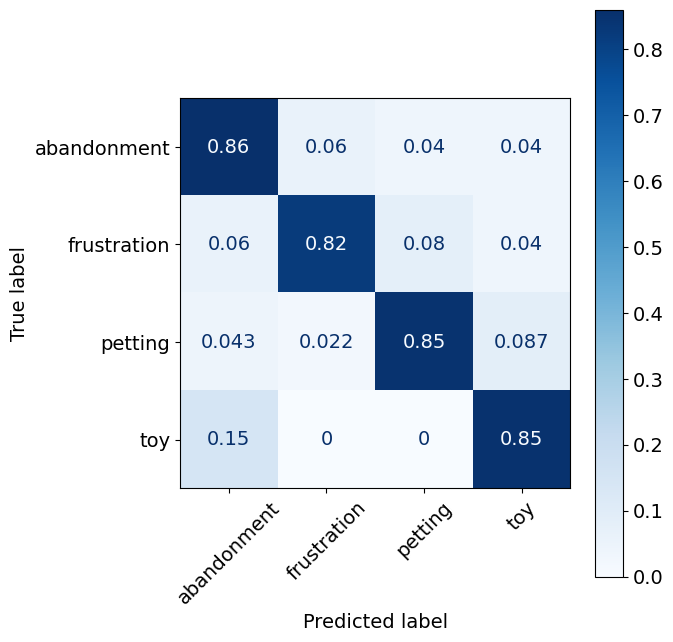

In [ ]:
evaluate_models_matrix(merged_df_all)

Evaluating model: Naive Bayes for valence
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

    negative       0.74      0.70      0.72       100
    positive       0.68      0.72      0.70        90

    accuracy                           0.71       190
   macro avg       0.71      0.71      0.71       190
weighted avg       0.71      0.71      0.71       190

Confusion Matrix:
[[0.7        0.3       ]
 [0.27777778 0.72222222]]




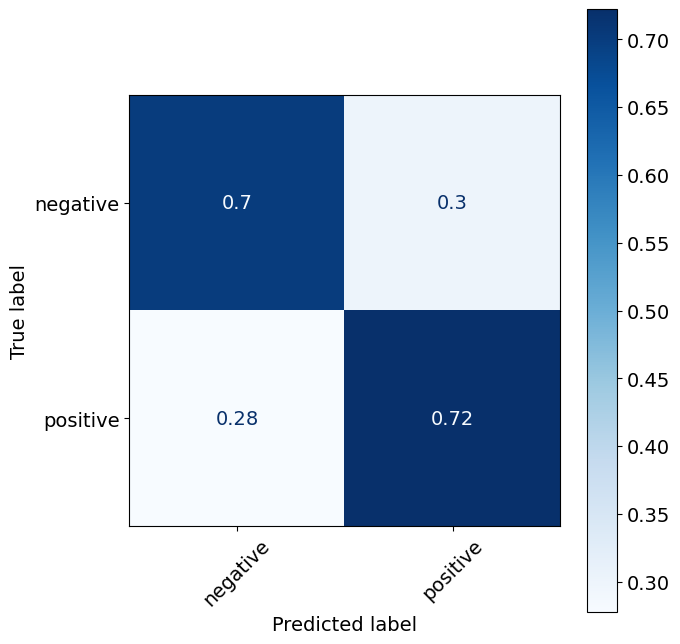

Evaluating model: Naive Bayes for arousal
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

        high       0.73      0.44      0.55        93
         low       0.61      0.85      0.71        97

    accuracy                           0.65       190
   macro avg       0.67      0.64      0.63       190
weighted avg       0.67      0.65      0.63       190

Confusion Matrix:
[[0.44086022 0.55913978]
 [0.15463918 0.84536082]]




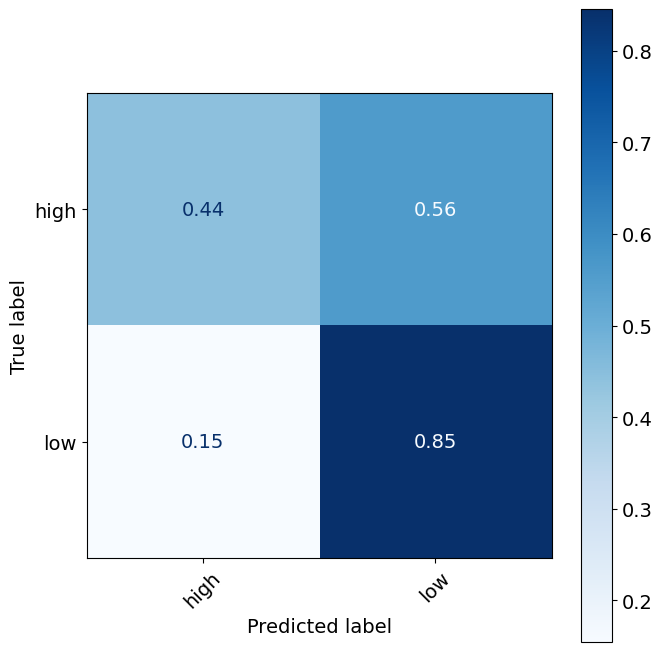

Evaluating model: Naive Bayes for original classes
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.50      0.68      0.58        50
 frustration       0.77      0.20      0.32        50
     petting       0.60      0.74      0.67        47
         toy       0.65      0.77      0.70        43

    accuracy                           0.59       190
   macro avg       0.63      0.60      0.57       190
weighted avg       0.63      0.59      0.56       190

Confusion Matrix:
[[0.68       0.04       0.12       0.16      ]
 [0.46       0.2        0.22       0.12      ]
 [0.14893617 0.0212766  0.74468085 0.08510638]
 [0.09302326 0.         0.13953488 0.76744186]]




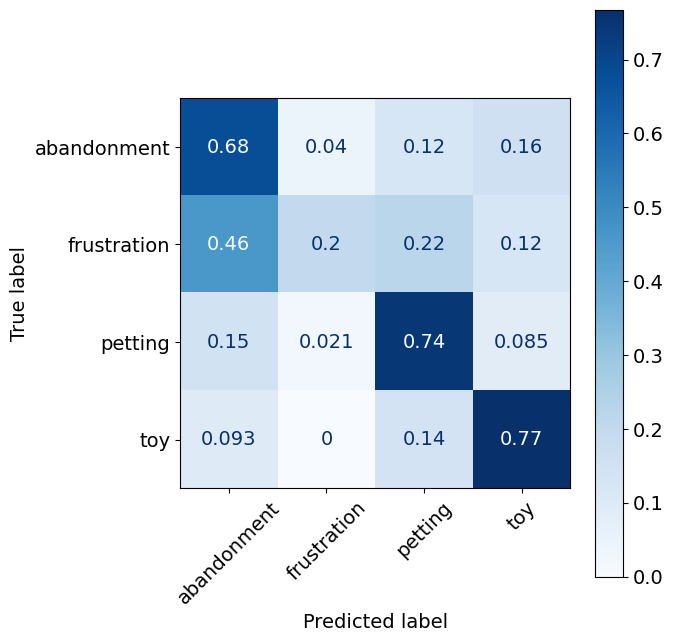

Evaluating model: KNN for valence
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.83      0.82      0.82       100
    positive       0.80      0.81      0.81        90

    accuracy                           0.82       190
   macro avg       0.82      0.82      0.82       190
weighted avg       0.82      0.82      0.82       190

Confusion Matrix:
[[0.82       0.18      ]
 [0.18888889 0.81111111]]




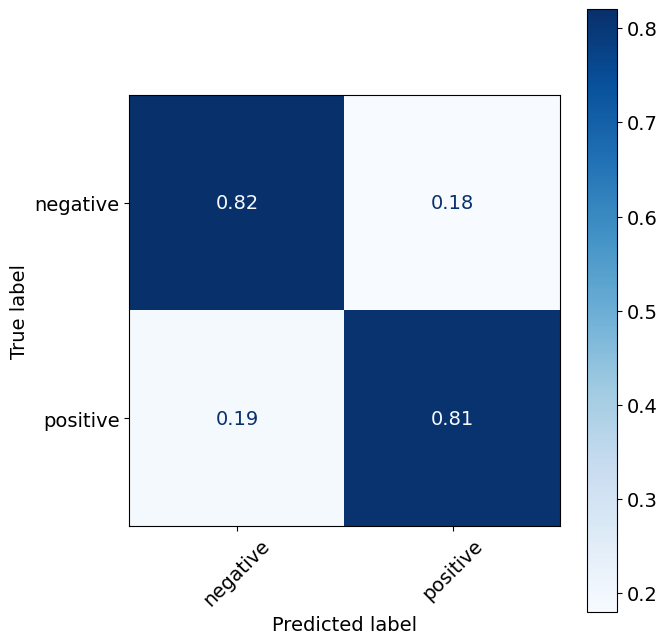

Evaluating model: KNN for arousal
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.67      0.68      0.67        93
         low       0.69      0.68      0.68        97

    accuracy                           0.68       190
   macro avg       0.68      0.68      0.68       190
weighted avg       0.68      0.68      0.68       190

Confusion Matrix:
[[0.67741935 0.32258065]
 [0.31958763 0.68041237]]




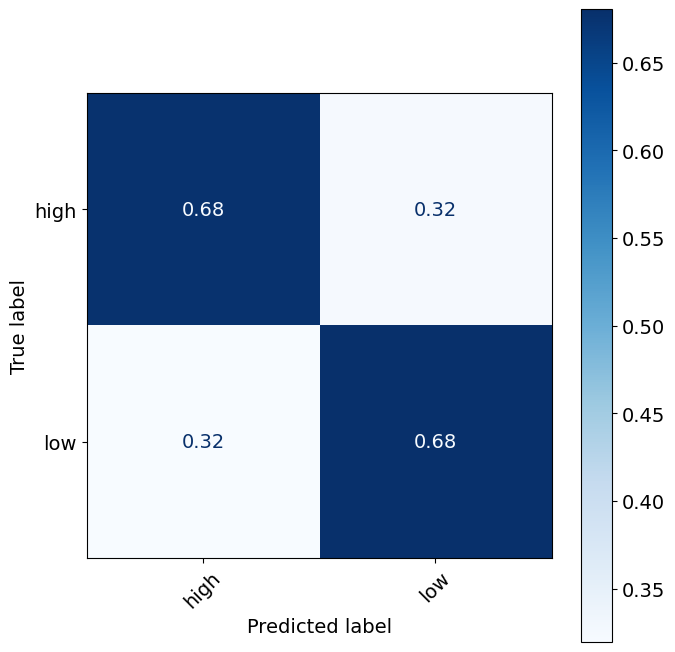

Evaluating model: KNN for original classes
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.54      0.56      0.55        50
 frustration       0.62      0.64      0.63        50
     petting       0.70      0.68      0.69        47
         toy       0.68      0.63      0.65        43

    accuracy                           0.63       190
   macro avg       0.63      0.63      0.63       190
weighted avg       0.63      0.63      0.63       190

Confusion Matrix:
[[0.56       0.26       0.08       0.1       ]
 [0.2        0.64       0.12       0.04      ]
 [0.08510638 0.10638298 0.68085106 0.12765957]
 [0.23255814 0.04651163 0.09302326 0.62790698]]




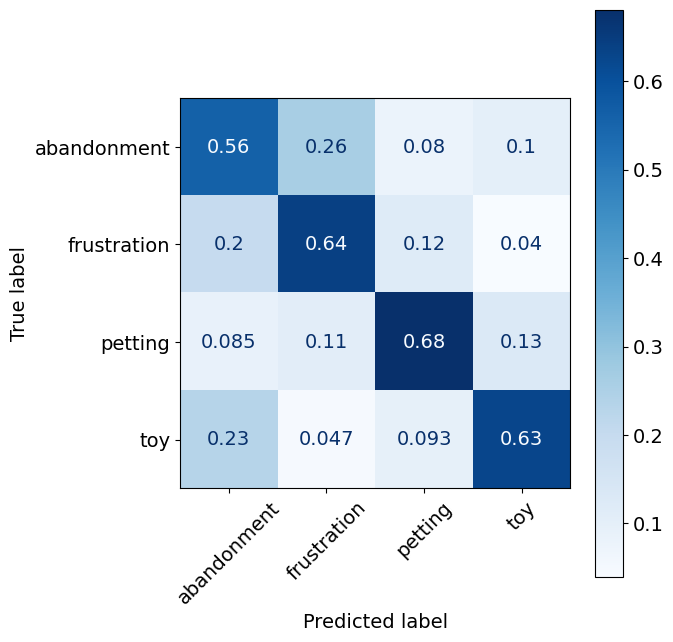

Evaluating model: SVM for valence
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

    negative       0.94      0.88      0.91       100
    positive       0.88      0.93      0.90        90

    accuracy                           0.91       190
   macro avg       0.91      0.91      0.91       190
weighted avg       0.91      0.91      0.91       190

Confusion Matrix:
[[0.88       0.12      ]
 [0.06666667 0.93333333]]




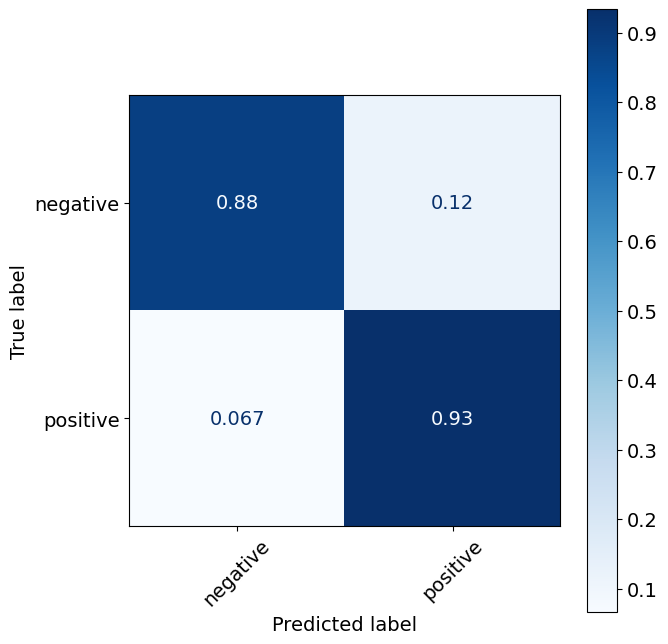

Evaluating model: SVM for arousal
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

        high       0.79      0.69      0.74        93
         low       0.73      0.82      0.78        97

    accuracy                           0.76       190
   macro avg       0.76      0.76      0.76       190
weighted avg       0.76      0.76      0.76       190

Confusion Matrix:
[[0.68817204 0.31182796]
 [0.17525773 0.82474227]]




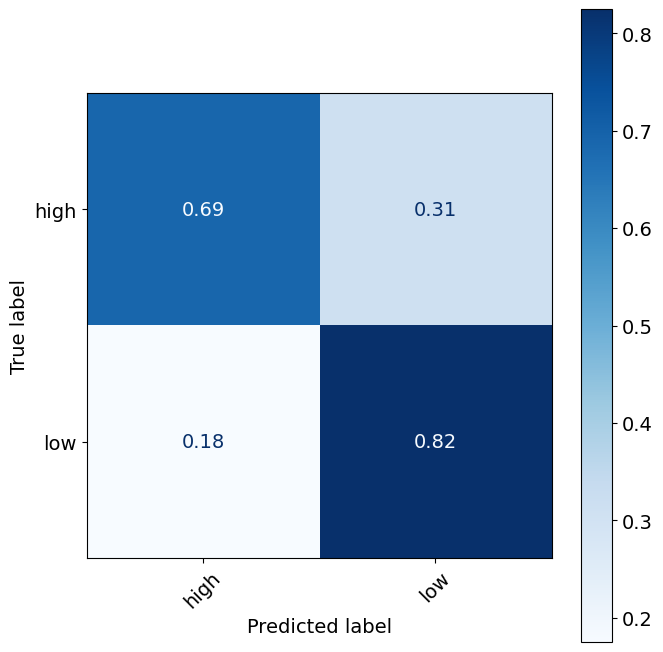

Evaluating model: SVM for original classes
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.73      0.80      0.76        50
 frustration       0.81      0.60      0.69        50
     petting       0.79      0.87      0.83        47
         toy       0.78      0.84      0.81        43

    accuracy                           0.77       190
   macro avg       0.78      0.78      0.77       190
weighted avg       0.78      0.77      0.77       190

Confusion Matrix:
[[0.8        0.1        0.06       0.04      ]
 [0.16       0.6        0.14       0.1       ]
 [0.04255319 0.0212766  0.87234043 0.06382979]
 [0.11627907 0.02325581 0.02325581 0.8372093 ]]




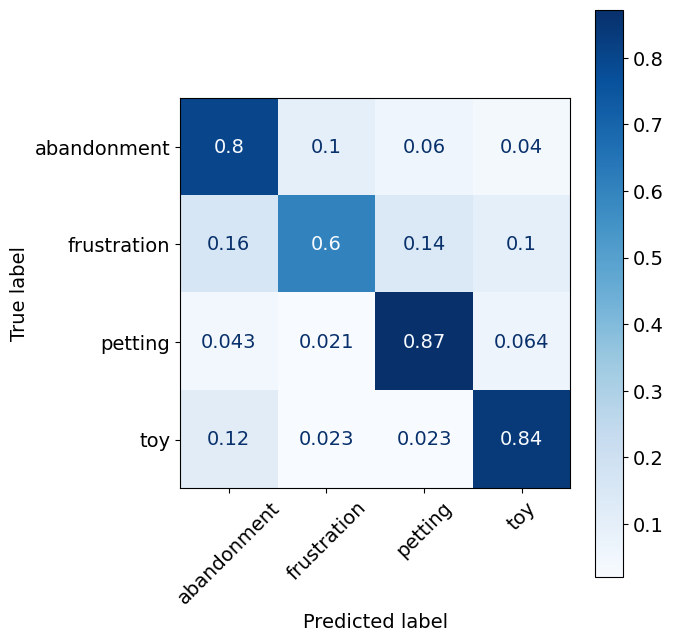

Evaluating model: Decision Tree for valence
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.83      0.79      0.81       100
    positive       0.78      0.82      0.80        90

    accuracy                           0.81       190
   macro avg       0.81      0.81      0.81       190
weighted avg       0.81      0.81      0.81       190

Confusion Matrix:
[[0.79       0.21      ]
 [0.17777778 0.82222222]]




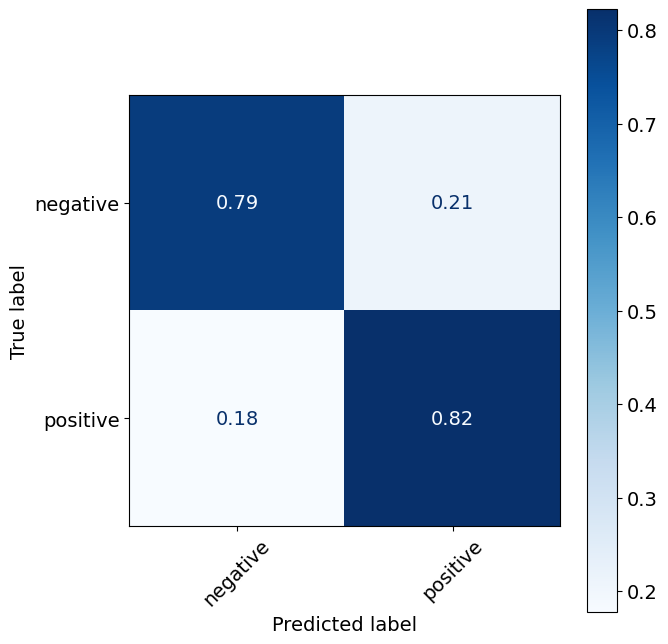

Evaluating model: Decision Tree for arousal
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.76      0.81      0.78        93
         low       0.80      0.75      0.78        97

    accuracy                           0.78       190
   macro avg       0.78      0.78      0.78       190
weighted avg       0.78      0.78      0.78       190

Confusion Matrix:
[[0.80645161 0.19354839]
 [0.24742268 0.75257732]]




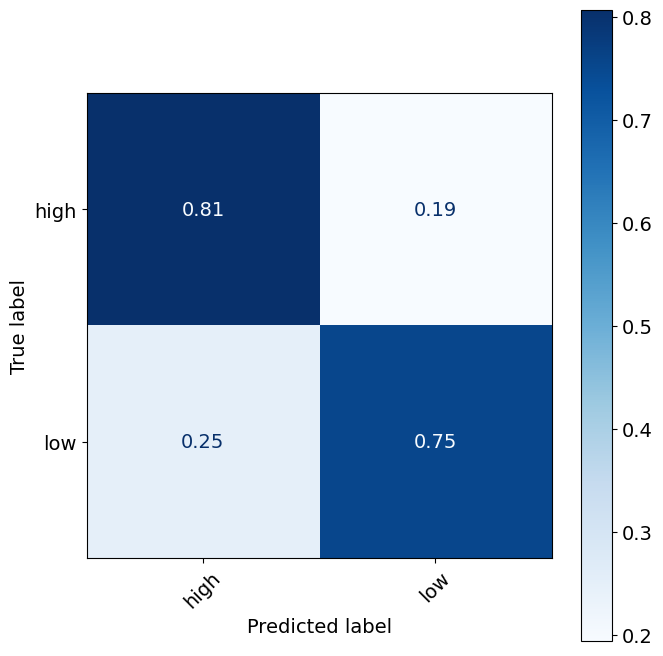

Evaluating model: Decision Tree for original classes
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.62      0.46      0.53        50
 frustration       0.57      0.78      0.66        50
     petting       0.71      0.62      0.66        47
         toy       0.84      0.84      0.84        43

    accuracy                           0.67       190
   macro avg       0.68      0.67      0.67       190
weighted avg       0.68      0.67      0.66       190

Confusion Matrix:
[[0.46       0.3        0.18       0.06      ]
 [0.12       0.78       0.04       0.06      ]
 [0.12765957 0.23404255 0.61702128 0.0212766 ]
 [0.04651163 0.09302326 0.02325581 0.8372093 ]]




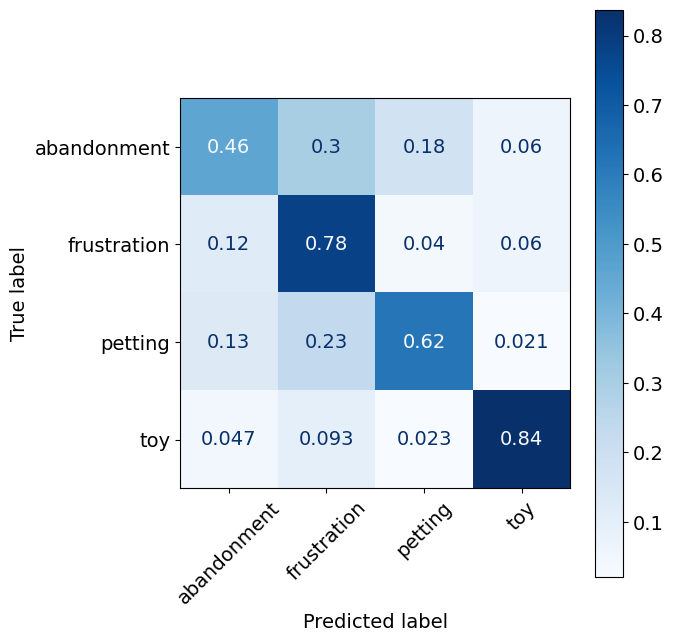

Evaluating model: Extra Trees for valence
Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.92      0.93      0.93       100
    positive       0.92      0.91      0.92        90

    accuracy                           0.92       190
   macro avg       0.92      0.92      0.92       190
weighted avg       0.92      0.92      0.92       190

Confusion Matrix:
[[0.93       0.07      ]
 [0.08888889 0.91111111]]




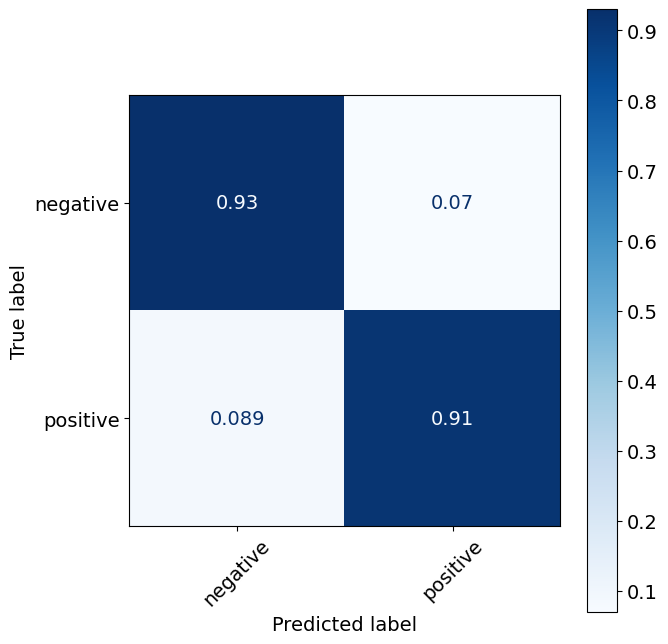

Evaluating model: Extra Trees for arousal
Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.89      0.84      0.86        93
         low       0.85      0.90      0.87        97

    accuracy                           0.87       190
   macro avg       0.87      0.87      0.87       190
weighted avg       0.87      0.87      0.87       190

Confusion Matrix:
[[0.83870968 0.16129032]
 [0.10309278 0.89690722]]




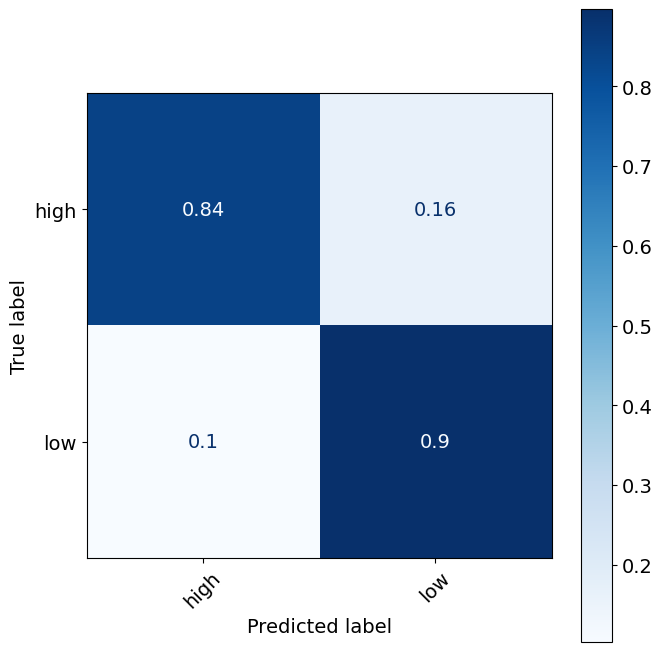

Evaluating model: Extra Trees for original classes
Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.79      0.76      0.78        50
 frustration       0.81      0.78      0.80        50
     petting       0.89      0.83      0.86        47
         toy       0.80      0.93      0.86        43

    accuracy                           0.82       190
   macro avg       0.82      0.83      0.82       190
weighted avg       0.82      0.82      0.82       190

Confusion Matrix:
[[0.76       0.1        0.06       0.08      ]
 [0.14       0.78       0.04       0.04      ]
 [0.04255319 0.04255319 0.82978723 0.08510638]
 [0.02325581 0.04651163 0.         0.93023256]]




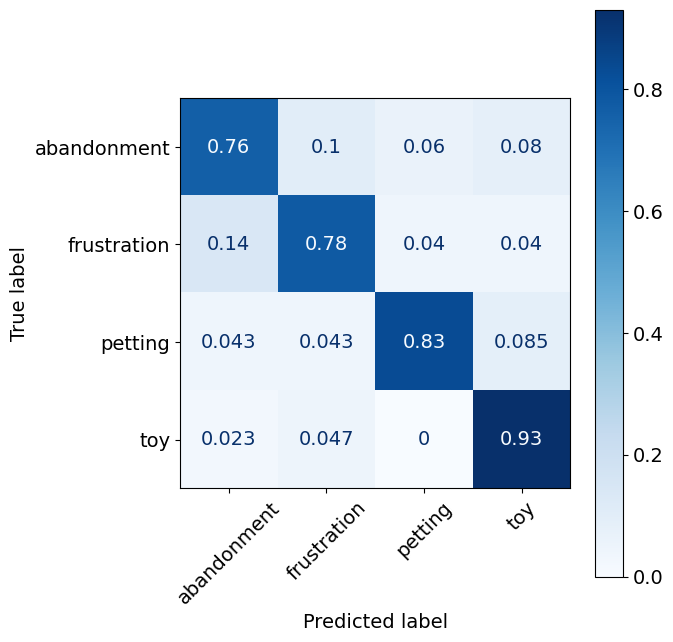

In [ ]:
evaluate_models_matrix(merged_df_imu)

Evaluating model: Naive Bayes for valence
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

    negative       0.68      0.81      0.74       100
    positive       0.73      0.57      0.64        90

    accuracy                           0.69       190
   macro avg       0.70      0.69      0.69       190
weighted avg       0.70      0.69      0.69       190

Confusion Matrix:
[[0.81       0.19      ]
 [0.43333333 0.56666667]]




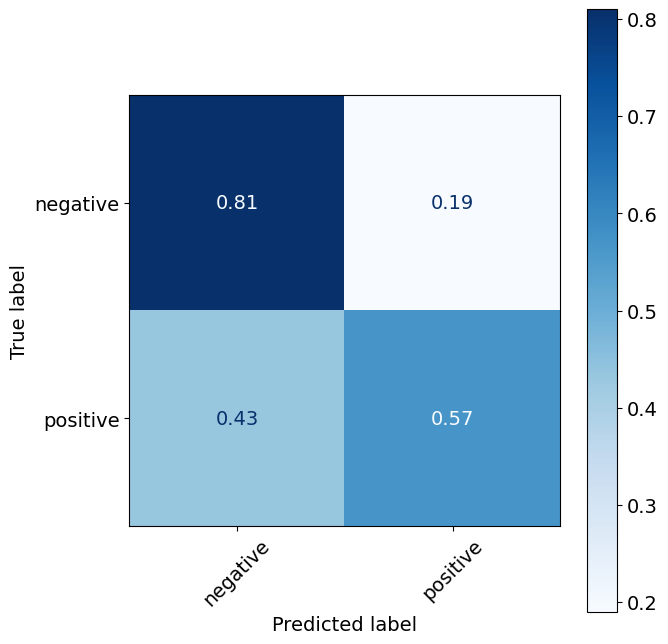

Evaluating model: Naive Bayes for arousal
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

        high       0.60      0.44      0.51        93
         low       0.57      0.72      0.64        97

    accuracy                           0.58       190
   macro avg       0.59      0.58      0.57       190
weighted avg       0.59      0.58      0.58       190

Confusion Matrix:
[[0.44086022 0.55913978]
 [0.27835052 0.72164948]]




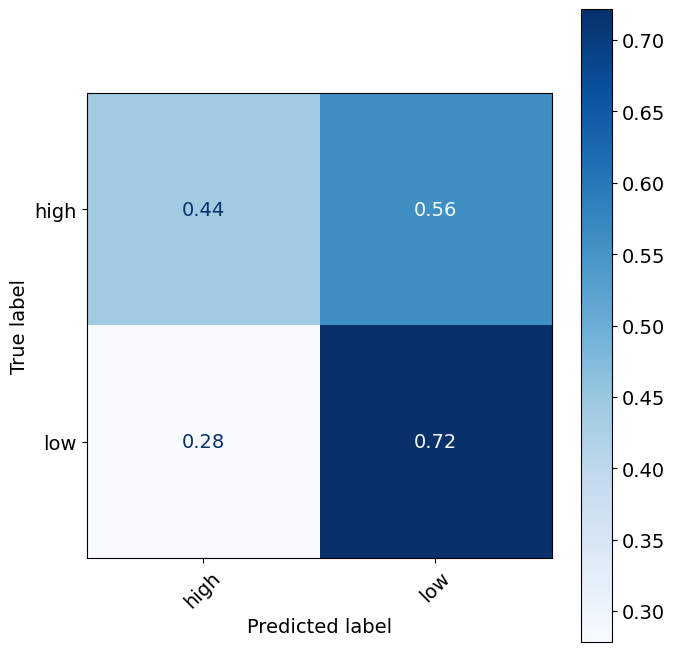

Evaluating model: Naive Bayes for original classes
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.36      0.68      0.47        50
 frustration       0.43      0.20      0.27        50
     petting       0.37      0.21      0.27        47
         toy       0.53      0.56      0.55        43

    accuracy                           0.41       190
   macro avg       0.42      0.41      0.39       190
weighted avg       0.42      0.41      0.39       190

Confusion Matrix:
[[0.68       0.16       0.1        0.06      ]
 [0.58       0.2        0.08       0.14      ]
 [0.4893617  0.06382979 0.21276596 0.23404255]
 [0.20930233 0.04651163 0.18604651 0.55813953]]




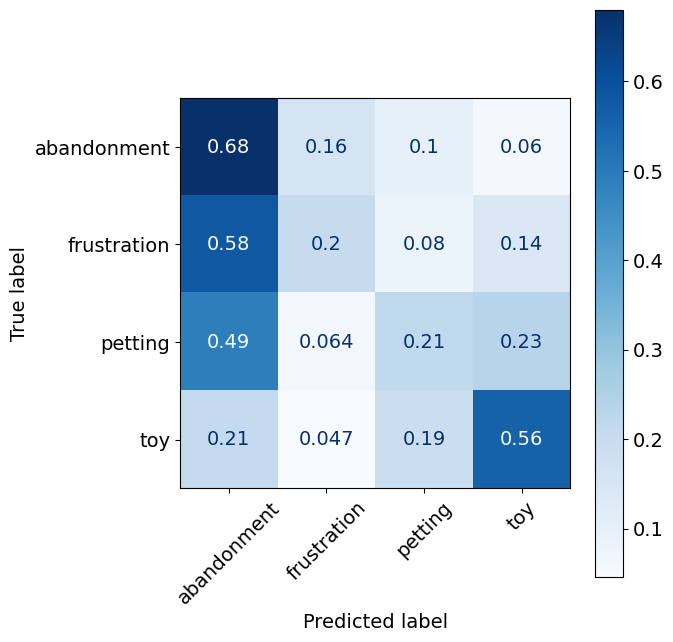

Evaluating model: KNN for valence
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.66      0.70      0.68       100
    positive       0.64      0.60      0.62        90

    accuracy                           0.65       190
   macro avg       0.65      0.65      0.65       190
weighted avg       0.65      0.65      0.65       190

Confusion Matrix:
[[0.7 0.3]
 [0.4 0.6]]




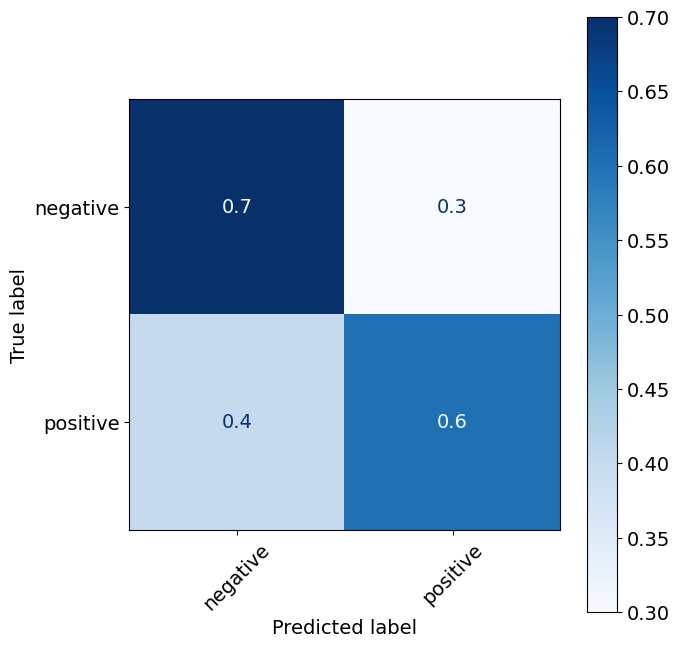

Evaluating model: KNN for arousal
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.69      0.73      0.71        93
         low       0.73      0.69      0.71        97

    accuracy                           0.71       190
   macro avg       0.71      0.71      0.71       190
weighted avg       0.71      0.71      0.71       190

Confusion Matrix:
[[0.7311828  0.2688172 ]
 [0.30927835 0.69072165]]




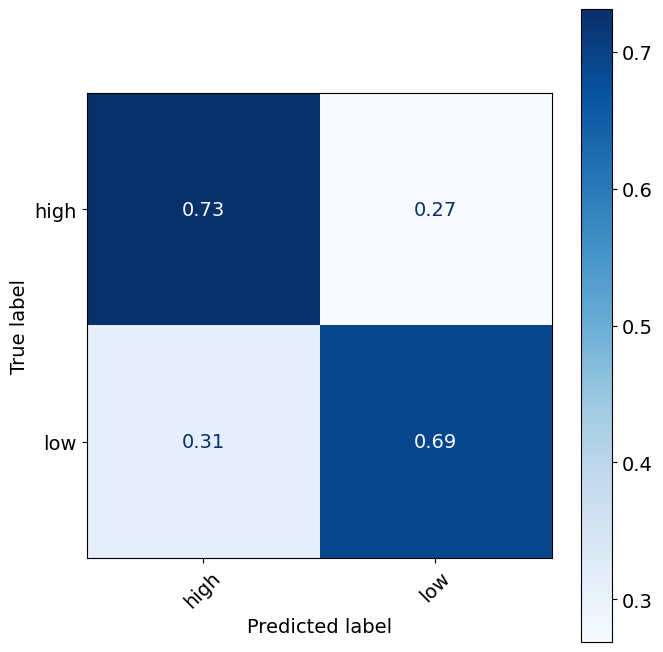

Evaluating model: KNN for original classes
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.41      0.40      0.40        50
 frustration       0.55      0.66      0.60        50
     petting       0.40      0.45      0.42        47
         toy       0.59      0.40      0.47        43

    accuracy                           0.48       190
   macro avg       0.49      0.48      0.48       190
weighted avg       0.48      0.48      0.48       190

Confusion Matrix:
[[0.4        0.24       0.26       0.1       ]
 [0.12       0.66       0.14       0.08      ]
 [0.29787234 0.19148936 0.44680851 0.06382979]
 [0.20930233 0.13953488 0.25581395 0.39534884]]




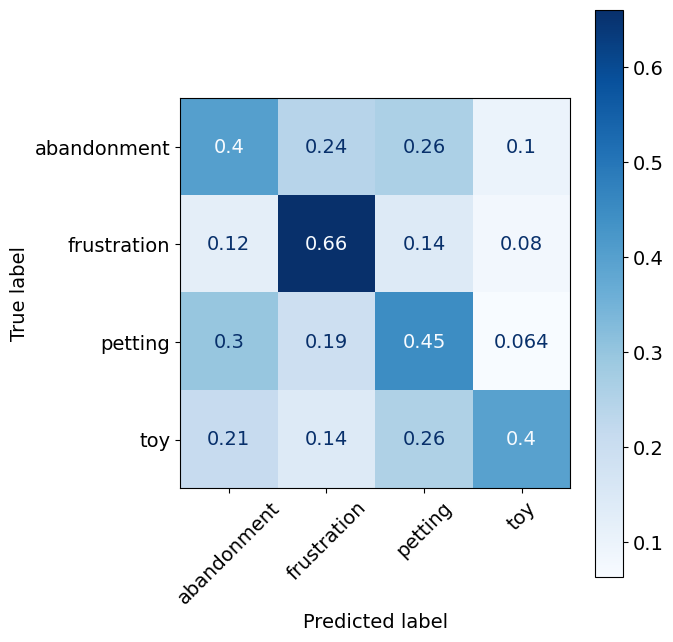

Evaluating model: SVM for valence
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

    negative       0.67      0.79      0.72       100
    positive       0.71      0.57      0.63        90

    accuracy                           0.68       190
   macro avg       0.69      0.68      0.68       190
weighted avg       0.69      0.68      0.68       190

Confusion Matrix:
[[0.79       0.21      ]
 [0.43333333 0.56666667]]




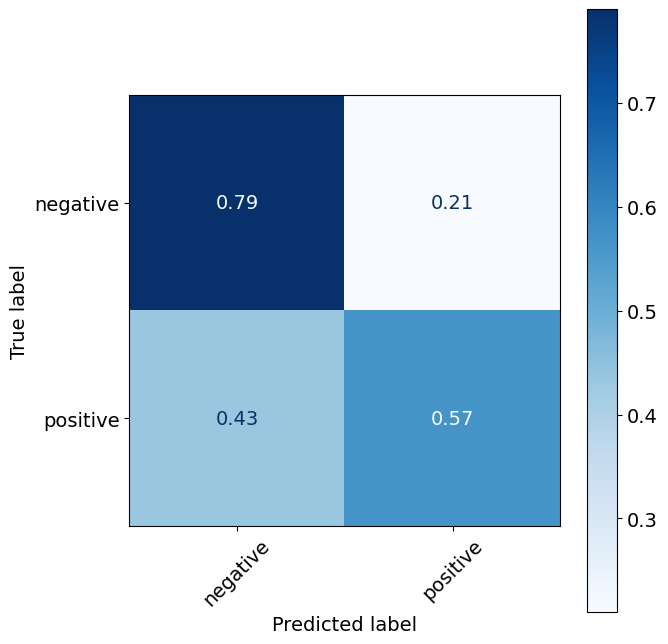

Evaluating model: SVM for arousal
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

        high       0.64      0.53      0.58        93
         low       0.61      0.71      0.66        97

    accuracy                           0.62       190
   macro avg       0.62      0.62      0.62       190
weighted avg       0.62      0.62      0.62       190

Confusion Matrix:
[[0.52688172 0.47311828]
 [0.28865979 0.71134021]]




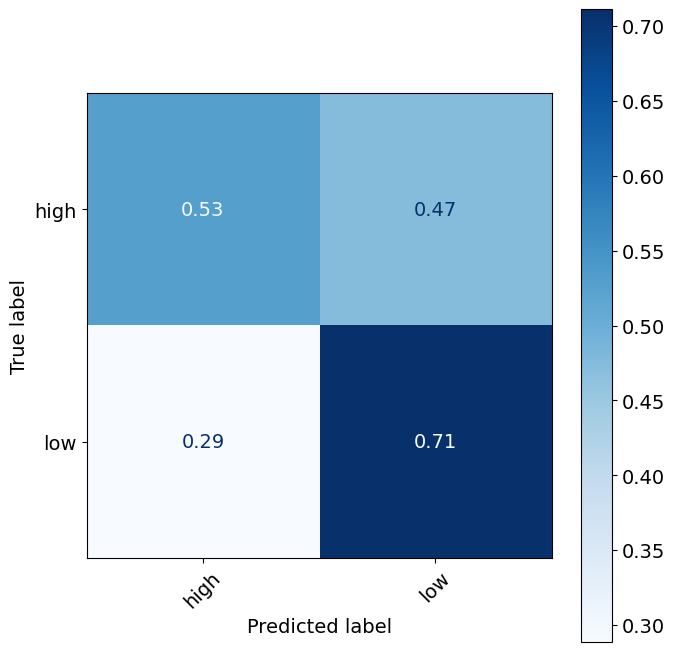

Evaluating model: SVM for original classes
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.46      0.74      0.57        50
 frustration       0.38      0.30      0.33        50
     petting       0.29      0.17      0.21        47
         toy       0.48      0.47      0.47        43

    accuracy                           0.42       190
   macro avg       0.40      0.42      0.40       190
weighted avg       0.40      0.42      0.40       190

Confusion Matrix:
[[0.74       0.14       0.08       0.04      ]
 [0.34       0.3        0.18       0.18      ]
 [0.44680851 0.14893617 0.17021277 0.23404255]
 [0.11627907 0.25581395 0.1627907  0.46511628]]




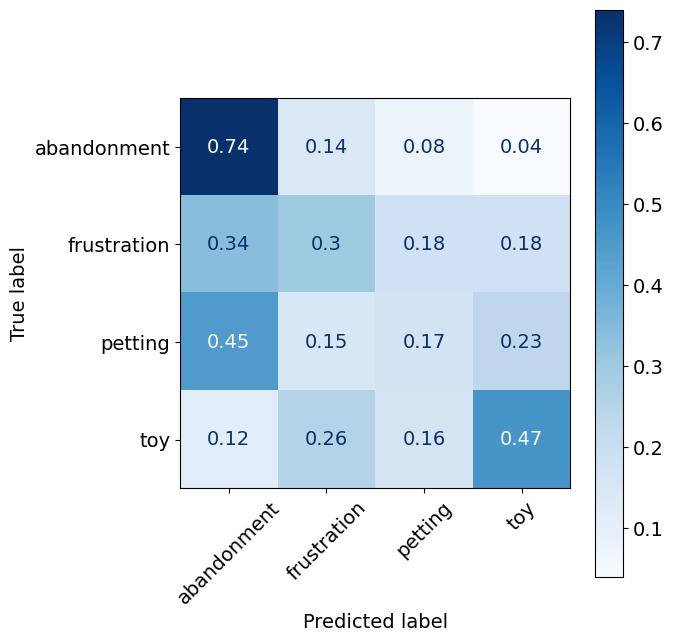

Evaluating model: Decision Tree for valence
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.71      0.73      0.72       100
    positive       0.69      0.67      0.68        90

    accuracy                           0.70       190
   macro avg       0.70      0.70      0.70       190
weighted avg       0.70      0.70      0.70       190

Confusion Matrix:
[[0.73       0.27      ]
 [0.33333333 0.66666667]]




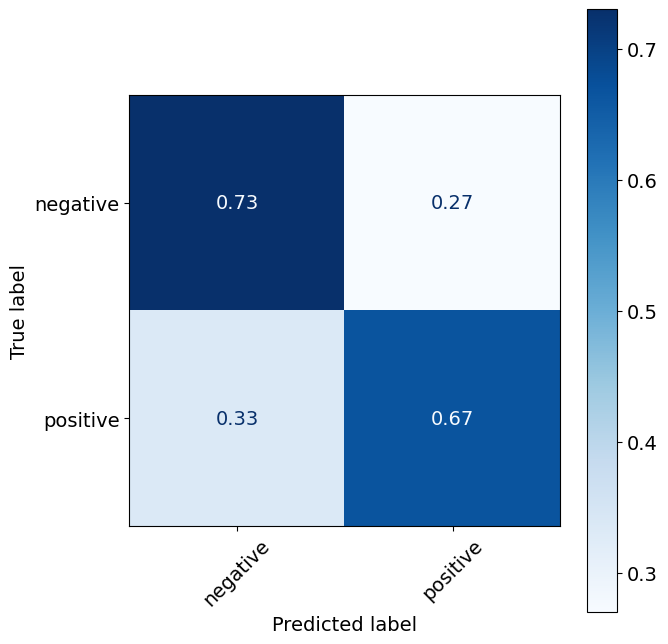

Evaluating model: Decision Tree for arousal
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.60      0.59      0.60        93
         low       0.62      0.63      0.62        97

    accuracy                           0.61       190
   macro avg       0.61      0.61      0.61       190
weighted avg       0.61      0.61      0.61       190

Confusion Matrix:
[[0.59139785 0.40860215]
 [0.37113402 0.62886598]]




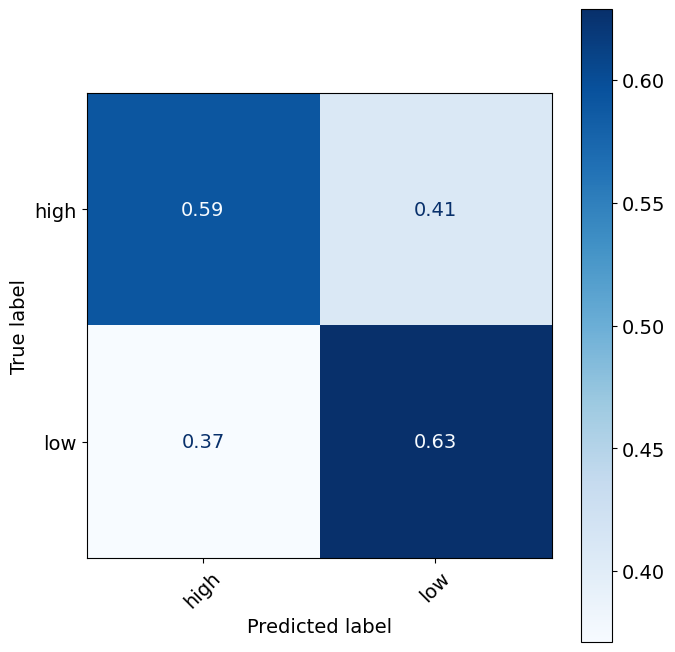

Evaluating model: Decision Tree for original classes
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.46      0.50      0.48        50
 frustration       0.57      0.50      0.53        50
     petting       0.55      0.55      0.55        47
         toy       0.47      0.49      0.48        43

    accuracy                           0.51       190
   macro avg       0.51      0.51      0.51       190
weighted avg       0.51      0.51      0.51       190

Confusion Matrix:
[[0.5        0.14       0.16       0.2       ]
 [0.18       0.5        0.18       0.14      ]
 [0.19148936 0.10638298 0.55319149 0.14893617]
 [0.25581395 0.1627907  0.09302326 0.48837209]]




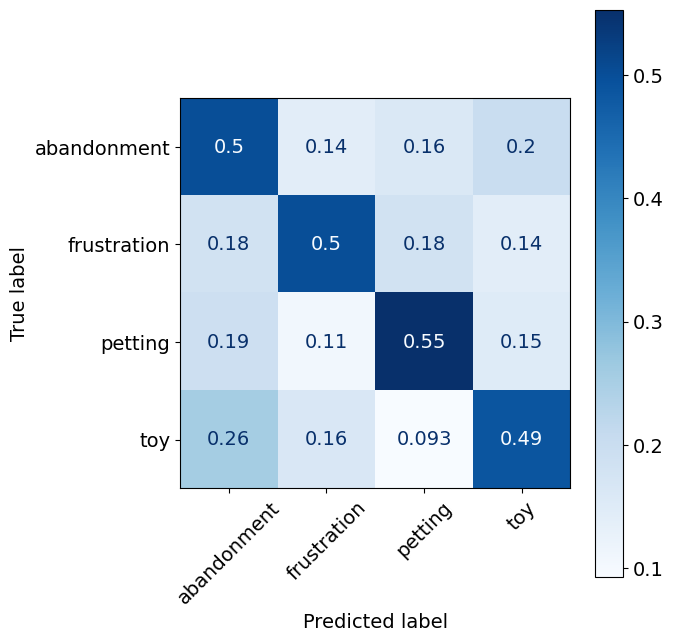

Evaluating model: Extra Trees for valence
Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.70      0.78      0.74       100
    positive       0.72      0.62      0.67        90

    accuracy                           0.71       190
   macro avg       0.71      0.70      0.70       190
weighted avg       0.71      0.71      0.70       190

Confusion Matrix:
[[0.78       0.22      ]
 [0.37777778 0.62222222]]




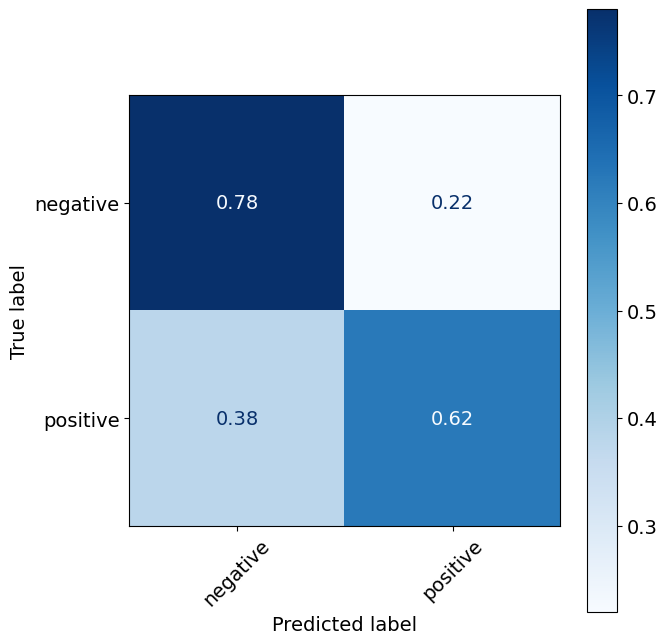

Evaluating model: Extra Trees for arousal
Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.59      0.56      0.57        93
         low       0.60      0.63      0.61        97

    accuracy                           0.59       190
   macro avg       0.59      0.59      0.59       190
weighted avg       0.59      0.59      0.59       190

Confusion Matrix:
[[0.55913978 0.44086022]
 [0.37113402 0.62886598]]




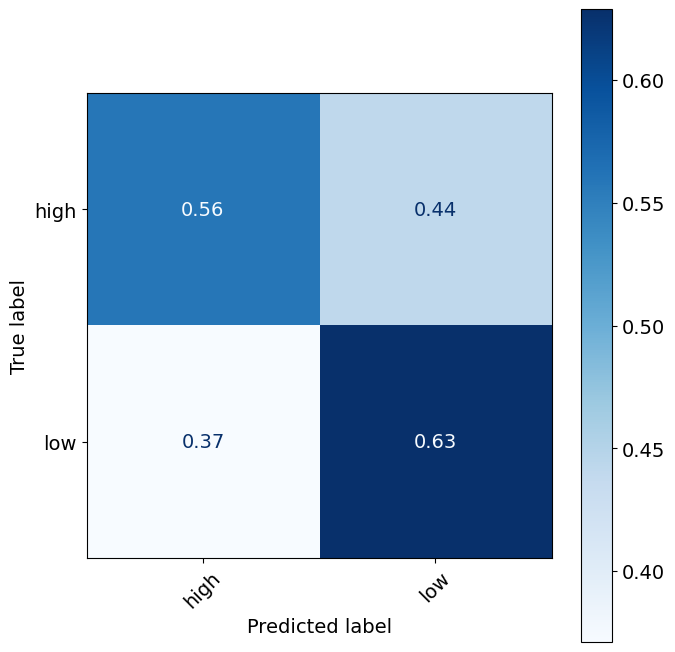

Evaluating model: Extra Trees for original classes
Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.55      0.62      0.58        50
 frustration       0.55      0.58      0.56        50
     petting       0.43      0.43      0.43        47
         toy       0.41      0.33      0.36        43

    accuracy                           0.49       190
   macro avg       0.48      0.49      0.48       190
weighted avg       0.49      0.49      0.49       190

Confusion Matrix:
[[0.62       0.22       0.1        0.06      ]
 [0.16       0.58       0.18       0.08      ]
 [0.12765957 0.17021277 0.42553191 0.27659574]
 [0.25581395 0.11627907 0.30232558 0.3255814 ]]




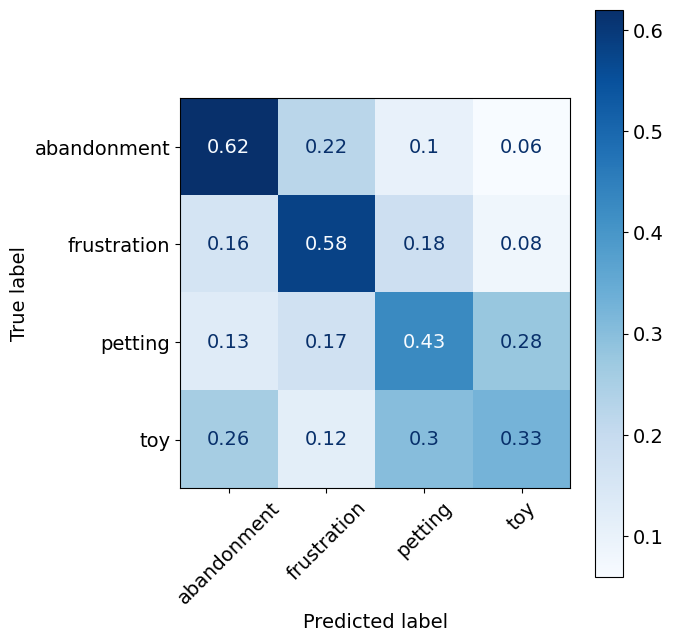

In [ ]:
evaluate_models_matrix(merged_df_visual)

Evaluating model: Naive Bayes for valence
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

    negative       0.77      0.67      0.72       100
    positive       0.66      0.76      0.71        85

    accuracy                           0.71       185
   macro avg       0.72      0.72      0.71       185
weighted avg       0.72      0.71      0.71       185

Confusion Matrix:
[[0.67       0.33      ]
 [0.23529412 0.76470588]]




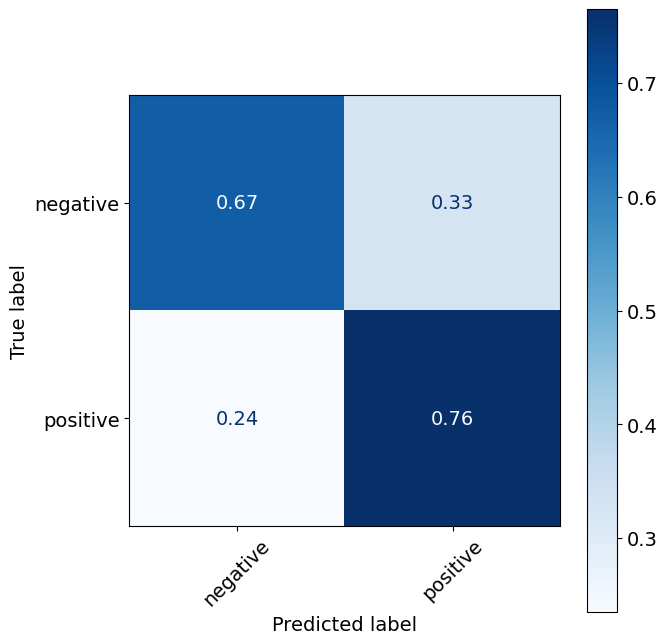

Evaluating model: Naive Bayes for arousal
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

        high       0.59      0.47      0.53        89
         low       0.59      0.70      0.64        96

    accuracy                           0.59       185
   macro avg       0.59      0.58      0.58       185
weighted avg       0.59      0.59      0.58       185

Confusion Matrix:
[[0.47191011 0.52808989]
 [0.30208333 0.69791667]]




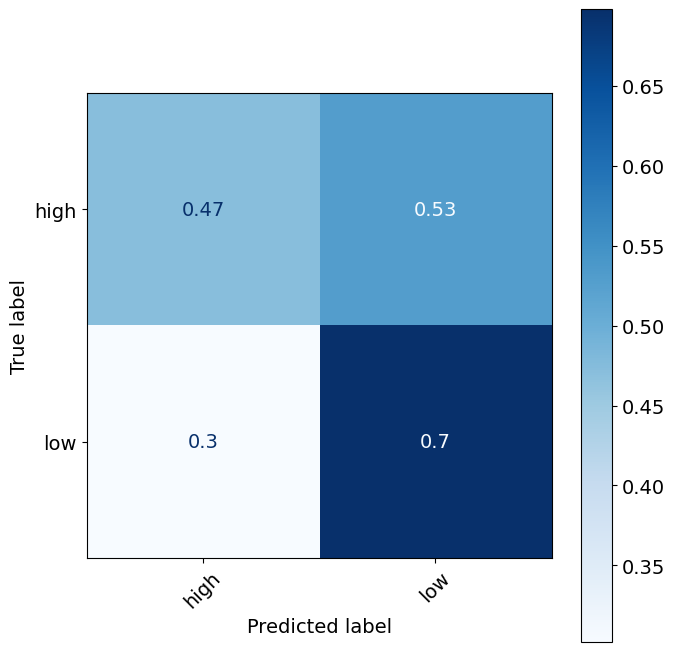

Evaluating model: Naive Bayes for original classes
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.38      0.28      0.32        50
 frustration       0.67      0.48      0.56        50
     petting       0.57      0.74      0.64        46
         toy       0.35      0.46      0.40        39

    accuracy                           0.49       185
   macro avg       0.49      0.49      0.48       185
weighted avg       0.50      0.49      0.48       185

Confusion Matrix:
[[0.28       0.16       0.12       0.44      ]
 [0.32       0.48       0.16       0.04      ]
 [0.02173913 0.02173913 0.73913043 0.2173913 ]
 [0.15384615 0.07692308 0.30769231 0.46153846]]




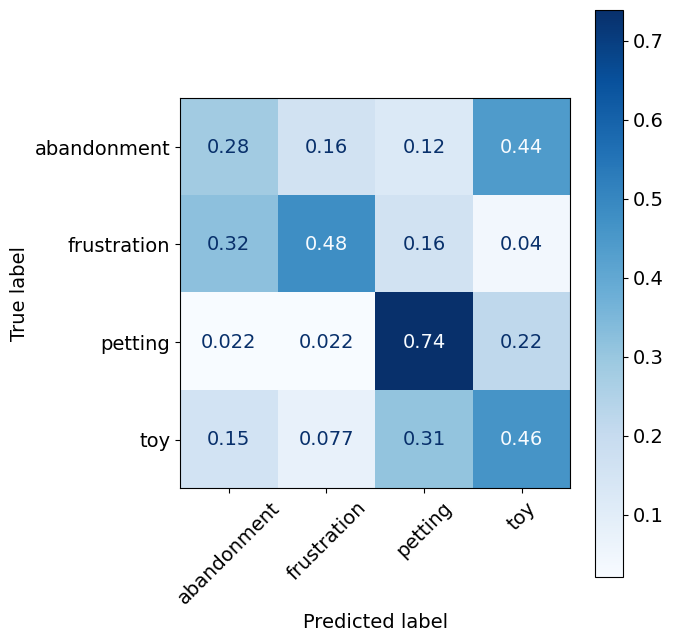

Evaluating model: KNN for valence
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.71      0.56      0.63       100
    positive       0.58      0.73      0.65        85

    accuracy                           0.64       185
   macro avg       0.65      0.64      0.64       185
weighted avg       0.65      0.64      0.64       185

Confusion Matrix:
[[0.56       0.44      ]
 [0.27058824 0.72941176]]




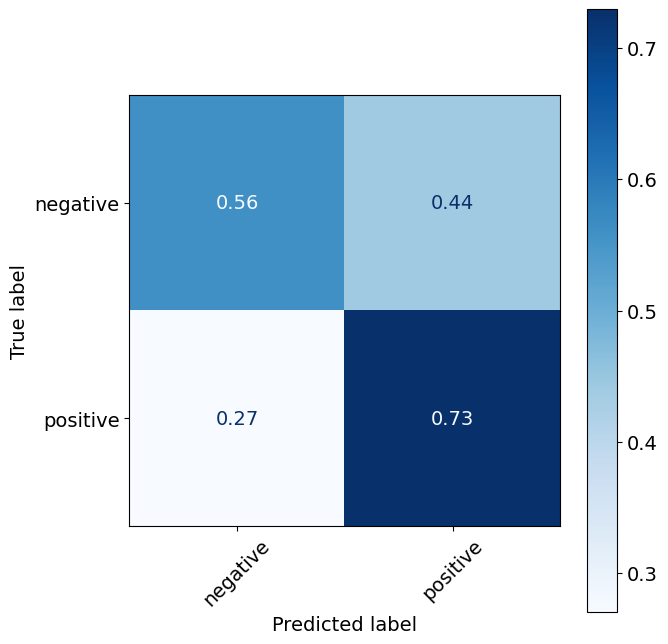

Evaluating model: KNN for arousal
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.80      0.81      0.80        89
         low       0.82      0.81      0.82        96

    accuracy                           0.81       185
   macro avg       0.81      0.81      0.81       185
weighted avg       0.81      0.81      0.81       185

Confusion Matrix:
[[0.80898876 0.19101124]
 [0.1875     0.8125    ]]




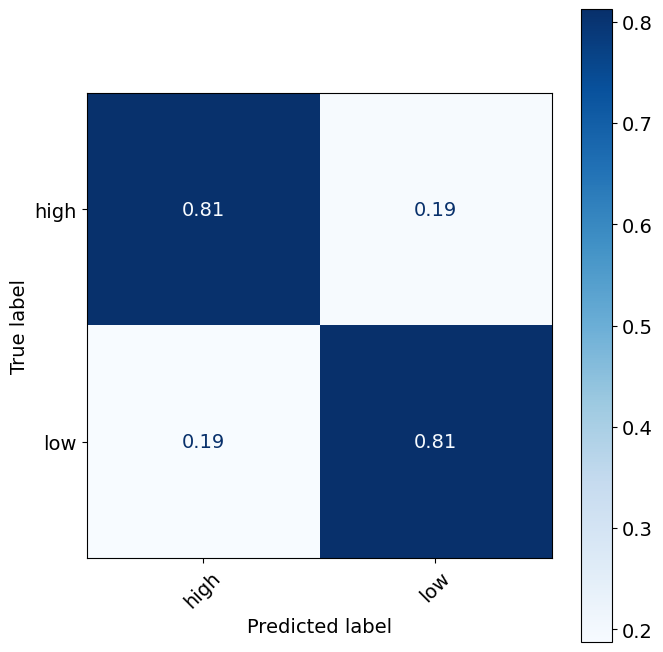

Evaluating model: KNN for original classes
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.65      0.56      0.60        50
 frustration       0.57      0.48      0.52        50
     petting       0.56      0.78      0.65        46
         toy       0.47      0.44      0.45        39

    accuracy                           0.57       185
   macro avg       0.56      0.56      0.56       185
weighted avg       0.57      0.57      0.56       185

Confusion Matrix:
[[0.56       0.14       0.2        0.1       ]
 [0.06       0.48       0.24       0.22      ]
 [0.10869565 0.04347826 0.7826087  0.06521739]
 [0.17948718 0.23076923 0.15384615 0.43589744]]




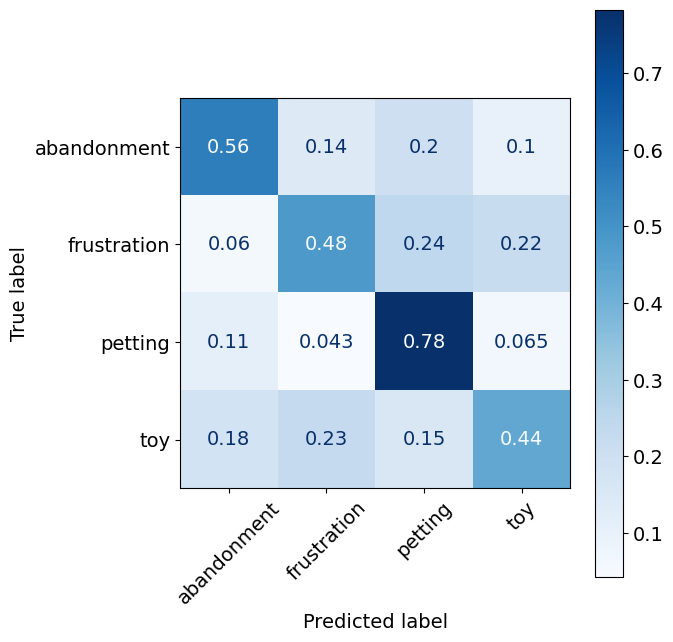

Evaluating model: SVM for valence
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

    negative       0.81      0.68      0.74       100
    positive       0.68      0.81      0.74        85

    accuracy                           0.74       185
   macro avg       0.75      0.75      0.74       185
weighted avg       0.75      0.74      0.74       185

Confusion Matrix:
[[0.68       0.32      ]
 [0.18823529 0.81176471]]




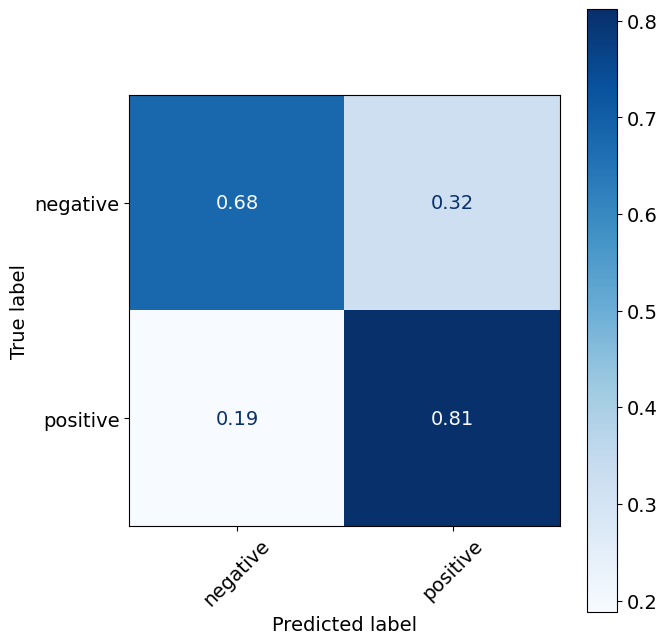

Evaluating model: SVM for arousal
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

        high       0.80      0.71      0.75        89
         low       0.75      0.83      0.79        96

    accuracy                           0.77       185
   macro avg       0.78      0.77      0.77       185
weighted avg       0.78      0.77      0.77       185

Confusion Matrix:
[[0.70786517 0.29213483]
 [0.16666667 0.83333333]]




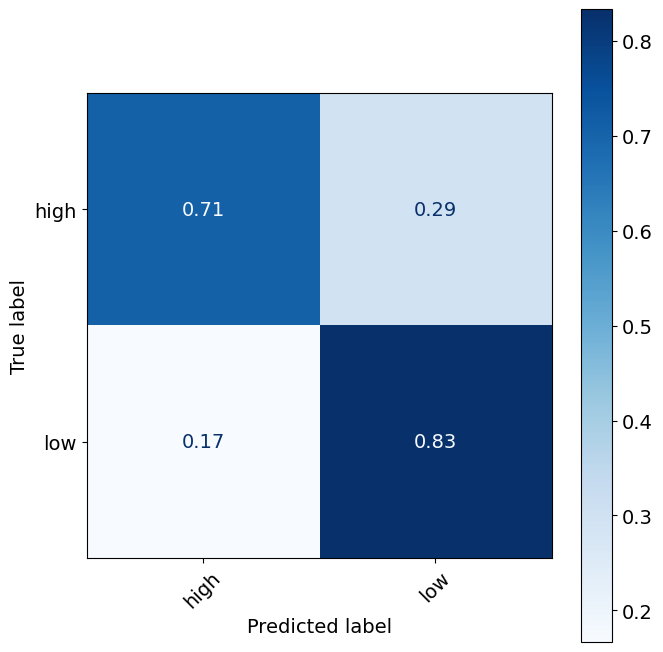

Evaluating model: SVM for original classes
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.42      0.50      0.45        50
 frustration       0.69      0.40      0.51        50
     petting       0.64      0.80      0.71        46
         toy       0.63      0.62      0.62        39

    accuracy                           0.57       185
   macro avg       0.59      0.58      0.57       185
weighted avg       0.59      0.57      0.57       185

Confusion Matrix:
[[0.5        0.18       0.2        0.12      ]
 [0.36       0.4        0.08       0.16      ]
 [0.19565217 0.         0.80434783 0.        ]
 [0.20512821 0.         0.17948718 0.61538462]]




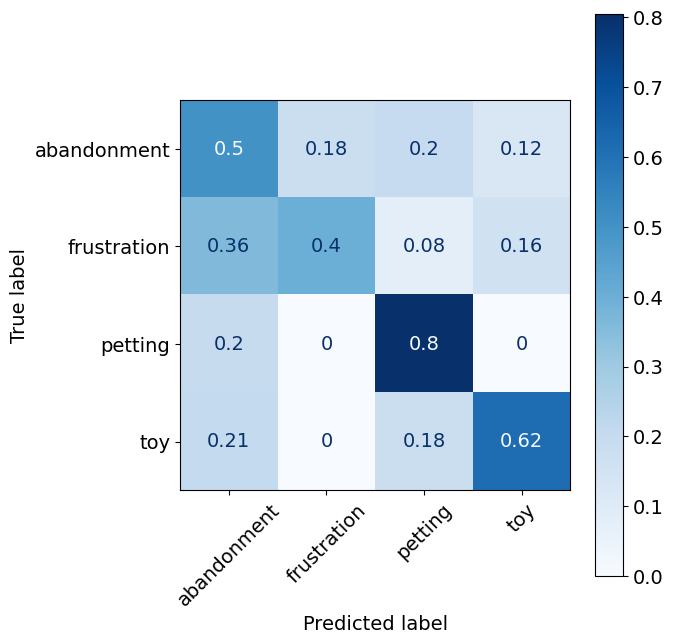

Evaluating model: Decision Tree for valence
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.86      0.87      0.87       100
    positive       0.85      0.84      0.84        85

    accuracy                           0.85       185
   macro avg       0.85      0.85      0.85       185
weighted avg       0.85      0.85      0.85       185

Confusion Matrix:
[[0.87       0.13      ]
 [0.16470588 0.83529412]]




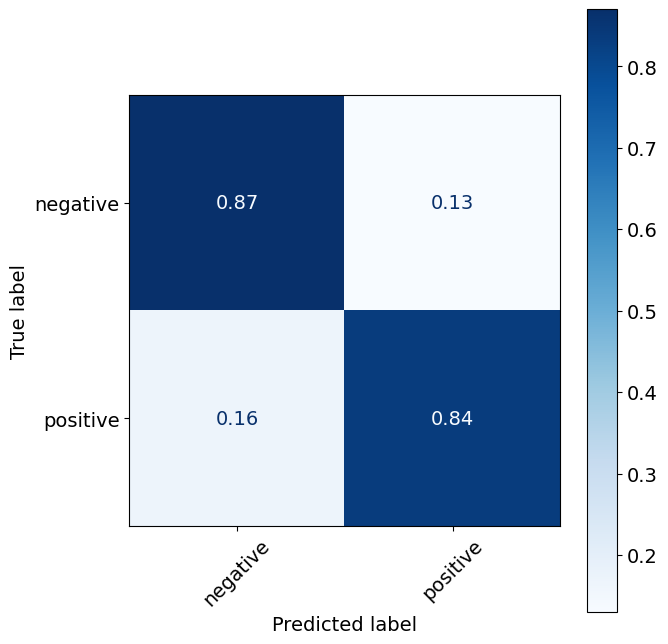

Evaluating model: Decision Tree for arousal
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.85      0.93      0.89        89
         low       0.93      0.84      0.89        96

    accuracy                           0.89       185
   macro avg       0.89      0.89      0.89       185
weighted avg       0.89      0.89      0.89       185

Confusion Matrix:
[[0.93258427 0.06741573]
 [0.15625    0.84375   ]]




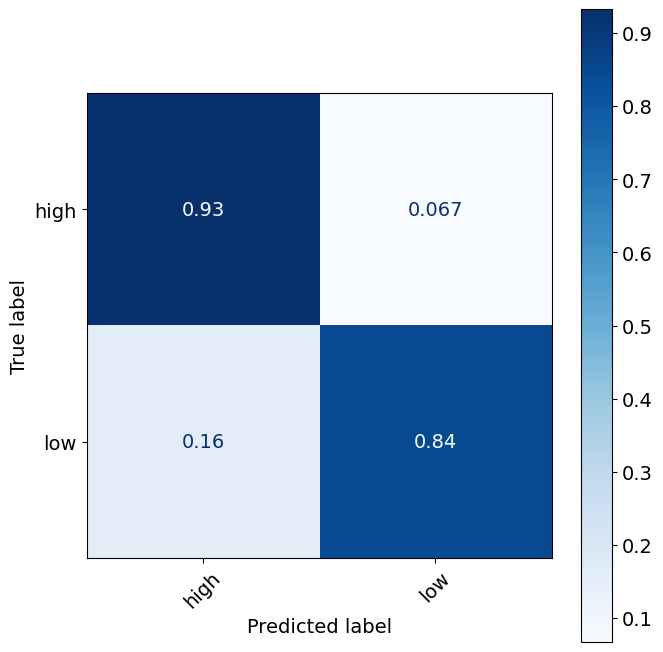

Evaluating model: Decision Tree for original classes
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.78      0.76      0.77        50
 frustration       0.76      0.74      0.75        50
     petting       0.91      0.85      0.88        46
         toy       0.70      0.79      0.75        39

    accuracy                           0.78       185
   macro avg       0.79      0.79      0.78       185
weighted avg       0.79      0.78      0.78       185

Confusion Matrix:
[[0.76       0.12       0.08       0.04      ]
 [0.1        0.74       0.         0.16      ]
 [0.08695652 0.         0.84782609 0.06521739]
 [0.05128205 0.15384615 0.         0.79487179]]




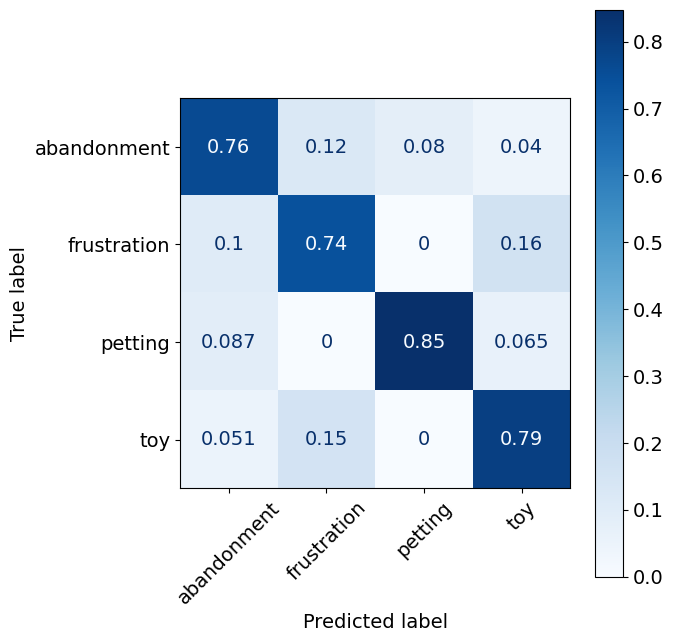

Evaluating model: Extra Trees for valence
Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.98      0.98      0.98       100
    positive       0.98      0.98      0.98        85

    accuracy                           0.98       185
   macro avg       0.98      0.98      0.98       185
weighted avg       0.98      0.98      0.98       185

Confusion Matrix:
[[0.98       0.02      ]
 [0.02352941 0.97647059]]




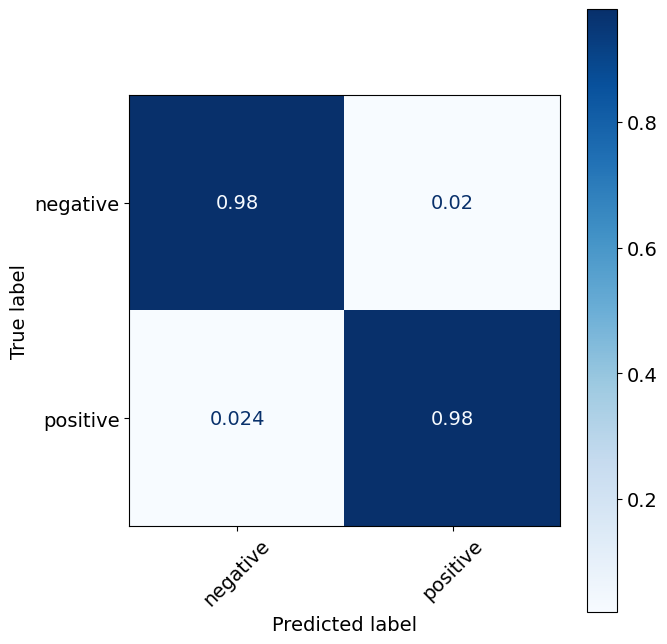

Evaluating model: Extra Trees for arousal
Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.99      0.99      0.99        89
         low       0.99      0.99      0.99        96

    accuracy                           0.99       185
   macro avg       0.99      0.99      0.99       185
weighted avg       0.99      0.99      0.99       185

Confusion Matrix:
[[0.98876404 0.01123596]
 [0.01041667 0.98958333]]




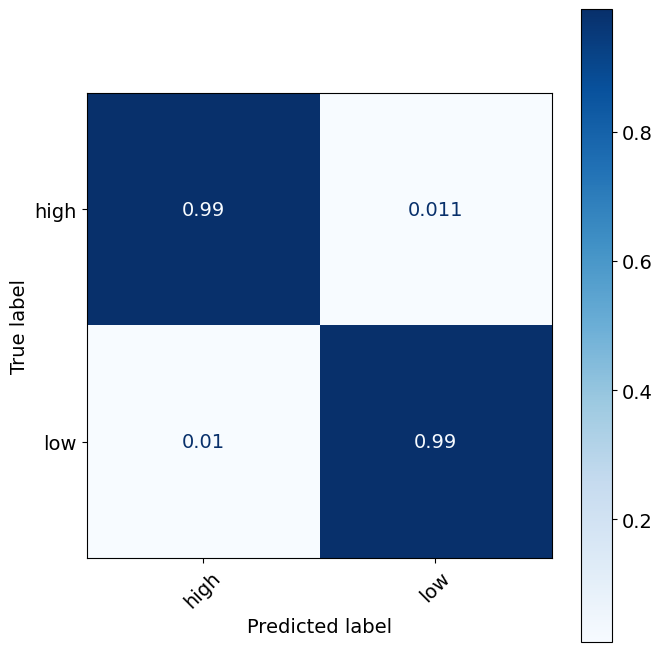

Evaluating model: Extra Trees for original classes
Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.96      1.00      0.98        50
 frustration       1.00      1.00      1.00        50
     petting       0.98      0.98      0.98        46
         toy       1.00      0.95      0.97        39

    accuracy                           0.98       185
   macro avg       0.98      0.98      0.98       185
weighted avg       0.98      0.98      0.98       185

Confusion Matrix:
[[1.         0.         0.         0.        ]
 [0.         1.         0.         0.        ]
 [0.02173913 0.         0.97826087 0.        ]
 [0.02564103 0.         0.02564103 0.94871795]]




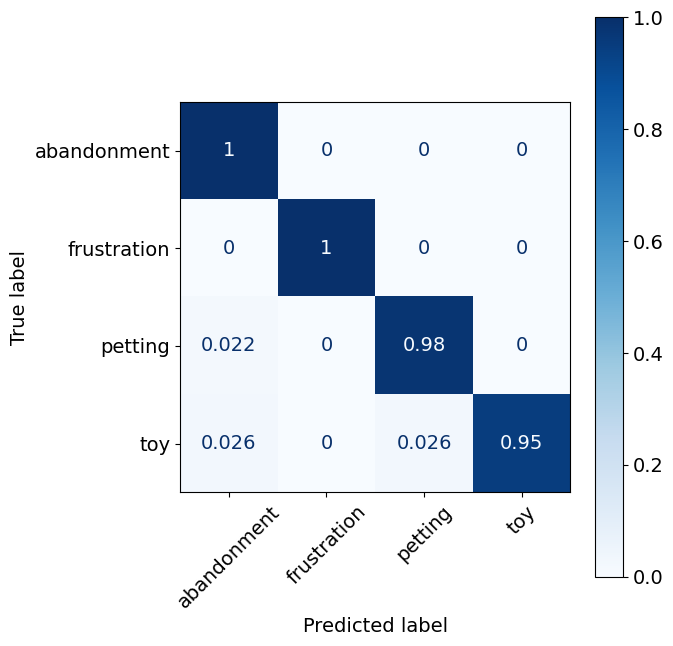

In [ ]:
evaluate_models_matrix(merged_df_tp)

Evaluating model: Naive Bayes for valence
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

    negative       0.70      0.88      0.78        99
    positive       0.75      0.49      0.60        73

    accuracy                           0.72       172
   macro avg       0.73      0.69      0.69       172
weighted avg       0.72      0.72      0.70       172

Confusion Matrix:
[[0.87878788 0.12121212]
 [0.50684932 0.49315068]]




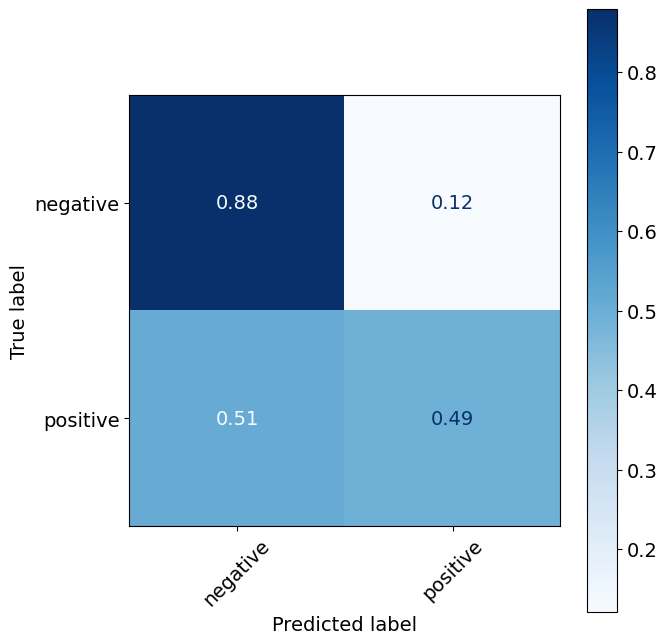

Evaluating model: Naive Bayes for arousal
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

        high       0.70      0.52      0.60        73
         low       0.70      0.84      0.76        99

    accuracy                           0.70       172
   macro avg       0.70      0.68      0.68       172
weighted avg       0.70      0.70      0.69       172

Confusion Matrix:
[[0.52054795 0.47945205]
 [0.16161616 0.83838384]]




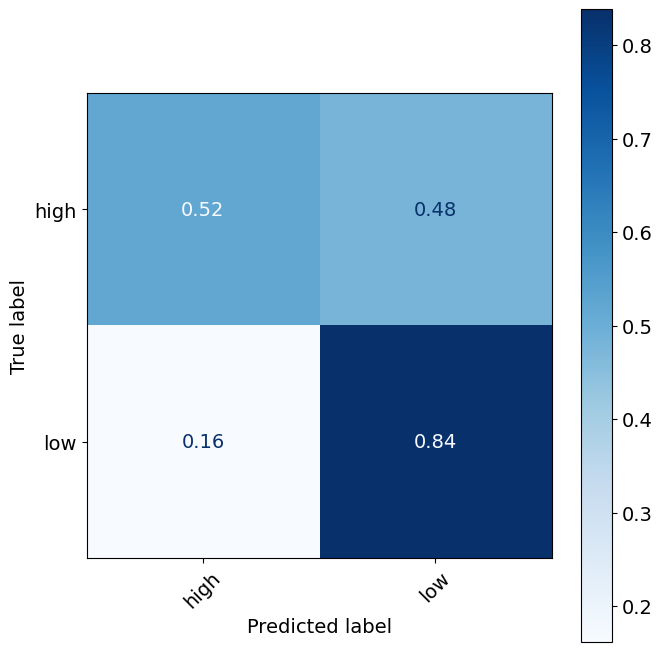

Evaluating model: Naive Bayes for original classes
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.68      0.56      0.62        50
 frustration       0.51      0.45      0.48        49
     petting       0.75      0.84      0.79        49
         toy       0.64      0.88      0.74        24

    accuracy                           0.65       172
   macro avg       0.64      0.68      0.65       172
weighted avg       0.65      0.65      0.64       172

Confusion Matrix:
[[0.56       0.28       0.08       0.08      ]
 [0.20408163 0.44897959 0.20408163 0.14285714]
 [0.04081633 0.10204082 0.83673469 0.02040816]
 [0.04166667 0.08333333 0.         0.875     ]]




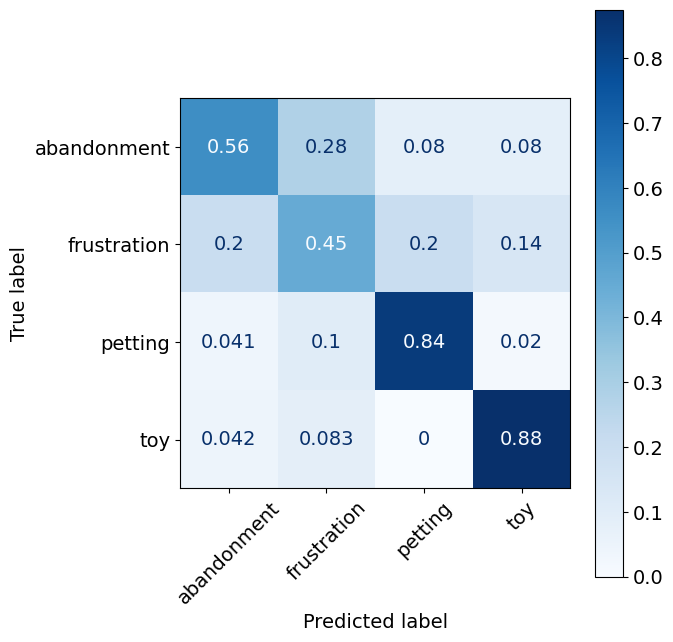

Evaluating model: KNN for valence
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.84      0.95      0.89        99
    positive       0.92      0.75      0.83        73

    accuracy                           0.87       172
   macro avg       0.88      0.85      0.86       172
weighted avg       0.87      0.87      0.86       172

Confusion Matrix:
[[0.94949495 0.05050505]
 [0.24657534 0.75342466]]




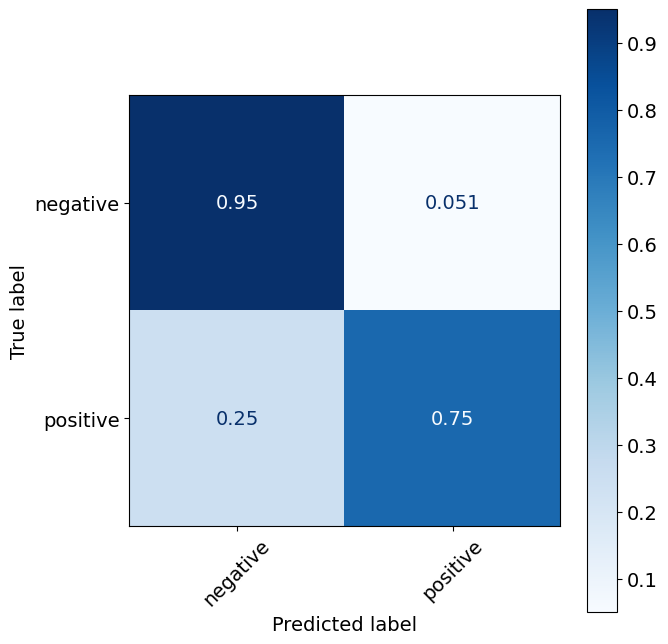

Evaluating model: KNN for arousal
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.70      0.79      0.74        73
         low       0.83      0.75      0.79        99

    accuracy                           0.77       172
   macro avg       0.77      0.77      0.77       172
weighted avg       0.78      0.77      0.77       172

Confusion Matrix:
[[0.79452055 0.20547945]
 [0.25252525 0.74747475]]




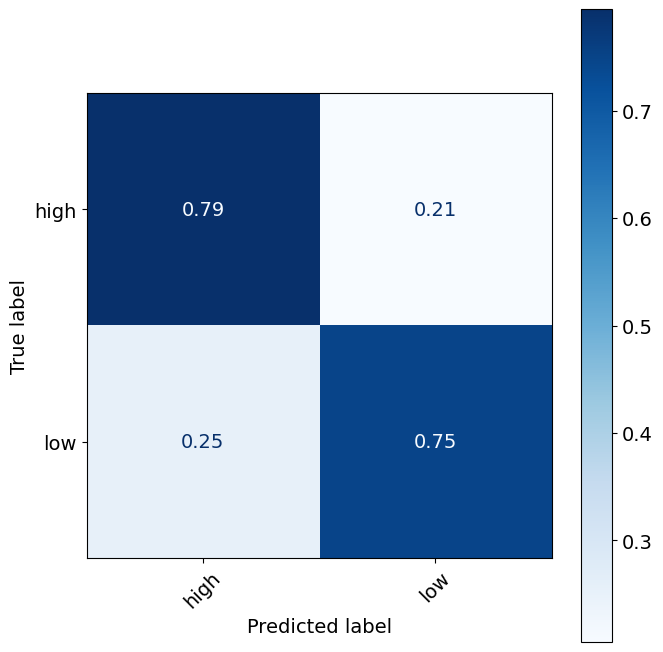

Evaluating model: KNN for original classes
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.67      0.68      0.67        50
 frustration       0.62      0.76      0.68        49
     petting       0.90      0.78      0.84        49
         toy       0.95      0.75      0.84        24

    accuracy                           0.74       172
   macro avg       0.78      0.74      0.76       172
weighted avg       0.76      0.74      0.74       172

Confusion Matrix:
[[0.68       0.26       0.06       0.        ]
 [0.2244898  0.75510204 0.02040816 0.        ]
 [0.06122449 0.14285714 0.7755102  0.02040816]
 [0.125      0.125      0.         0.75      ]]




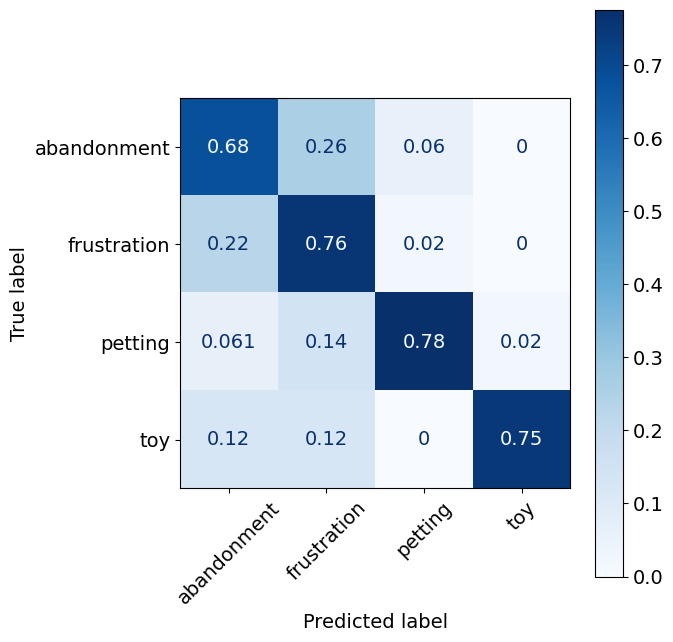

Evaluating model: SVM for valence
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

    negative       0.95      0.99      0.97        99
    positive       0.99      0.93      0.96        73

    accuracy                           0.97       172
   macro avg       0.97      0.96      0.96       172
weighted avg       0.97      0.97      0.96       172

Confusion Matrix:
[[0.98989899 0.01010101]
 [0.06849315 0.93150685]]




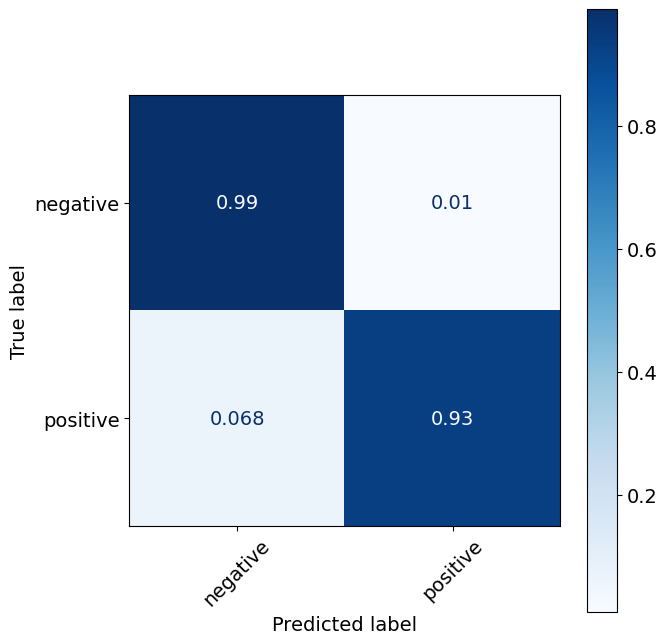

Evaluating model: SVM for arousal
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

        high       0.85      0.88      0.86        73
         low       0.91      0.89      0.90        99

    accuracy                           0.88       172
   macro avg       0.88      0.88      0.88       172
weighted avg       0.88      0.88      0.88       172

Confusion Matrix:
[[0.87671233 0.12328767]
 [0.11111111 0.88888889]]




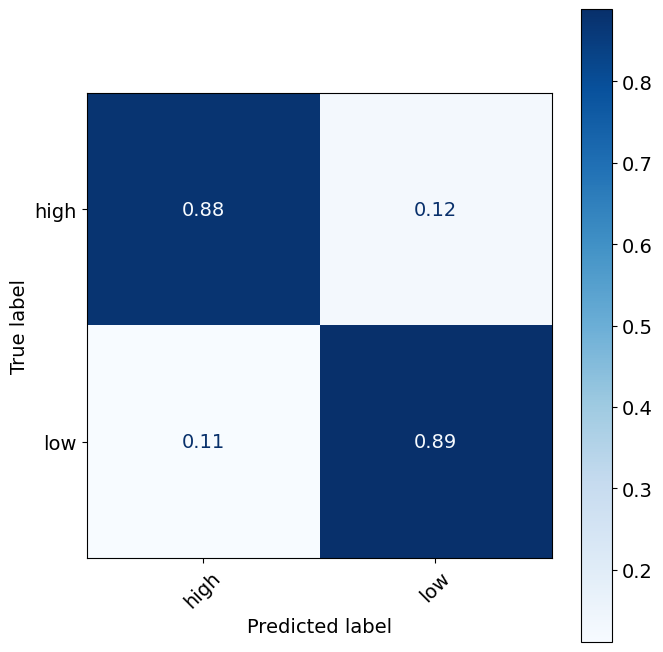

Evaluating model: SVM for original classes
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.73      0.70      0.71        50
 frustration       0.68      0.78      0.72        49
     petting       1.00      0.96      0.98        49
         toy       0.95      0.83      0.89        24

    accuracy                           0.81       172
   macro avg       0.84      0.82      0.83       172
weighted avg       0.82      0.81      0.82       172

Confusion Matrix:
[[0.7        0.3        0.         0.        ]
 [0.20408163 0.7755102  0.         0.02040816]
 [0.02040816 0.02040816 0.95918367 0.        ]
 [0.08333333 0.08333333 0.         0.83333333]]




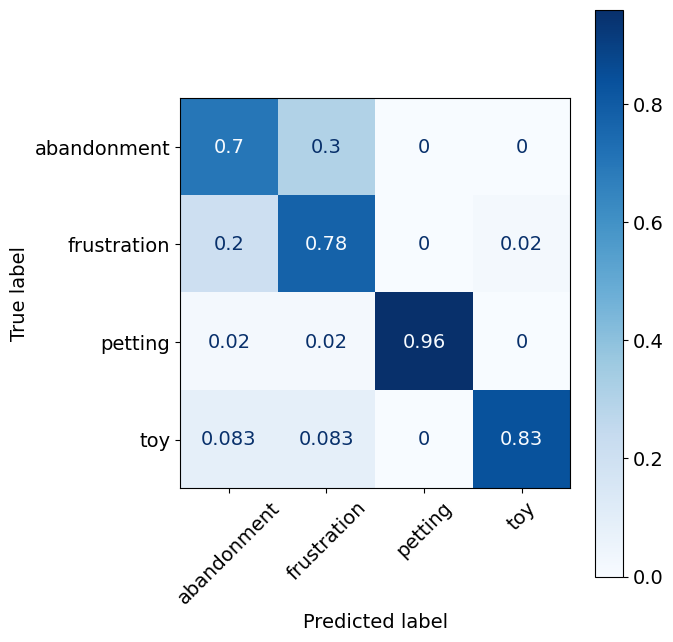

Evaluating model: Decision Tree for valence
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.87      0.91      0.89        99
    positive       0.87      0.81      0.84        73

    accuracy                           0.87       172
   macro avg       0.87      0.86      0.86       172
weighted avg       0.87      0.87      0.87       172

Confusion Matrix:
[[0.90909091 0.09090909]
 [0.19178082 0.80821918]]




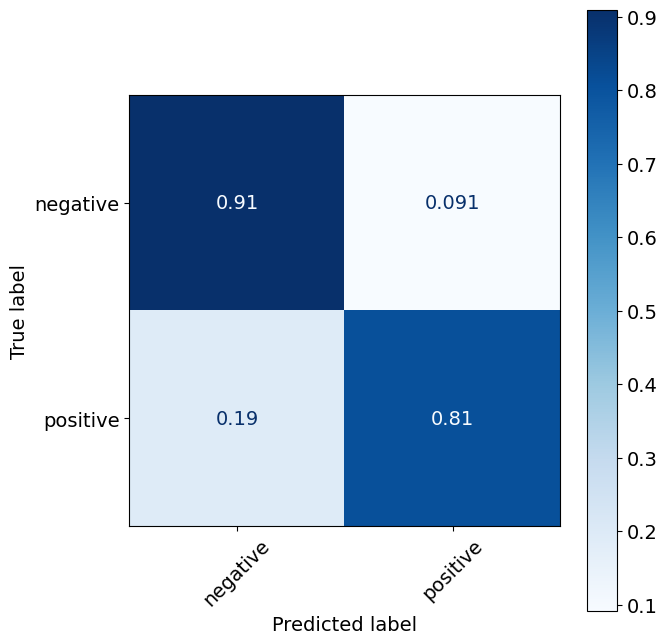

Evaluating model: Decision Tree for arousal
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.92      0.93      0.93        73
         low       0.95      0.94      0.94        99

    accuracy                           0.94       172
   macro avg       0.93      0.94      0.93       172
weighted avg       0.94      0.94      0.94       172

Confusion Matrix:
[[0.93150685 0.06849315]
 [0.06060606 0.93939394]]




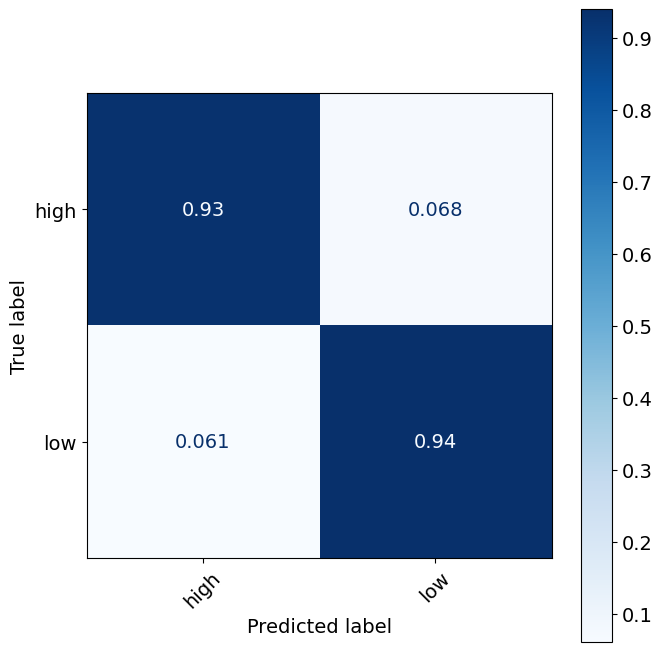

Evaluating model: Decision Tree for original classes
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.79      0.84      0.82        50
 frustration       0.84      0.73      0.78        49
     petting       0.94      0.90      0.92        49
         toy       0.79      0.96      0.87        24

    accuracy                           0.84       172
   macro avg       0.84      0.86      0.85       172
weighted avg       0.85      0.84      0.84       172

Confusion Matrix:
[[0.84       0.08       0.02       0.06      ]
 [0.18367347 0.73469388 0.04081633 0.04081633]
 [0.04081633 0.04081633 0.89795918 0.02040816]
 [0.         0.04166667 0.         0.95833333]]




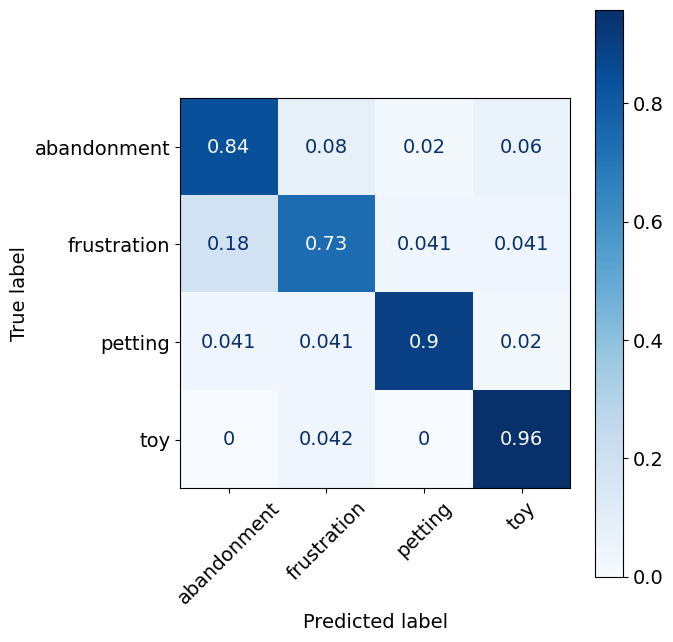

Evaluating model: Extra Trees for valence


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.96      0.99      0.98        99
    positive       0.99      0.95      0.97        73

    accuracy                           0.97       172
   macro avg       0.97      0.97      0.97       172
weighted avg       0.97      0.97      0.97       172

Confusion Matrix:
[[0.98989899 0.01010101]
 [0.05479452 0.94520548]]




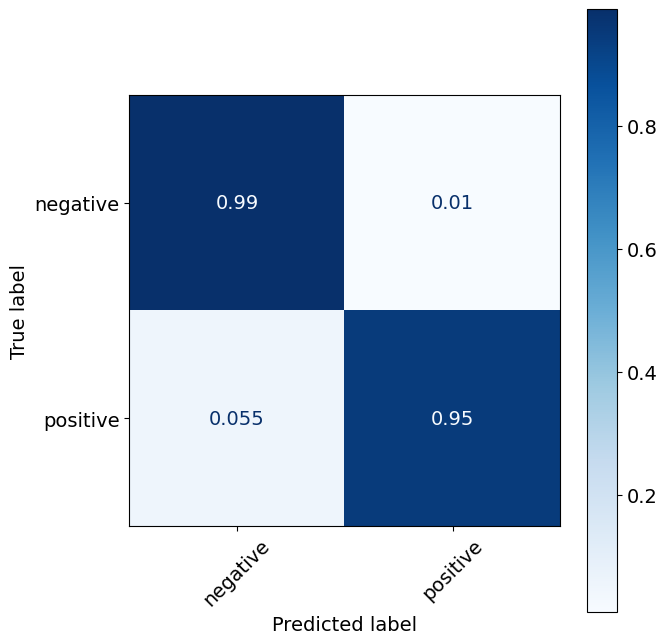

Evaluating model: Extra Trees for arousal


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.96      0.89      0.92        73
         low       0.92      0.97      0.95        99

    accuracy                           0.94       172
   macro avg       0.94      0.93      0.93       172
weighted avg       0.94      0.94      0.94       172

Confusion Matrix:
[[0.89041096 0.10958904]
 [0.03030303 0.96969697]]




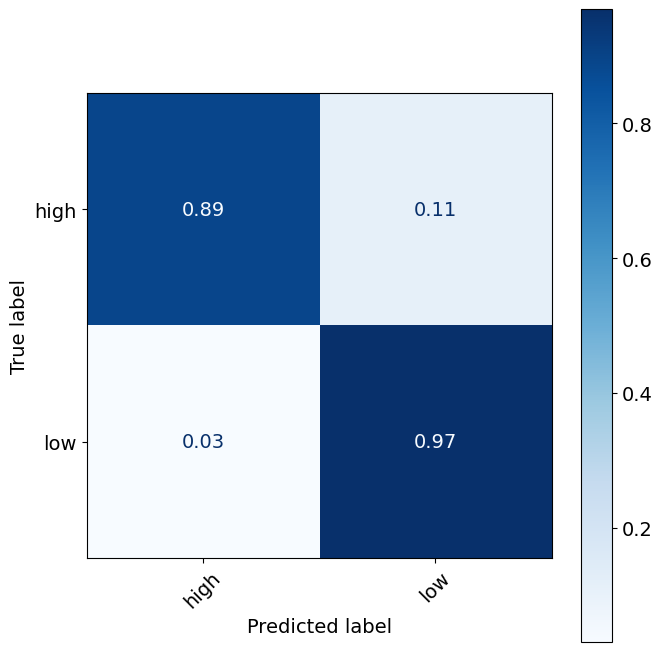

Evaluating model: Extra Trees for original classes


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.88      0.88      0.88        50
 frustration       0.87      0.92      0.89        49
     petting       0.98      0.98      0.98        49
         toy       1.00      0.88      0.93        24

    accuracy                           0.92       172
   macro avg       0.93      0.91      0.92       172
weighted avg       0.92      0.92      0.92       172

Confusion Matrix:
[[0.88       0.1        0.02       0.        ]
 [0.08163265 0.91836735 0.         0.        ]
 [0.02040816 0.         0.97959184 0.        ]
 [0.04166667 0.08333333 0.         0.875     ]]




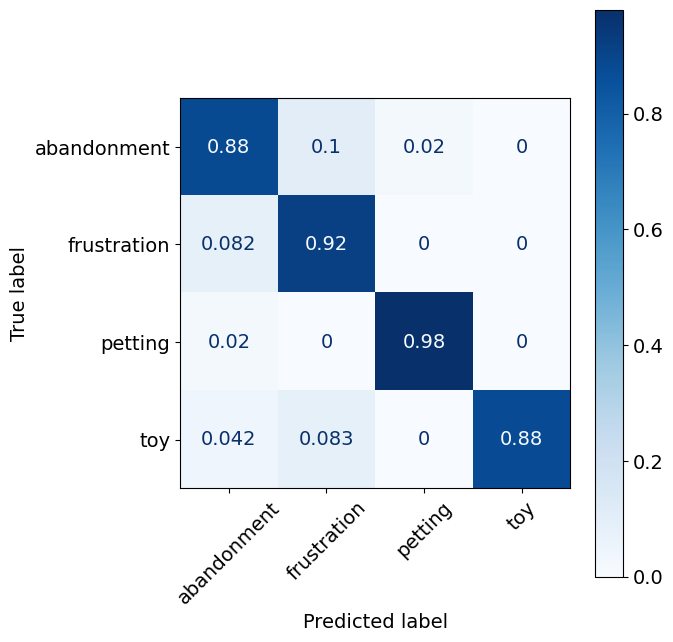

In [ ]:
evaluate_models(merged_df_imutemp)

Evaluating model: Naive Bayes for valence
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

    negative       0.76      0.91      0.83        55
    positive       0.83      0.60      0.70        40

    accuracy                           0.78        95
   macro avg       0.79      0.75      0.76        95
weighted avg       0.79      0.78      0.77        95

Confusion Matrix:
[[0.90909091 0.09090909]
 [0.4        0.6       ]]




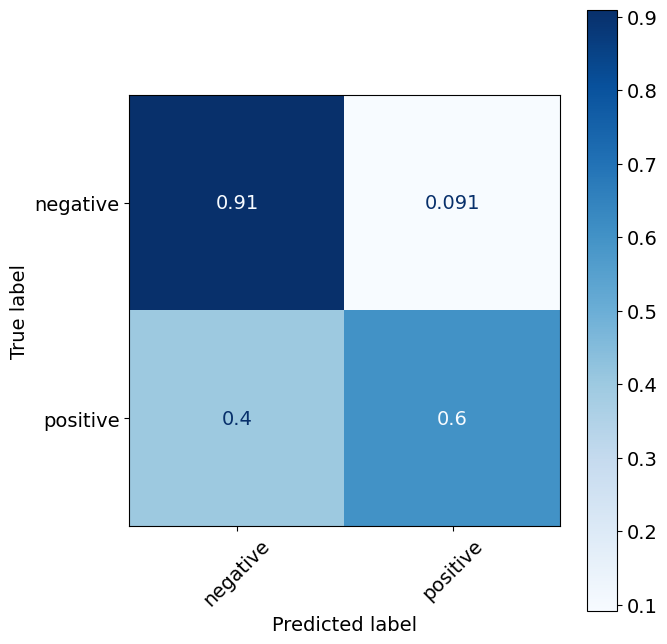

Evaluating model: Naive Bayes for arousal
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

        high       0.77      0.66      0.71        41
         low       0.77      0.85      0.81        54

    accuracy                           0.77        95
   macro avg       0.77      0.76      0.76        95
weighted avg       0.77      0.77      0.77        95

Confusion Matrix:
[[0.65853659 0.34146341]
 [0.14814815 0.85185185]]




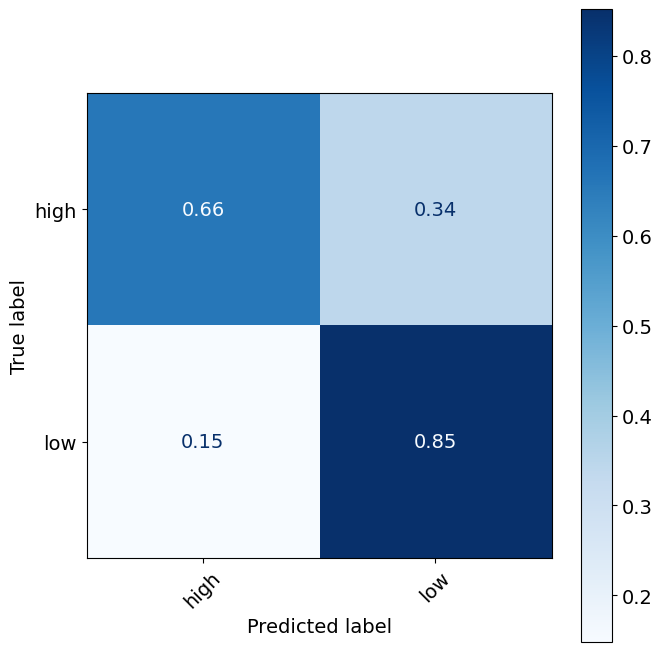

Evaluating model: Naive Bayes for original classes
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.85      0.83      0.84        35
 frustration       0.73      0.80      0.76        20
     petting       0.83      0.79      0.81        19
         toy       0.90      0.90      0.90        21

    accuracy                           0.83        95
   macro avg       0.83      0.83      0.83        95
weighted avg       0.83      0.83      0.83        95

Confusion Matrix:
[[0.82857143 0.14285714 0.02857143 0.        ]
 [0.05       0.8        0.1        0.05      ]
 [0.10526316 0.05263158 0.78947368 0.05263158]
 [0.0952381  0.         0.         0.9047619 ]]




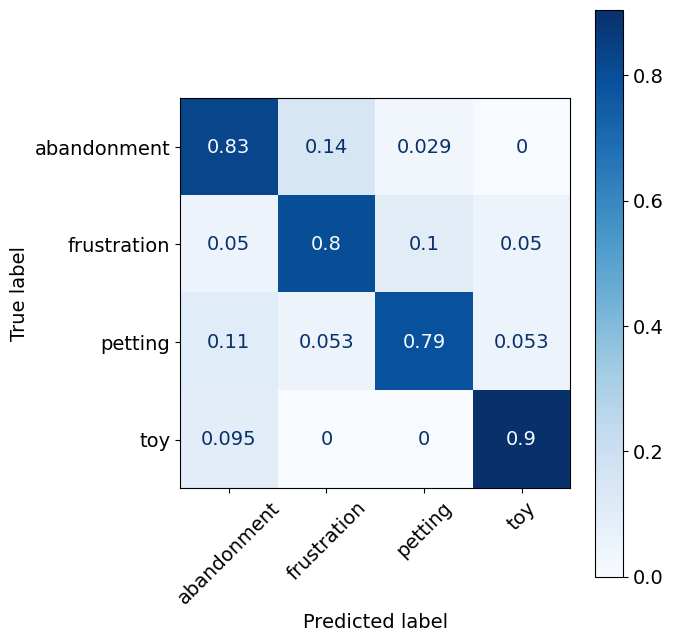

Evaluating model: KNN for valence
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.84      0.89      0.87        55
    positive       0.84      0.78      0.81        40

    accuracy                           0.84        95
   macro avg       0.84      0.83      0.84        95
weighted avg       0.84      0.84      0.84        95

Confusion Matrix:
[[0.89090909 0.10909091]
 [0.225      0.775     ]]




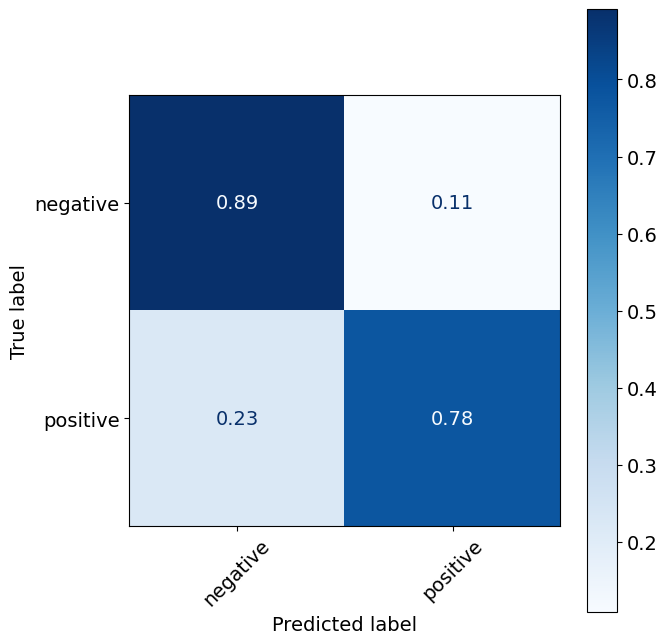

Evaluating model: KNN for arousal
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.81      0.73      0.77        41
         low       0.81      0.87      0.84        54

    accuracy                           0.81        95
   macro avg       0.81      0.80      0.80        95
weighted avg       0.81      0.81      0.81        95

Confusion Matrix:
[[0.73170732 0.26829268]
 [0.12962963 0.87037037]]




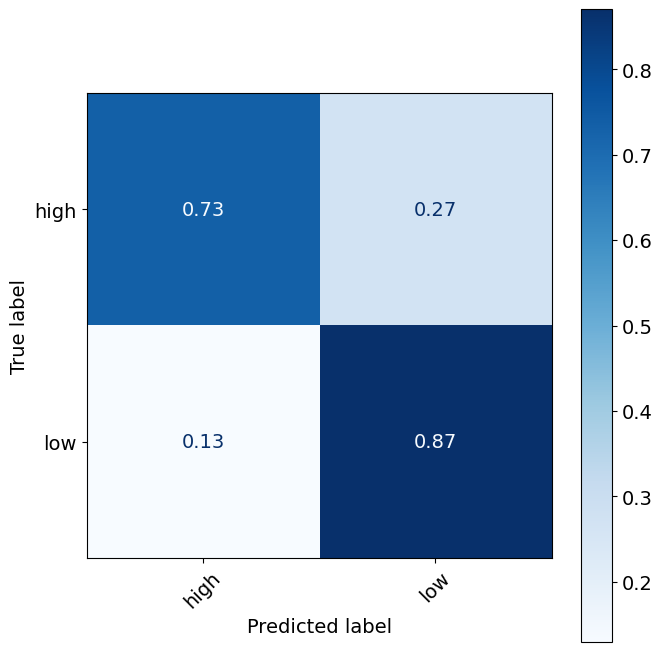

Evaluating model: KNN for original classes
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.75      0.86      0.80        35
 frustration       0.63      0.60      0.62        20
     petting       0.72      0.68      0.70        19
         toy       0.89      0.76      0.82        21

    accuracy                           0.75        95
   macro avg       0.75      0.73      0.73        95
weighted avg       0.75      0.75      0.75        95

Confusion Matrix:
[[0.85714286 0.08571429 0.05714286 0.        ]
 [0.2        0.6        0.15       0.05      ]
 [0.15789474 0.10526316 0.68421053 0.05263158]
 [0.14285714 0.0952381  0.         0.76190476]]




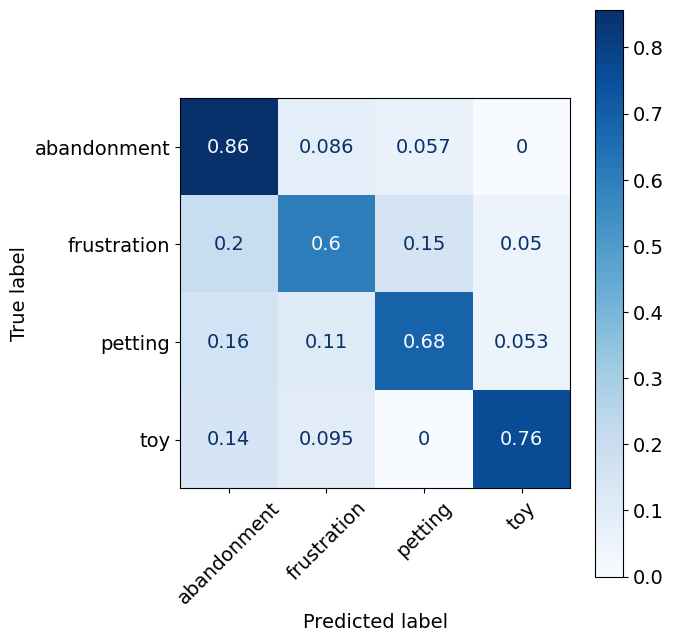

Evaluating model: SVM for valence
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.95      0.91        55
    positive       0.92      0.82      0.87        40

    accuracy                           0.89        95
   macro avg       0.90      0.89      0.89        95
weighted avg       0.90      0.89      0.89        95

Confusion Matrix:
[[0.94545455 0.05454545]
 [0.175      0.825     ]]




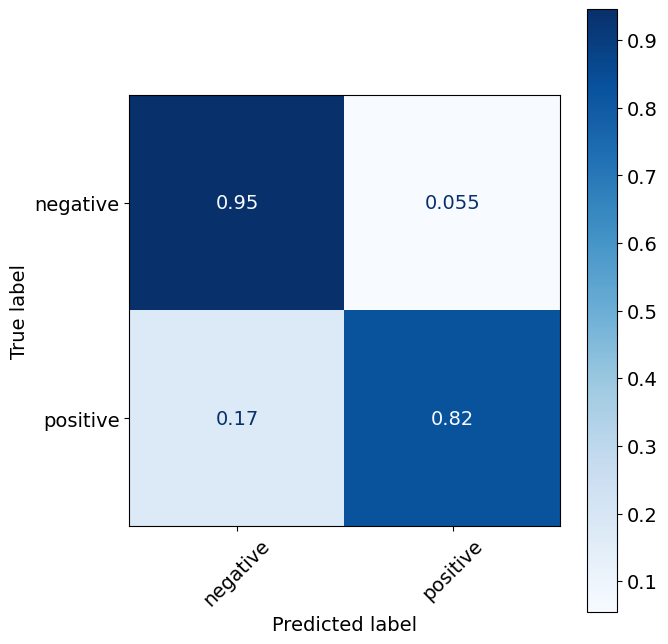

Evaluating model: SVM for arousal
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

        high       0.82      0.56      0.67        41
         low       0.73      0.91      0.81        54

    accuracy                           0.76        95
   macro avg       0.78      0.73      0.74        95
weighted avg       0.77      0.76      0.75        95

Confusion Matrix:
[[0.56097561 0.43902439]
 [0.09259259 0.90740741]]




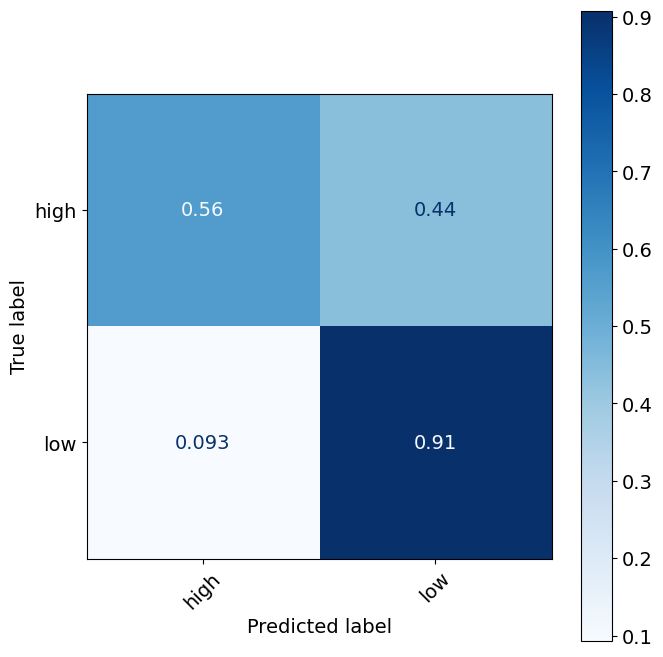

Evaluating model: SVM for original classes
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.65      0.91      0.76        35
 frustration       0.60      0.30      0.40        20
     petting       0.79      0.58      0.67        19
         toy       0.86      0.90      0.88        21

    accuracy                           0.72        95
   macro avg       0.73      0.67      0.68        95
weighted avg       0.71      0.72      0.69        95

Confusion Matrix:
[[0.91428571 0.02857143 0.02857143 0.02857143]
 [0.55       0.3        0.1        0.05      ]
 [0.21052632 0.15789474 0.57894737 0.05263158]
 [0.0952381  0.         0.         0.9047619 ]]




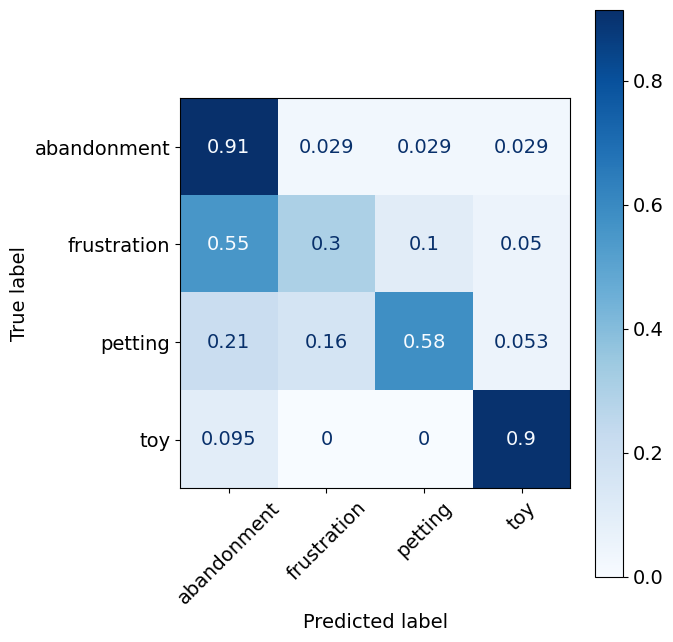

Evaluating model: Decision Tree for valence
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.89      0.85      0.87        55
    positive       0.81      0.85      0.83        40

    accuracy                           0.85        95
   macro avg       0.85      0.85      0.85        95
weighted avg       0.85      0.85      0.85        95

Confusion Matrix:
[[0.85454545 0.14545455]
 [0.15       0.85      ]]




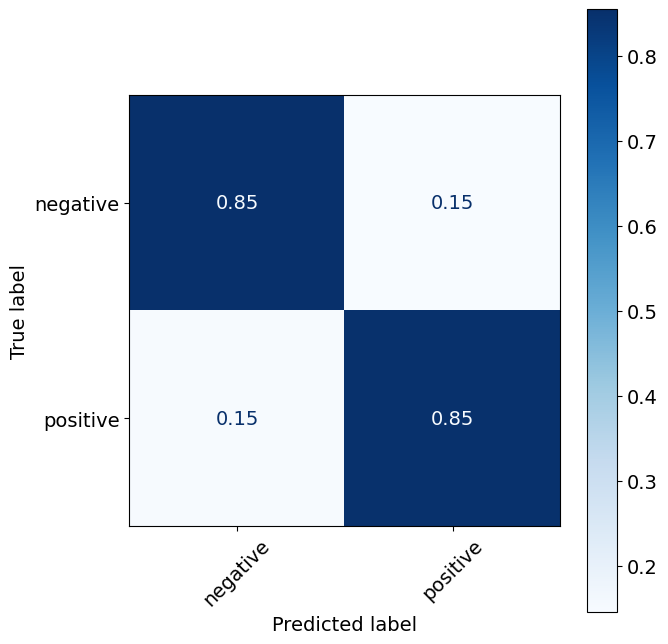

Evaluating model: Decision Tree for arousal
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.73      0.78      0.75        41
         low       0.82      0.78      0.80        54

    accuracy                           0.78        95
   macro avg       0.78      0.78      0.78        95
weighted avg       0.78      0.78      0.78        95

Confusion Matrix:
[[0.7804878  0.2195122 ]
 [0.22222222 0.77777778]]




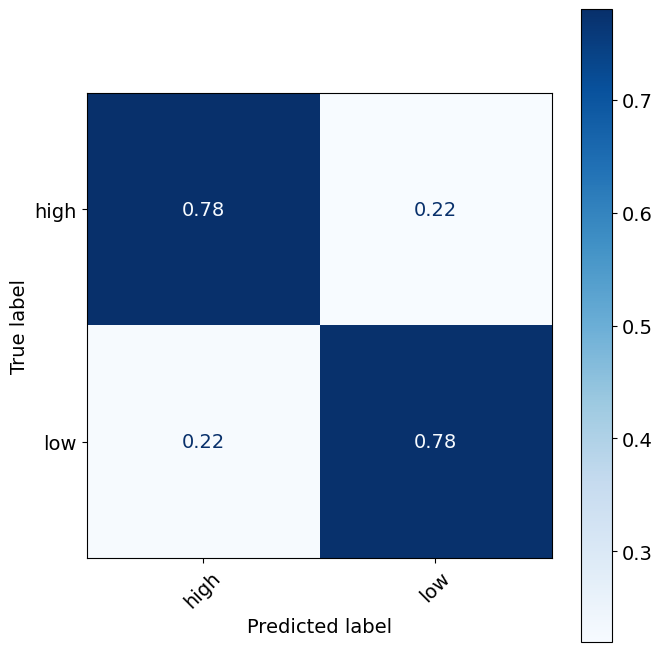

Evaluating model: Decision Tree for original classes
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.76      0.74      0.75        35
 frustration       0.55      0.60      0.57        20
     petting       0.76      0.68      0.72        19
         toy       0.82      0.86      0.84        21

    accuracy                           0.73        95
   macro avg       0.72      0.72      0.72        95
weighted avg       0.73      0.73      0.73        95

Confusion Matrix:
[[0.74285714 0.17142857 0.05714286 0.02857143]
 [0.25       0.6        0.1        0.05      ]
 [0.10526316 0.10526316 0.68421053 0.10526316]
 [0.04761905 0.0952381  0.         0.85714286]]




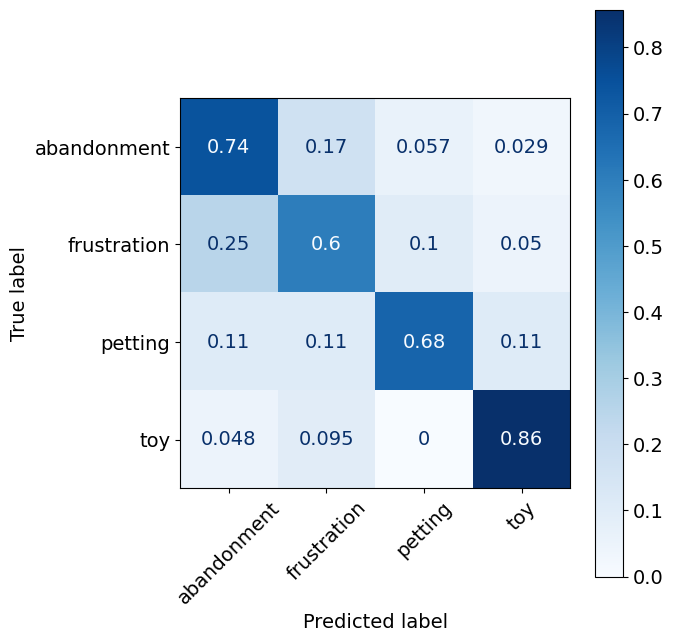

Evaluating model: Extra Trees for valence


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.93      1.00      0.96        55
    positive       1.00      0.90      0.95        40

    accuracy                           0.96        95
   macro avg       0.97      0.95      0.96        95
weighted avg       0.96      0.96      0.96        95

Confusion Matrix:
[[1.  0. ]
 [0.1 0.9]]




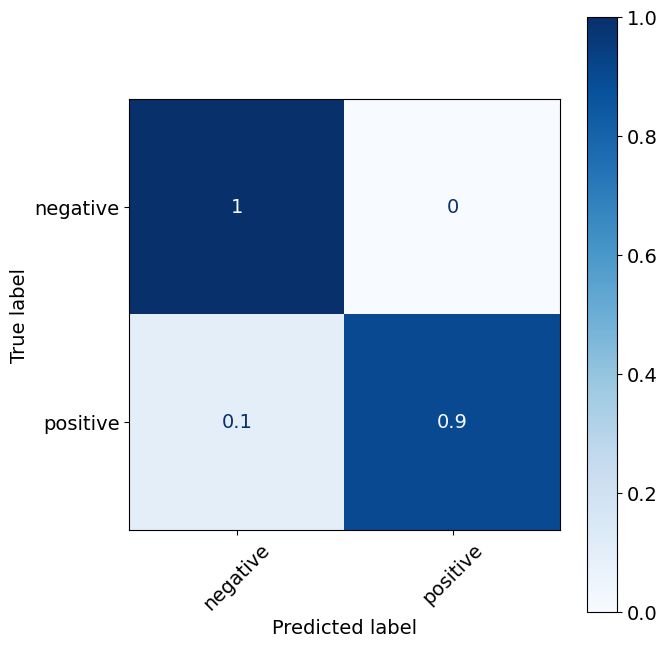

Evaluating model: Extra Trees for arousal


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.92      0.88      0.90        41
         low       0.91      0.94      0.93        54

    accuracy                           0.92        95
   macro avg       0.92      0.91      0.91        95
weighted avg       0.92      0.92      0.92        95

Confusion Matrix:
[[0.87804878 0.12195122]
 [0.05555556 0.94444444]]




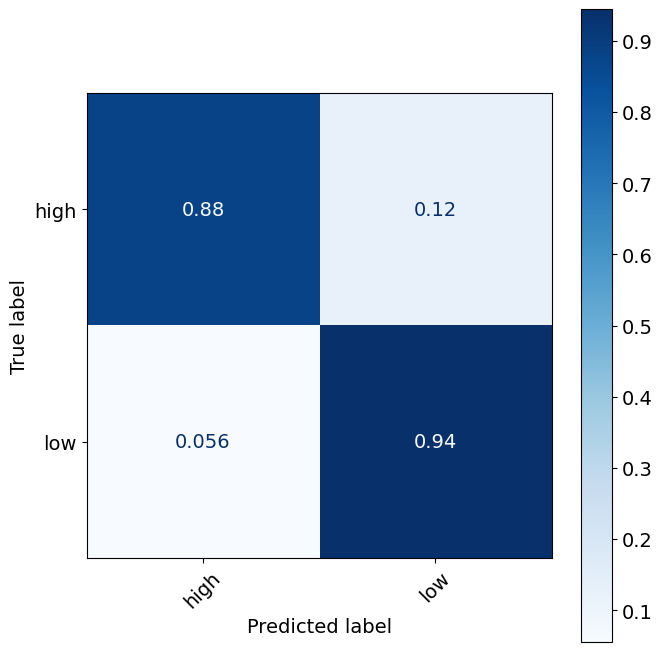

Evaluating model: Extra Trees for original classes


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.97      0.97      0.97        35
 frustration       0.91      1.00      0.95        20
     petting       1.00      0.89      0.94        19
         toy       0.95      0.95      0.95        21

    accuracy                           0.96        95
   macro avg       0.96      0.95      0.96        95
weighted avg       0.96      0.96      0.96        95

Confusion Matrix:
[[0.97142857 0.02857143 0.         0.        ]
 [0.         1.         0.         0.        ]
 [0.         0.05263158 0.89473684 0.05263158]
 [0.04761905 0.         0.         0.95238095]]




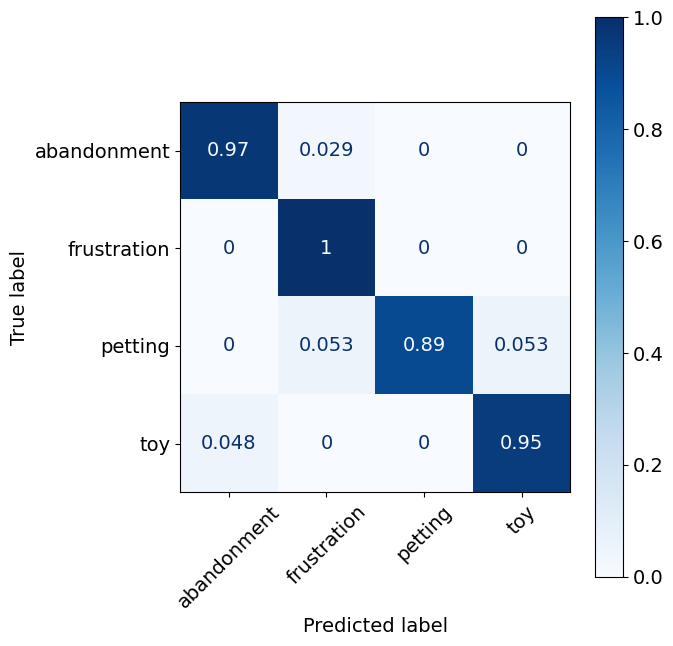

In [ ]:
evaluate_models(merged_df_imupolarvisual)

Evaluating model: Naive Bayes for valence
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

    negative       0.71      0.92      0.80        60
    positive       0.83      0.53      0.65        47

    accuracy                           0.75       107
   macro avg       0.77      0.72      0.73       107
weighted avg       0.77      0.75      0.74       107

Confusion Matrix:
[[0.91666667 0.08333333]
 [0.46808511 0.53191489]]




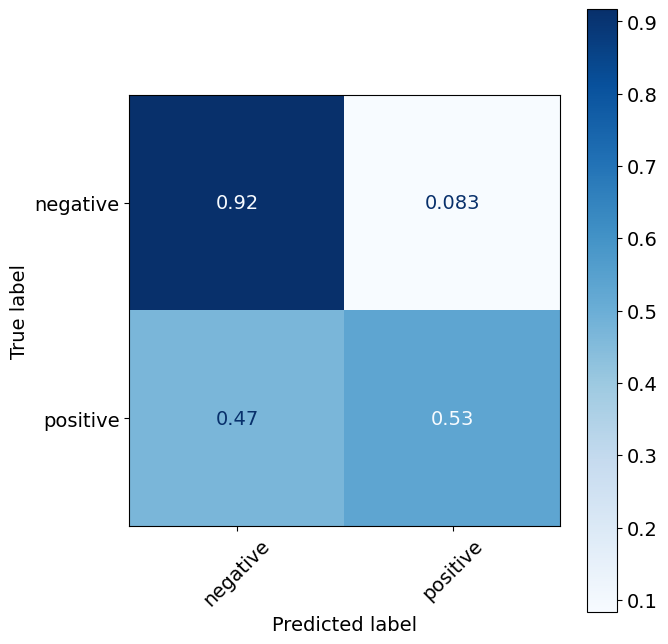

Evaluating model: Naive Bayes for arousal
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

        high       0.84      0.66      0.74        47
         low       0.77      0.90      0.83        60

    accuracy                           0.79       107
   macro avg       0.80      0.78      0.78       107
weighted avg       0.80      0.79      0.79       107

Confusion Matrix:
[[0.65957447 0.34042553]
 [0.1        0.9       ]]




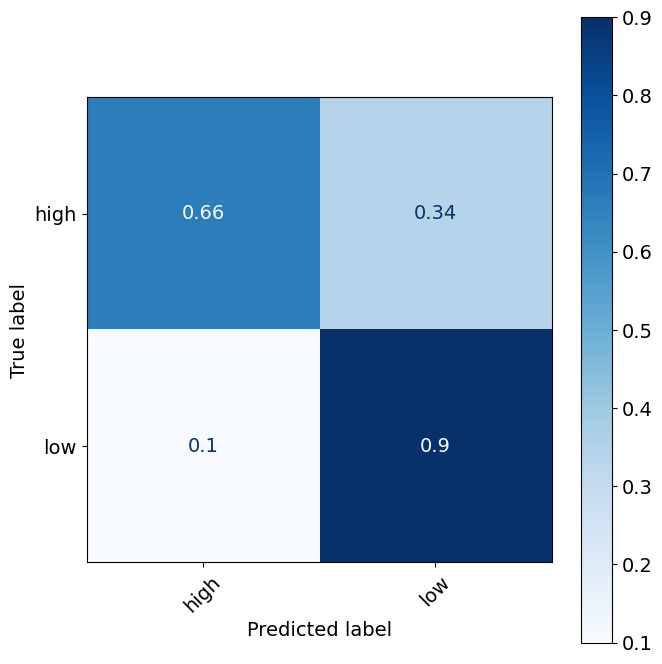

Evaluating model: Naive Bayes for original classes
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.72      0.72      0.72        36
 frustration       0.62      0.67      0.64        24
     petting       0.81      0.71      0.76        24
         toy       0.92      0.96      0.94        23

    accuracy                           0.76       107
   macro avg       0.77      0.76      0.76       107
weighted avg       0.76      0.76      0.76       107

Confusion Matrix:
[[0.72222222 0.19444444 0.08333333 0.        ]
 [0.25       0.66666667 0.04166667 0.04166667]
 [0.125      0.125      0.70833333 0.04166667]
 [0.04347826 0.         0.         0.95652174]]




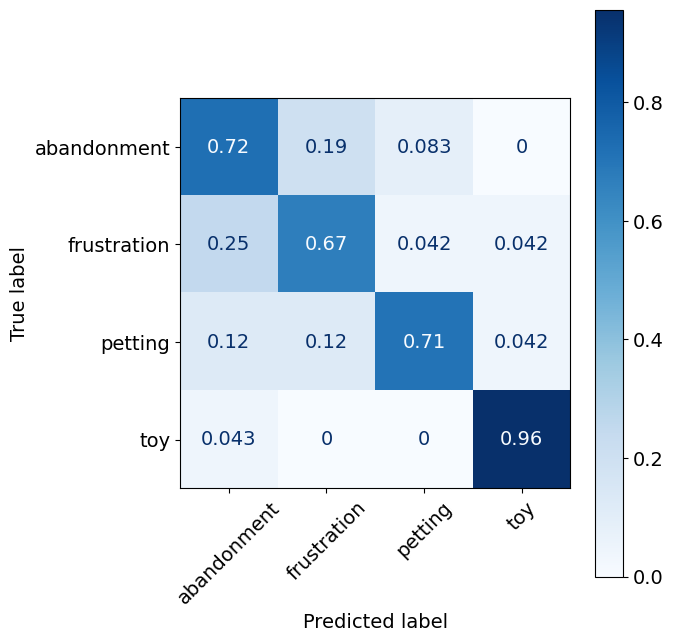

Evaluating model: KNN for valence
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.82      0.92      0.87        60
    positive       0.88      0.74      0.80        47

    accuracy                           0.84       107
   macro avg       0.85      0.83      0.84       107
weighted avg       0.84      0.84      0.84       107

Confusion Matrix:
[[0.91666667 0.08333333]
 [0.25531915 0.74468085]]




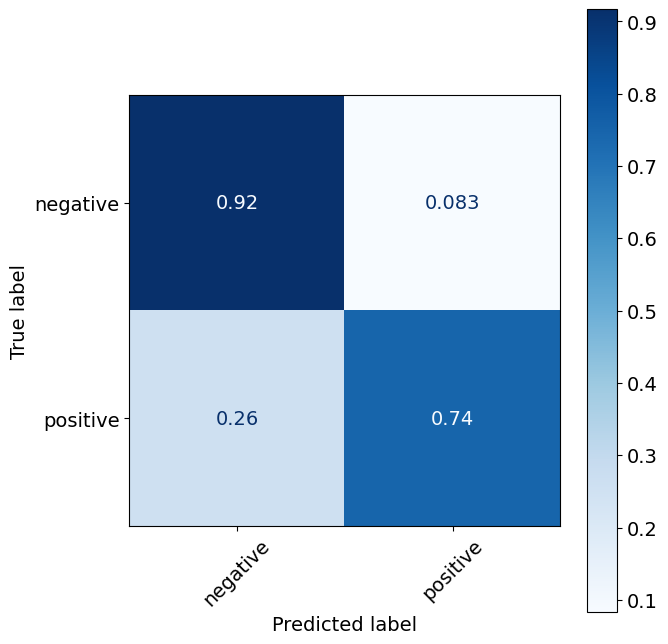

Evaluating model: KNN for arousal
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.81      0.74      0.78        47
         low       0.81      0.87      0.84        60

    accuracy                           0.81       107
   macro avg       0.81      0.81      0.81       107
weighted avg       0.81      0.81      0.81       107

Confusion Matrix:
[[0.74468085 0.25531915]
 [0.13333333 0.86666667]]




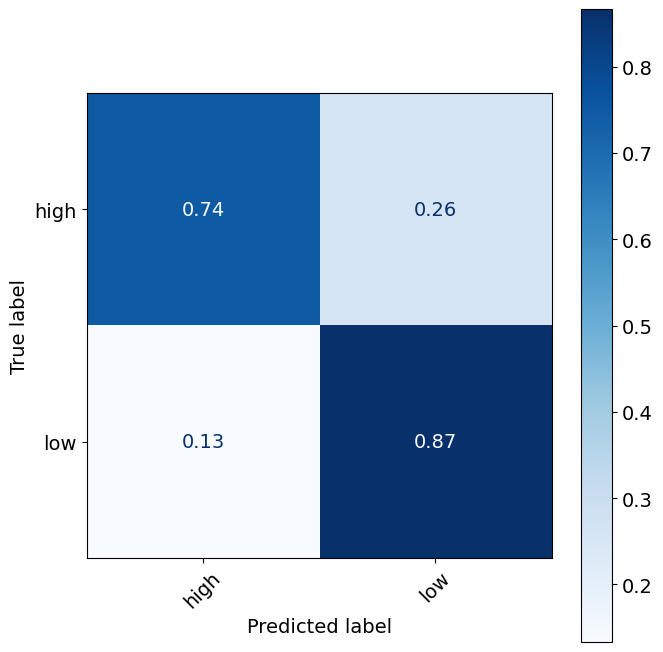

Evaluating model: KNN for original classes
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.67      0.78      0.72        36
 frustration       0.64      0.58      0.61        24
     petting       0.70      0.67      0.68        24
         toy       0.90      0.78      0.84        23

    accuracy                           0.71       107
   macro avg       0.72      0.70      0.71       107
weighted avg       0.72      0.71      0.71       107

Confusion Matrix:
[[0.77777778 0.13888889 0.08333333 0.        ]
 [0.25       0.58333333 0.125      0.04166667]
 [0.20833333 0.08333333 0.66666667 0.04166667]
 [0.13043478 0.04347826 0.04347826 0.7826087 ]]




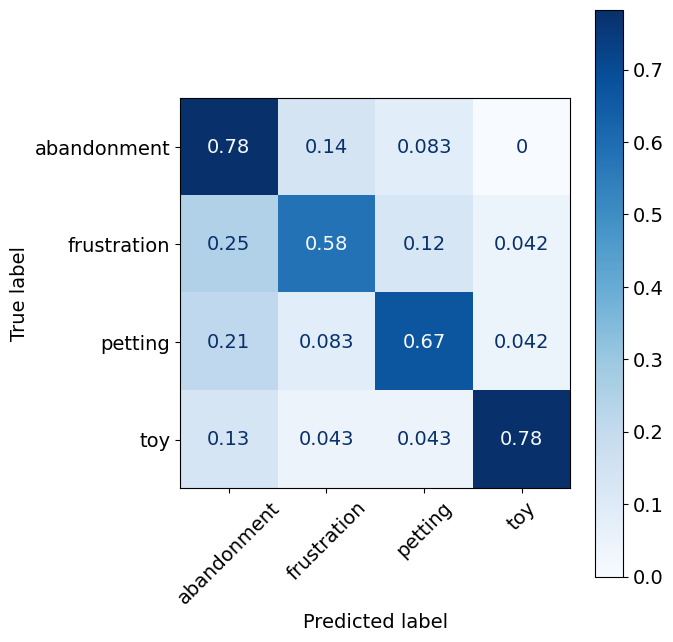

Evaluating model: SVM for valence
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

    negative       0.82      0.93      0.87        60
    positive       0.90      0.74      0.81        47

    accuracy                           0.85       107
   macro avg       0.86      0.84      0.84       107
weighted avg       0.86      0.85      0.85       107

Confusion Matrix:
[[0.93333333 0.06666667]
 [0.25531915 0.74468085]]




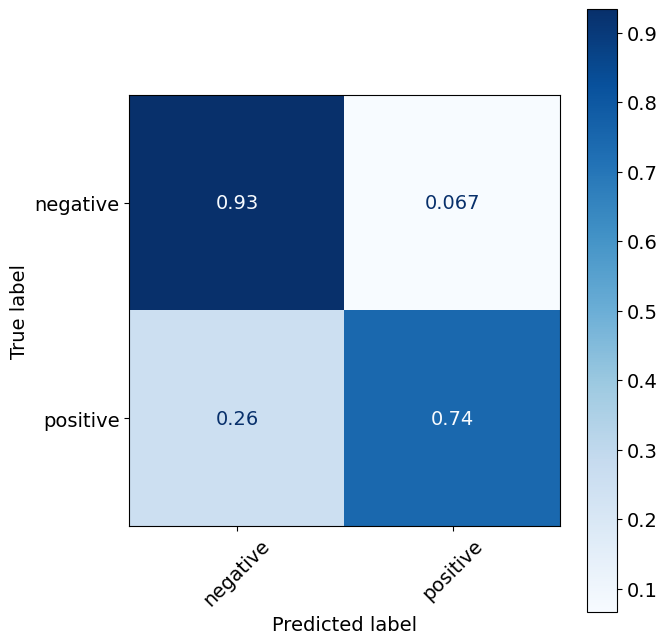

Evaluating model: SVM for arousal
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

        high       0.82      0.60      0.69        47
         low       0.74      0.90      0.81        60

    accuracy                           0.77       107
   macro avg       0.78      0.75      0.75       107
weighted avg       0.78      0.77      0.76       107

Confusion Matrix:
[[0.59574468 0.40425532]
 [0.1        0.9       ]]




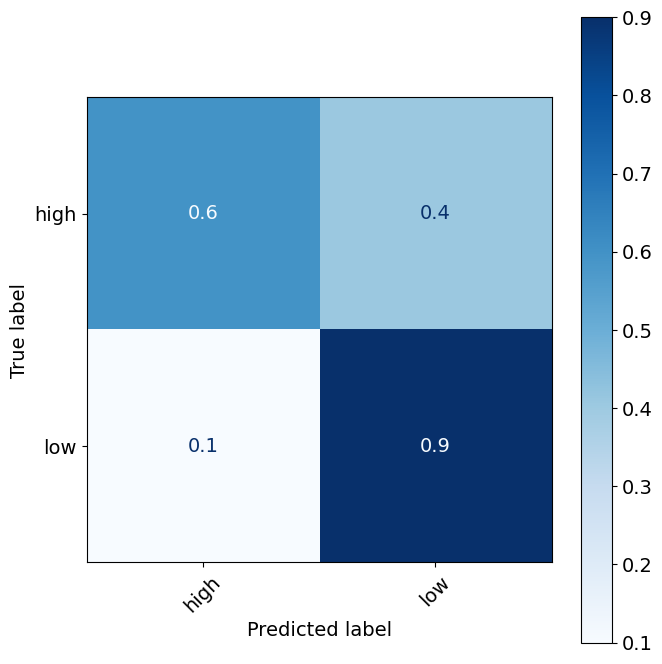

Evaluating model: SVM for original classes
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.50      0.92      0.65        36
 frustration       0.33      0.08      0.13        24
     petting       1.00      0.50      0.67        24
         toy       0.87      0.87      0.87        23

    accuracy                           0.63       107
   macro avg       0.68      0.59      0.58       107
weighted avg       0.65      0.63      0.58       107

Confusion Matrix:
[[0.91666667 0.08333333 0.         0.        ]
 [0.83333333 0.08333333 0.         0.08333333]
 [0.41666667 0.04166667 0.5        0.04166667]
 [0.13043478 0.         0.         0.86956522]]




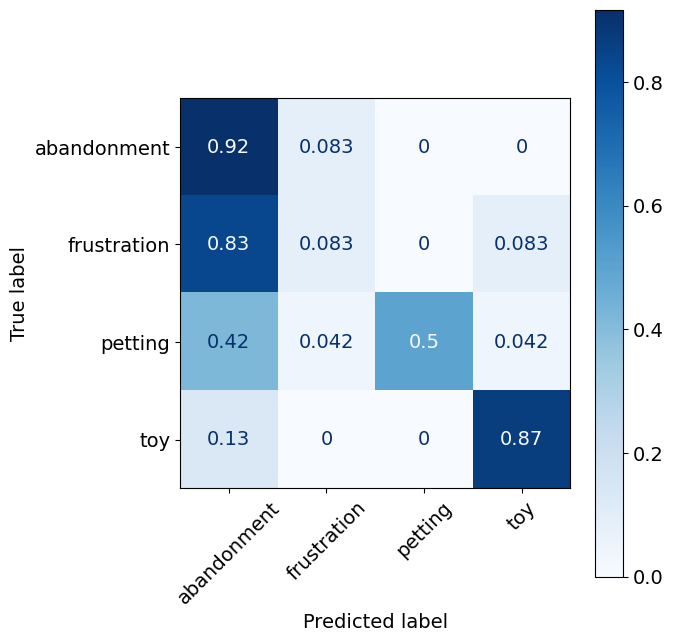

Evaluating model: Decision Tree for valence
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.74      0.82      0.78        60
    positive       0.73      0.64      0.68        47

    accuracy                           0.74       107
   macro avg       0.74      0.73      0.73       107
weighted avg       0.74      0.74      0.74       107

Confusion Matrix:
[[0.81666667 0.18333333]
 [0.36170213 0.63829787]]




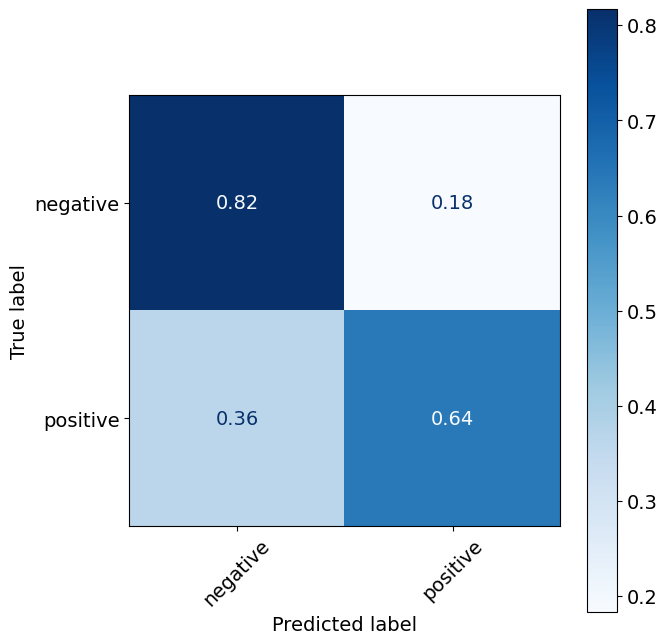

Evaluating model: Decision Tree for arousal
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.71      0.68      0.70        47
         low       0.76      0.78      0.77        60

    accuracy                           0.74       107
   macro avg       0.73      0.73      0.73       107
weighted avg       0.74      0.74      0.74       107

Confusion Matrix:
[[0.68085106 0.31914894]
 [0.21666667 0.78333333]]




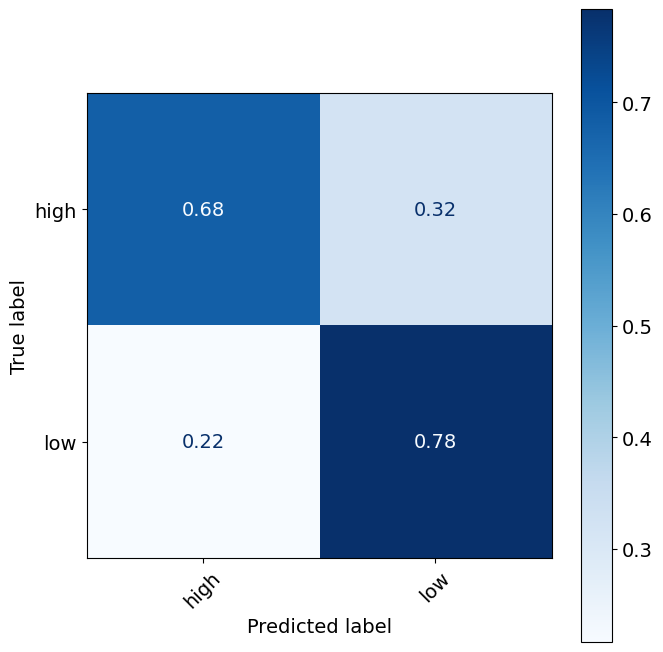

Evaluating model: Decision Tree for original classes
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.78      0.69      0.74        36
 frustration       0.68      0.79      0.73        24
     petting       0.74      0.71      0.72        24
         toy       0.88      0.91      0.89        23

    accuracy                           0.77       107
   macro avg       0.77      0.78      0.77       107
weighted avg       0.77      0.77      0.77       107

Confusion Matrix:
[[0.69444444 0.13888889 0.13888889 0.02777778]
 [0.16666667 0.79166667 0.         0.04166667]
 [0.08333333 0.16666667 0.70833333 0.04166667]
 [0.04347826 0.         0.04347826 0.91304348]]




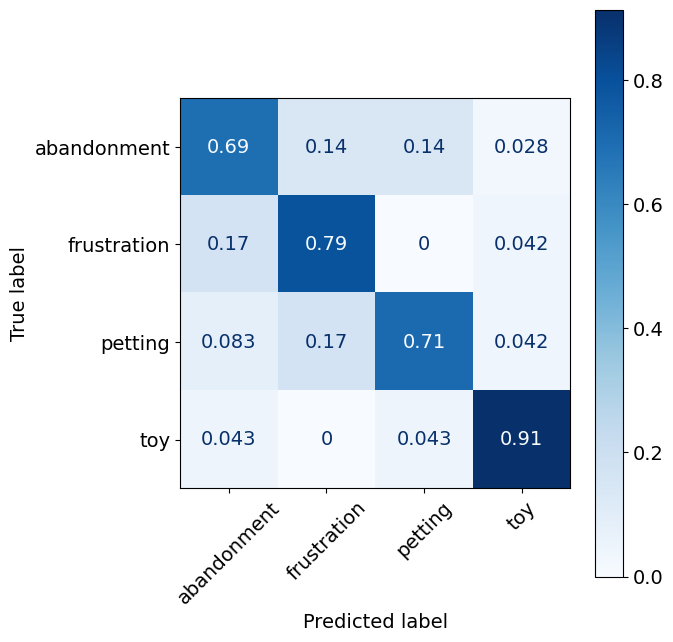

Evaluating model: Extra Trees for valence


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.97      0.92        60
    positive       0.95      0.83      0.89        47

    accuracy                           0.91       107
   macro avg       0.92      0.90      0.90       107
weighted avg       0.91      0.91      0.91       107

Confusion Matrix:
[[0.96666667 0.03333333]
 [0.17021277 0.82978723]]




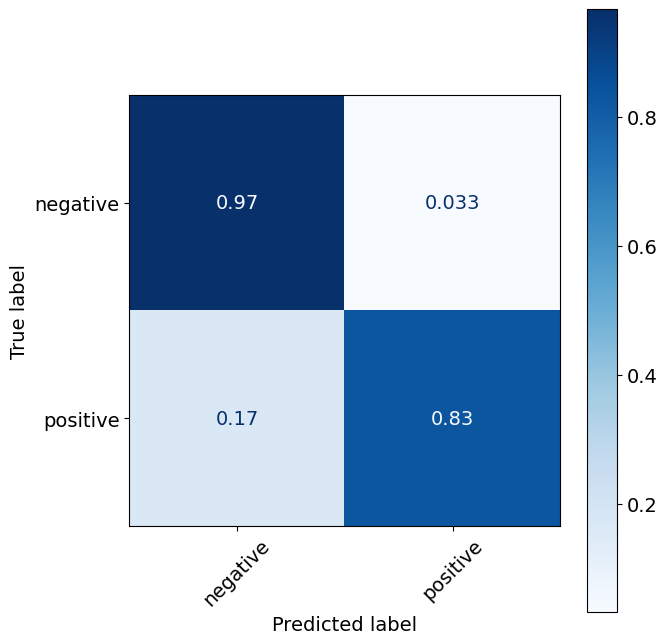

Evaluating model: Extra Trees for arousal


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.93      0.85      0.89        47
         low       0.89      0.95      0.92        60

    accuracy                           0.91       107
   macro avg       0.91      0.90      0.90       107
weighted avg       0.91      0.91      0.91       107

Confusion Matrix:
[[0.85106383 0.14893617]
 [0.05       0.95      ]]




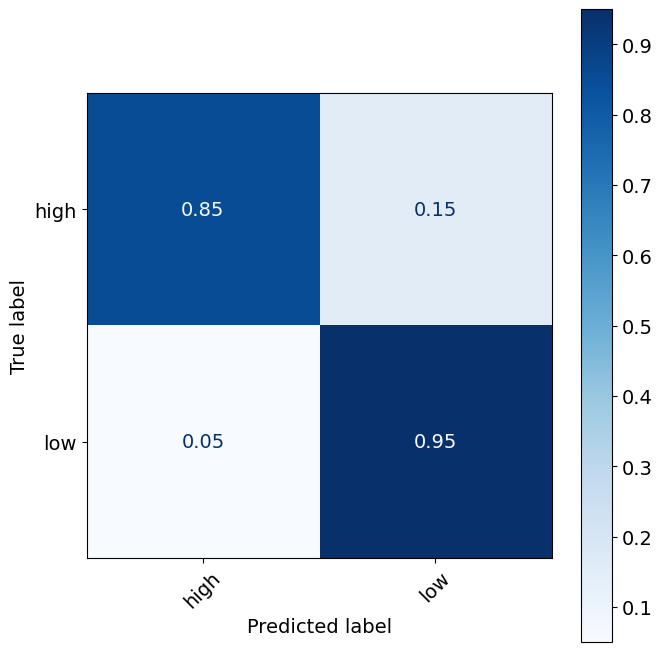

Evaluating model: Extra Trees for original classes


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.90      0.97      0.93        36
 frustration       0.87      0.83      0.85        24
     petting       1.00      0.88      0.93        24
         toy       0.92      0.96      0.94        23

    accuracy                           0.92       107
   macro avg       0.92      0.91      0.91       107
weighted avg       0.92      0.92      0.92       107

Confusion Matrix:
[[0.97222222 0.02777778 0.         0.        ]
 [0.125      0.83333333 0.         0.04166667]
 [0.         0.08333333 0.875      0.04166667]
 [0.04347826 0.         0.         0.95652174]]




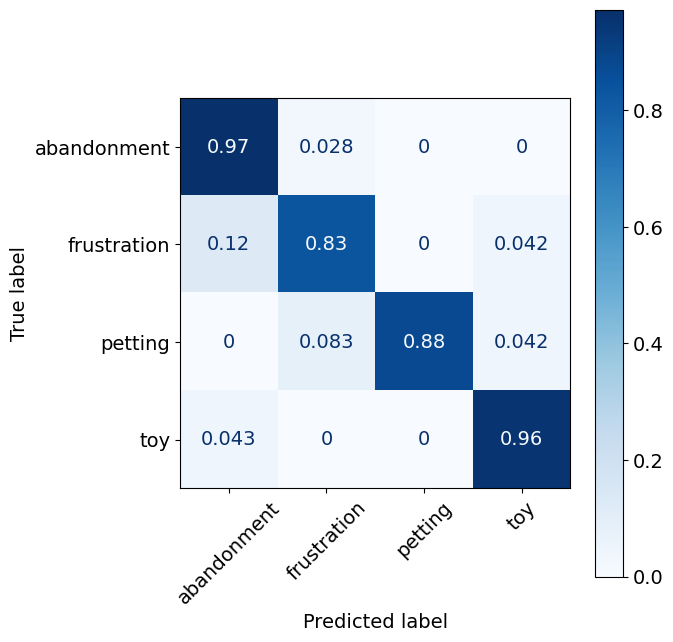

In [ ]:
evaluate_models(merged_df_visualimu)

Evaluating model: Naive Bayes for valence
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

    negative       0.58      0.76      0.66        54
    positive       0.43      0.25      0.32        40

    accuracy                           0.54        94
   macro avg       0.51      0.50      0.49        94
weighted avg       0.52      0.54      0.51        94

Confusion Matrix:
[[0.75925926 0.24074074]
 [0.75       0.25      ]]




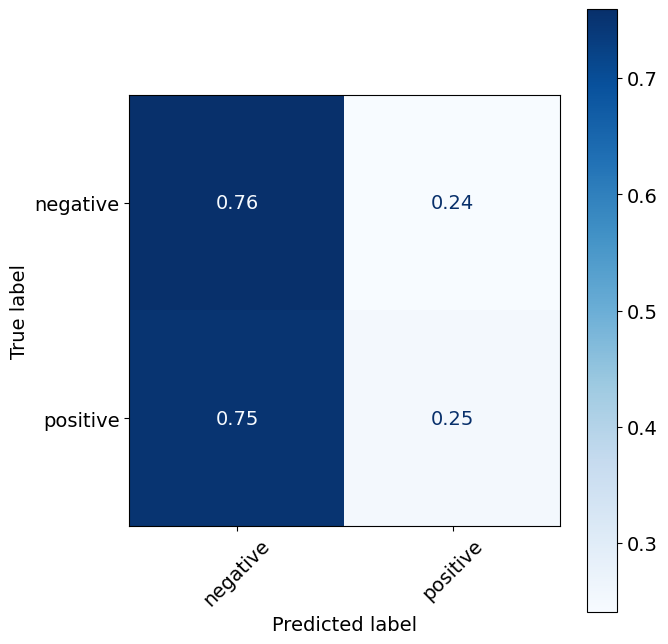

Evaluating model: Naive Bayes for arousal
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

        high       0.72      0.32      0.44        41
         low       0.63      0.91      0.74        53

    accuracy                           0.65        94
   macro avg       0.68      0.61      0.59        94
weighted avg       0.67      0.65      0.61        94

Confusion Matrix:
[[0.31707317 0.68292683]
 [0.09433962 0.90566038]]




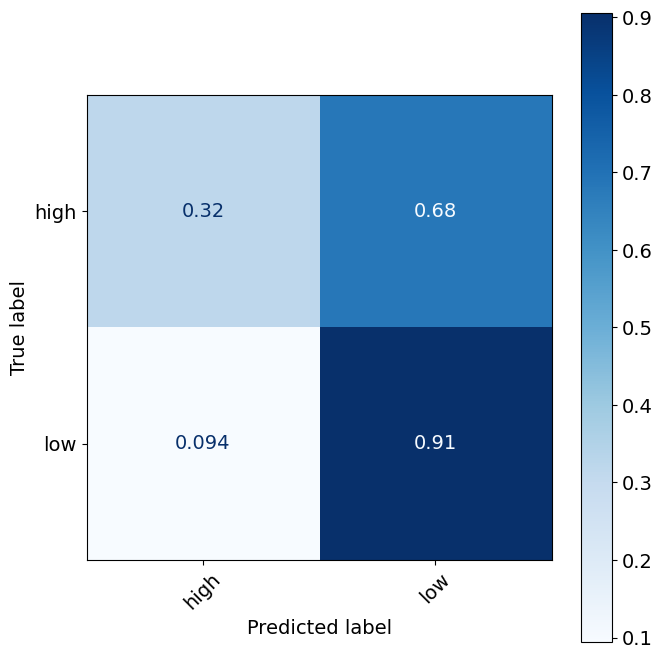

Evaluating model: Naive Bayes for original classes
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.90      0.56      0.69        34
 frustration       0.45      0.50      0.48        20
     petting       0.30      0.68      0.42        19
         toy       0.88      0.33      0.48        21

    accuracy                           0.52        94
   macro avg       0.63      0.52      0.52        94
weighted avg       0.68      0.52      0.54        94

Confusion Matrix:
[[0.55882353 0.14705882 0.26470588 0.02941176]
 [0.         0.5        0.5        0.        ]
 [0.05263158 0.26315789 0.68421053 0.        ]
 [0.04761905 0.0952381  0.52380952 0.33333333]]




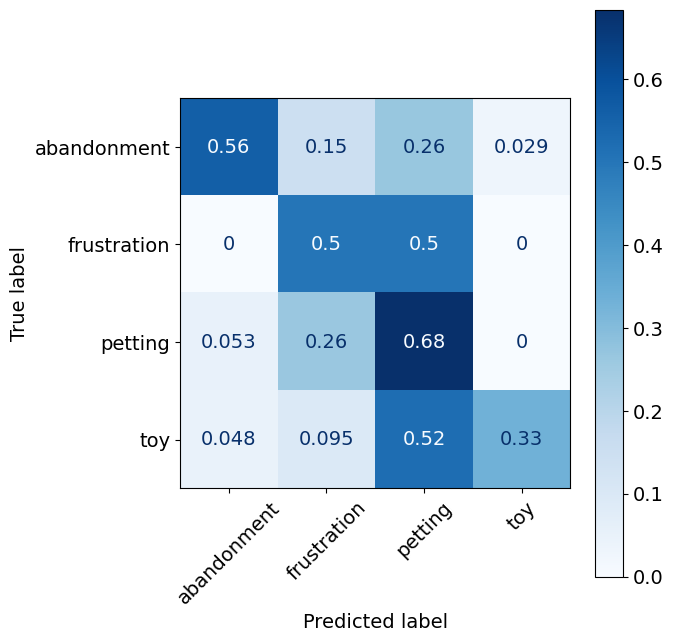

Evaluating model: KNN for valence
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.72      0.80      0.75        54
    positive       0.68      0.57      0.62        40

    accuracy                           0.70        94
   macro avg       0.70      0.69      0.69        94
weighted avg       0.70      0.70      0.70        94

Confusion Matrix:
[[0.7962963 0.2037037]
 [0.425     0.575    ]]




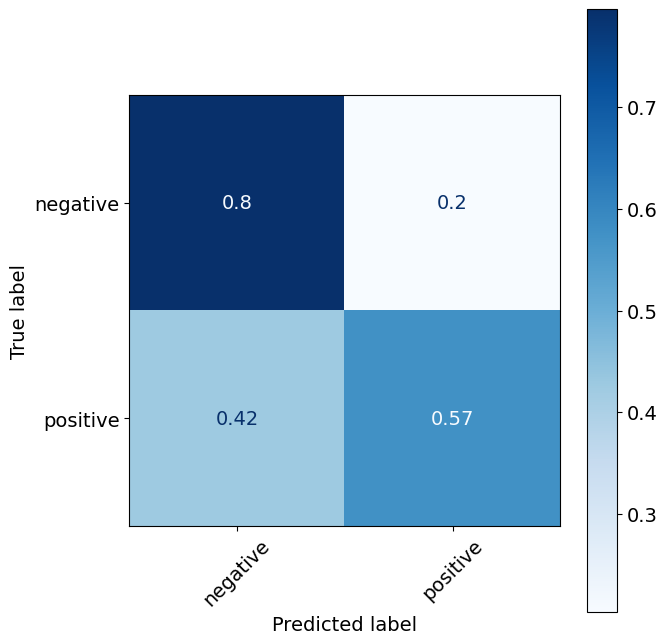

Evaluating model: KNN for arousal
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.54      0.54      0.54        41
         low       0.64      0.64      0.64        53

    accuracy                           0.60        94
   macro avg       0.59      0.59      0.59        94
weighted avg       0.60      0.60      0.60        94

Confusion Matrix:
[[0.53658537 0.46341463]
 [0.35849057 0.64150943]]




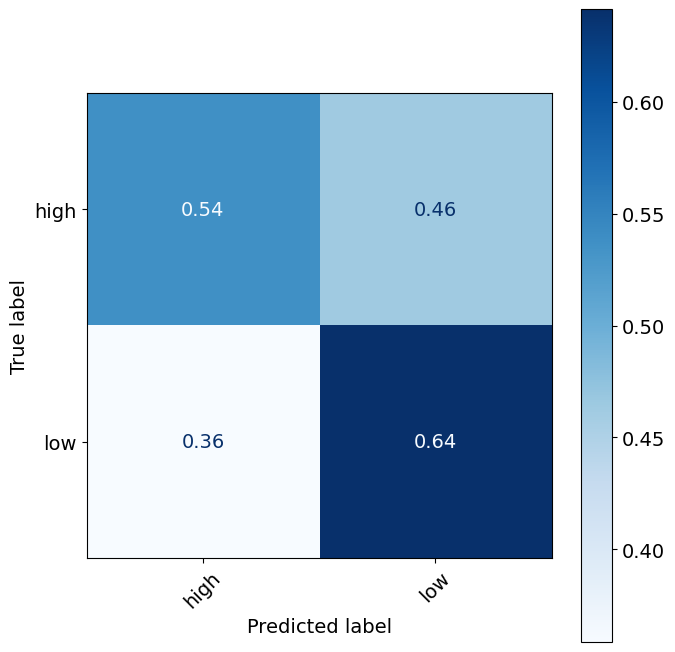

Evaluating model: KNN for original classes
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.58      0.65      0.61        34
 frustration       0.57      0.60      0.59        20
     petting       0.58      0.58      0.58        19
         toy       0.38      0.29      0.32        21

    accuracy                           0.54        94
   macro avg       0.53      0.53      0.52        94
weighted avg       0.53      0.54      0.54        94

Confusion Matrix:
[[0.64705882 0.08823529 0.05882353 0.20588235]
 [0.15       0.6        0.2        0.05      ]
 [0.10526316 0.21052632 0.57894737 0.10526316]
 [0.52380952 0.0952381  0.0952381  0.28571429]]




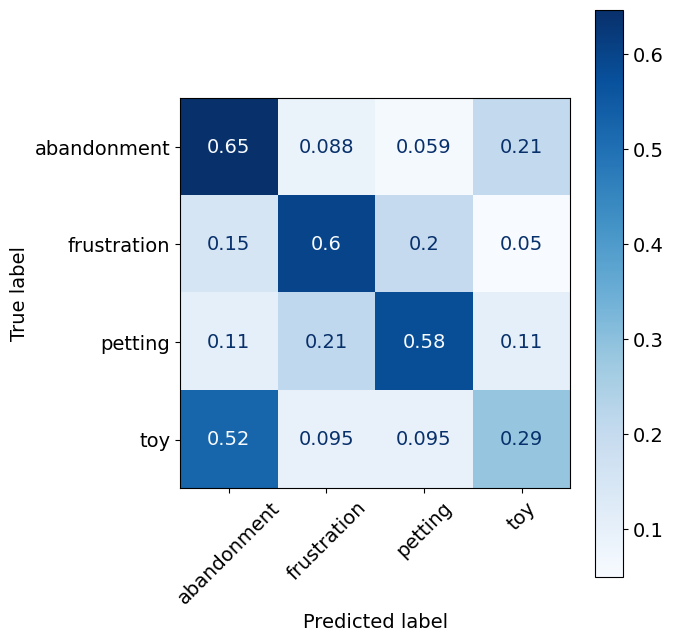

Evaluating model: SVM for valence
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

    negative       0.67      0.81      0.73        54
    positive       0.64      0.45      0.53        40

    accuracy                           0.66        94
   macro avg       0.65      0.63      0.63        94
weighted avg       0.66      0.66      0.65        94

Confusion Matrix:
[[0.81481481 0.18518519]
 [0.55       0.45      ]]




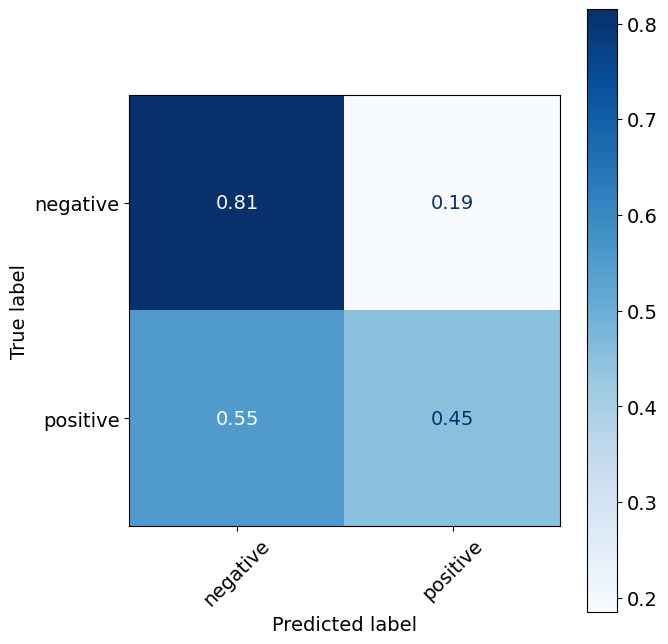

Evaluating model: SVM for arousal
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

        high       0.69      0.44      0.54        41
         low       0.66      0.85      0.74        53

    accuracy                           0.67        94
   macro avg       0.68      0.64      0.64        94
weighted avg       0.68      0.67      0.65        94

Confusion Matrix:
[[0.43902439 0.56097561]
 [0.1509434  0.8490566 ]]




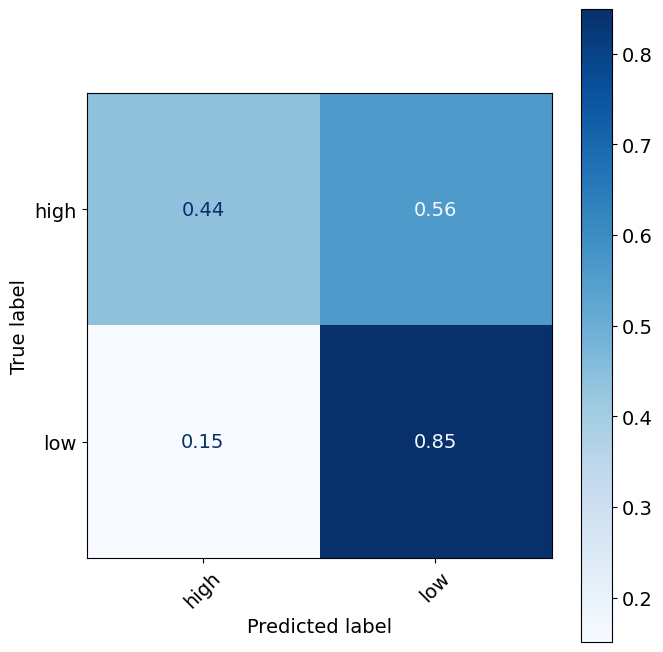

Evaluating model: SVM for original classes
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.53      0.85      0.65        34
 frustration       0.82      0.70      0.76        20
     petting       0.85      0.58      0.69        19
         toy       0.33      0.14      0.20        21

    accuracy                           0.61        94
   macro avg       0.63      0.57      0.57        94
weighted avg       0.61      0.61      0.58        94

Confusion Matrix:
[[0.85294118 0.02941176 0.02941176 0.08823529]
 [0.2        0.7        0.05       0.05      ]
 [0.26315789 0.05263158 0.57894737 0.10526316]
 [0.80952381 0.04761905 0.         0.14285714]]




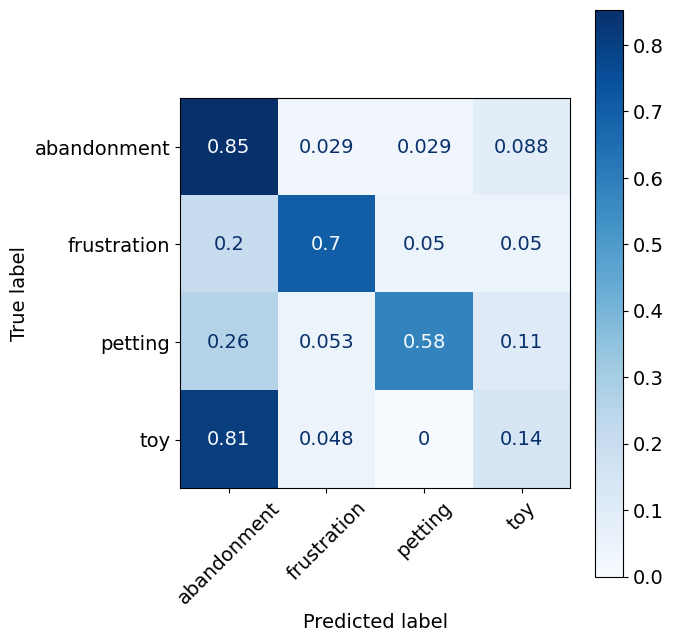

Evaluating model: Decision Tree for valence
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.86      0.81      0.84        54
    positive       0.77      0.82      0.80        40

    accuracy                           0.82        94
   macro avg       0.82      0.82      0.82        94
weighted avg       0.82      0.82      0.82        94

Confusion Matrix:
[[0.81481481 0.18518519]
 [0.175      0.825     ]]




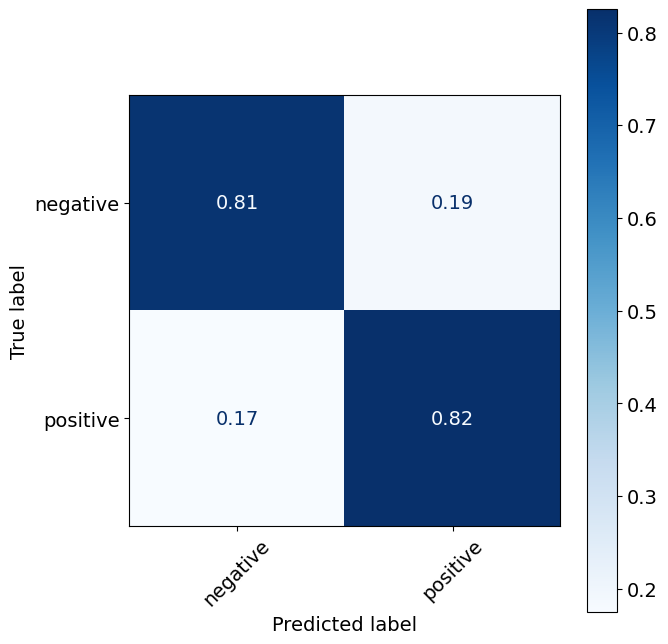

Evaluating model: Decision Tree for arousal
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.93      0.90      0.91        41
         low       0.93      0.94      0.93        53

    accuracy                           0.93        94
   macro avg       0.93      0.92      0.92        94
weighted avg       0.93      0.93      0.93        94

Confusion Matrix:
[[0.90243902 0.09756098]
 [0.05660377 0.94339623]]




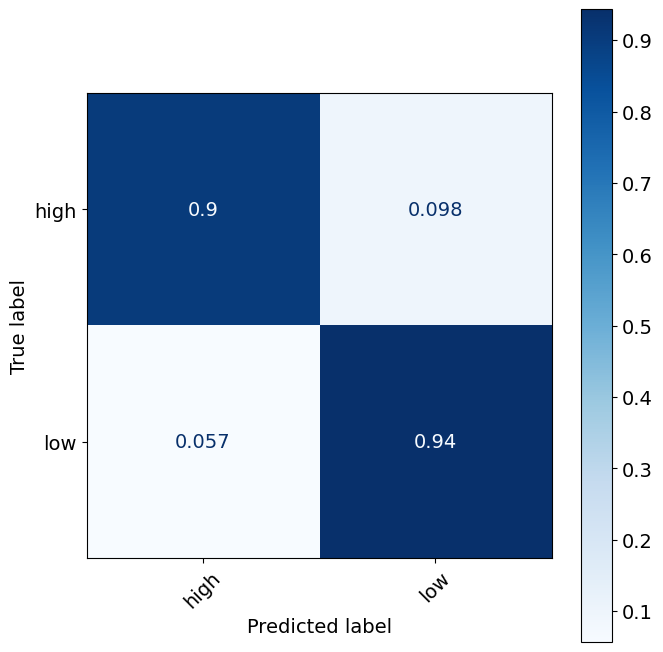

Evaluating model: Decision Tree for original classes
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.97      1.00      0.99        34
 frustration       0.95      0.95      0.95        20
     petting       0.79      0.58      0.67        19
         toy       0.72      0.86      0.78        21

    accuracy                           0.87        94
   macro avg       0.86      0.85      0.85        94
weighted avg       0.87      0.87      0.87        94

Confusion Matrix:
[[1.         0.         0.         0.        ]
 [0.05       0.95       0.         0.        ]
 [0.         0.05263158 0.57894737 0.36842105]
 [0.         0.         0.14285714 0.85714286]]




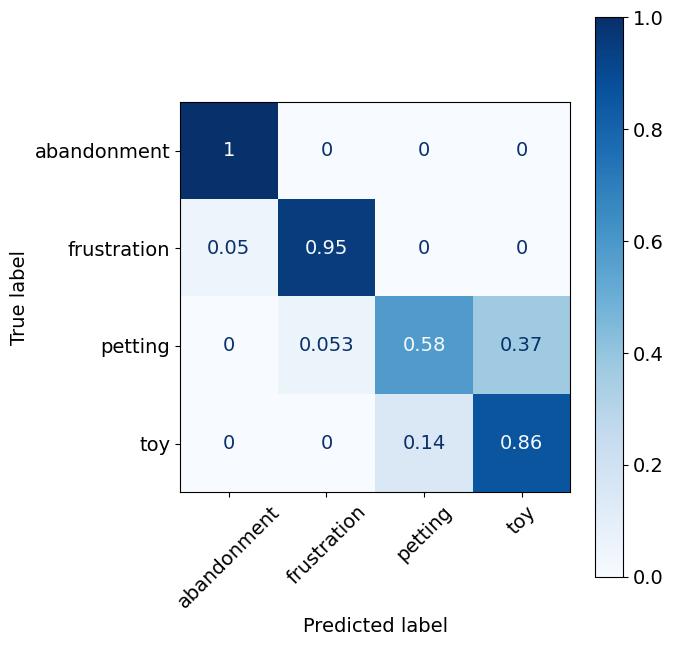

Evaluating model: Extra Trees for valence


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.94      0.91        54
    positive       0.92      0.82      0.87        40

    accuracy                           0.89        94
   macro avg       0.90      0.88      0.89        94
weighted avg       0.90      0.89      0.89        94

Confusion Matrix:
[[0.94444444 0.05555556]
 [0.175      0.825     ]]




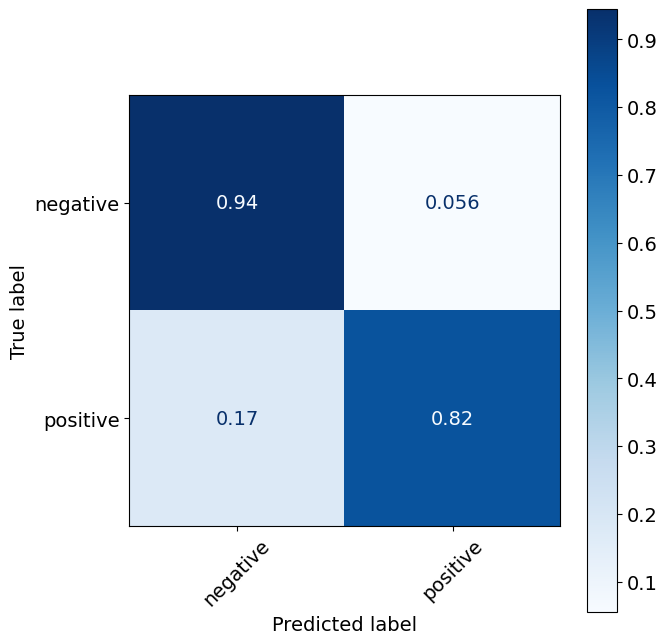

Evaluating model: Extra Trees for arousal


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.89      0.78      0.83        41
         low       0.84      0.92      0.88        53

    accuracy                           0.86        94
   macro avg       0.87      0.85      0.86        94
weighted avg       0.86      0.86      0.86        94

Confusion Matrix:
[[0.7804878 0.2195122]
 [0.0754717 0.9245283]]




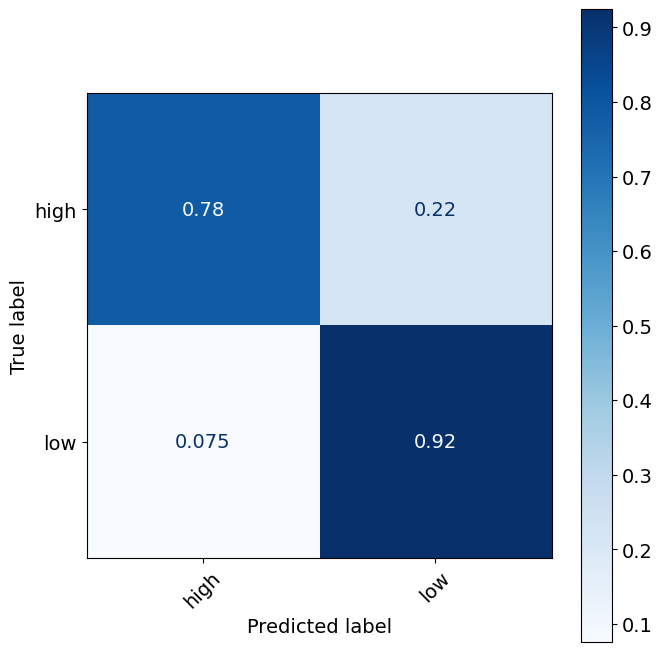

Evaluating model: Extra Trees for original classes


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.92      0.97      0.94        34
 frustration       0.94      0.85      0.89        20
     petting       0.94      0.89      0.92        19
         toy       0.95      1.00      0.98        21

    accuracy                           0.94        94
   macro avg       0.94      0.93      0.93        94
weighted avg       0.94      0.94      0.94        94

Confusion Matrix:
[[0.97058824 0.02941176 0.         0.        ]
 [0.1        0.85       0.05       0.        ]
 [0.05263158 0.         0.89473684 0.05263158]
 [0.         0.         0.         1.        ]]




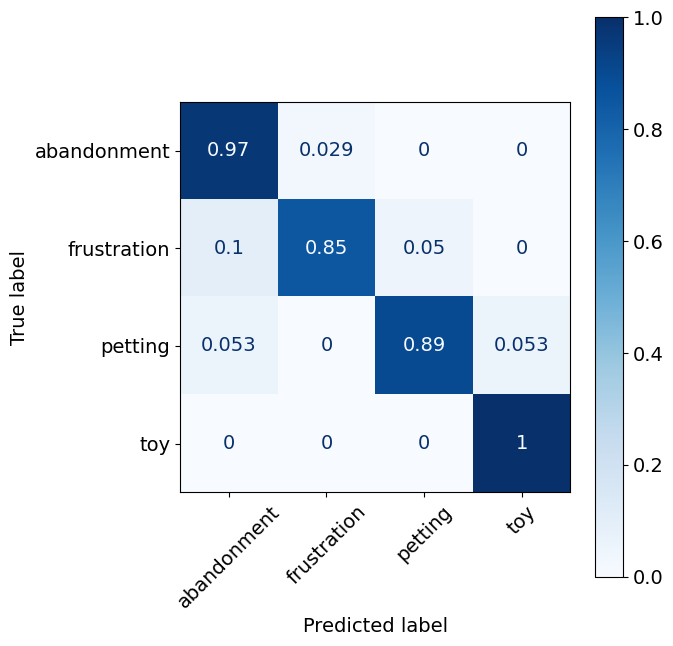

In [ ]:
evaluate_models(merged_df_physaugmented)

Evaluating model: Naive Bayes for valence
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

    negative       0.61      0.34      0.44       100
    positive       0.54      0.78      0.64        99

    accuracy                           0.56       199
   macro avg       0.57      0.56      0.54       199
weighted avg       0.57      0.56      0.54       199

Confusion Matrix:
[[0.34       0.66      ]
 [0.22222222 0.77777778]]




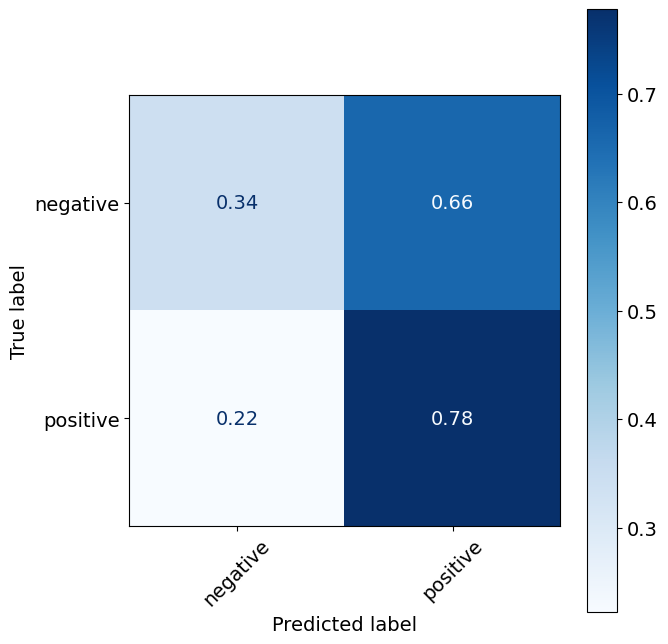

Evaluating model: Naive Bayes for arousal
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

        high       0.62      0.75      0.68        99
         low       0.69      0.55      0.61       100

    accuracy                           0.65       199
   macro avg       0.65      0.65      0.65       199
weighted avg       0.65      0.65      0.64       199

Confusion Matrix:
[[0.74747475 0.25252525]
 [0.45       0.55      ]]




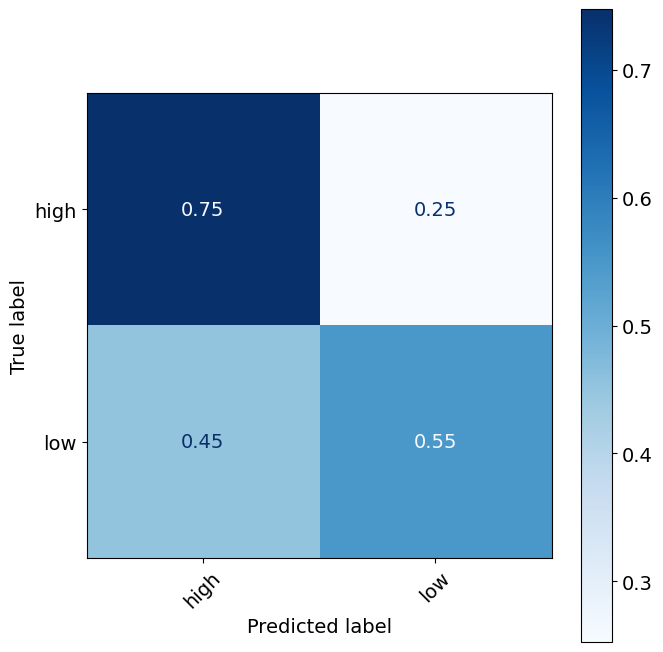

Evaluating model: Naive Bayes for original classes
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.40      0.24      0.30        50
 frustration       0.31      0.22      0.26        50
     petting       0.31      0.58      0.40        50
         toy       0.50      0.41      0.45        49

    accuracy                           0.36       199
   macro avg       0.38      0.36      0.35       199
weighted avg       0.38      0.36      0.35       199

Confusion Matrix:
[[0.24       0.18       0.48       0.1       ]
 [0.14       0.22       0.4        0.24      ]
 [0.2        0.16       0.58       0.06      ]
 [0.02040816 0.14285714 0.42857143 0.40816327]]




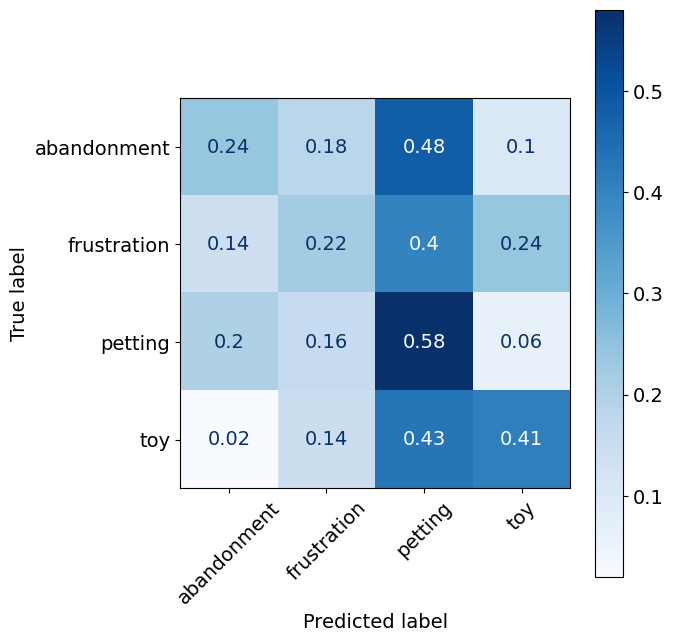

Evaluating model: KNN for valence
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.63      0.67      0.65       100
    positive       0.65      0.61      0.62        99

    accuracy                           0.64       199
   macro avg       0.64      0.64      0.64       199
weighted avg       0.64      0.64      0.64       199

Confusion Matrix:
[[0.67       0.33      ]
 [0.39393939 0.60606061]]




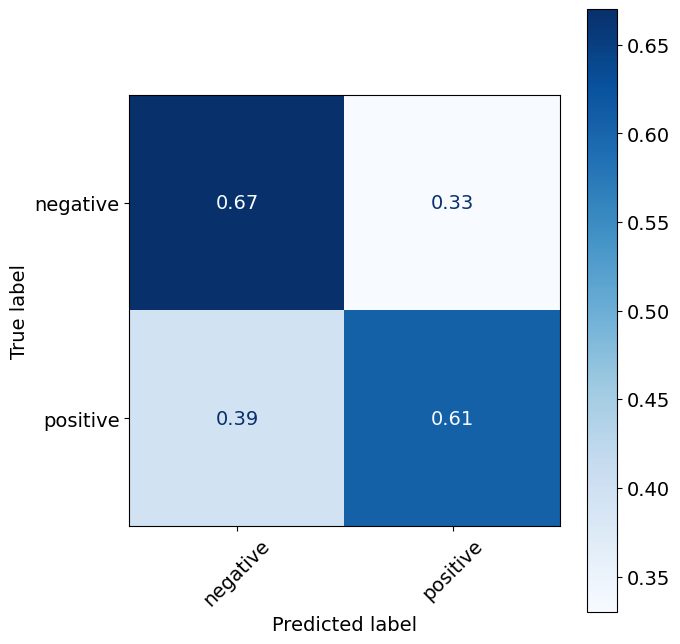

Evaluating model: KNN for arousal
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.68      0.57      0.62        99
         low       0.63      0.74      0.68       100

    accuracy                           0.65       199
   macro avg       0.66      0.65      0.65       199
weighted avg       0.66      0.65      0.65       199

Confusion Matrix:
[[0.56565657 0.43434343]
 [0.26       0.74      ]]




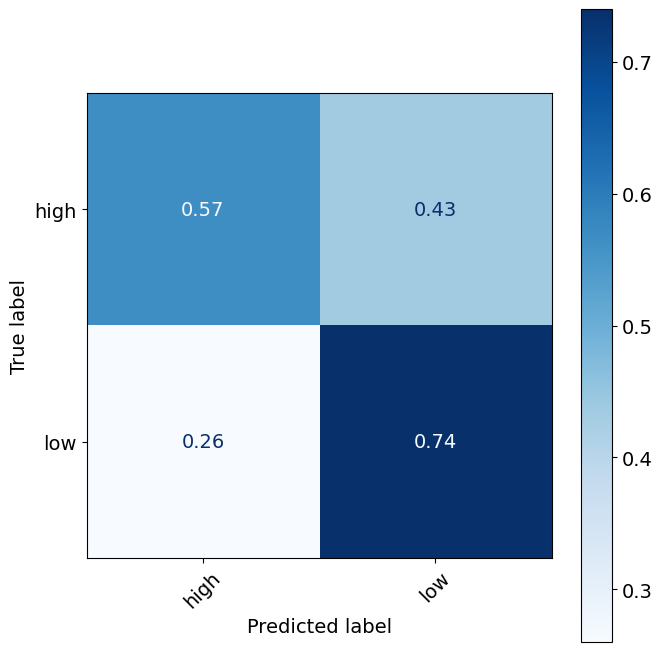

Evaluating model: KNN for original classes
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.48      0.60      0.53        50
 frustration       0.42      0.40      0.41        50
     petting       0.59      0.60      0.59        50
         toy       0.51      0.39      0.44        49

    accuracy                           0.50       199
   macro avg       0.50      0.50      0.49       199
weighted avg       0.50      0.50      0.49       199

Confusion Matrix:
[[0.6        0.14       0.1        0.16      ]
 [0.18       0.4        0.24       0.18      ]
 [0.16       0.22       0.6        0.02      ]
 [0.32653061 0.20408163 0.08163265 0.3877551 ]]




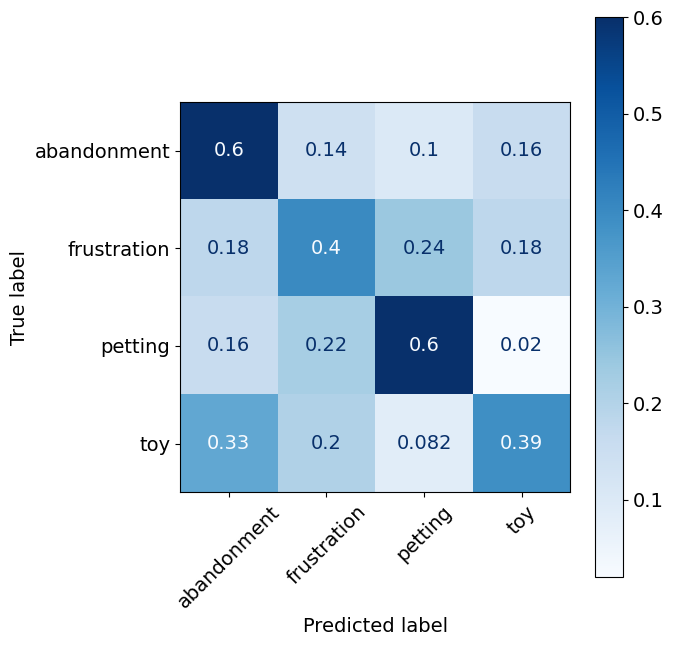

Evaluating model: SVM for valence
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

    negative       0.69      0.61      0.65       100
    positive       0.65      0.73      0.69        99

    accuracy                           0.67       199
   macro avg       0.67      0.67      0.67       199
weighted avg       0.67      0.67      0.67       199

Confusion Matrix:
[[0.61       0.39      ]
 [0.27272727 0.72727273]]




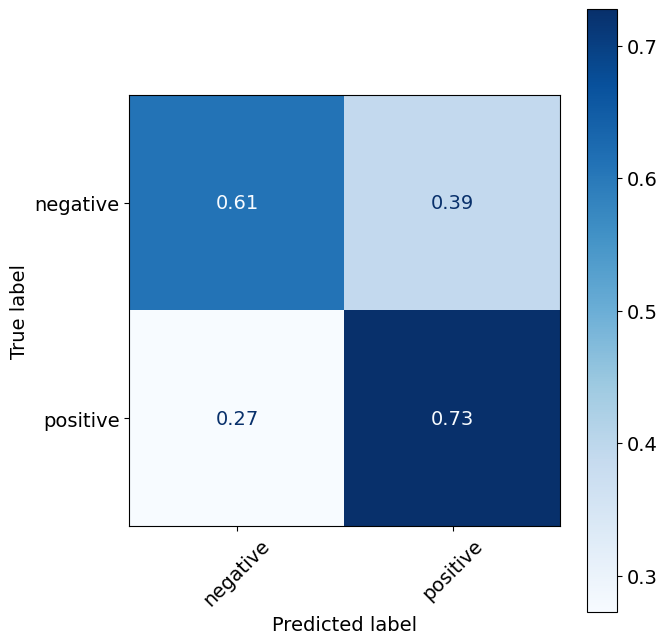

Evaluating model: SVM for arousal
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

        high       0.67      0.56      0.61        99
         low       0.62      0.73      0.67       100

    accuracy                           0.64       199
   macro avg       0.65      0.64      0.64       199
weighted avg       0.65      0.64      0.64       199

Confusion Matrix:
[[0.55555556 0.44444444]
 [0.27       0.73      ]]




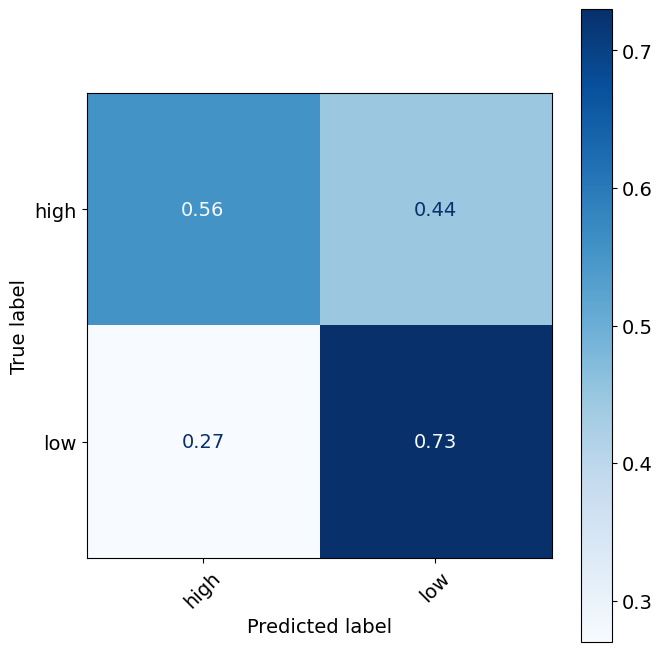

Evaluating model: SVM for original classes
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.38      0.32      0.35        50
 frustration       0.33      0.32      0.33        50
     petting       0.42      0.66      0.52        50
         toy       0.58      0.37      0.45        49

    accuracy                           0.42       199
   macro avg       0.43      0.42      0.41       199
weighted avg       0.43      0.42      0.41       199

Confusion Matrix:
[[0.32       0.28       0.3        0.1       ]
 [0.24       0.32       0.32       0.12      ]
 [0.16       0.14       0.66       0.04      ]
 [0.12244898 0.2244898  0.28571429 0.36734694]]




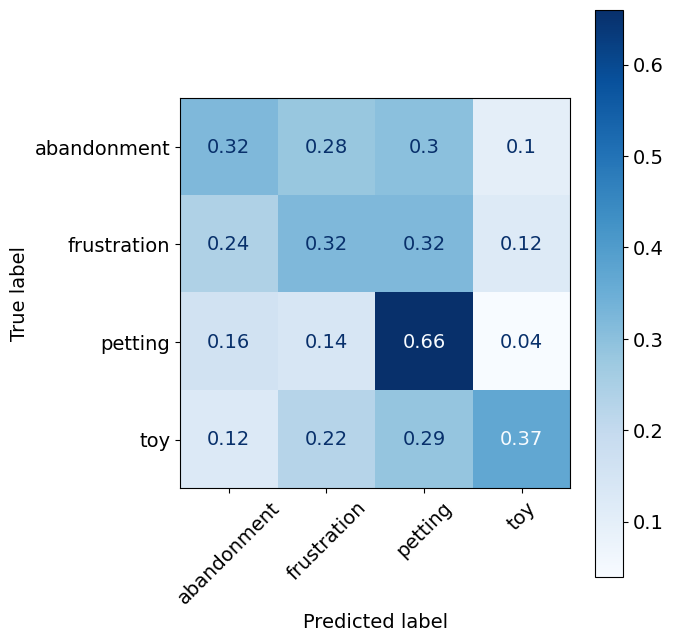

Evaluating model: Decision Tree for valence
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.68      0.67      0.67       100
    positive       0.67      0.68      0.67        99

    accuracy                           0.67       199
   macro avg       0.67      0.67      0.67       199
weighted avg       0.67      0.67      0.67       199

Confusion Matrix:
[[0.67       0.33      ]
 [0.32323232 0.67676768]]




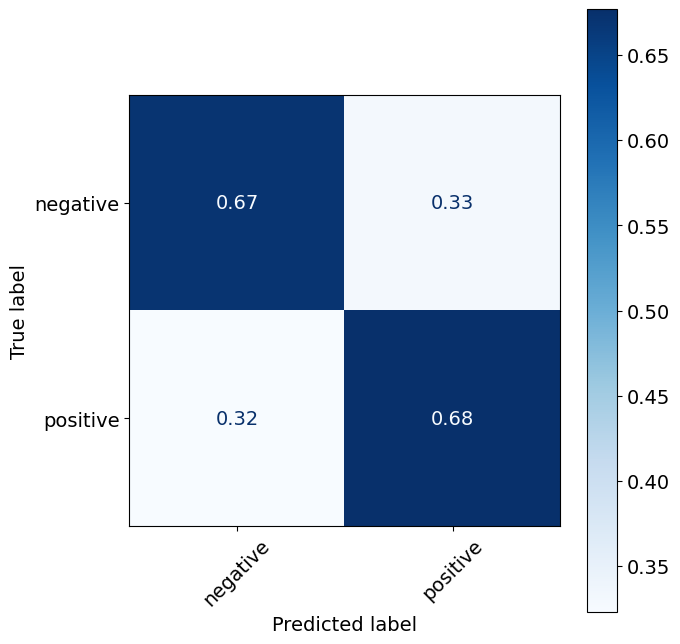

Evaluating model: Decision Tree for arousal
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.67      0.73      0.70        99
         low       0.71      0.65      0.68       100

    accuracy                           0.69       199
   macro avg       0.69      0.69      0.69       199
weighted avg       0.69      0.69      0.69       199

Confusion Matrix:
[[0.72727273 0.27272727]
 [0.35       0.65      ]]




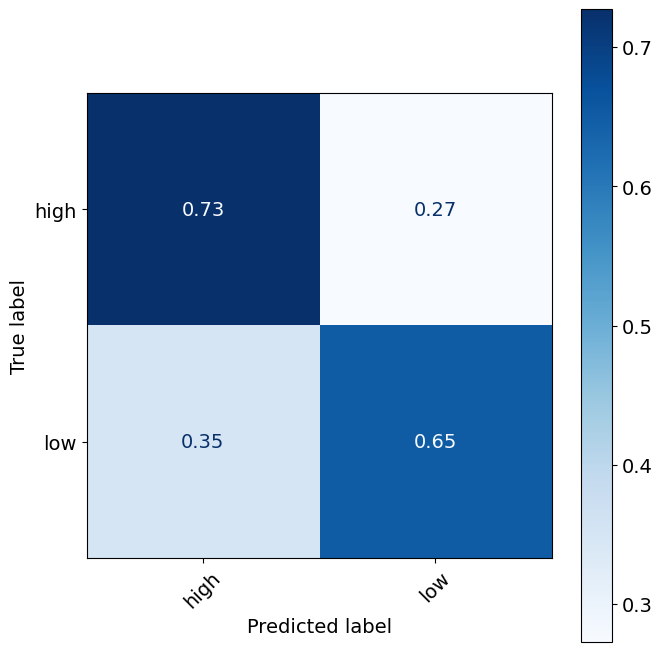

Evaluating model: Decision Tree for original classes
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.52      0.56      0.54        50
 frustration       0.31      0.26      0.28        50
     petting       0.42      0.44      0.43        50
         toy       0.56      0.57      0.57        49

    accuracy                           0.46       199
   macro avg       0.45      0.46      0.45       199
weighted avg       0.45      0.46      0.45       199

Confusion Matrix:
[[0.56       0.22       0.14       0.08      ]
 [0.28       0.26       0.32       0.14      ]
 [0.14       0.2        0.44       0.22      ]
 [0.10204082 0.16326531 0.16326531 0.57142857]]




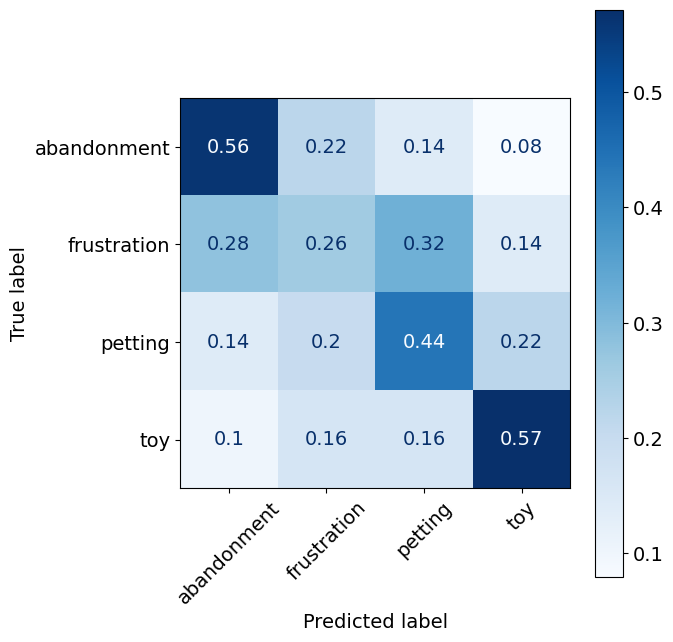

Evaluating model: Extra Trees for valence


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.79      0.80      0.80       100
    positive       0.80      0.79      0.79        99

    accuracy                           0.79       199
   macro avg       0.79      0.79      0.79       199
weighted avg       0.79      0.79      0.79       199

Confusion Matrix:
[[0.8        0.2       ]
 [0.21212121 0.78787879]]




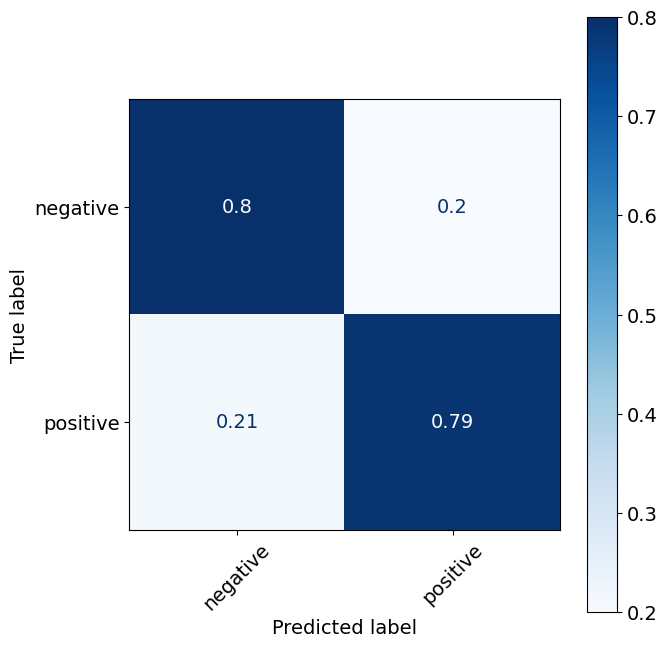

Evaluating model: Extra Trees for arousal


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.70      0.72      0.71        99
         low       0.71      0.69      0.70       100

    accuracy                           0.70       199
   macro avg       0.70      0.70      0.70       199
weighted avg       0.70      0.70      0.70       199

Confusion Matrix:
[[0.71717172 0.28282828]
 [0.31       0.69      ]]




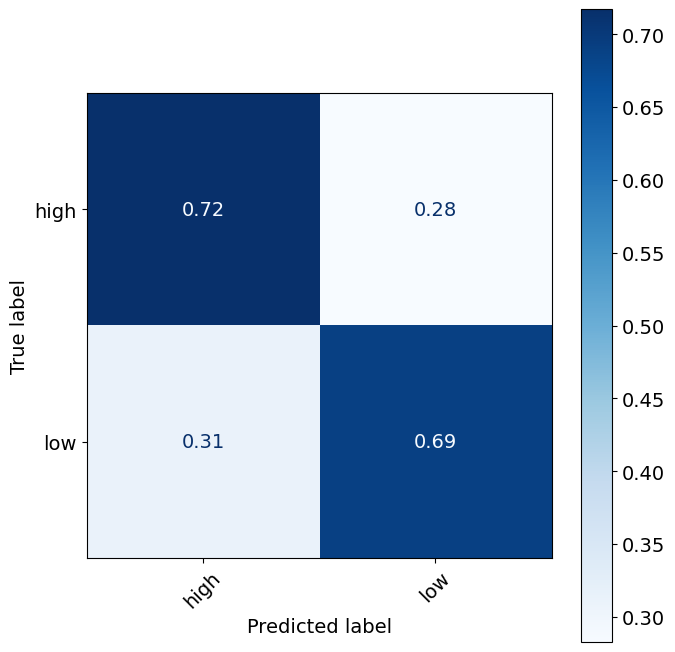

Evaluating model: Extra Trees for original classes


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.56      0.58      0.57        50
 frustration       0.47      0.42      0.44        50
     petting       0.53      0.60      0.56        50
         toy       0.73      0.67      0.70        49

    accuracy                           0.57       199
   macro avg       0.57      0.57      0.57       199
weighted avg       0.57      0.57      0.57       199

Confusion Matrix:
[[0.58       0.18       0.16       0.08      ]
 [0.24       0.42       0.26       0.08      ]
 [0.18       0.14       0.6        0.08      ]
 [0.04081633 0.16326531 0.12244898 0.67346939]]




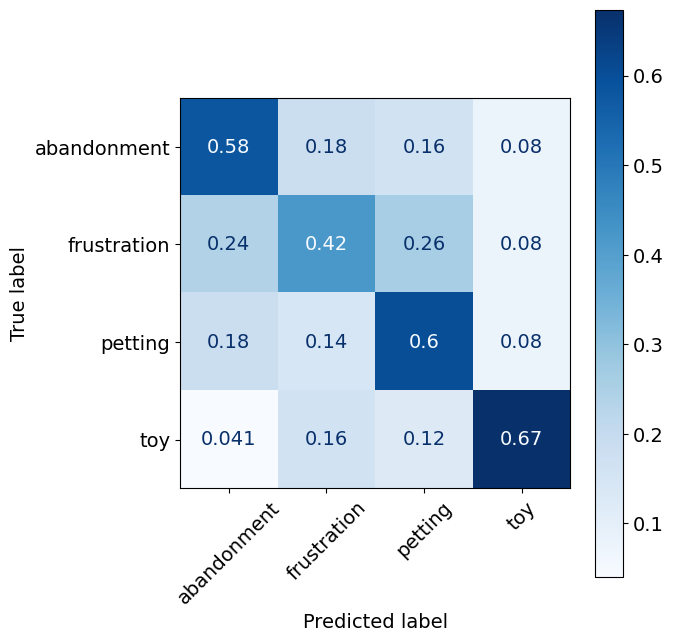

In [ ]:
evaluate_models(visual_df)

Evaluating model: Naive Bayes for valence
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

    negative       0.65      0.81      0.72       100
    positive       0.75      0.56      0.64       100

    accuracy                           0.69       200
   macro avg       0.70      0.69      0.68       200
weighted avg       0.70      0.69      0.68       200

Confusion Matrix:
[[0.81 0.19]
 [0.44 0.56]]




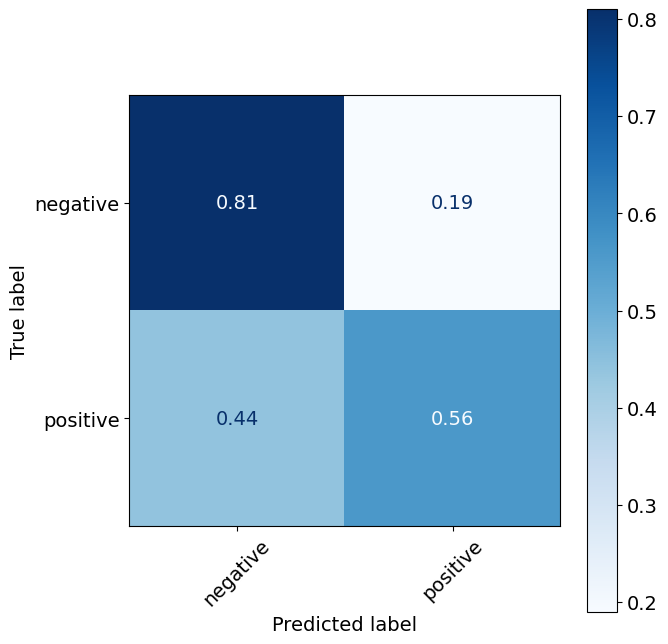

Evaluating model: Naive Bayes for arousal
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

        high       0.86      0.54      0.66       100
         low       0.66      0.91      0.77       100

    accuracy                           0.73       200
   macro avg       0.76      0.73      0.72       200
weighted avg       0.76      0.72      0.72       200

Confusion Matrix:
[[0.54 0.46]
 [0.09 0.91]]




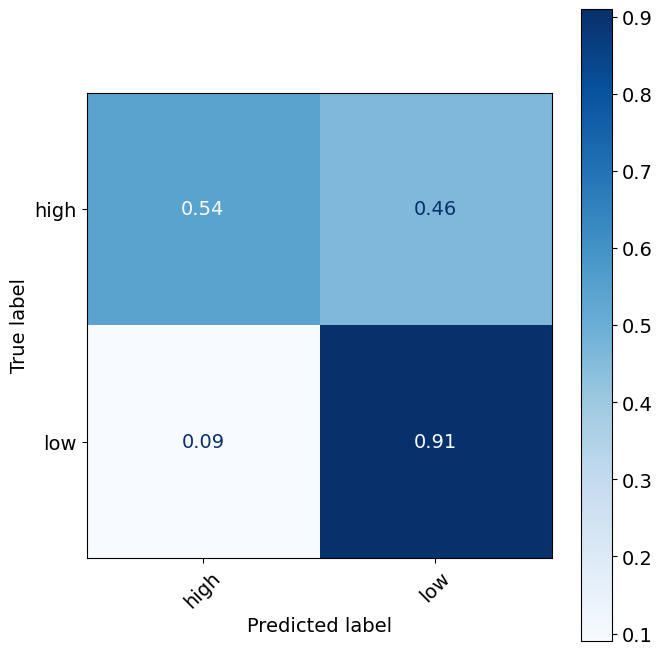

Evaluating model: Naive Bayes for original classes
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.52      0.64      0.58        50
 frustration       0.00      0.00      0.00        50
     petting       0.55      0.82      0.66        50
         toy       0.71      0.82      0.76        50

    accuracy                           0.57       200
   macro avg       0.44      0.57      0.50       200
weighted avg       0.44      0.57      0.50       200

Confusion Matrix:
[[0.64 0.06 0.24 0.06]
 [0.36 0.   0.4  0.24]
 [0.1  0.04 0.82 0.04]
 [0.12 0.02 0.04 0.82]]




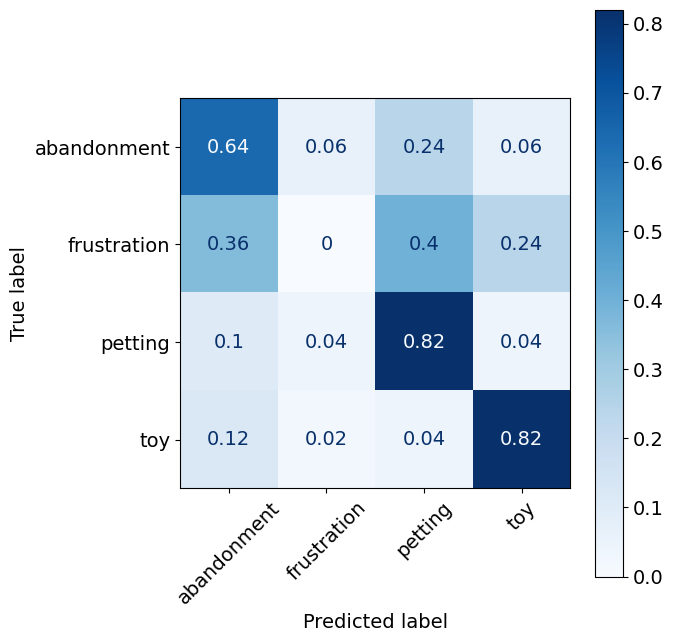

Evaluating model: KNN for valence
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.70      0.64      0.67       100
    positive       0.67      0.73      0.70       100

    accuracy                           0.69       200
   macro avg       0.69      0.69      0.68       200
weighted avg       0.69      0.69      0.68       200

Confusion Matrix:
[[0.64 0.36]
 [0.27 0.73]]




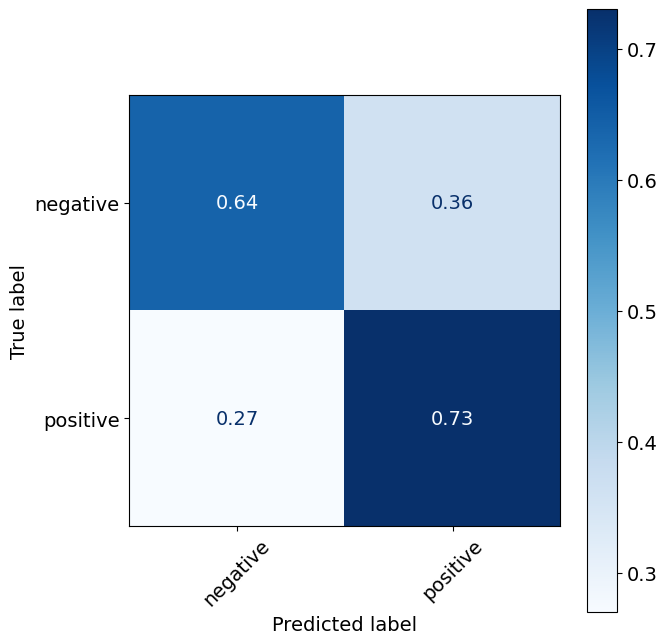

Evaluating model: KNN for arousal
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.75      0.72      0.73       100
         low       0.73      0.76      0.75       100

    accuracy                           0.74       200
   macro avg       0.74      0.74      0.74       200
weighted avg       0.74      0.74      0.74       200

Confusion Matrix:
[[0.72 0.28]
 [0.24 0.76]]




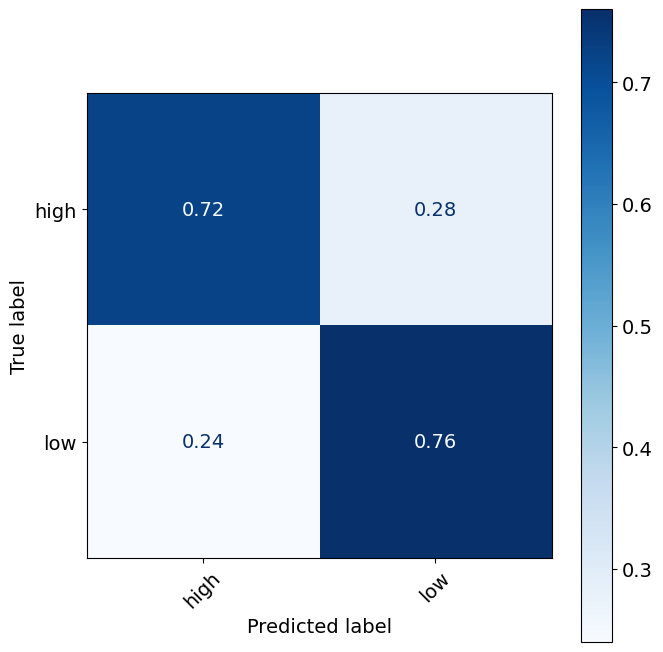

Evaluating model: KNN for original classes
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.48      0.54      0.51        50
 frustration       0.49      0.50      0.50        50
     petting       0.56      0.48      0.52        50
         toy       0.72      0.72      0.72        50

    accuracy                           0.56       200
   macro avg       0.56      0.56      0.56       200
weighted avg       0.56      0.56      0.56       200

Confusion Matrix:
[[0.54 0.18 0.2  0.08]
 [0.24 0.5  0.1  0.16]
 [0.22 0.26 0.48 0.04]
 [0.12 0.08 0.08 0.72]]




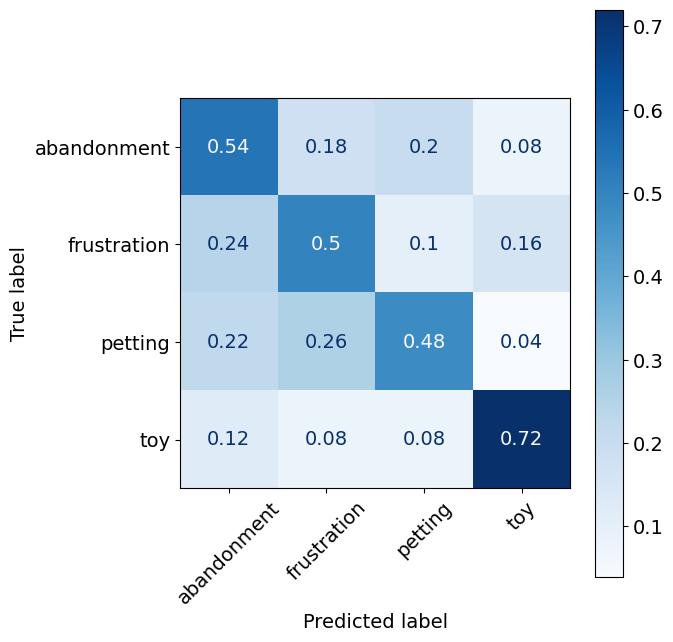

Evaluating model: SVM for valence
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.77      0.82       100
    positive       0.79      0.89      0.84       100

    accuracy                           0.83       200
   macro avg       0.83      0.83      0.83       200
weighted avg       0.83      0.83      0.83       200

Confusion Matrix:
[[0.77 0.23]
 [0.11 0.89]]




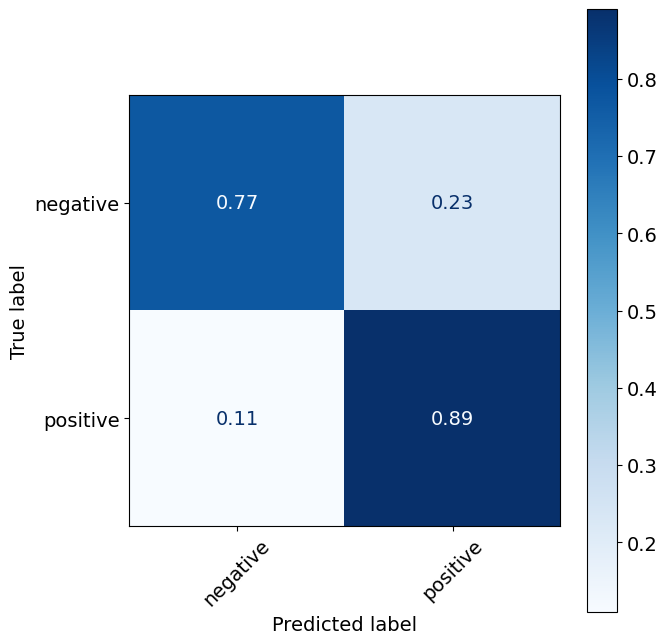

Evaluating model: SVM for arousal
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

        high       0.85      0.70      0.77       100
         low       0.75      0.88      0.81       100

    accuracy                           0.79       200
   macro avg       0.80      0.79      0.79       200
weighted avg       0.80      0.79      0.79       200

Confusion Matrix:
[[0.7  0.3 ]
 [0.12 0.88]]




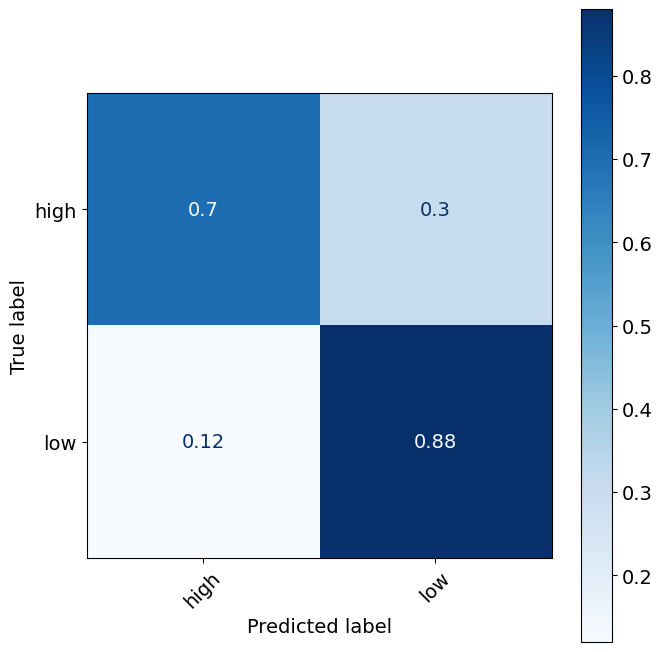

Evaluating model: SVM for original classes
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.70      0.62      0.66        50
 frustration       0.64      0.50      0.56        50
     petting       0.68      0.88      0.77        50
         toy       0.79      0.82      0.80        50

    accuracy                           0.70       200
   macro avg       0.70      0.70      0.70       200
weighted avg       0.70      0.70      0.70       200

Confusion Matrix:
[[0.62 0.18 0.16 0.04]
 [0.12 0.5  0.26 0.12]
 [0.02 0.04 0.88 0.06]
 [0.12 0.06 0.   0.82]]




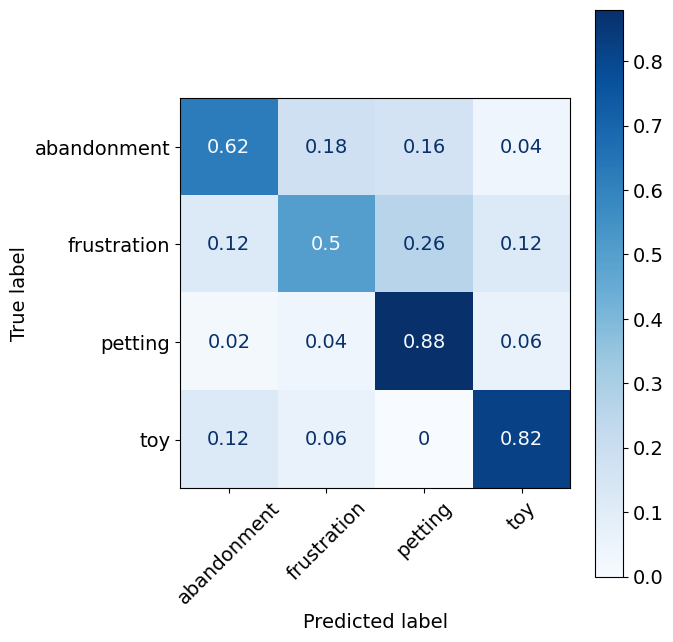

Evaluating model: Decision Tree for valence
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.79      0.77      0.78       100
    positive       0.77      0.79      0.78       100

    accuracy                           0.78       200
   macro avg       0.78      0.78      0.78       200
weighted avg       0.78      0.78      0.78       200

Confusion Matrix:
[[0.77 0.23]
 [0.21 0.79]]




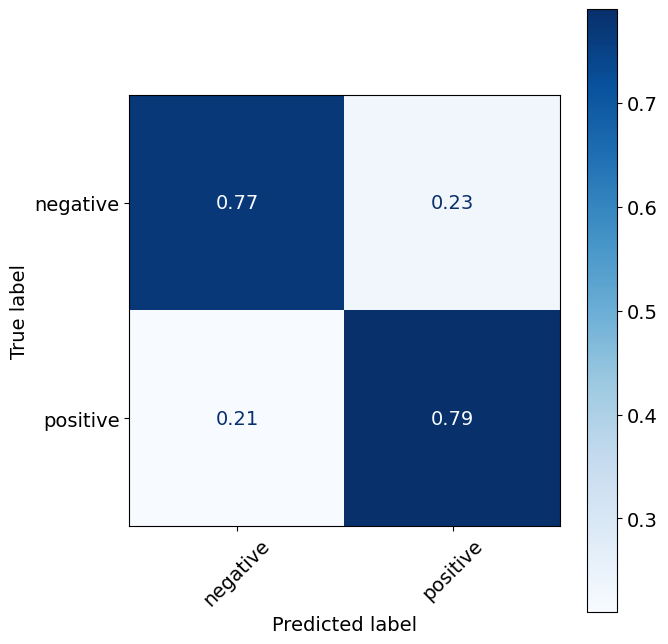

Evaluating model: Decision Tree for arousal
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.77      0.76      0.76       100
         low       0.76      0.77      0.77       100

    accuracy                           0.77       200
   macro avg       0.77      0.77      0.76       200
weighted avg       0.77      0.77      0.76       200

Confusion Matrix:
[[0.76 0.24]
 [0.23 0.77]]




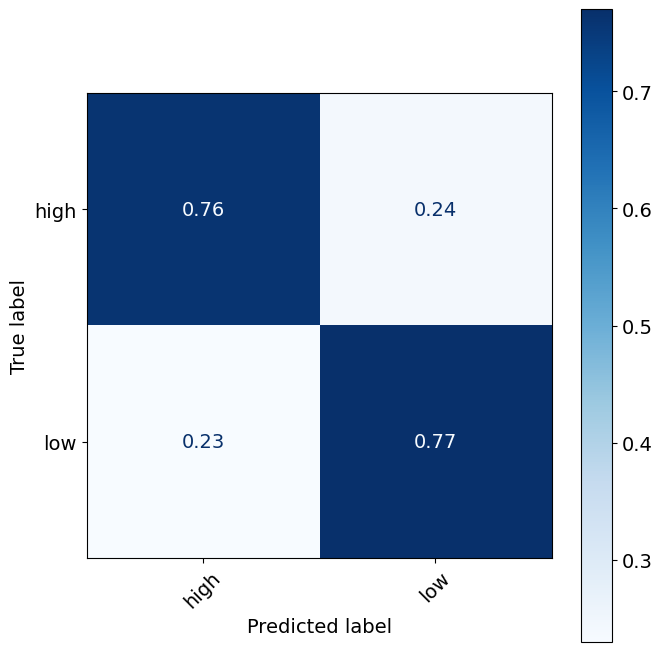

Evaluating model: Decision Tree for original classes
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.66      0.62      0.64        50
 frustration       0.61      0.68      0.64        50
     petting       0.72      0.66      0.69        50
         toy       0.80      0.82      0.81        50

    accuracy                           0.69       200
   macro avg       0.70      0.69      0.70       200
weighted avg       0.70      0.69      0.70       200

Confusion Matrix:
[[0.62 0.26 0.06 0.06]
 [0.08 0.68 0.16 0.08]
 [0.14 0.14 0.66 0.06]
 [0.1  0.04 0.04 0.82]]




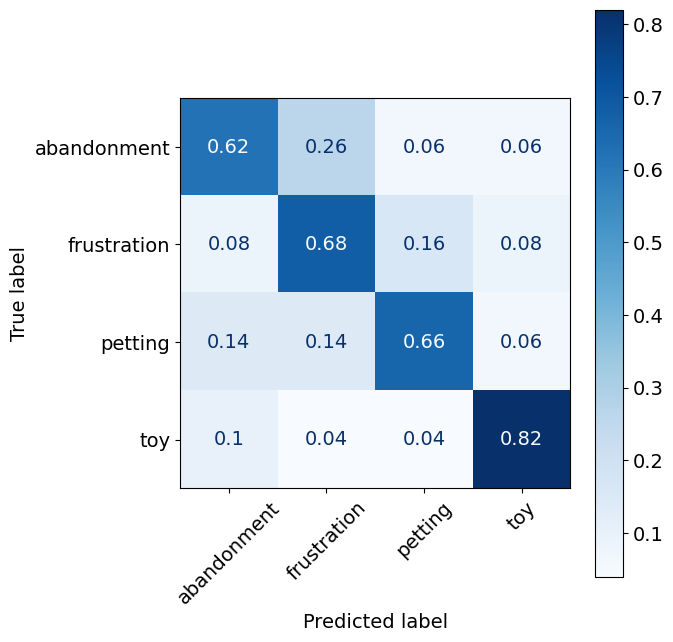

Evaluating model: Extra Trees for valence


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.87      0.85      0.86       100
    positive       0.85      0.87      0.86       100

    accuracy                           0.86       200
   macro avg       0.86      0.86      0.86       200
weighted avg       0.86      0.86      0.86       200

Confusion Matrix:
[[0.85 0.15]
 [0.13 0.87]]




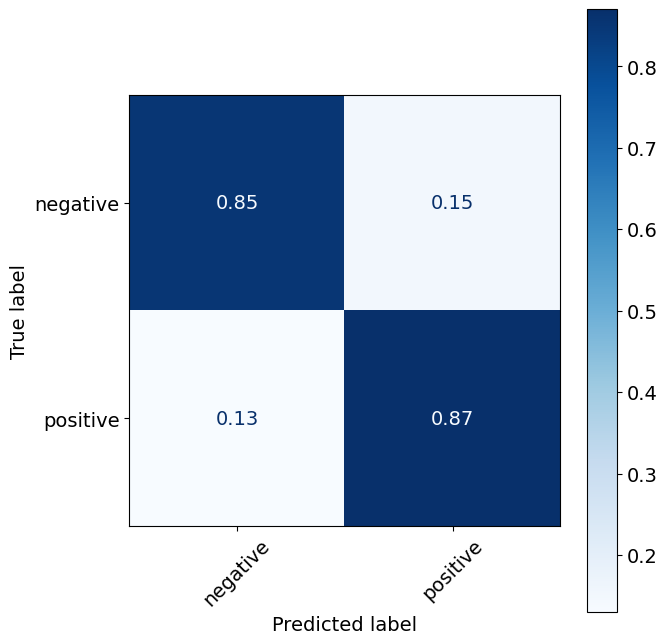

Evaluating model: Extra Trees for arousal


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.88      0.86      0.87       100
         low       0.86      0.88      0.87       100

    accuracy                           0.87       200
   macro avg       0.87      0.87      0.87       200
weighted avg       0.87      0.87      0.87       200

Confusion Matrix:
[[0.86 0.14]
 [0.12 0.88]]




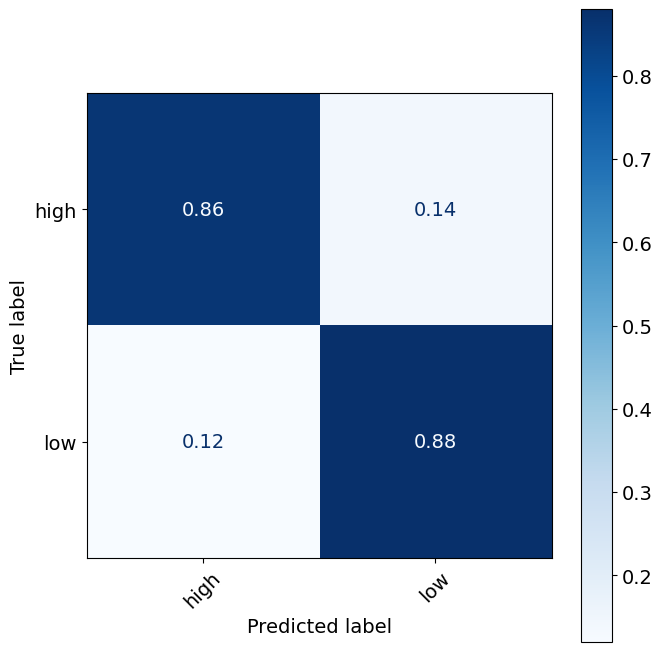

Evaluating model: Extra Trees for original classes


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.72      0.68      0.70        50
 frustration       0.86      0.84      0.85        50
     petting       0.80      0.86      0.83        50
         toy       0.84      0.84      0.84        50

    accuracy                           0.81       200
   macro avg       0.80      0.80      0.80       200
weighted avg       0.80      0.81      0.80       200

Confusion Matrix:
[[0.68 0.1  0.18 0.04]
 [0.06 0.84 0.04 0.06]
 [0.06 0.02 0.86 0.06]
 [0.14 0.02 0.   0.84]]




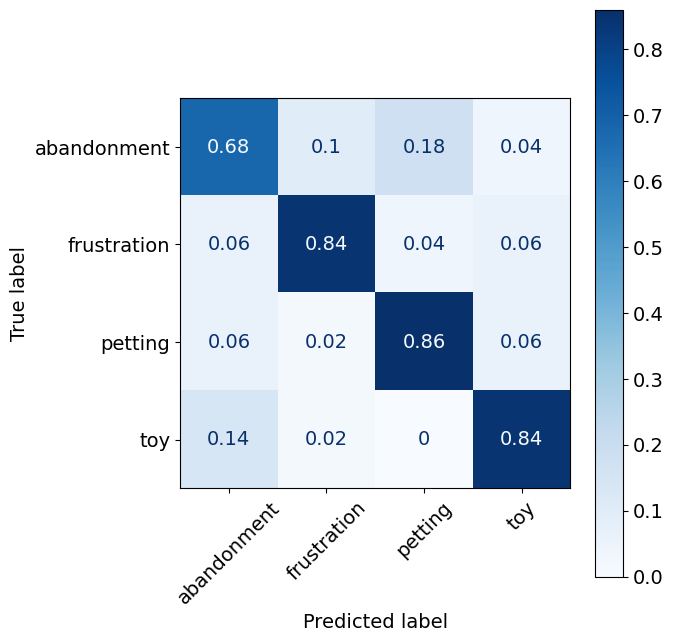

In [ ]:
evaluate_models(imu_df)

Evaluating model: Naive Bayes for valence
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

    negative       0.84      0.56      0.68        94
    positive       0.57      0.85      0.68        65

    accuracy                           0.68       159
   macro avg       0.71      0.70      0.68       159
weighted avg       0.73      0.68      0.68       159

Confusion Matrix:
[[0.56382979 0.43617021]
 [0.15384615 0.84615385]]




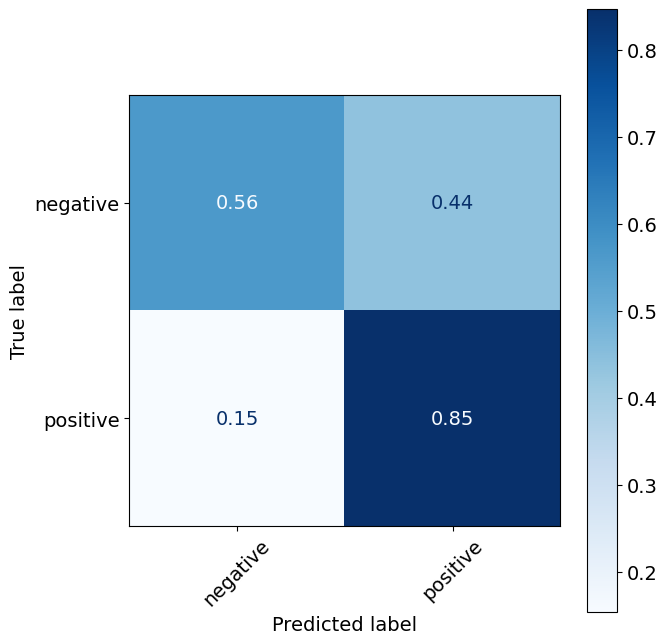

Evaluating model: Naive Bayes for arousal
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

        high       0.54      0.71      0.61        66
         low       0.74      0.57      0.64        93

    accuracy                           0.63       159
   macro avg       0.64      0.64      0.63       159
weighted avg       0.65      0.63      0.63       159

Confusion Matrix:
[[0.71212121 0.28787879]
 [0.43010753 0.56989247]]




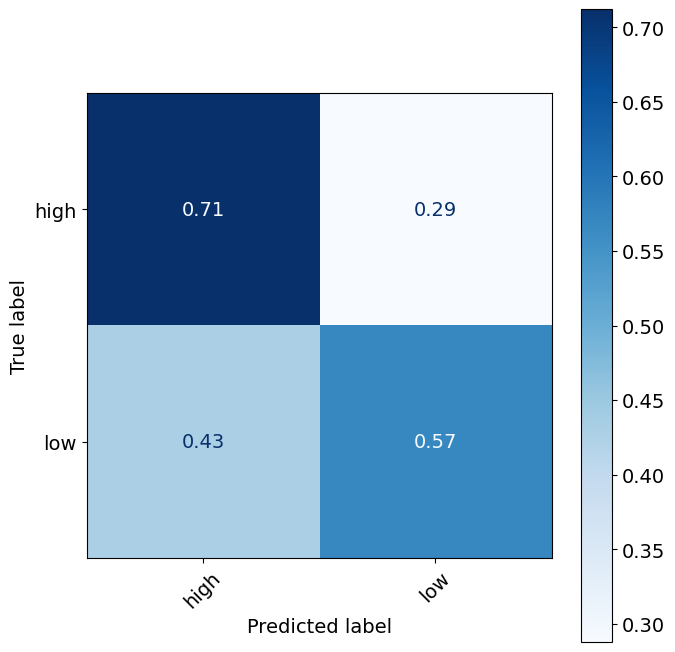

Evaluating model: Naive Bayes for original classes
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.77      0.40      0.53        50
 frustration       0.44      0.32      0.37        44
     petting       0.73      0.70      0.71        43
         toy       0.27      0.73      0.39        22

    accuracy                           0.50       159
   macro avg       0.55      0.54      0.50       159
weighted avg       0.60      0.50      0.51       159

Confusion Matrix:
[[0.4        0.16       0.1        0.34      ]
 [0.13636364 0.31818182 0.09090909 0.45454545]
 [0.         0.13953488 0.69767442 0.1627907 ]
 [0.         0.18181818 0.09090909 0.72727273]]




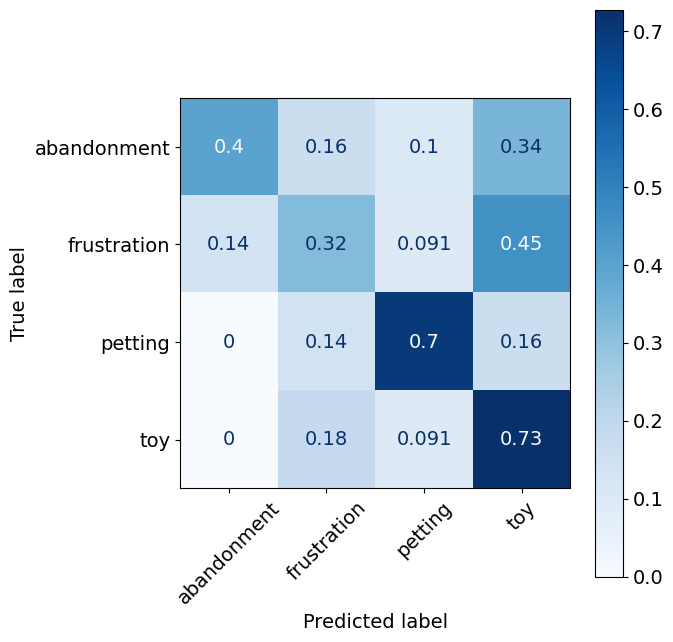

Evaluating model: KNN for valence
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.76      0.78      0.77        94
    positive       0.67      0.65      0.66        65

    accuracy                           0.72       159
   macro avg       0.71      0.71      0.71       159
weighted avg       0.72      0.72      0.72       159

Confusion Matrix:
[[0.77659574 0.22340426]
 [0.35384615 0.64615385]]




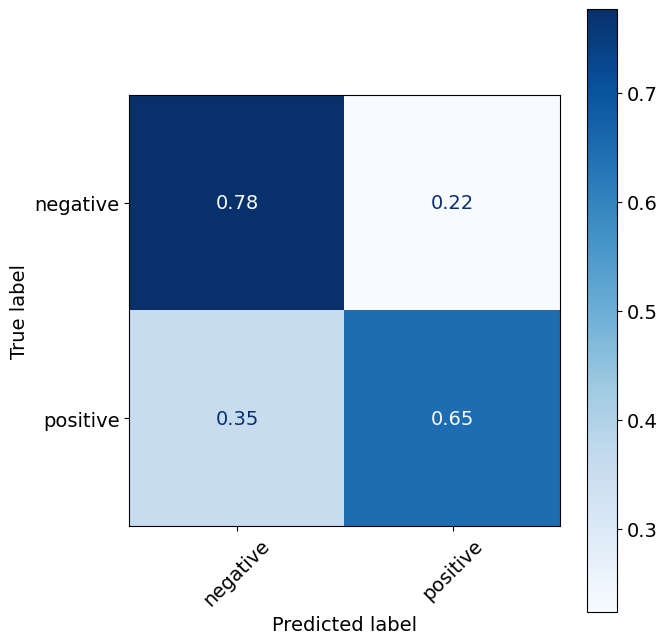

Evaluating model: KNN for arousal
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.56      0.55      0.55        66
         low       0.68      0.70      0.69        93

    accuracy                           0.64       159
   macro avg       0.62      0.62      0.62       159
weighted avg       0.63      0.64      0.63       159

Confusion Matrix:
[[0.54545455 0.45454545]
 [0.30107527 0.69892473]]




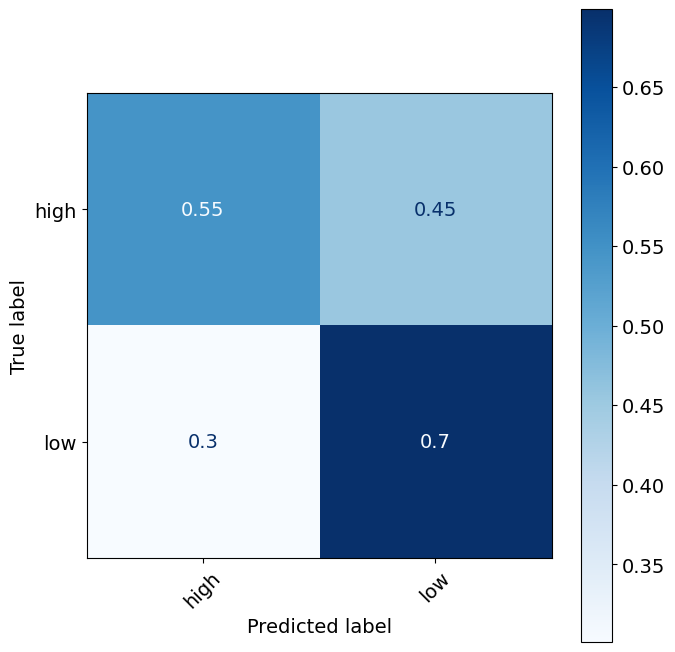

Evaluating model: KNN for original classes
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.52      0.66      0.58        50
 frustration       0.54      0.57      0.56        44
     petting       0.50      0.37      0.43        43
         toy       0.53      0.41      0.46        22

    accuracy                           0.52       159
   macro avg       0.52      0.50      0.51       159
weighted avg       0.52      0.52      0.52       159

Confusion Matrix:
[[0.66       0.16       0.16       0.02      ]
 [0.29545455 0.56818182 0.09090909 0.04545455]
 [0.30232558 0.20930233 0.37209302 0.11627907]
 [0.22727273 0.18181818 0.18181818 0.40909091]]




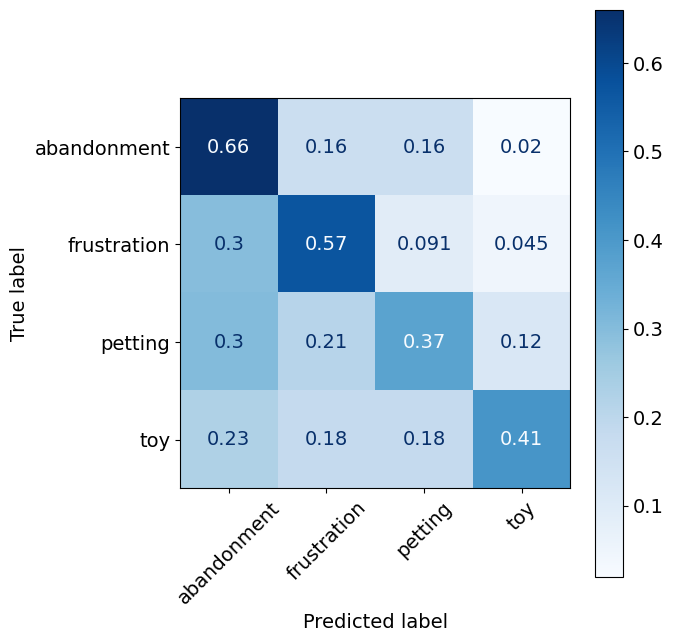

Evaluating model: SVM for valence
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

    negative       0.72      0.88      0.79        94
    positive       0.74      0.49      0.59        65

    accuracy                           0.72       159
   macro avg       0.73      0.69      0.69       159
weighted avg       0.73      0.72      0.71       159

Confusion Matrix:
[[0.88297872 0.11702128]
 [0.50769231 0.49230769]]




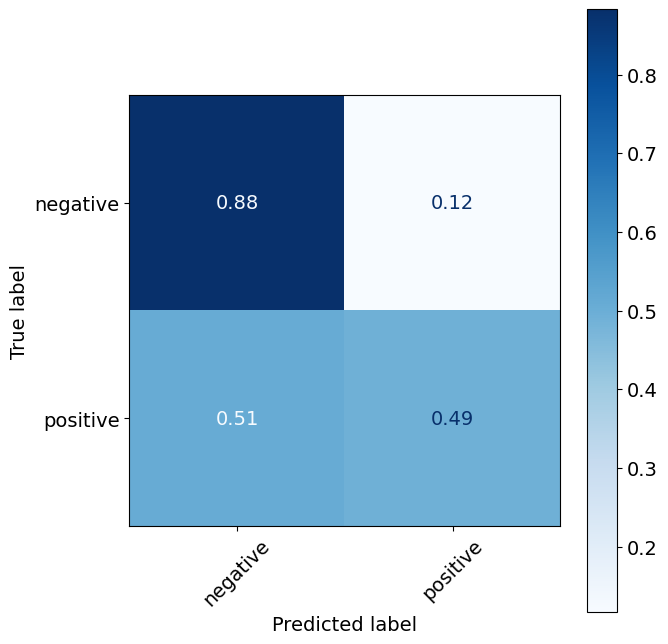

Evaluating model: SVM for arousal
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

        high       0.73      0.65      0.69        66
         low       0.77      0.83      0.80        93

    accuracy                           0.75       159
   macro avg       0.75      0.74      0.74       159
weighted avg       0.75      0.75      0.75       159

Confusion Matrix:
[[0.65151515 0.34848485]
 [0.17204301 0.82795699]]




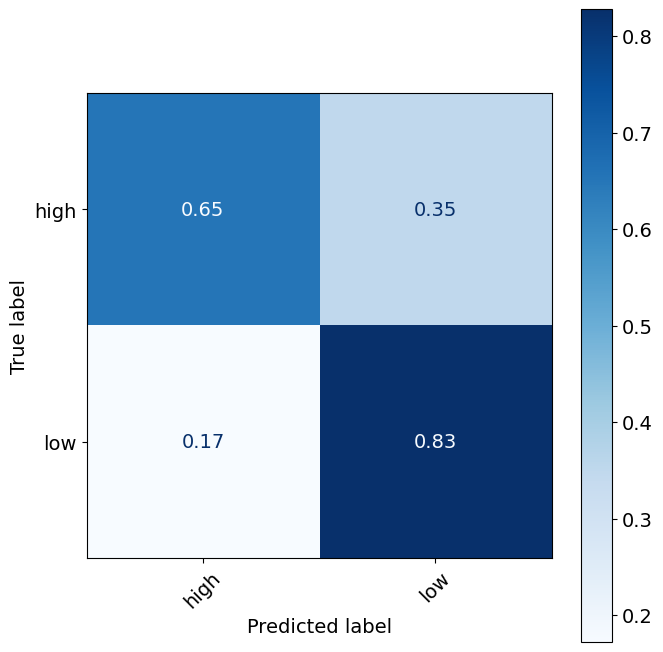

Evaluating model: SVM for original classes
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.54      0.86      0.67        50
 frustration       0.60      0.48      0.53        44
     petting       0.84      0.74      0.79        43
         toy       0.14      0.05      0.07        22

    accuracy                           0.61       159
   macro avg       0.53      0.53      0.51       159
weighted avg       0.58      0.61      0.58       159

Confusion Matrix:
[[0.86       0.02       0.1        0.02      ]
 [0.40909091 0.47727273 0.         0.11363636]
 [0.11627907 0.13953488 0.74418605 0.        ]
 [0.59090909 0.31818182 0.04545455 0.04545455]]




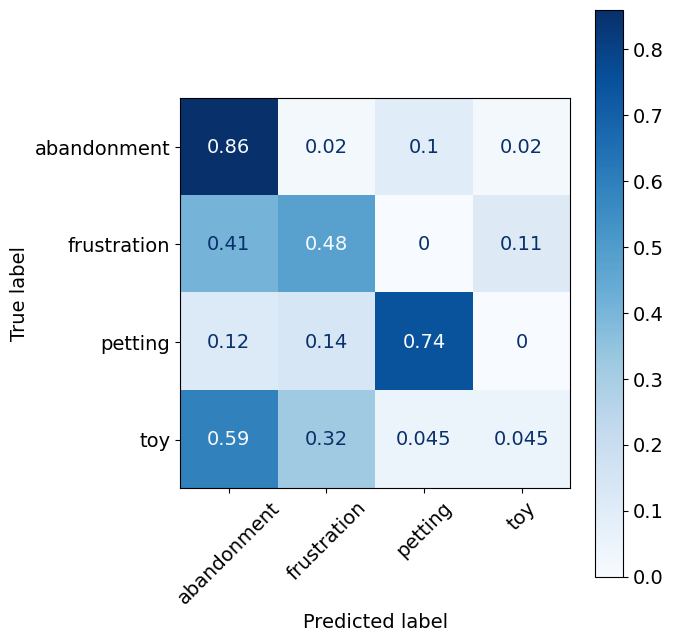

Evaluating model: Decision Tree for valence
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.91      0.90        94
    positive       0.87      0.82      0.84        65

    accuracy                           0.87       159
   macro avg       0.87      0.87      0.87       159
weighted avg       0.87      0.87      0.87       159

Confusion Matrix:
[[0.91489362 0.08510638]
 [0.18461538 0.81538462]]




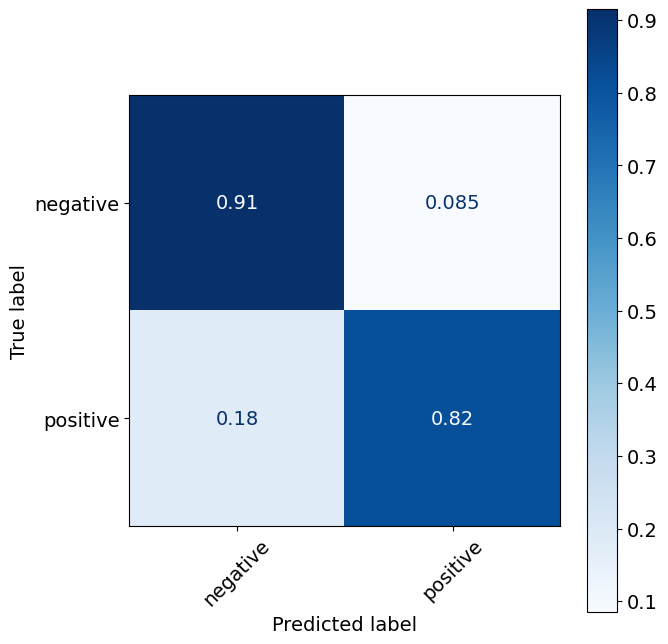

Evaluating model: Decision Tree for arousal
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.85      0.92      0.88        66
         low       0.94      0.88      0.91        93

    accuracy                           0.90       159
   macro avg       0.89      0.90      0.90       159
weighted avg       0.90      0.90      0.90       159

Confusion Matrix:
[[0.92424242 0.07575758]
 [0.11827957 0.88172043]]




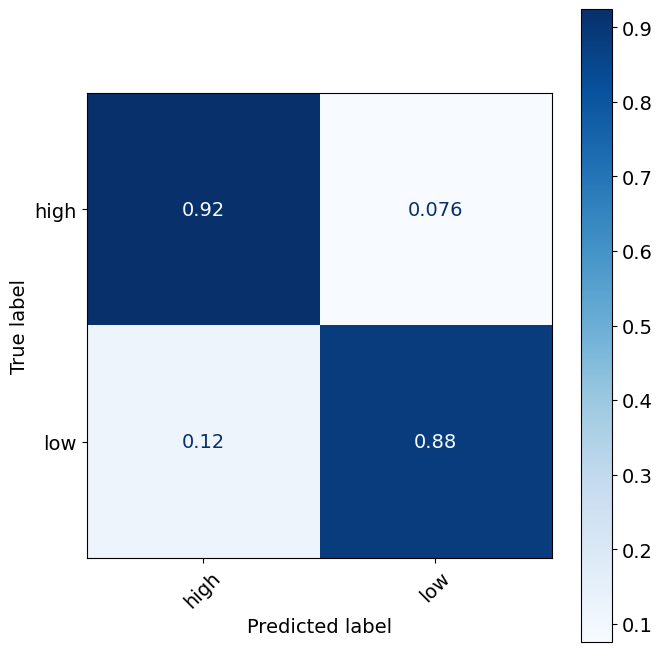

Evaluating model: Decision Tree for original classes
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       1.00      0.92      0.96        50
 frustration       0.88      0.84      0.86        44
     petting       0.86      0.86      0.86        43
         toy       0.64      0.82      0.72        22

    accuracy                           0.87       159
   macro avg       0.85      0.86      0.85       159
weighted avg       0.88      0.87      0.87       159

Confusion Matrix:
[[0.92       0.04       0.04       0.        ]
 [0.         0.84090909 0.02272727 0.13636364]
 [0.         0.04651163 0.86046512 0.09302326]
 [0.         0.04545455 0.13636364 0.81818182]]




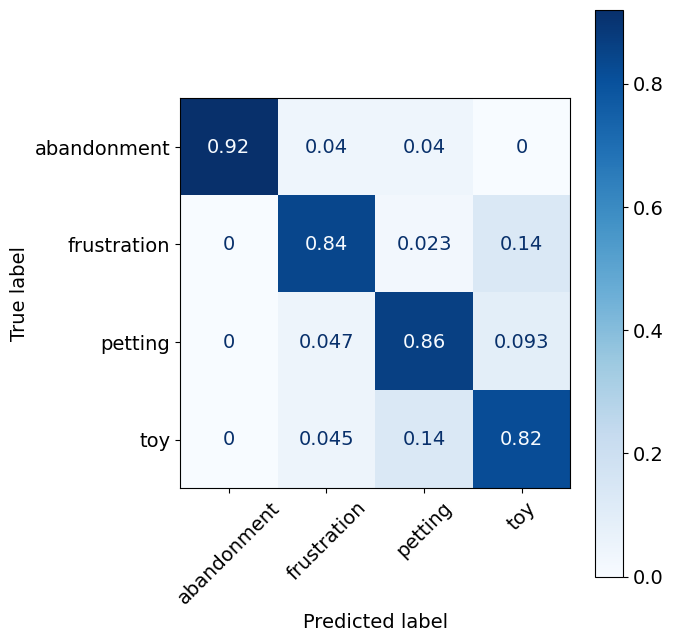

Evaluating model: Extra Trees for valence


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.94      0.99      0.96        94
    positive       0.98      0.91      0.94        65

    accuracy                           0.96       159
   macro avg       0.96      0.95      0.95       159
weighted avg       0.96      0.96      0.96       159

Confusion Matrix:
[[0.9893617  0.0106383 ]
 [0.09230769 0.90769231]]




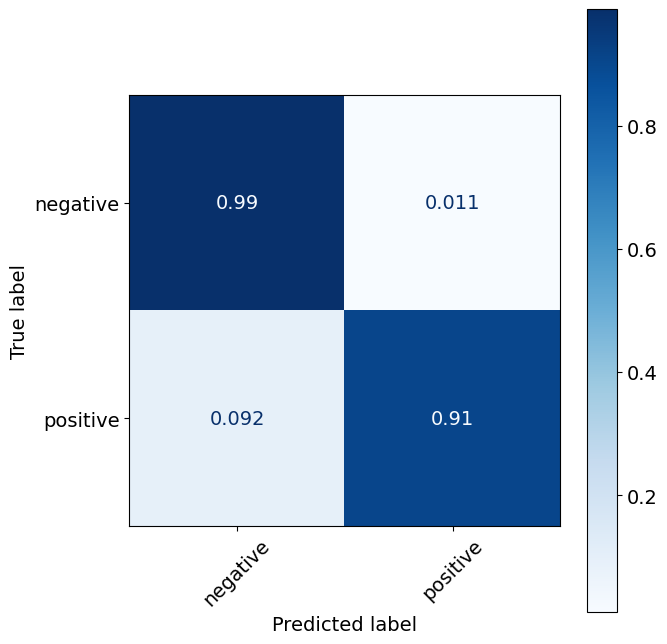

Evaluating model: Extra Trees for arousal


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.89      0.95      0.92        66
         low       0.97      0.91      0.94        93

    accuracy                           0.93       159
   macro avg       0.93      0.93      0.93       159
weighted avg       0.93      0.93      0.93       159

Confusion Matrix:
[[0.95454545 0.04545455]
 [0.08602151 0.91397849]]




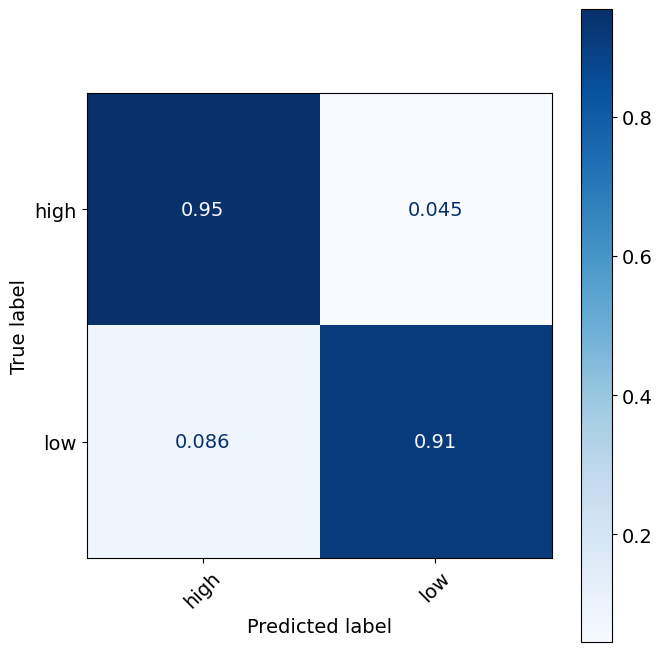

Evaluating model: Extra Trees for original classes


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.94      0.96      0.95        50
 frustration       0.88      0.95      0.91        44
     petting       0.95      0.91      0.93        43
         toy       1.00      0.86      0.93        22

    accuracy                           0.93       159
   macro avg       0.94      0.92      0.93       159
weighted avg       0.93      0.93      0.93       159

Confusion Matrix:
[[0.96       0.04       0.         0.        ]
 [0.02272727 0.95454545 0.02272727 0.        ]
 [0.04651163 0.04651163 0.90697674 0.        ]
 [0.         0.09090909 0.04545455 0.86363636]]




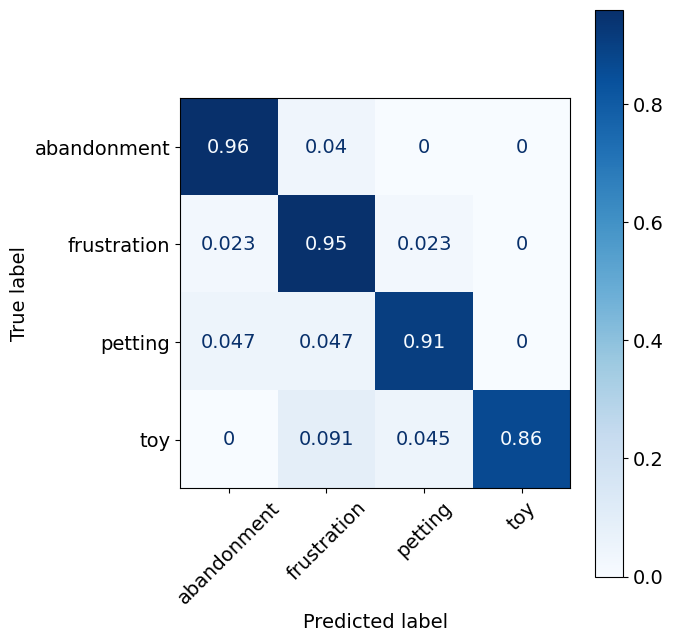

In [ ]:
evaluate_models(merged_df_phys)

Evaluating model: Naive Bayes for valence
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

    negative       0.79      0.73      0.76       100
    positive       0.69      0.76      0.73        80

    accuracy                           0.74       180
   macro avg       0.74      0.75      0.74       180
weighted avg       0.75      0.74      0.75       180

Confusion Matrix:
[[0.73   0.27  ]
 [0.2375 0.7625]]




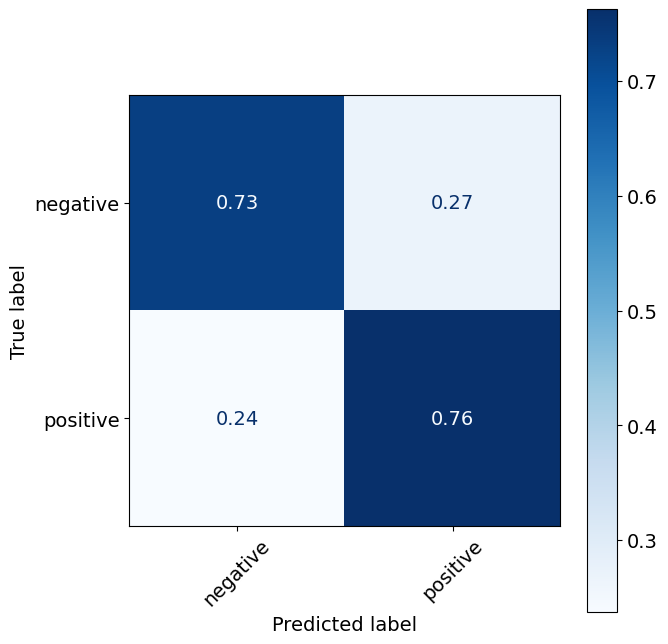

Evaluating model: Naive Bayes for arousal
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

        high       0.77      0.60      0.67        84
         low       0.70      0.84      0.77        96

    accuracy                           0.73       180
   macro avg       0.74      0.72      0.72       180
weighted avg       0.73      0.73      0.72       180

Confusion Matrix:
[[0.5952381 0.4047619]
 [0.15625   0.84375  ]]




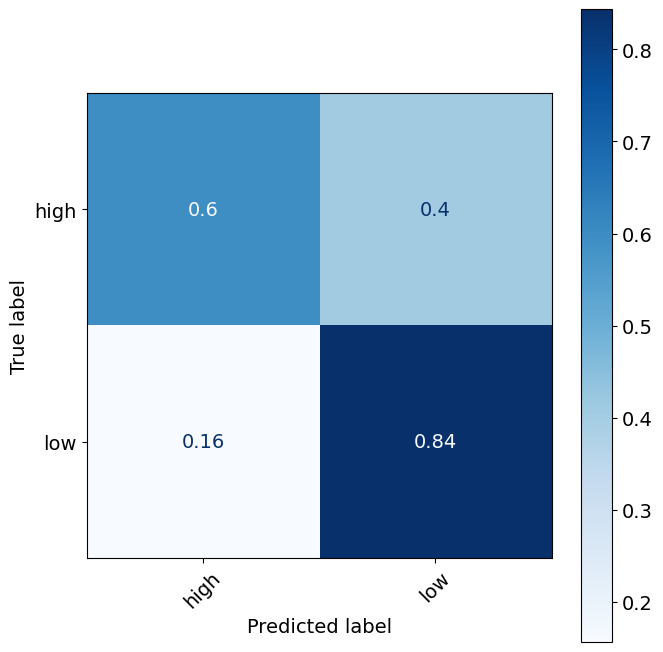

Evaluating model: Naive Bayes for original classes
Model: GaussianNB
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.52      0.78      0.62        50
 frustration       0.75      0.18      0.29        50
     petting       0.76      0.76      0.76        46
         toy       0.62      0.85      0.72        34

    accuracy                           0.62       180
   macro avg       0.66      0.64      0.60       180
weighted avg       0.66      0.62      0.58       180

Confusion Matrix:
[[0.78       0.04       0.06       0.12      ]
 [0.52       0.18       0.14       0.16      ]
 [0.13043478 0.02173913 0.76086957 0.08695652]
 [0.11764706 0.         0.02941176 0.85294118]]




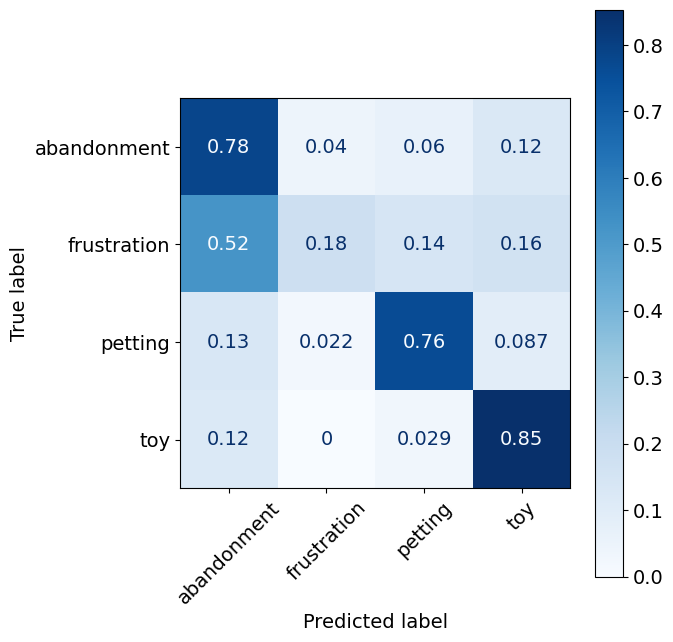

Evaluating model: KNN for valence
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.80      0.82      0.81       100
    positive       0.77      0.75      0.76        80

    accuracy                           0.79       180
   macro avg       0.79      0.78      0.79       180
weighted avg       0.79      0.79      0.79       180

Confusion Matrix:
[[0.82 0.18]
 [0.25 0.75]]




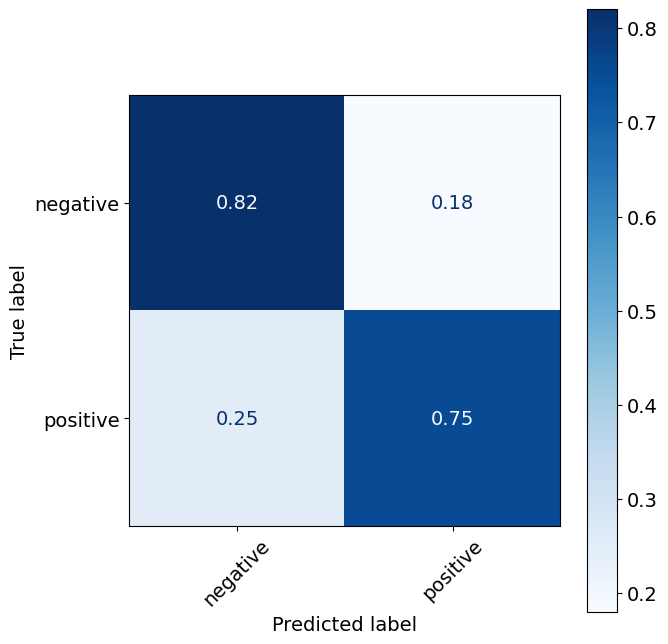

Evaluating model: KNN for arousal
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.77      0.71      0.74        84
         low       0.76      0.81      0.79        96

    accuracy                           0.77       180
   macro avg       0.77      0.76      0.76       180
weighted avg       0.77      0.77      0.77       180

Confusion Matrix:
[[0.71428571 0.28571429]
 [0.1875     0.8125    ]]




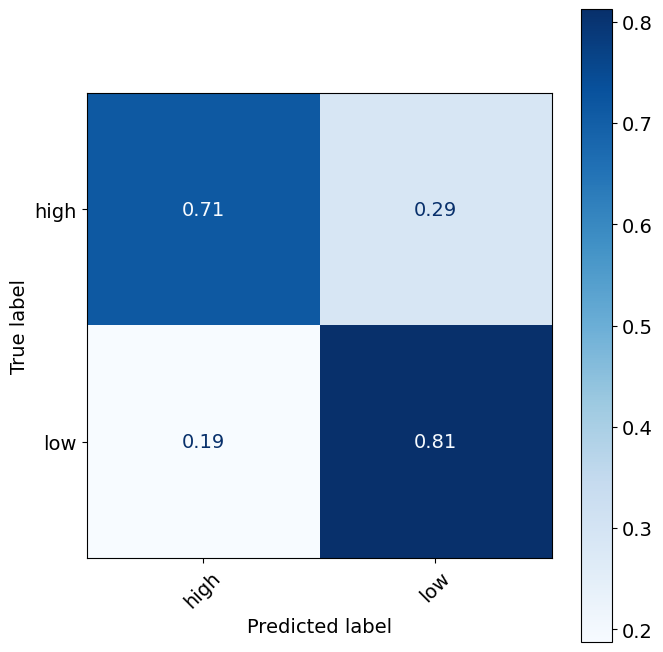

Evaluating model: KNN for original classes
Model: KNeighborsClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.65      0.72      0.69        50
 frustration       0.64      0.60      0.62        50
     petting       0.60      0.65      0.63        46
         toy       0.71      0.59      0.65        34

    accuracy                           0.64       180
   macro avg       0.65      0.64      0.64       180
weighted avg       0.65      0.64      0.64       180

Confusion Matrix:
[[0.72       0.1        0.16       0.02      ]
 [0.18       0.6        0.18       0.04      ]
 [0.04347826 0.19565217 0.65217391 0.10869565]
 [0.23529412 0.08823529 0.08823529 0.58823529]]




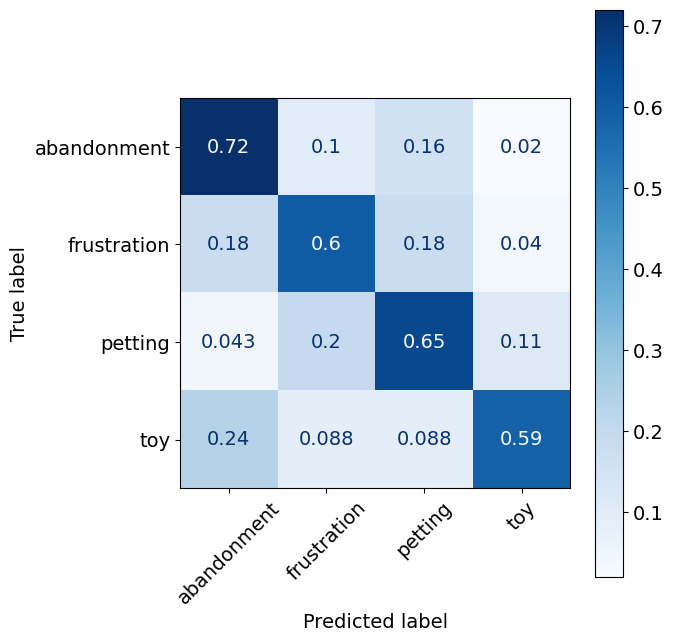

Evaluating model: SVM for valence
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.85      0.86       100
    positive       0.82      0.85      0.83        80

    accuracy                           0.85       180
   macro avg       0.85      0.85      0.85       180
weighted avg       0.85      0.85      0.85       180

Confusion Matrix:
[[0.85 0.15]
 [0.15 0.85]]




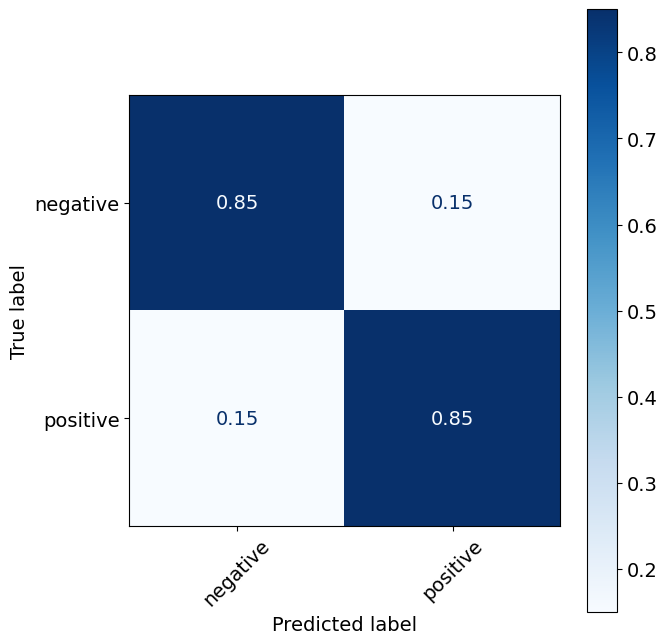

Evaluating model: SVM for arousal
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

        high       0.74      0.70      0.72        84
         low       0.75      0.78      0.77        96

    accuracy                           0.74       180
   macro avg       0.74      0.74      0.74       180
weighted avg       0.74      0.74      0.74       180

Confusion Matrix:
[[0.70238095 0.29761905]
 [0.21875    0.78125   ]]




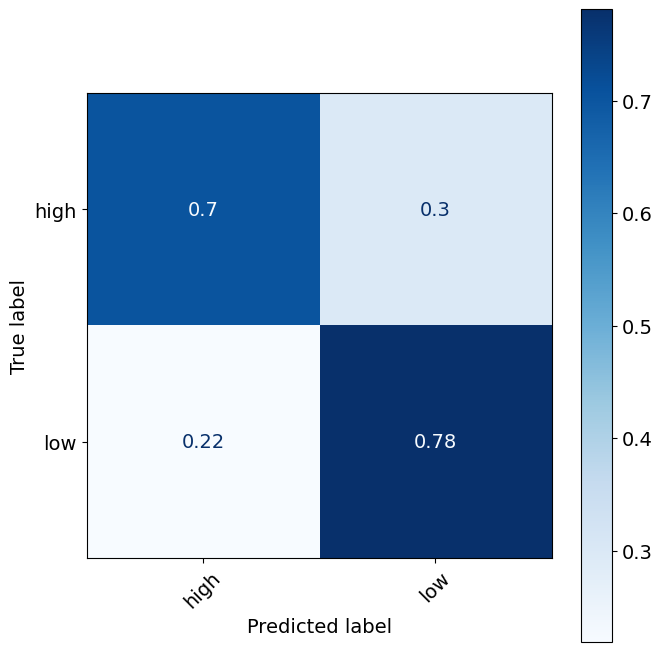

Evaluating model: SVM for original classes
Model: Pipeline
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.67      0.70      0.69        50
 frustration       0.59      0.48      0.53        50
     petting       0.83      0.83      0.83        46
         toy       0.66      0.79      0.72        34

    accuracy                           0.69       180
   macro avg       0.69      0.70      0.69       180
weighted avg       0.69      0.69      0.68       180

Confusion Matrix:
[[0.7        0.22       0.02       0.06      ]
 [0.26       0.48       0.12       0.14      ]
 [0.04347826 0.04347826 0.82608696 0.08695652]
 [0.05882353 0.11764706 0.02941176 0.79411765]]




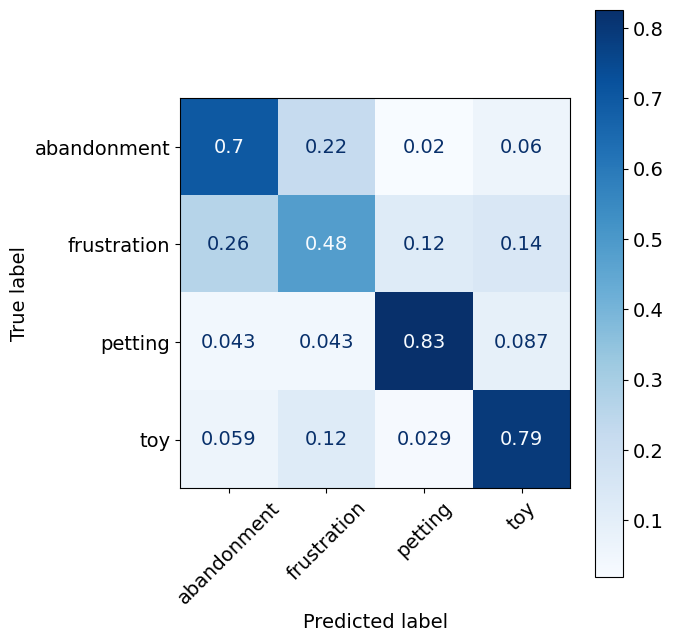

Evaluating model: Decision Tree for valence
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.76      0.84      0.80       100
    positive       0.77      0.68      0.72        80

    accuracy                           0.77       180
   macro avg       0.77      0.76      0.76       180
weighted avg       0.77      0.77      0.76       180

Confusion Matrix:
[[0.84  0.16 ]
 [0.325 0.675]]




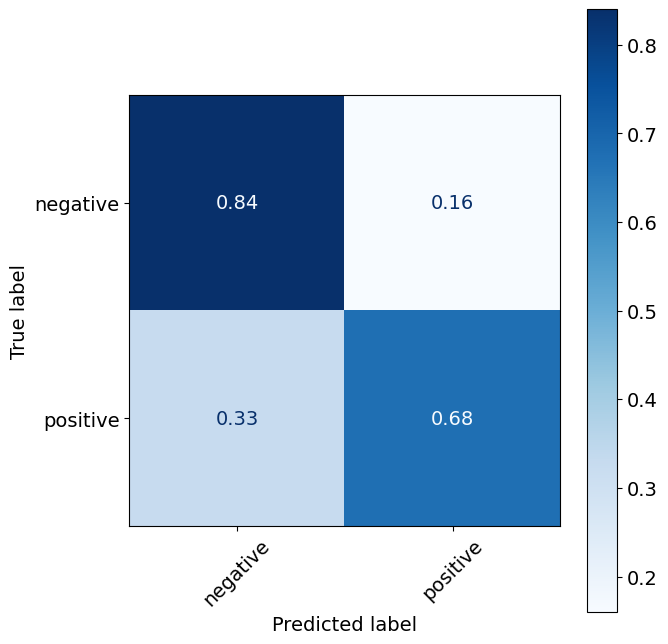

Evaluating model: Decision Tree for arousal
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.73      0.79      0.76        84
         low       0.80      0.75      0.77        96

    accuracy                           0.77       180
   macro avg       0.77      0.77      0.77       180
weighted avg       0.77      0.77      0.77       180

Confusion Matrix:
[[0.78571429 0.21428571]
 [0.25       0.75      ]]




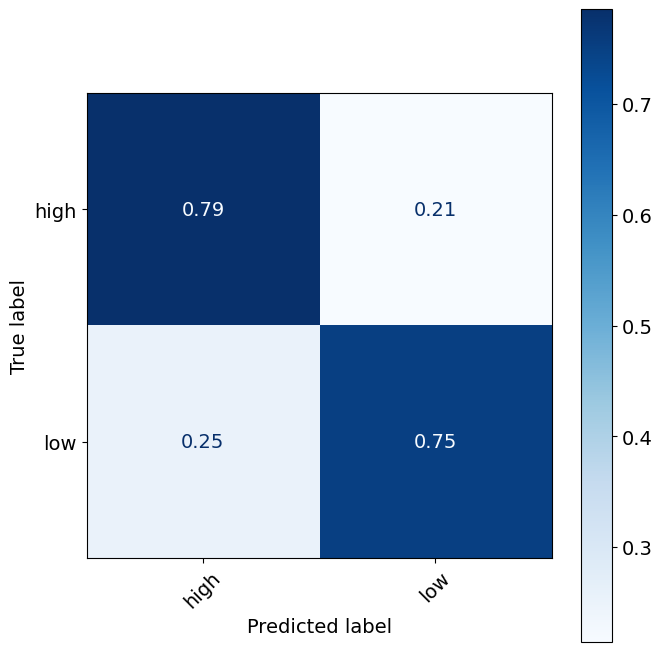

Evaluating model: Decision Tree for original classes
Model: DecisionTreeClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.56      0.68      0.61        50
 frustration       0.58      0.56      0.57        50
     petting       0.92      0.76      0.83        46
         toy       0.58      0.56      0.57        34

    accuracy                           0.64       180
   macro avg       0.66      0.64      0.65       180
weighted avg       0.66      0.64      0.65       180

Confusion Matrix:
[[0.68       0.18       0.04       0.1       ]
 [0.32       0.56       0.         0.12      ]
 [0.06521739 0.10869565 0.76086957 0.06521739]
 [0.23529412 0.17647059 0.02941176 0.55882353]]




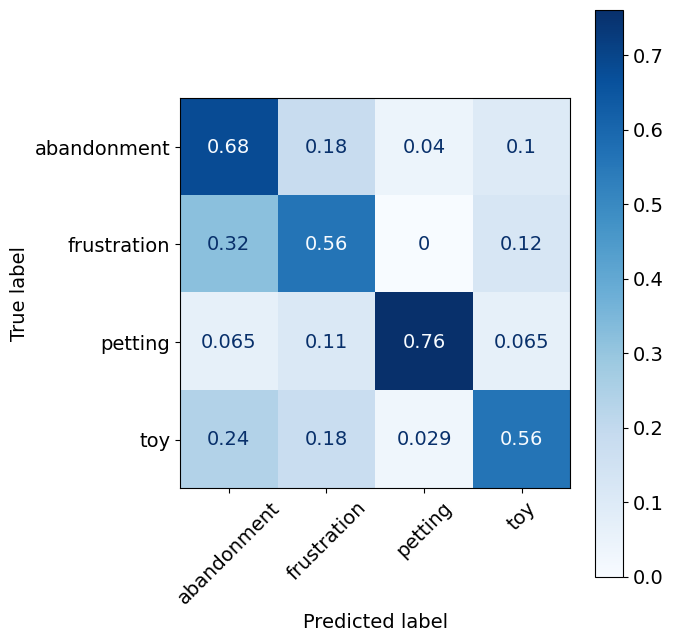

Evaluating model: Extra Trees for valence


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

    negative       0.95      0.91      0.93       100
    positive       0.89      0.94      0.91        80

    accuracy                           0.92       180
   macro avg       0.92      0.92      0.92       180
weighted avg       0.92      0.92      0.92       180

Confusion Matrix:
[[0.91   0.09  ]
 [0.0625 0.9375]]




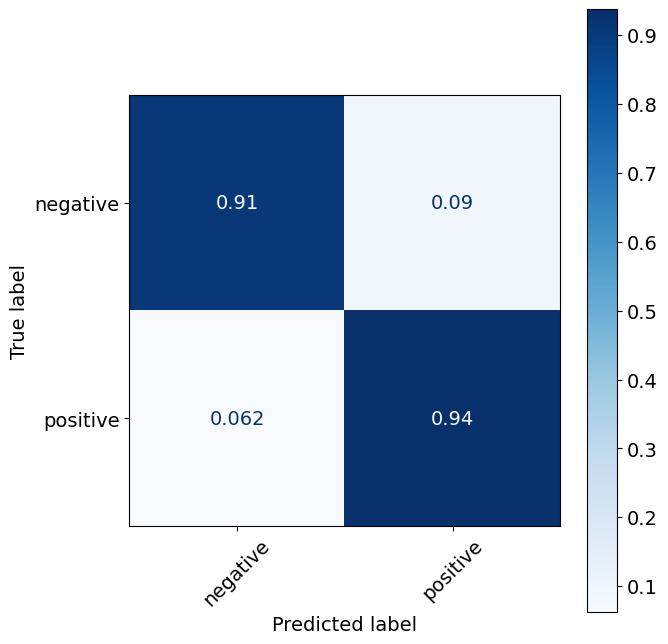

Evaluating model: Extra Trees for arousal


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

        high       0.88      0.82      0.85        84
         low       0.85      0.91      0.88        96

    accuracy                           0.87       180
   macro avg       0.87      0.86      0.87       180
weighted avg       0.87      0.87      0.87       180

Confusion Matrix:
[[0.82142857 0.17857143]
 [0.09375    0.90625   ]]




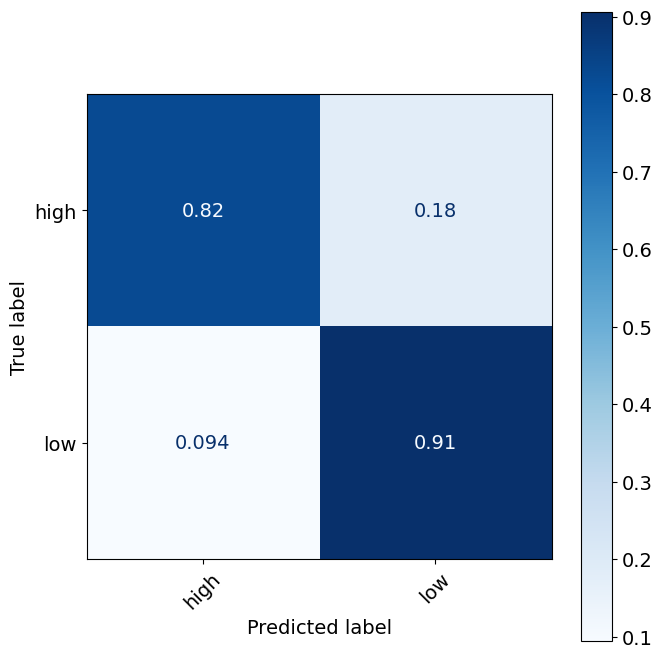

Evaluating model: Extra Trees for original classes


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: ExtraTreesClassifier
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.84      0.84      0.84        50
 frustration       0.93      0.82      0.87        50
     petting       0.85      0.89      0.87        46
         toy       0.76      0.85      0.81        34

    accuracy                           0.85       180
   macro avg       0.85      0.85      0.85       180
weighted avg       0.85      0.85      0.85       180

Confusion Matrix:
[[0.84       0.06       0.04       0.06      ]
 [0.04       0.82       0.08       0.06      ]
 [0.04347826 0.         0.89130435 0.06521739]
 [0.11764706 0.         0.02941176 0.85294118]]




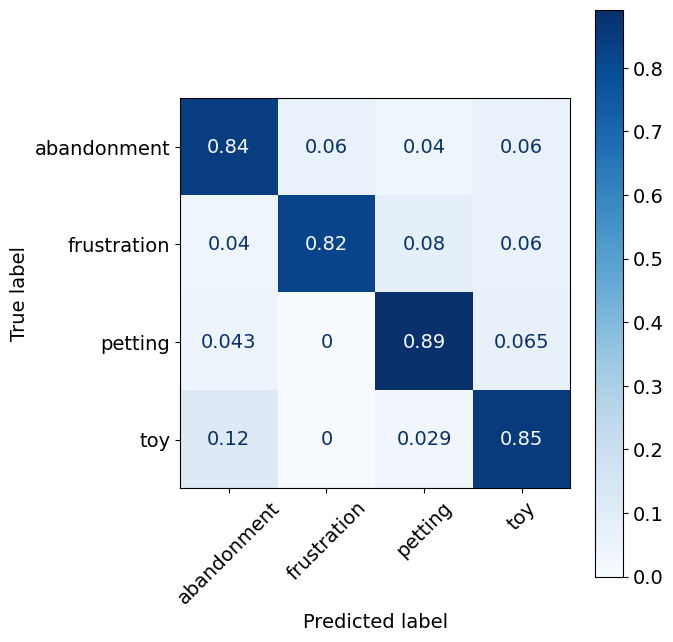

In [ ]:
evaluate_models(multimodal_df_grouped)

In [ ]:
evaluate_models(multimodal_df)

In [ ]:
multimodal_df = pd.read_csv("multimodal.csv")

In [ ]:
phys_df = pd.read_csv("phys_df.csv")
imu_df = pd.read_csv("features_df.csv")

Model: Naive Bayes
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.46      0.66      0.54        50
 frustration       0.38      0.12      0.18        50
     petting       0.62      0.62      0.62        50
         toy       0.58      0.72      0.64        50

    accuracy                           0.53       200
   macro avg       0.51      0.53      0.50       200
weighted avg       0.51      0.53      0.50       200

Confusion Matrix:
[[0.66 0.08 0.16 0.1 ]
 [0.36 0.12 0.16 0.36]
 [0.28 0.04 0.62 0.06]
 [0.14 0.08 0.06 0.72]]




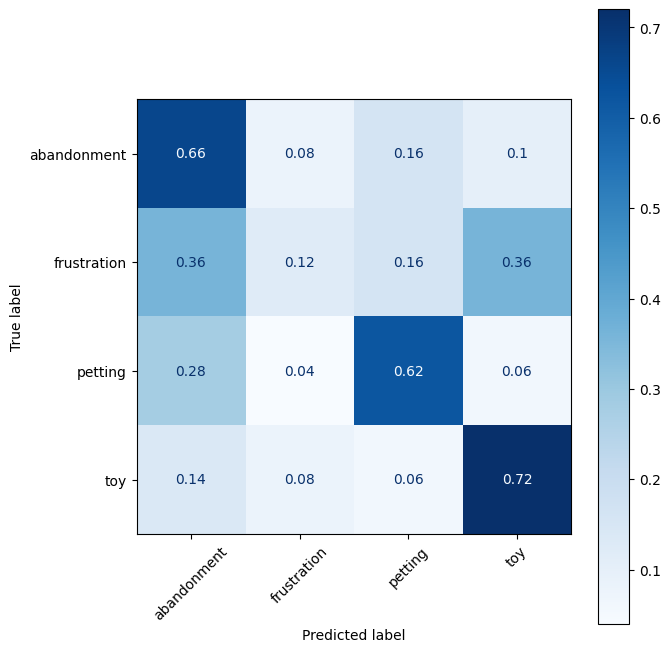

Model: KNN
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.51      0.62      0.56        50
 frustration       0.49      0.38      0.43        50
     petting       0.65      0.80      0.71        50
         toy       0.66      0.50      0.57        50

    accuracy                           0.57       200
   macro avg       0.57      0.57      0.57       200
weighted avg       0.57      0.57      0.57       200

Confusion Matrix:
[[0.62 0.12 0.16 0.1 ]
 [0.36 0.38 0.16 0.1 ]
 [0.04 0.1  0.8  0.06]
 [0.2  0.18 0.12 0.5 ]]




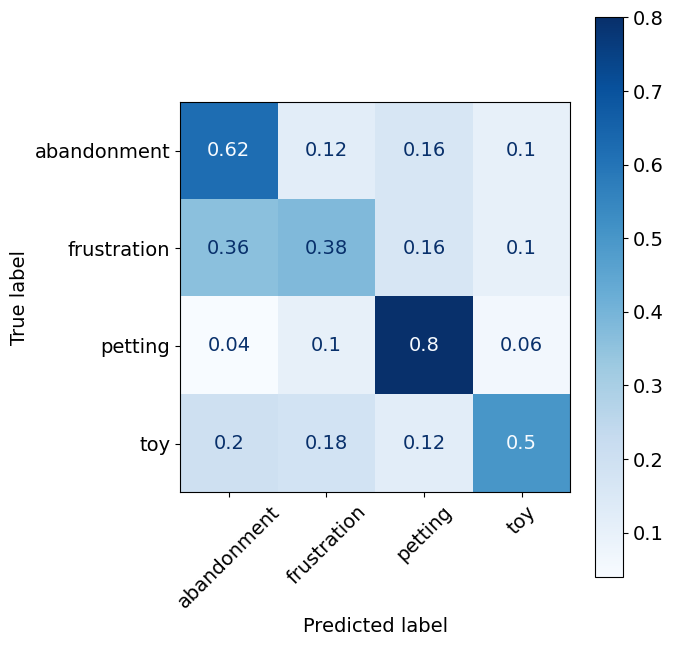

Model: SVM
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.60      0.64      0.62        50
 frustration       0.47      0.48      0.48        50
     petting       0.66      0.70      0.68        50
         toy       0.67      0.58      0.62        50

    accuracy                           0.60       200
   macro avg       0.60      0.60      0.60       200
weighted avg       0.60      0.60      0.60       200

Confusion Matrix:
[[0.64 0.22 0.04 0.1 ]
 [0.2  0.48 0.16 0.16]
 [0.16 0.12 0.7  0.02]
 [0.06 0.2  0.16 0.58]]




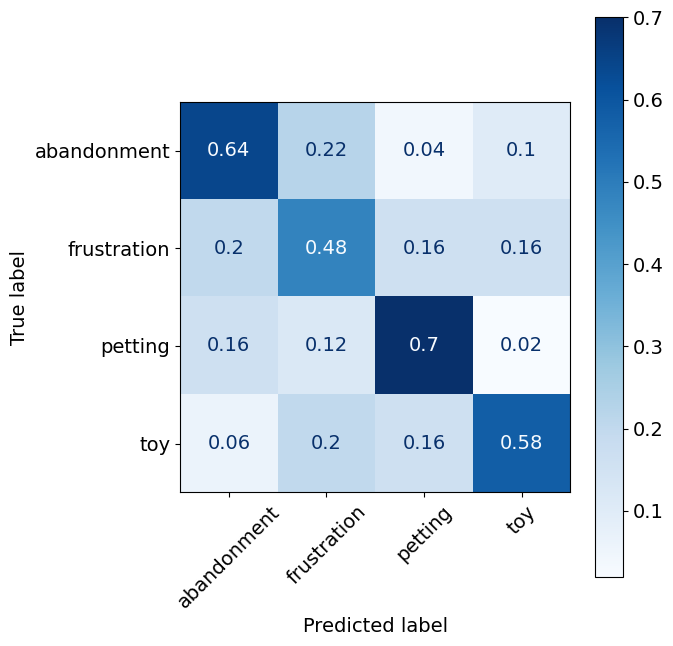

Model: Decision Tree
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.66      0.58      0.62        50
 frustration       0.60      0.70      0.65        50
     petting       0.70      0.74      0.72        50
         toy       0.82      0.74      0.78        50

    accuracy                           0.69       200
   macro avg       0.70      0.69      0.69       200
weighted avg       0.70      0.69      0.69       200

Confusion Matrix:
[[0.58 0.26 0.12 0.04]
 [0.18 0.7  0.06 0.06]
 [0.06 0.14 0.74 0.06]
 [0.06 0.06 0.14 0.74]]




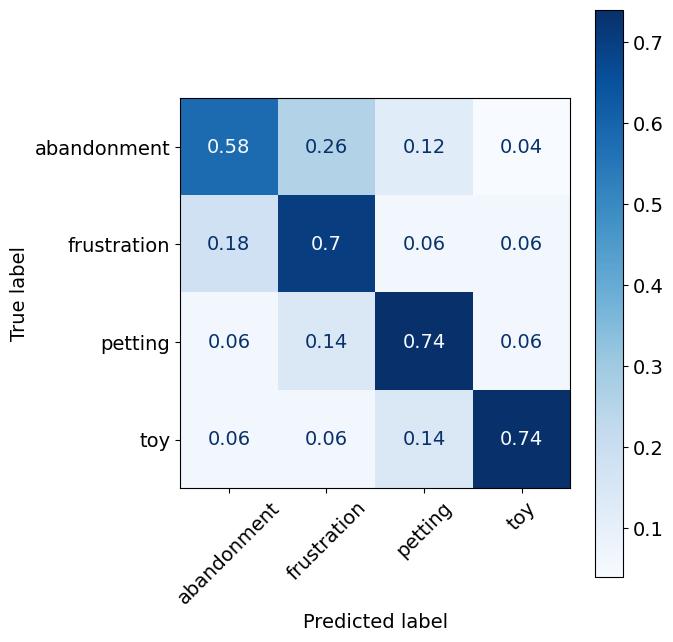

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: Extra Trees
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.80      0.80      0.80        50
 frustration       0.90      0.72      0.80        50
     petting       0.88      0.88      0.88        50
         toy       0.75      0.90      0.82        50

    accuracy                           0.82       200
   macro avg       0.83      0.82      0.82       200
weighted avg       0.83      0.82      0.82       200

Confusion Matrix:
[[0.8  0.08 0.02 0.1 ]
 [0.12 0.72 0.04 0.12]
 [0.04 0.   0.88 0.08]
 [0.04 0.   0.06 0.9 ]]




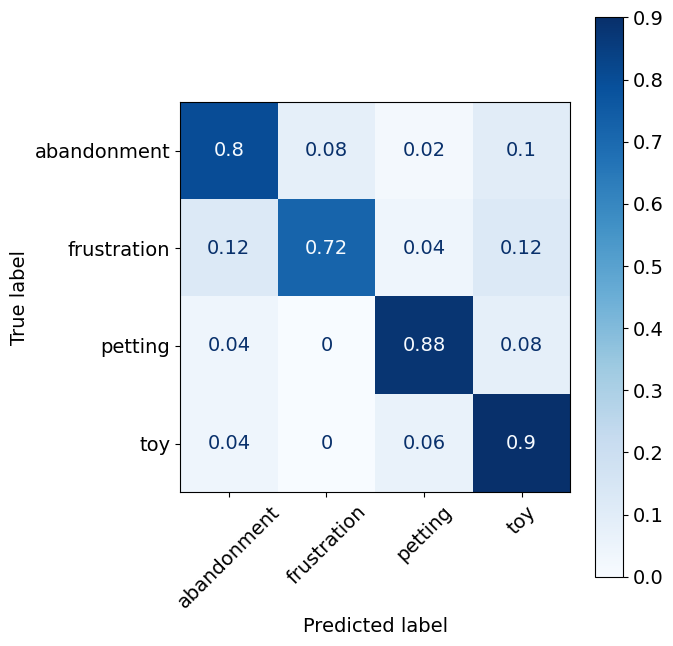

In [ ]:
evaluate_models(multimodal_df)

Model: Naive Bayes
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.43      0.52      0.47        50
 frustration       0.75      0.48      0.59        50
     petting       0.48      0.68      0.56        50
         toy       0.56      0.40      0.47        50

    accuracy                           0.52       200
   macro avg       0.55      0.52      0.52       200
weighted avg       0.55      0.52      0.52       200

Confusion Matrix:
[[0.52 0.12 0.14 0.22]
 [0.32 0.48 0.2  0.  ]
 [0.2  0.02 0.68 0.1 ]
 [0.18 0.02 0.4  0.4 ]]




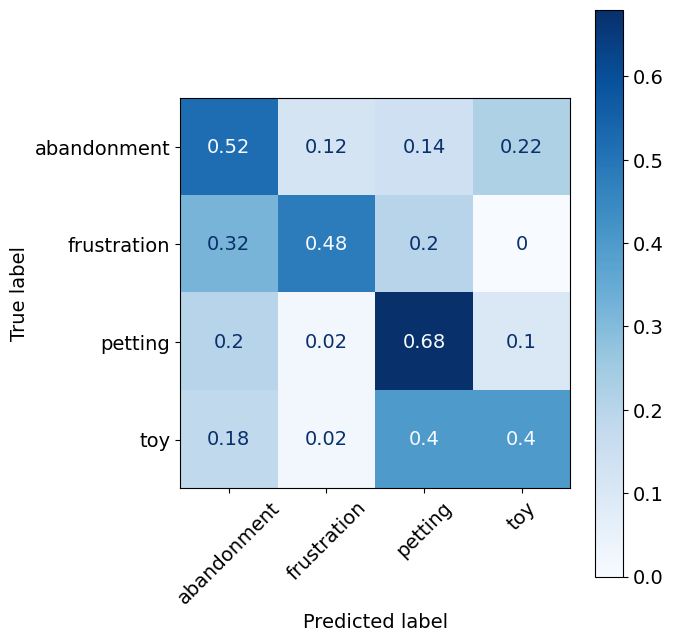

Model: KNN
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.62      0.70      0.66        50
 frustration       0.57      0.54      0.56        50
     petting       0.55      0.64      0.59        50
         toy       0.59      0.46      0.52        50

    accuracy                           0.58       200
   macro avg       0.59      0.58      0.58       200
weighted avg       0.59      0.58      0.58       200

Confusion Matrix:
[[0.7  0.06 0.1  0.14]
 [0.12 0.54 0.2  0.14]
 [0.16 0.16 0.64 0.04]
 [0.14 0.18 0.22 0.46]]




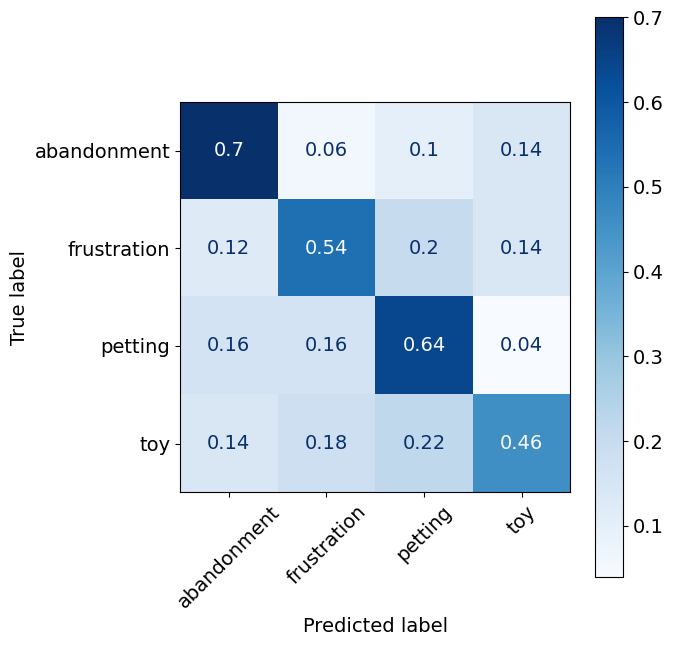

Model: SVM
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.84      0.64      0.73        50
 frustration       0.85      0.66      0.74        50
     petting       0.43      0.54      0.48        50
         toy       0.53      0.64      0.58        50

    accuracy                           0.62       200
   macro avg       0.66      0.62      0.63       200
weighted avg       0.66      0.62      0.63       200

Confusion Matrix:
[[0.64 0.1  0.2  0.06]
 [0.02 0.66 0.2  0.12]
 [0.06 0.02 0.54 0.38]
 [0.04 0.   0.32 0.64]]




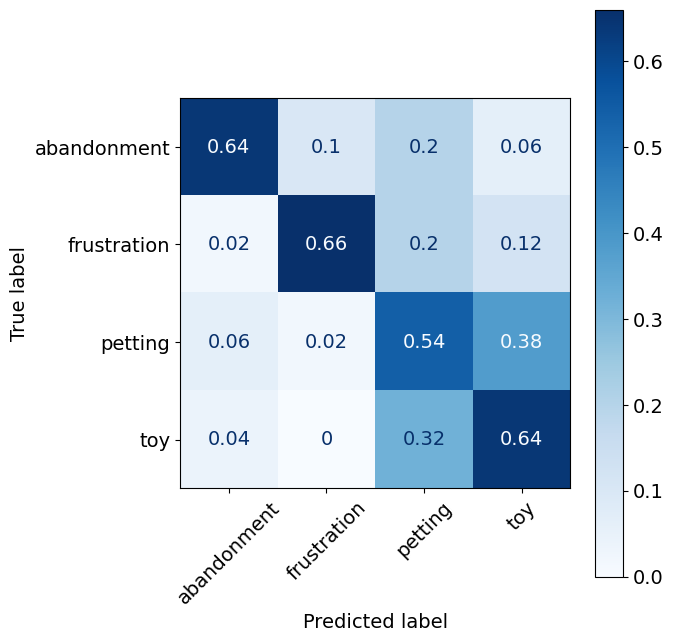

Model: Decision Tree
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.82      0.74      0.78        50
 frustration       0.73      0.74      0.73        50
     petting       0.77      0.80      0.78        50
         toy       0.79      0.82      0.80        50

    accuracy                           0.78       200
   macro avg       0.78      0.78      0.77       200
weighted avg       0.78      0.78      0.77       200

Confusion Matrix:
[[0.74 0.16 0.06 0.04]
 [0.08 0.74 0.08 0.1 ]
 [0.08 0.04 0.8  0.08]
 [0.   0.08 0.1  0.82]]




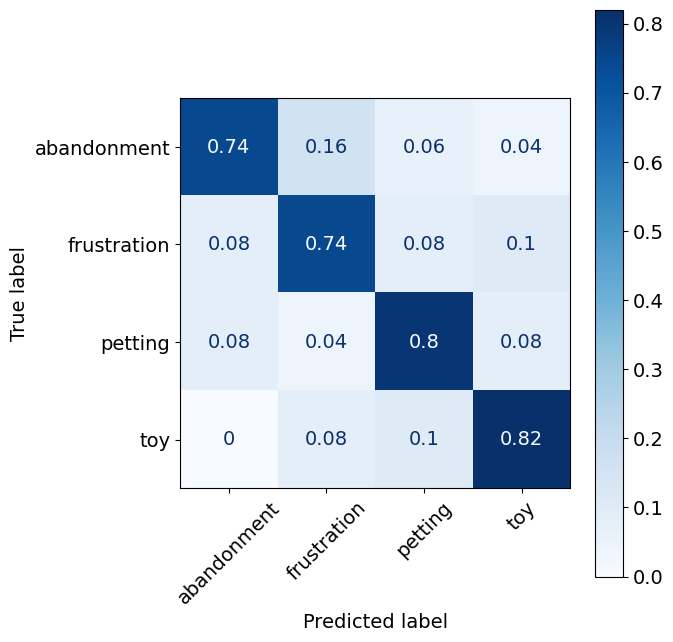

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: Extra Trees
Classification Report:
              precision    recall  f1-score   support

 abandonment       1.00      1.00      1.00        50
 frustration       1.00      0.92      0.96        50
     petting       0.98      1.00      0.99        50
         toy       0.94      1.00      0.97        50

    accuracy                           0.98       200
   macro avg       0.98      0.98      0.98       200
weighted avg       0.98      0.98      0.98       200

Confusion Matrix:
[[1.   0.   0.   0.  ]
 [0.   0.92 0.02 0.06]
 [0.   0.   1.   0.  ]
 [0.   0.   0.   1.  ]]




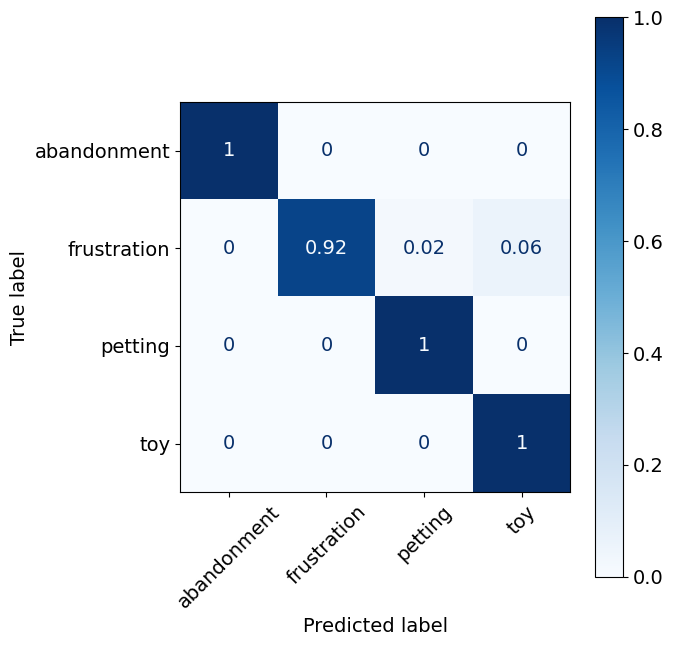

In [ ]:
evaluate_models(phys_df)

In [ ]:
imu_df

,Unnamed: 0,DogName,TrialType,StartTimestamp,EndTimestamp,AccX_Mean,AccX_Median,AccX_Std,AccX_Variance,AccX_Min,...,GyrMagnitude_Q1,GyrMagnitude_Q3,GyrMagnitude_IQR,GyrMagnitude_Skew,GyrMagnitude_Kurtosis,GyrMagnitude_RMS,GyrMagnitude_Entropy,GyrMagnitude_NumPeaks,GyrMagnitude_SMA,GyrMagnitude_Energy
0,0,Archi,abandonment,2023-11-26 11:28:24.765,2023-11-26 11:28:28.941,0.023737,0.006799,0.108705,0.011817,-0.225023,...,0.428341,0.752786,0.324445,1.072340,4.224252,0.660154,0.236874,343,754.374646,544.753850
1,1,Archi,abandonment,2023-11-26 11:28:28.944,2023-11-26 11:28:33.901,0.027238,0.047302,0.234707,0.055088,-0.909032,...,0.505559,1.035684,0.530125,2.007386,5.214343,1.065332,2.380043,250,1091.534742,1418.664134
2,2,Archi,abandonment,2023-11-26 11:28:33.905,2023-11-26 11:28:39.043,-0.075454,-0.084464,0.753635,0.567966,-3.250172,...,1.437288,3.886970,2.449682,1.750581,5.008005,3.438998,1.837404,135,3553.209521,14783.382102
3,3,Archi,abandonment,2023-11-26 11:28:39.047,2023-11-26 11:28:44.236,-0.161388,-0.098986,0.603432,0.364130,-2.894178,...,1.028333,2.578178,1.549845,3.272948,18.400595,2.894761,1.231497,157,2672.333080,10474.549154
4,4,Archi,abandonment,2023-11-26 11:28:44.240,2023-11-26 11:28:49.327,0.022477,-0.139489,0.818069,0.669236,-2.287176,...,2.343799,4.634120,2.290321,2.098335,6.550672,4.578980,1.595862,124,4782.444674,26208.817082
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
288,288,Sam,toy,2023-10-23 10:42:46.308,2023-10-23 10:42:51.386,-0.122818,0.000063,1.303582,1.699325,-6.768617,...,3.694874,9.089434,5.394560,2.914723,13.257465,9.669150,0.767211,201,9600.028091,116865.566781
289,289,Sam,toy,2023-10-23 10:42:51.390,2023-10-23 10:42:56.506,-0.024542,0.017116,0.667502,0.445559,-3.153787,...,2.093475,3.262218,1.168744,1.899500,4.171556,3.183199,2.363854,191,3580.243614,12665.944343
290,290,Sam,toy,2023-10-23 10:42:56.511,2023-10-23 10:43:01.600,-0.091467,-0.021254,0.420716,0.177002,-2.847089,...,2.278787,4.146803,1.868016,-0.187665,0.964948,3.535529,2.264285,219,4173.653282,15624.954573
291,291,Sam,toy,2023-10-23 10:43:01.604,2023-10-23 10:43:06.654,0.093028,0.009655,0.536220,0.287532,-4.717656,...,4.520083,4.791672,0.271589,3.529940,13.310876,6.019755,1.121544,303,6806.828240,45296.817711


In [ ]:
evaluate_models(imu_df)

ValueError: Input X contains NaN.
GaussianNB does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

Model: Naive Bayes
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.49      0.84      0.62        50
 frustration       0.60      0.12      0.20        50
     petting       0.71      0.70      0.71        50
         toy       0.61      0.68      0.64        50

    accuracy                           0.58       200
   macro avg       0.60      0.58      0.54       200
weighted avg       0.60      0.58      0.54       200

Confusion Matrix:
[[0.84 0.02 0.04 0.1 ]
 [0.44 0.12 0.16 0.28]
 [0.22 0.02 0.7  0.06]
 [0.2  0.04 0.08 0.68]]




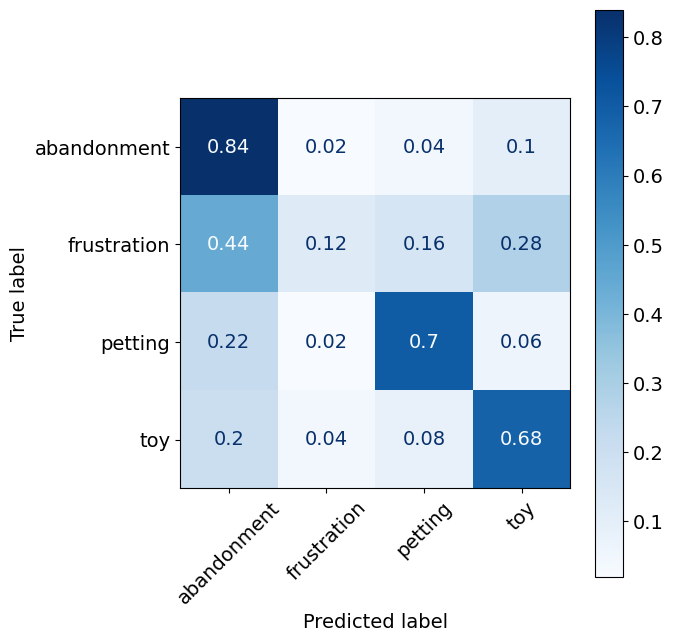

Model: KNN
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.61      0.66      0.63        50
 frustration       0.57      0.48      0.52        50
     petting       0.70      0.78      0.74        50
         toy       0.62      0.60      0.61        50

    accuracy                           0.63       200
   macro avg       0.63      0.63      0.63       200
weighted avg       0.63      0.63      0.63       200

Confusion Matrix:
[[0.66 0.08 0.16 0.1 ]
 [0.22 0.48 0.14 0.16]
 [0.06 0.06 0.78 0.1 ]
 [0.14 0.22 0.04 0.6 ]]




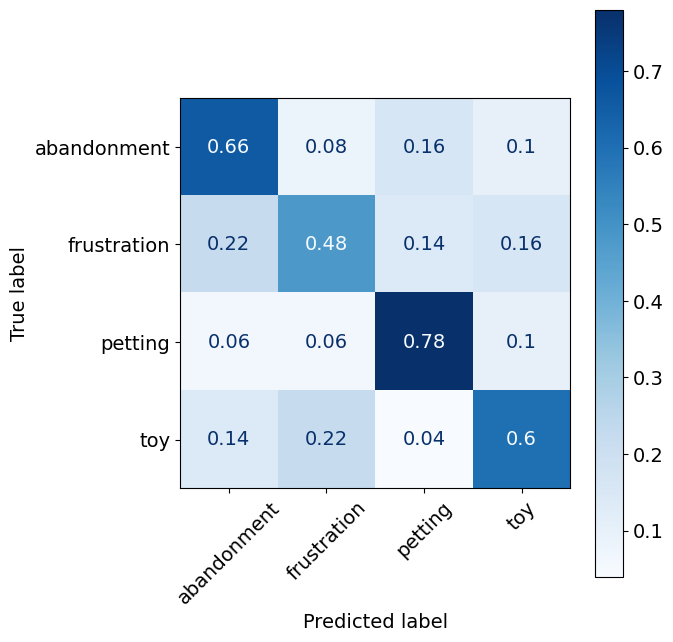

Model: SVM
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.63      0.68      0.65        50
 frustration       0.61      0.44      0.51        50
     petting       0.68      0.82      0.75        50
         toy       0.74      0.74      0.74        50

    accuracy                           0.67       200
   macro avg       0.67      0.67      0.66       200
weighted avg       0.67      0.67      0.66       200

Confusion Matrix:
[[0.68 0.12 0.1  0.1 ]
 [0.28 0.44 0.16 0.12]
 [0.08 0.06 0.82 0.04]
 [0.04 0.1  0.12 0.74]]




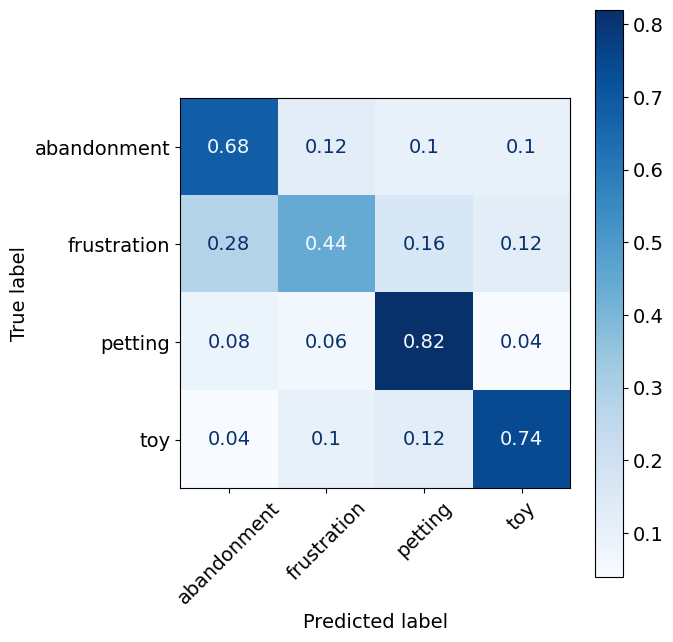

Model: Decision Tree
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.63      0.66      0.65        50
 frustration       0.64      0.54      0.59        50
     petting       0.65      0.70      0.67        50
         toy       0.73      0.76      0.75        50

    accuracy                           0.67       200
   macro avg       0.66      0.67      0.66       200
weighted avg       0.66      0.67      0.66       200

Confusion Matrix:
[[0.66 0.16 0.1  0.08]
 [0.18 0.54 0.16 0.12]
 [0.14 0.08 0.7  0.08]
 [0.06 0.06 0.12 0.76]]




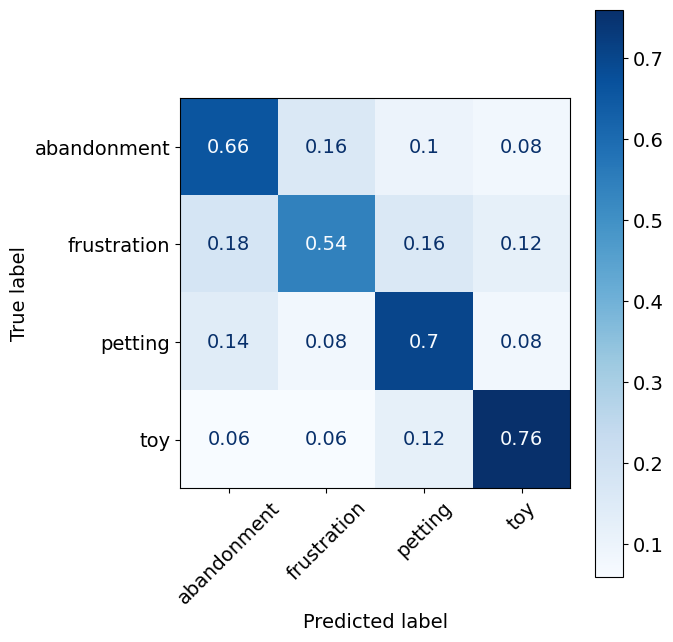

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Model: Extra Trees
Classification Report:
              precision    recall  f1-score   support

 abandonment       0.89      0.82      0.85        50
 frustration       0.93      0.76      0.84        50
     petting       0.90      0.92      0.91        50
         toy       0.77      0.96      0.86        50

    accuracy                           0.86       200
   macro avg       0.87      0.86      0.86       200
weighted avg       0.87      0.86      0.86       200

Confusion Matrix:
[[0.82 0.06 0.02 0.1 ]
 [0.06 0.76 0.04 0.14]
 [0.04 0.   0.92 0.04]
 [0.   0.   0.04 0.96]]




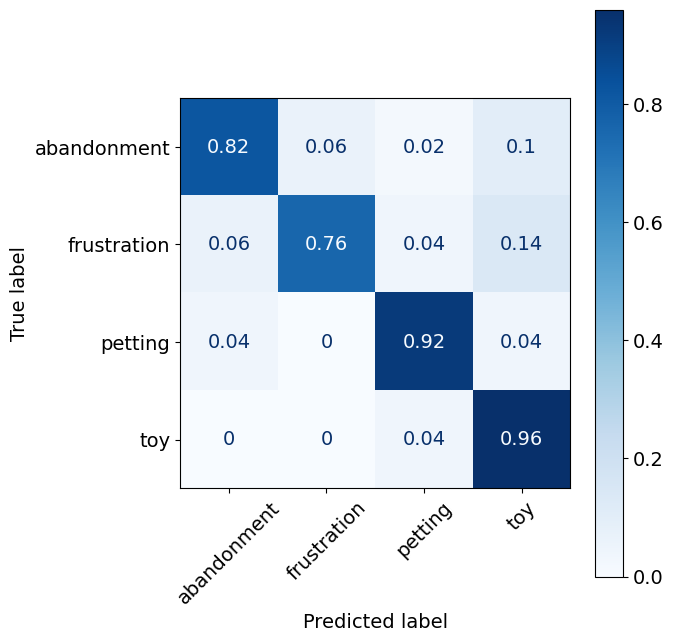

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


In [ ]:
evaluate_models(final_merged_df)

In [ ]:
merged_df = pd.read_csv("merged_df.csv")

In [ ]:
merged_df

In [ ]:
final_merged_df.to_csv("Final feature merged.csv")

## K fold 5 splits results

### Remap DFs

In [ ]:
def map_column_values(df, column_name, mapping):
    """
    Maps the values of a specified column in the dataframe according to a given mapping dictionary.

    Args:
    df (pd.DataFrame): The original dataframe.
    column_name (str): The name of the column to be mapped.
    mapping (dict): A dictionary where keys are the original values and values are the new values to map.

    Returns:
    pd.DataFrame: A new dataframe with the mapped column values.
    """
    # Create a copy of the dataframe to avoid modifying the original dataframe
    new_df = df.copy()
    # Apply the mapping to the specified column
    new_df[column_name] = new_df[column_name].map(mapping)
    return new_df

In [ ]:
# Define the mappings
mapping1 = {'abandonment': 'low', 'frustration': 'high', 'petting': 'low', 'toy': 'high'}
mapping2 = {'abandonment': 'negative', 'frustration': 'negative', 'petting': 'positive', 'toy': 'positive'}

features_df_arousal = map_column_values(features_df, 'TrialType', mapping1)
features_df_valence = map_column_values(features_df, 'TrialType', mapping2)

phys_merged_arousal = map_column_values(phys_merged_df, 'TrialType', mapping1)
phys_merged_valence = map_column_values(phys_merged_df, 'TrialType', mapping2)

multimodal_df_arousal = map_column_values(multimodal_df,'TrialType', mapping1)
multimodal_df_valence = map_column_values(multimodal_df,'TrialType', mapping2)

In [ ]:
features_df.to_csv("features_df.csv")

### All features results

#### Inertial Signals

In [ ]:
features_df.fillna(0,inplace=True)
evaluate_models(features_df)

In [ ]:
evaluate_models(features_df_arousal)

In [ ]:
evaluate_models(features_df_valence)

#### Phys signals

In [ ]:
evaluate_models(phys_merged_df)

In [ ]:
evaluate_models(phys_merged_arousal)

In [ ]:
evaluate_models(phys_merged_valence)

#### Multimodal Signals

In [ ]:
evaluate_models(multimodal_df)

In [ ]:
evaluate_models(multimodal_df_arousal)

In [ ]:
evaluate_models(multimodal_df_valence)

### Best 15 features results

#### Multimodal results

In [ ]:
evaluate_models_20bestRF(multimodal_df)

In [ ]:
evaluate_models_20bestRF(multimodal_df_arousal)

In [ ]:
evaluate_models_20bestRF(multimodal_df_valence)

#### Phys results

In [ ]:
evaluate_models_20bestRF(phys_merged_df)

In [ ]:
evaluate_models_20bestRF(phys_merged_arousal)

In [ ]:
evaluate_models_20bestRF(phys_merged_valence)

#### IMU results

In [ ]:
evaluate_models_20bestRF(features_df)

In [ ]:
evaluate_models_20bestRF(features_df_arousal)

In [ ]:
evaluate_models_20bestRF(features_df_valence)

## Stratified results and code

In [ ]:
def evaluate_models_stratified(features_df):
    # Data preparation: Drop irrelevant features
    X = features_df.drop(['DogName', 'TrialType', 'StartTimestamp', 'EndTimestamp', 'Trial Name', 'has_bbox'], axis=1, errors='ignore')
    y = features_df['TrialType']
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)

    # Stratified split into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, stratify=y_encoded, random_state=42)

    # Models to evaluate the data
    models = {
        "Naive Bayes": GaussianNB(),
        "KNN": KNeighborsClassifier(),
        "SVM": make_pipeline(StandardScaler(), SVC(gamma='auto')),
        "Decision Tree": DecisionTreeClassifier()
    }

    # Evaluate each model using the stratified train-test split
    for name, model in models.items():
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        predictions_decoded = le.inverse_transform(predictions)

        print(f"Model: {name}")
        print("Classification Report:")
        print(classification_report(le.inverse_transform(y_test), predictions_decoded))

        print("Confusion Matrix:")
        cm = confusion_matrix(le.inverse_transform(y_test), predictions_decoded, labels=le.classes_, normalize="true")
        print(cm)
        print("\n")
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
        fig, ax = plt.subplots(figsize=(7, 7))
        disp.plot(ax=ax, cmap='Blues', colorbar=True)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.rcParams.update({'font.size': 14})
        plt.show()

###Results all features

In [ ]:
evaluate_models_stratified(features_df)

In [ ]:
evaluate_models_stratified(phys_merged_df)

In [ ]:
evaluate_models_stratified(multimodal_df)

## Extra stuff

In [ ]:
# Load the CSV file into a DataFrame
csv_file_path = '/content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Sam ToyDLC_resnet50_SamsNov6shuffle1_180000.csv'
df = pd.read_csv(csv_file_path)
new_keypoints = ['nose','upper_jaw','right_eye','right_earbase','right_earend','left_eye', 'left_earbase','left_earend','throat_end','back_base','tail_base','tail_end', 'front_left_thai'
    , 'front_left_knee','front_left_paw','front_right_thai', 'front_right_knee','front_right_paw','back_left_thai', 'back_left_knee','back_left_paw','back_right_thai', 'back_right_knee','back_right_paw']
# Existing mapping from new keypoints to old keypoints
mapping = {
    'nose': 'Nose', 'back_base': 'Withers', 'tail_base': 'TailSet', 'tail_end': 'TailTip',
    'left_earbase': 'LBEar', 'right_earbase': 'LREar', 'left_earend': 'LTEar', 'right_earend': 'RTEar',
    'upper_jaw': 'Chin', 'throat_end': 'Throat', 'front_left_thai': 'LFElbow', 'front_left_knee': 'LFWrist',
    'front_left_paw': 'LFPaw', 'front_right_thai': 'RFElbow', 'front_right_knee': 'RFWrist',
    'front_right_paw': 'RFPaw', 'back_left_thai': 'LRElbow', 'back_left_knee': 'LRWrist',
    'back_left_paw': 'LRPaw', 'back_right_thai': 'RBElbow', 'back_right_knee': 'RBWrist',
    'back_right_paw': 'RBPaw', 'left_eye' : 'LEye', 'right_eye': 'REye'
}

# Invert the mapping to go from old keypoints to new keypoints
inverse_mapping = {v: k for k, v in mapping.items()}

# Generate new column names based on the new keypoints list and suffixes for x, y, and likelihood
new_columns = []
for keypoint in new_keypoints:
    for suffix in ['x_', 'y_', 'likelihood_']:
        new_column = suffix + keypoint
        old_keypoint = mapping.get(keypoint, None)
        if old_keypoint:
            old_column = suffix + old_keypoint
            if old_column in df.columns:
                df.rename(columns={old_column: new_column}, inplace=True)
        new_columns.append(new_column)

# Ensure that the DataFrame contains only the columns that exist in the new columns list and in the correct order
df = df[[col for col in new_columns if col in df.columns]]

# Save the reordered DataFrame back to CSV
output_csv_file_path = '/content/drive/MyDrive/Tesis/PATITA Data/CSVs/Visual Data Features/Sam ToyDLC_resnet50_SamsNov6shuffle1_180000.csv'
df.to_csv(output_csv_file_path, index=False)


print(f"Data reordered and saved to {output_csv_file_path}")

In [ ]:
def process_csv_files(input_folder, output_folder):
    """
    Process all CSV files in the input_folder, applying the column renaming and formatting,
    and then save them to the output_folder.

    Args:
    input_folder (str): Path to the folder containing the CSV files.
    output_folder (str): Path to the folder where processed files will be saved.
    """
    # Ensure the output directory exists
    os.makedirs(output_folder, exist_ok=True)

    # List all CSV files in the input directory
    csv_files = [f for f in os.listdir(input_folder) if f.endswith('.csv') and "Oli" not in f]

    # Define a function to adjust column names
    def adjust_column_names(columns):
        refined_names = ['Frame']  # Start with 'Frame' for the first column
        for i in range(1, len(columns), 3):  # Start from the second element, step by 3
            body_part = columns[i].split('.')[0]  # Get the base body part name from the original headers
            refined_names.extend([
                f"x_{body_part}",
                f"y_{body_part}",
                f"likelihood_{body_part}"
            ])
        return refined_names

    # Process each file
    for file_name in csv_files:
        file_path = os.path.join(input_folder, file_name)
        data = pd.read_csv(file_path, header=1)  # Read the file, skipping the original headers

        # Apply the adjusted column names
        new_column_names = adjust_column_names(data.columns)
        data.columns = new_column_names

        # Save the processed file to the output folder
        output_path = os.path.join(output_folder, file_name)
        data = data.drop(data.index[0])
        data.to_csv(output_path, index=False)
        print(f"Processed and saved: {output_path}")

process_csv_files('/content/drive/MyDrive/Tesis/PATITA Data/CSVs/visual/Tlaxcala', '/content/drive/MyDrive/Tesis/PATITA Data/CSVs/visual/Processed Visual Data')

In [ ]:
visual_features_df.head()

,Frame,x_nose,y_nose,x_upper_jaw,y_upper_jaw,x_right_earbase,y_right_earbase,x_right_earend,y_right_earend,x_left_earbase,...,velocity_x_back_right_paw,acceleration_x_back_right_paw,displacement_y_back_right_paw,velocity_y_back_right_paw,acceleration_y_back_right_paw,bbox_width,bbox_height,bbox_aspect_ratio,bbox_area,Trial Name
0,16,-118.192495,-59.252930,-109.460592,-45.235779,-75.795400,-77.224579,-73.468526,-46.952179,-83.388326,...,0.000000,0.000000,0.000000,0.000000,0.000000,232.000000,186.666667,1.242857,43306.666667,Abandonment
1,150,-74.638519,-171.361074,-65.859924,-156.233877,28.638428,-158.899831,-29.629211,-147.761068,-35.342865,...,10.090751,2.018150,-108.299947,-21.659989,-4.331998,241.666667,176.000000,1.373106,42533.333333,Abandonment
2,323,-8.583649,47.712850,-21.363647,56.872152,-57.900177,1.962575,-64.152222,31.909231,-19.228180,...,-34.454761,-8.909102,127.695536,25.539107,9.439819,323.666667,259.333333,1.248072,83937.555556,Abandonment
3,479,-13.229716,-155.223979,-4.050273,-143.279063,-95.401347,-96.267131,-99.130885,-95.835154,31.660421,...,21.625859,11.216124,-46.464722,-9.292944,-6.966410,282.666667,277.666667,1.018007,78487.111111,Abandonment
4,629,-44.146606,-23.426788,-34.222626,1.378296,26.481720,-78.622833,-49.516968,-39.971100,12.181091,...,10.995937,-2.125984,-25.912771,-5.182554,0.822078,431.000000,309.333333,1.393319,133322.666667,Abandonment


In [ ]:
visual_features_df = pd.read_csv("/content/Visual Feature matrix 5s.csv")
phys_features_df = pd.read_csv("/content/Phys Feature matrix 5s.csv")
imu_features_df = pd.read_csv("/content/IMU Feature matrix 5s.csv")
multimodal_features_df = pd.read_csv("/content/Multimodal Feature matrix 5s.csv")

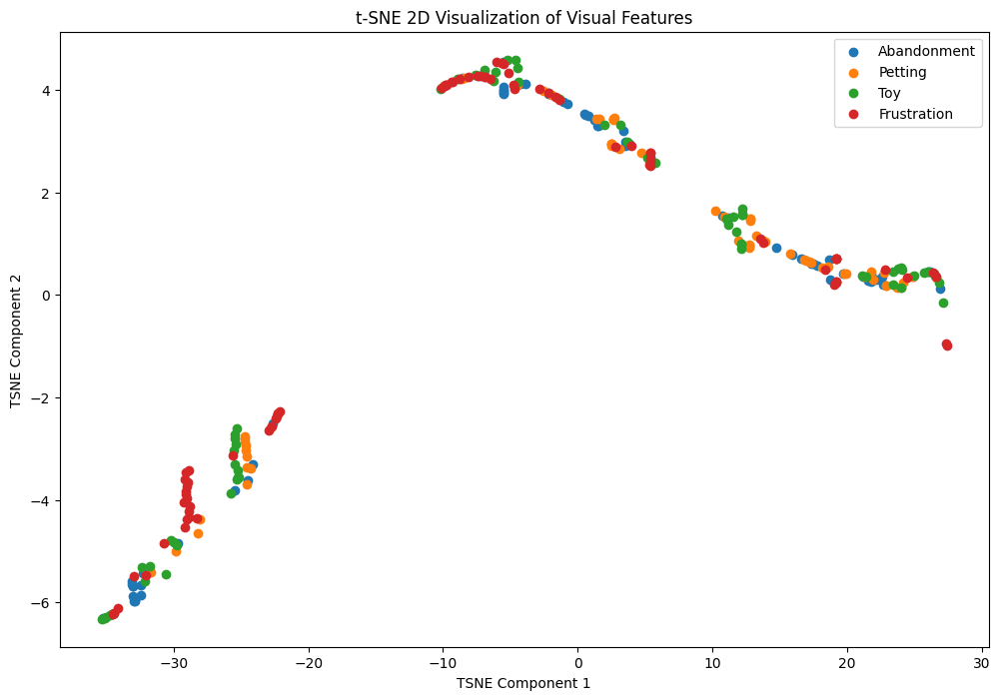

In [ ]:
# Perform t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(visual_features_df.drop(columns=['Trial Name']))

# Create a new dataframe for t-SNE results
tsne_df = pd.DataFrame(tsne_results, columns=['tsne_1', 'tsne_2'])
tsne_df['Trial Name'] = visual_features_df['Trial Name']

# Plot the t-SNE results with labels
plt.figure(figsize=(12, 8))
for label in tsne_df['Trial Name'].unique():
    subset = tsne_df[tsne_df['Trial Name'] == label]
    plt.scatter(subset['tsne_1'], subset['tsne_2'], label=label)
plt.xlabel('TSNE Component 1')
plt.ylabel('TSNE Component 2')
plt.title('t-SNE 2D Visualization of Visual Features')
plt.legend()
plt.show()

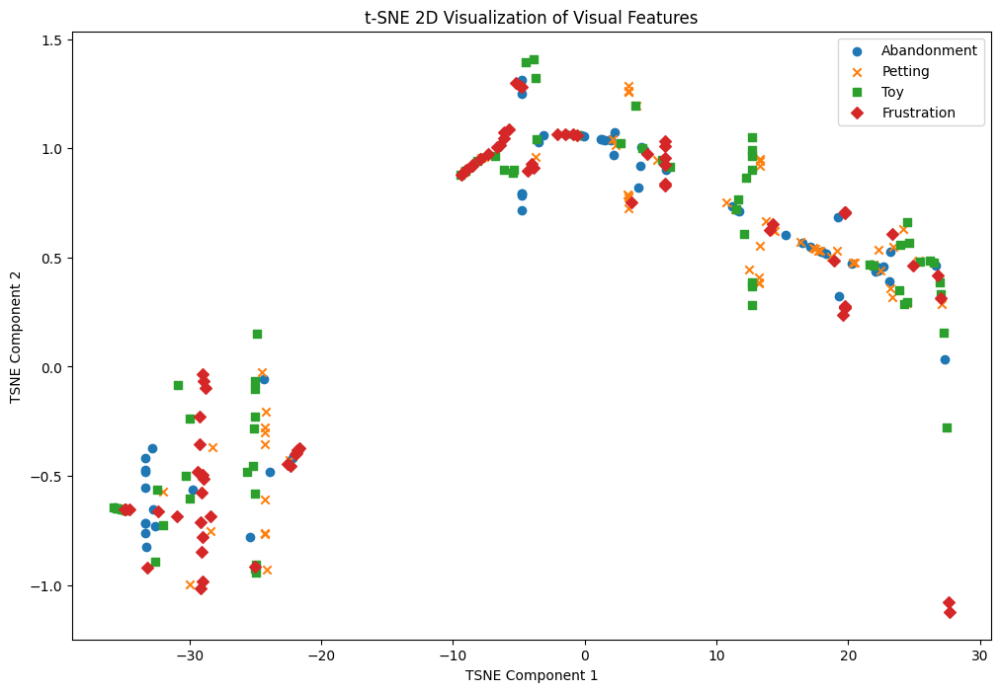

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.manifold import TSNE

# Perform t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(visual_features_df.drop(columns=['Trial Name', 'Dog Name']))

# Create a new dataframe for t-SNE results
tsne_df = pd.DataFrame(tsne_results, columns=['tsne_1', 'tsne_2'])
tsne_df['Trial Name'] = visual_features_df['Trial Name']

markers = {
    'Abandonment': 'o',
    'Petting': 'x',
    'Toy': 's',
    'Frustration': 'D',
}

plt.figure(figsize=(12, 8))
for label in tsne_df['Trial Name'].unique():
    subset = tsne_df[tsne_df['Trial Name'] == label]
    plt.scatter(subset['tsne_1'], subset['tsne_2'], label=label, marker=markers.get(label, 'o'))  # Use 'o' as default marker
plt.xlabel('TSNE Component 1')
plt.ylabel('TSNE Component 2')
plt.title('t-SNE 2D Visualization of Visual Features')
plt.legend()
plt.show()


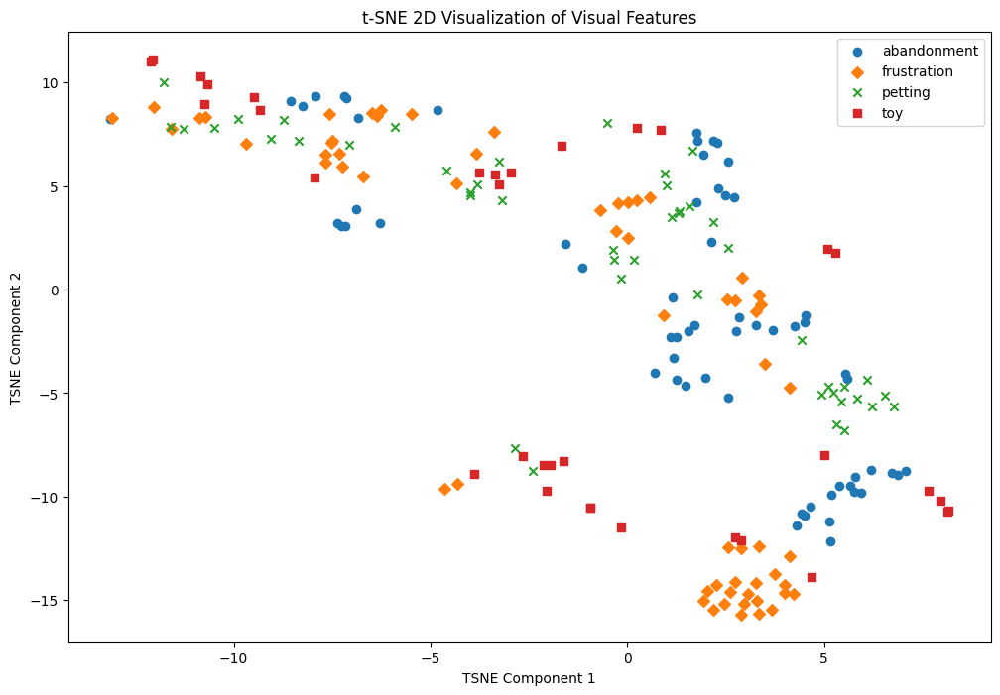

In [ ]:
# Perform t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(multimodal_features_df.drop(columns=['Trial Name','Dog Name','TrialType',	"StartTimestamp",	"EndTimestamp"], errors='ignore'))

# Create a new dataframe for t-SNE results
tsne_df = pd.DataFrame(tsne_results, columns=['tsne_1', 'tsne_2'])
tsne_df['Trial Name'] = multimodal_features_df['Trial Name']

# Define a dictionary of markers for each label
markers = {
    'abandonment': 'o',
    'petting': 'x',
    'toy': 's',
    'frustration': 'D',
}

# Plot the t-SNE results with different markers
plt.figure(figsize=(12, 8))
for label in tsne_df['Trial Name'].unique():
    subset = tsne_df[tsne_df['Trial Name'] == label]
    plt.scatter(subset['tsne_1'], subset['tsne_2'], label=label, marker=markers.get(label, 'o'))  # Use 'o' as default marker
plt.xlabel('TSNE Component 1')
plt.ylabel('TSNE Component 2')
plt.title('t-SNE 2D Visualization of Visual Features')
plt.legend()
plt.show()

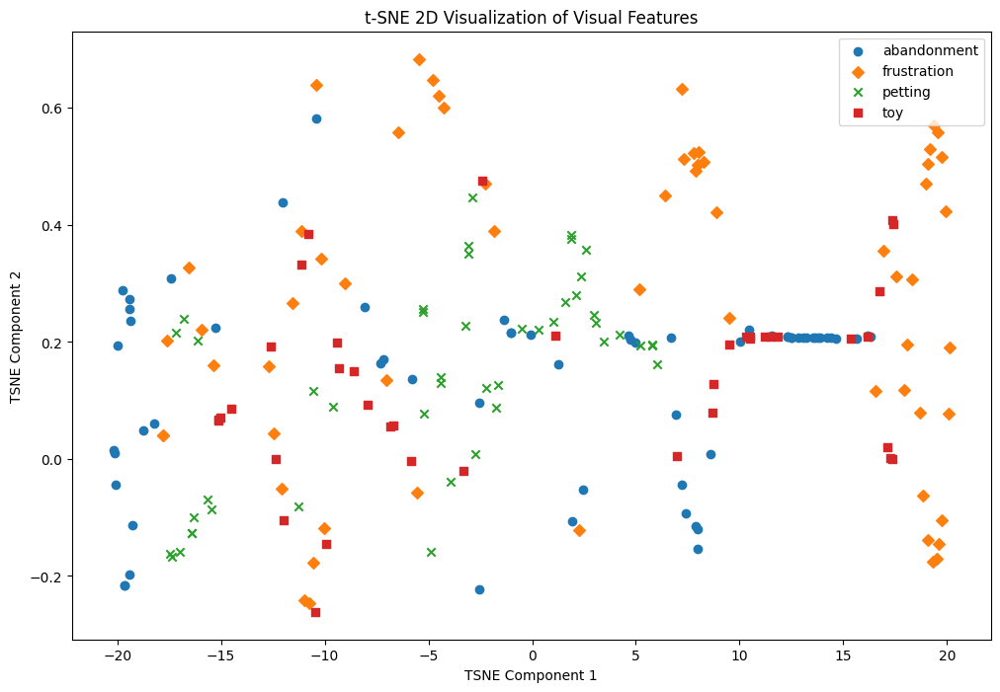

In [ ]:
# Perform t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(phys_features_df.drop(columns=['Trial Name','Dog Name','TrialType',	"StartTimestamp",	"EndTimestamp"], errors='ignore'))

# Create a new dataframe for t-SNE results
tsne_df = pd.DataFrame(tsne_results, columns=['tsne_1', 'tsne_2'])
tsne_df['Trial Name'] = phys_features_df['Trial Name']

# Define a dictionary of markers for each label
markers = {
    'abandonment': 'o',
    'petting': 'x',
    'toy': 's',
    'frustration': 'D',
}

# Plot the t-SNE results with different markers
plt.figure(figsize=(12, 8))
for label in tsne_df['Trial Name'].unique():
    subset = tsne_df[tsne_df['Trial Name'] == label]
    plt.scatter(subset['tsne_1'], subset['tsne_2'], label=label, marker=markers.get(label, 'o'))  # Use 'o' as default marker
plt.xlabel('TSNE Component 1')
plt.ylabel('TSNE Component 2')
plt.title('t-SNE 2D Visualization of Visual Features')
plt.legend()
plt.show()

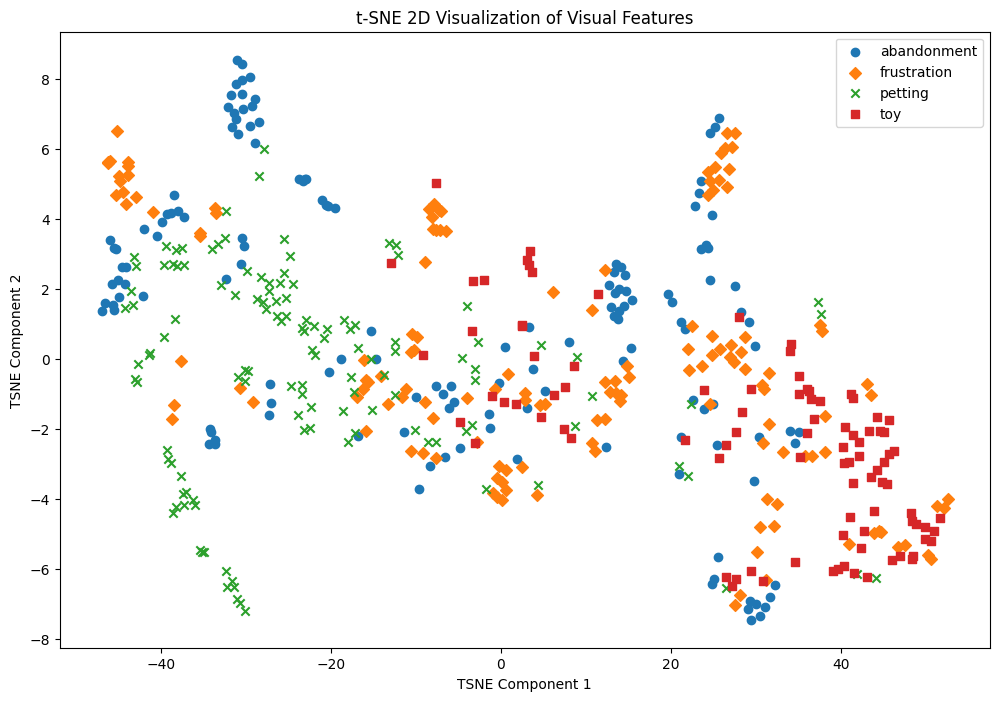

In [ ]:
# Perform t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(imu_features_df.drop(columns=['Trial Name','Dog Name','TrialType',	"StartTimestamp",	"EndTimestamp", 'DogName'], errors='ignore'))

# Create a new dataframe for t-SNE results
tsne_df = pd.DataFrame(tsne_results, columns=['tsne_1', 'tsne_2'])
tsne_df['Trial Name'] = imu_features_df['TrialType']

markers = {
    'abandonment': 'o',
    'petting': 'x',
    'toy': 's',
    'frustration': 'D',
}


plt.figure(figsize=(12, 8))
for label in tsne_df['Trial Name'].unique():
    subset = tsne_df[tsne_df['Trial Name'] == label]
    plt.scatter(subset['tsne_1'], subset['tsne_2'], label=label, marker=markers.get(label, 'o'))  # Use 'o' as default marker
plt.xlabel('TSNE Component 1')
plt.ylabel('TSNE Component 2')
plt.title('t-SNE 2D Visualization of Visual Features')
plt.legend()
plt.show()

In [ ]:
multimodal_df.drop(columns=['Trial Name','DogName','TrialType',	"StartTimestamp",	"EndTimestamp"])

,Unnamed: 0,AccX_Mean,AccX_Median,AccX_Std,AccX_Variance,AccX_Min,AccX_Max,AccX_Range,AccX_Q1,AccX_Q3,...,displacement_x_back_right_paw,velocity_x_back_right_paw,acceleration_x_back_right_paw,displacement_y_back_right_paw,velocity_y_back_right_paw,acceleration_y_back_right_paw,bbox_width,bbox_height,bbox_aspect_ratio,bbox_area
0,0,0.023737,0.006799,0.108705,0.011817,-0.225023,0.392904,0.617927,-0.048625,0.099195,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,232.000000,186.666667,1.242857,43306.666667
1,1,0.027238,0.047302,0.234707,0.055088,-0.909032,0.814980,1.724012,-0.076337,0.139431,...,50.453756,10.090751,2.018150,-108.299947,-21.659989,-4.331998,241.666667,176.000000,1.373106,42533.333333
2,2,-0.075454,-0.084464,0.753635,0.567966,-3.250172,2.561642,5.811813,-0.562165,0.397766,...,-172.273804,-34.454761,-8.909102,127.695536,25.539107,9.439819,323.666667,259.333333,1.248072,83937.555556
3,3,-0.161388,-0.098986,0.603432,0.364130,-2.894178,1.318861,4.213038,-0.456579,0.222767,...,108.129293,21.625859,11.216124,-46.464722,-9.292944,-6.966410,282.666667,277.666667,1.018007,78487.111111
4,4,0.022477,-0.139489,0.818069,0.669236,-2.287176,2.350870,4.638046,-0.447852,0.535594,...,54.979685,10.995937,-2.125984,-25.912771,-5.182554,0.822078,431.000000,309.333333,1.393319,133322.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
267,267,-0.122818,0.000063,1.303582,1.699325,-6.768617,7.501515,14.270132,-0.356531,0.193848,...,-16.766703,-3.353341,4.375481,-36.788269,-7.357654,-15.031033,263.333333,445.000000,0.591760,117183.333333
268,268,-0.024542,0.017116,0.667502,0.445559,-3.153787,2.354792,5.508579,-0.273594,0.244475,...,-67.209310,-13.441862,-2.017704,-37.574666,-7.514933,-0.031456,630.666667,437.666667,1.440975,276021.777778
269,269,-0.091467,-0.021254,0.420716,0.177002,-2.847089,0.789325,3.636414,-0.108787,0.034370,...,-2.650375,-0.530075,2.582357,-12.173482,-2.434696,1.016047,539.333333,408.000000,1.321895,220048.000000
270,270,0.093028,0.009655,0.536220,0.287532,-4.717656,2.807778,7.525434,-0.013194,0.034370,...,-50.088028,-10.017606,-1.897506,-3.528178,-0.705636,0.345812,589.000000,383.666667,1.535187,225979.666667


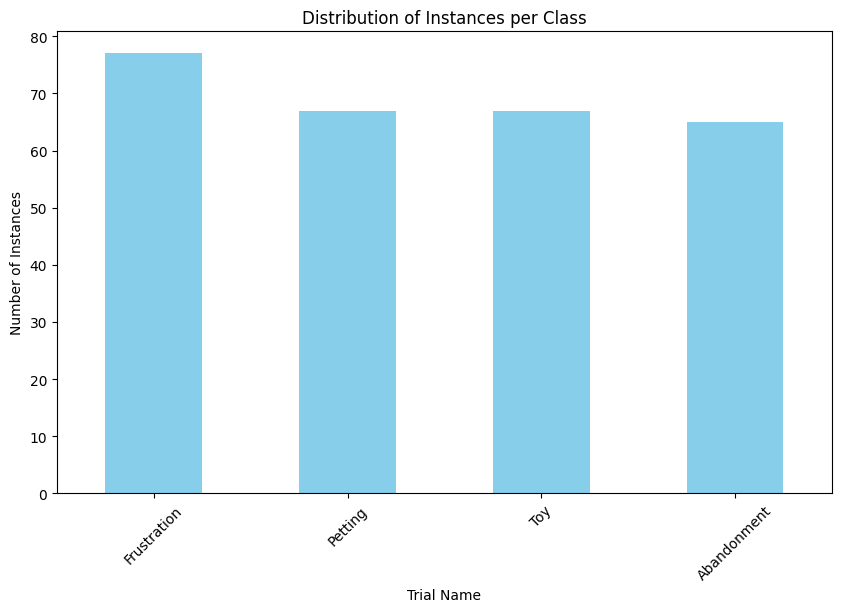

Trial Name
Frustration    77
Petting        67
Toy            67
Abandonment    65
Name: count, dtype: int64


In [ ]:
# Get the count of instances per class
class_counts = visual_features_df['Trial Name'].value_counts()

# Plot the distribution
plt.figure(figsize=(10, 6))
class_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Trial Name')
plt.ylabel('Number of Instances')
plt.title('Distribution of Instances per Class')
plt.xticks(rotation=45)
plt.show()

# Display the class counts
print(class_counts)

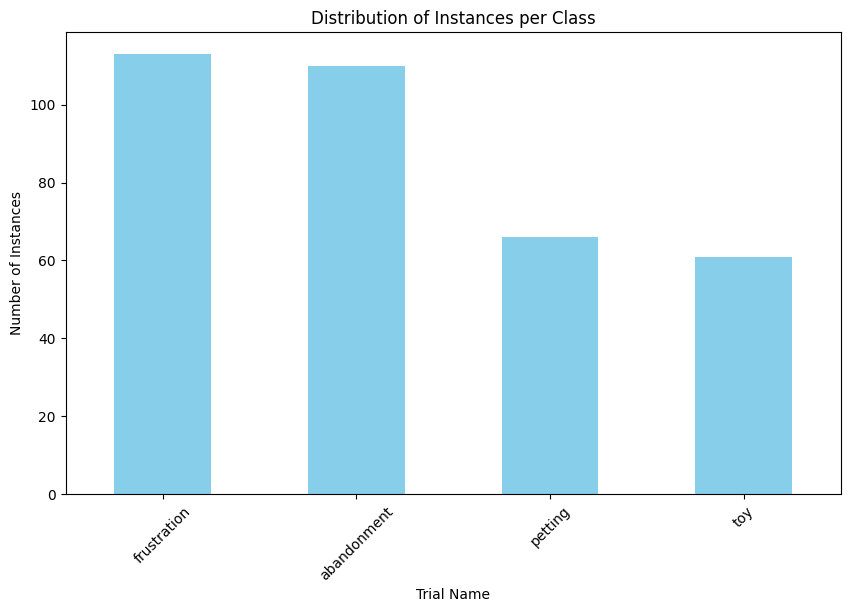

TrialType
frustration    113
abandonment    110
petting         66
toy             61
Name: count, dtype: int64


In [ ]:

# Get the count of instances per class
class_counts = phys_merged_df['TrialType'].value_counts()

# Plot the distribution
plt.figure(figsize=(10, 6))
class_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Trial Name')
plt.ylabel('Number of Instances')
plt.title('Distribution of Instances per Class')
plt.xticks(rotation=45)
plt.show()

# Display the class counts
print(class_counts)

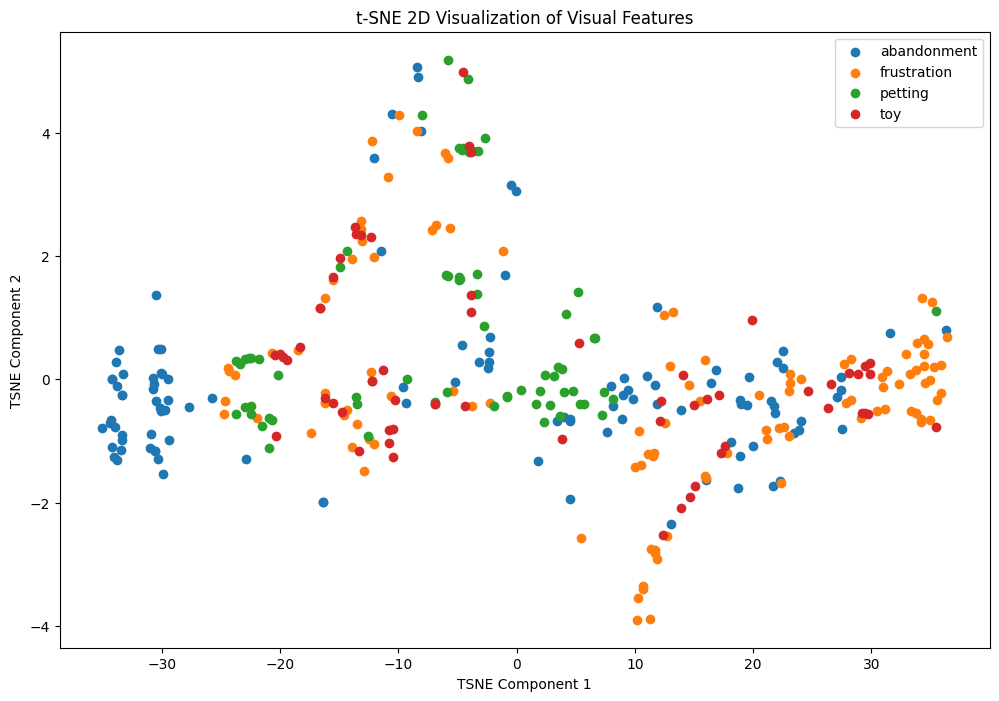

In [ ]:
# Perform t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(phys_merged_df.drop(columns=["DogName",	"TrialType",	"StartTimestamp",	"EndTimestamp"]))

# Create a new dataframe for t-SNE results
tsne_df = pd.DataFrame(tsne_results, columns=['tsne_1', 'tsne_2'])
tsne_df['TrialType'] = phys_merged_df['TrialType']

# Plot the t-SNE results with labels
plt.figure(figsize=(12, 8))
for label in tsne_df['TrialType'].unique():
    subset = tsne_df[tsne_df['TrialType'] == label]
    plt.scatter(subset['tsne_1'], subset['tsne_2'], label=label)
plt.xlabel('TSNE Component 1')
plt.ylabel('TSNE Component 2')
plt.title('t-SNE 2D Visualization of Visual Features')
plt.legend()
plt.show()

In [ ]:
multimodal_df

,DogName,TrialType,StartTimestamp,EndTimestamp,AccX_Mean,AccX_Median,AccX_Std,AccX_Variance,AccX_Min,AccX_Max,...,velocity_x_back_right_paw,acceleration_x_back_right_paw,displacement_y_back_right_paw,velocity_y_back_right_paw,acceleration_y_back_right_paw,bbox_width,bbox_height,bbox_aspect_ratio,bbox_area,Trial Name
0,Archi,abandonment,2023-11-26 11:28:24.765,2023-11-26 11:28:28.941,0.023737,0.006799,0.108705,0.011817,-0.225023,0.392904,...,0.000000,0.000000,0.000000,0.000000,0.000000,232.000000,186.666667,1.242857,43306.666667,Abandonment
1,Archi,abandonment,2023-11-26 11:28:28.944,2023-11-26 11:28:33.901,0.027238,0.047302,0.234707,0.055088,-0.909032,0.814980,...,10.090751,2.018150,-108.299947,-21.659989,-4.331998,241.666667,176.000000,1.373106,42533.333333,Abandonment
2,Archi,abandonment,2023-11-26 11:28:33.905,2023-11-26 11:28:39.043,-0.075454,-0.084464,0.753635,0.567966,-3.250172,2.561642,...,-34.454761,-8.909102,127.695536,25.539107,9.439819,323.666667,259.333333,1.248072,83937.555556,Abandonment
3,Archi,abandonment,2023-11-26 11:28:39.047,2023-11-26 11:28:44.236,-0.161388,-0.098986,0.603432,0.364130,-2.894178,1.318861,...,21.625859,11.216124,-46.464722,-9.292944,-6.966410,282.666667,277.666667,1.018007,78487.111111,Abandonment
4,Archi,abandonment,2023-11-26 11:28:44.240,2023-11-26 11:28:49.327,0.022477,-0.139489,0.818069,0.669236,-2.287176,2.350870,...,10.995937,-2.125984,-25.912771,-5.182554,0.822078,431.000000,309.333333,1.393319,133322.666667,Abandonment
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
267,Sam,toy,2023-10-23 10:42:46.308,2023-10-23 10:42:51.386,-0.122818,0.000063,1.303582,1.699325,-6.768617,7.501515,...,-3.353341,4.375481,-36.788269,-7.357654,-15.031033,263.333333,445.000000,0.591760,117183.333333,Toy
268,Sam,toy,2023-10-23 10:42:51.390,2023-10-23 10:42:56.506,-0.024542,0.017116,0.667502,0.445559,-3.153787,2.354792,...,-13.441862,-2.017704,-37.574666,-7.514933,-0.031456,630.666667,437.666667,1.440975,276021.777778,Toy
269,Sam,toy,2023-10-23 10:42:56.511,2023-10-23 10:43:01.600,-0.091467,-0.021254,0.420716,0.177002,-2.847089,0.789325,...,-0.530075,2.582357,-12.173482,-2.434696,1.016047,539.333333,408.000000,1.321895,220048.000000,Toy
270,Sam,toy,2023-10-23 10:43:01.604,2023-10-23 10:43:06.654,0.093028,0.009655,0.536220,0.287532,-4.717656,2.807778,...,-10.017606,-1.897506,-3.528178,-0.705636,0.345812,589.000000,383.666667,1.535187,225979.666667,Toy


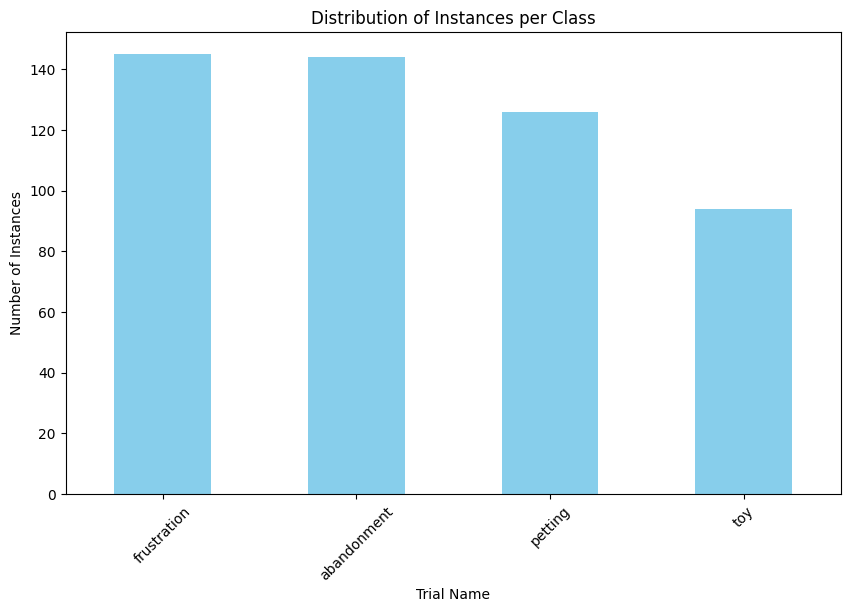

TrialType
frustration    145
abandonment    144
petting        126
toy             94
Name: count, dtype: int64


In [ ]:
# Get the count of instances per class
class_counts = imu_features_df['TrialType'].value_counts()

# Plot the distribution
plt.figure(figsize=(10, 6))
class_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Trial Name')
plt.ylabel('Number of Instances')
plt.title('Distribution of Instances per Class')
plt.xticks(rotation=45)
plt.show()

# Display the class counts
print(class_counts)

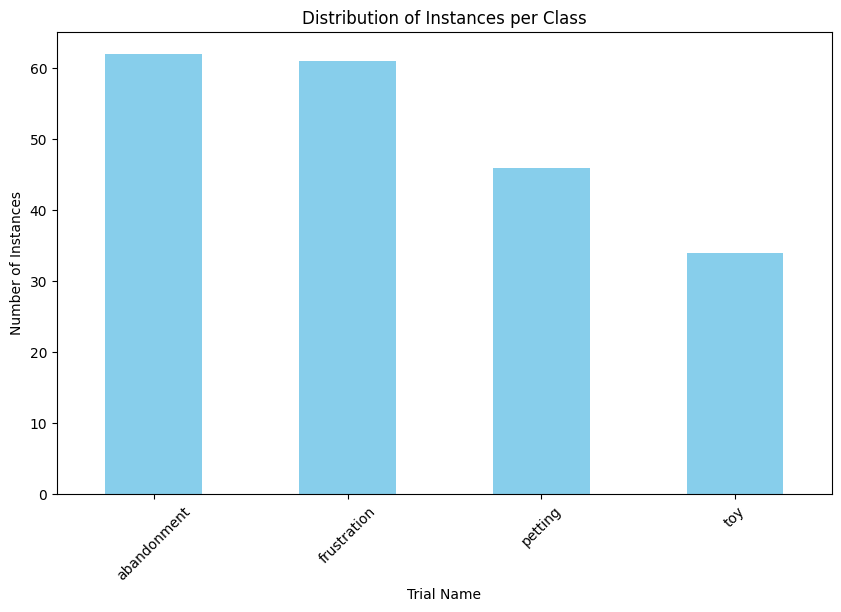

Trial Name
abandonment    62
frustration    61
petting        46
toy            34
Name: count, dtype: int64


In [ ]:
# Get the count of instances per class
class_counts = multimodal_features_df['Trial Name'].value_counts()

# Plot the distribution
plt.figure(figsize=(10, 6))
class_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Trial Name')
plt.ylabel('Number of Instances')
plt.title('Distribution of Instances per Class')
plt.xticks(rotation=45)
plt.show()

# Display the class counts
print(class_counts)

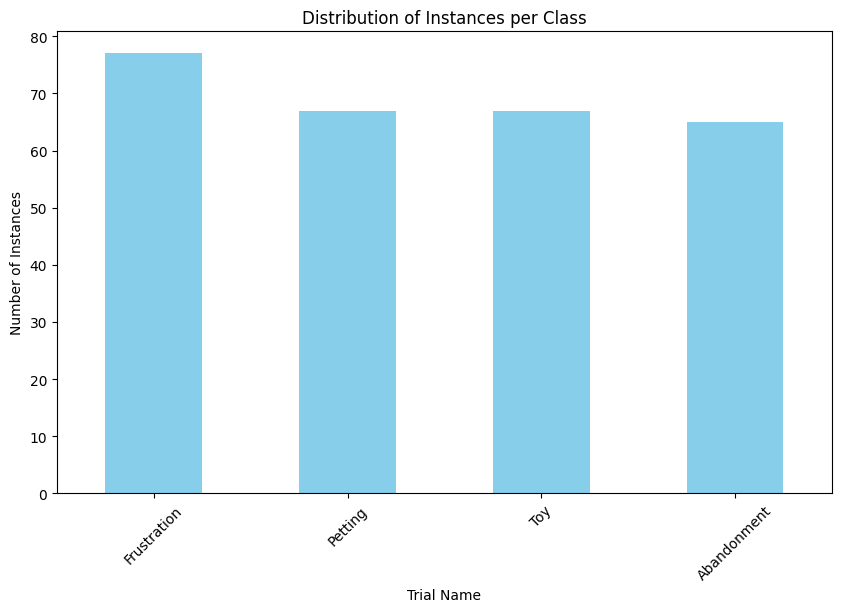

Trial Name
Frustration    77
Petting        67
Toy            67
Abandonment    65
Name: count, dtype: int64


In [ ]:
# Get the count of instances per class
class_counts = visual_features_df['Trial Name'].value_counts()

# Plot the distribution
plt.figure(figsize=(10, 6))
class_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Trial Name')
plt.ylabel('Number of Instances')
plt.title('Distribution of Instances per Class')
plt.xticks(rotation=45)
plt.show()

# Display the class counts
print(class_counts)

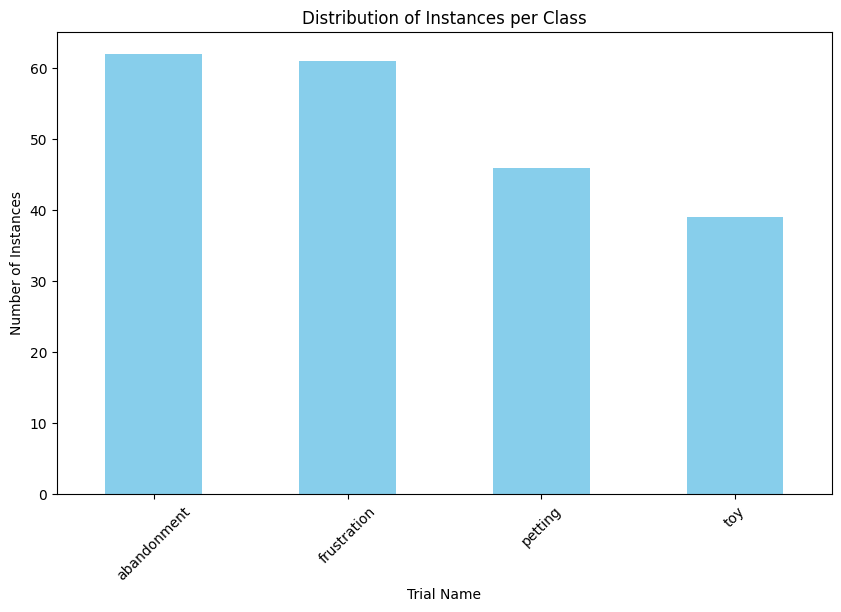

Trial Name
abandonment    62
frustration    61
petting        46
toy            39
Name: count, dtype: int64


In [ ]:
# Get the count of instances per class
class_counts = phys_features_df['Trial Name'].value_counts()

# Plot the distribution
plt.figure(figsize=(10, 6))
class_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Trial Name')
plt.ylabel('Number of Instances')
plt.title('Distribution of Instances per Class')
plt.xticks(rotation=45)
plt.show()

# Display the class counts
print(class_counts)

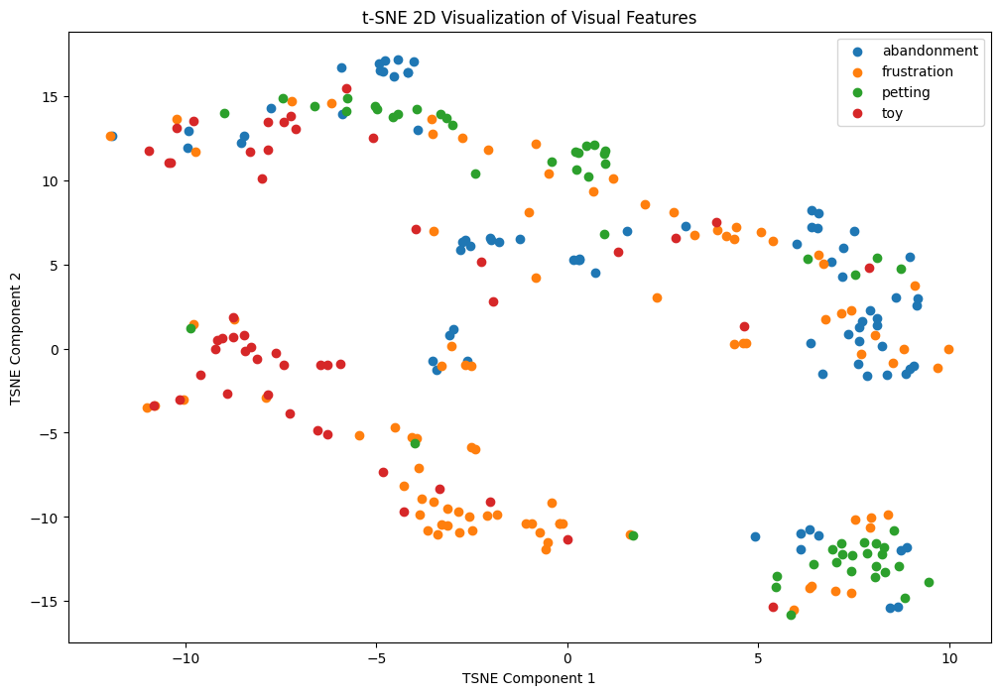

In [ ]:
# Perform t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(multimodal_df.drop(columns=["DogName",	"TrialType",	"StartTimestamp",	"EndTimestamp", "Trial Name"]))

# Create a new dataframe for t-SNE results
tsne_df = pd.DataFrame(tsne_results, columns=['tsne_1', 'tsne_2'])
tsne_df['TrialType'] = multimodal_df['TrialType']

# Plot the t-SNE results with labels
plt.figure(figsize=(12, 8))
for label in tsne_df['TrialType'].unique():
    subset = tsne_df[tsne_df['TrialType'] == label]
    plt.scatter(subset['tsne_1'], subset['tsne_2'], label=label)
plt.xlabel('TSNE Component 1')
plt.ylabel('TSNE Component 2')
plt.title('t-SNE 2D Visualization of Visual Features')
plt.legend()
plt.show()


In [ ]:
# Filter the dataframe for only Oli and Sams
filtered_df = polar_df[polar_df['DogName'].isin(['Sam', 'Lumiere', 'Miel', 'Archie'])]
filtered_df['Seconds'] = filtered_df.groupby('DogName')['Timestamp'].transform(lambda x: (x - x.min()).dt.total_seconds())

# Plot the Heart Rate time series for only Oli and Sams divided by TrialType
plt.figure(figsize=(14, 8))


# Group by DogName and TrialType and plot each group
for (dog, trial), group_data in filtered_df.groupby(['DogName', 'TrialType']):
    plt.plot(group_data['Seconds'], group_data['HR'], label=f'{dog} - {trial}')

plt.xlabel('Timestamp')
plt.ylabel('Heart Rate')
plt.title('Heart Rate Time Series for Oli and Sams by Trial')
plt.legend()
plt.show()

# Codigo para el PATITA

## Funciones para transformar los 3 archivos .log en .csv

In [ ]:
# Parsing functions to deal with the .log files from the source files generated by PATITA
def parse_temp(line):
    match = re.search(r'(\d{2}:\d{2}:\d{2}\.\d{3}) Ambient Temperature:(\d+\.\d+)°C Target Temperature:(\d+\.\d+)°C', line)
    if match:
        return match.groups()
    return None

def parse_polar(line):
    match = re.search(r'(\d{2}:\d{2}:\d{2}\.\d{3}) (\d+)', line)
    if match:
        return match.groups()
    return None

def parse_imu(line):
    match = re.search(r'(\d{2}:\d{2}:\d{2}\.\d{3}) \((-?\d+\.\d+), (-?\d+\.\d+), (-?\d+\.\d+), (-?\d+\.\d+), (-?\d+\.\d+), (-?\d+\.\d+)\)', line)
    if match:
        return match.groups()
    return None

# Load the csv file and apply the respective parser_function to it,
# the columns are specified in order to corroborate that we are extracting the correct column names from the parsing process
# This function returns a time-series dataframe
def process_file(filepath, parser_func, columns):
    with open(filepath, 'r') as file:
        data = [parser_func(line) for line in file if parser_func(line)]
    df = pd.DataFrame(data, columns=columns)
    df['Timestamp'] = pd.to_datetime(df['Timestamp'])
    return df

# Add the magnitudes and apply 0-shift, in this lightweight model, theres no filters applied to the data
def add_magnitudes(df):
  for col in ['AccX', 'AccY', 'AccZ', 'GyrX', 'GyrY', 'GyrZ']:
            df[col] -= df[col].mean()
  df['AccMagnitude'] = (df['AccX']**2 + df['AccY']**2 + df['AccZ']**2)**0.5
  df['GyrMagnitude'] = (df['GyrX']**2 + df['GyrY']**2 + df['GyrZ']**2)**0.5
  return df

# imu_dataframe = process_file("carpeta/donde/esten/los/archivos/log/imu.log","imu",['Timestamp', 'AccX', 'AccY', 'AccZ', 'GyrX', 'GyrY', 'GyrZ'])
# polar_dataframe = process_file("carpeta/donde/esten/los/archivos/log/polar.log","polar",['Timestamp', 'HR']")
# phys_dataframe = process_file("carpeta/donde/esten/los/archivos/log/temp.log","temp",['Timestamp', 'Ambient_Temperature', 'Target_Temperature'])

# imu_dataframe = add_magnitudes(imu_dataframe)

In [ ]:
from scipy.signal import find_peaks

def calculate_statistical_features(df, signals, window_size_seconds):
    # Calculate sampling frequency using the Timestamp column
    df['Timestamp'] = pd.to_datetime(df['Timestamp'])
    df['TimeDiff'] = df['Timestamp'].diff().dt.total_seconds().fillna(0)
    freq = 1 / df['TimeDiff'].median()
    window_size_samples = int(window_size_seconds * freq)

    features_list = []

    # Group by DogName and TrialType then perform windowing
    grouped = df.groupby(['DogName', 'TrialType'])
    for (dog, trial), group in grouped:
        # Calculate the index of each window's start
        for start_idx in range(0, len(group), window_size_samples):
            window = group.iloc[start_idx:start_idx + window_size_samples]
            if window.empty:
                continue

            # Initialize the feature vector
            features = {
                'StartTimestamp': window['Timestamp'].min(),
                'EndTimestamp': window['Timestamp'].max(),
            }

            # Calculate statistical features for each signal in the window
            for signal in signals:
                signal_data = window[signal].dropna()  # Drop NA values for accurate calculations
                peaks, _ = find_peaks(signal_data)
                zero_crossings = np.where(np.diff(np.sign(signal_data)))[0]

                def entropy(signal):
                    prob_density = np.histogram(signal, bins=10, density=True)[0]
                    return -np.sum(prob_density * np.log2(prob_density + np.finfo(float).eps))

                def autocorr(x, t=1):
                    return np.corrcoef(np.array([x[:-t], x[t:]]))[0, 1]

                signal_features = {
                    f'{signal}_Mean': signal_data.mean(),
                    f'{signal}_Median': signal_data.median(),
                    f'{signal}_Std': signal_data.std(),
                    f'{signal}_Variance': signal_data.var(),
                    f'{signal}_Min': signal_data.min(),
                    f'{signal}_Max': signal_data.max(),
                    f'{signal}_Range': signal_data.max() - signal_data.min(),
                    f'{signal}_Q1': signal_data.quantile(0.25),
                    f'{signal}_Q3': signal_data.quantile(0.75),
                    f'{signal}_IQR': signal_data.quantile(0.75) - signal_data.quantile(0.25),
                    f'{signal}_Skew': signal_data.skew(),
                    f'{signal}_Kurtosis': signal_data.kurtosis(),
                    f'{signal}_RMS': np.sqrt(np.mean(signal_data**2)),
                    f'{signal}_Entropy': entropy(signal_data),
                    f'{signal}_NumPeaks': len(peaks),
                    f'{signal}_SMA': np.sum(np.abs(signal_data)),
                    f'{signal}_Energy': np.sum(signal_data**2),
                }
                features.update(signal_features)

            features_list.append(features)

    # Create a DataFrame from the features list
    features_df = pd.DataFrame(features_list)

    return features_df

# Function to find and merge closest timestamps
def merge_on_closest(df_base, df_other, time_col='StartTimestamp'):
    closest_idxs = []
    for i, row in df_other.iterrows():
        min_idx = (df_base[time_col] - row[time_col]).abs().idxmin()
        closest_idxs.append(min_idx)

    # Merge based on the index of the closest timestamp
    df_other['closest_idx'] = closest_idxs
    df_base = df_base.reset_index()
    merged_df = pd.merge(df_base, df_other, left_on='index', right_on='closest_idx', suffixes=('', '_other'))
    merged_df.fillna(0, inplace=True)

    return merged_df.drop(['index', 'closest_idx', 'DogName_other' , 'TrialType_other', 'StartTimestamp_other', 'EndTimestamp_other'], axis=1)

#plots


In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Data for difference in F1-Score between "All features" and "Selected features"
f1_difference_data = {
    'Model': ['Árbol de decisión', 'Árbol de decisión', 'Árbol de decisión',
              'ExtraTrees', 'ExtraTrees', 'ExtraTrees',
              'Naive bayes (Gaussiano)', 'Naive bayes (Gaussiano)', 'Naive bayes (Gaussiano)',
              'K vecinos más cercanos (Minkowski)', 'K vecinos más cercanos (Minkowski)', 'K vecinos más cercanos (Minkowski)',
              'Máquina de soporte vectorial', 'Máquina de soporte vectorial', 'Máquina de soporte vectorial'],
    'Task': ['Activación', 'Por emoción', 'Valencia',
             'Activación', 'Por emoción', 'Valencia',
             'Activación', 'Por emoción', 'Valencia',
             'Activación', 'Por emoción', 'Valencia',
             'Activación', 'Por emoción', 'Valencia'],
    'Difference': [0.01, 0.03, 0.00,  # Árbol de decisión
                   0.01, 0.01, 0.02,  # Extra Trees
                   0.00, 0.03, 0.03,  # Naive Bayes (Gaussiano)
                   0.01, -0.01, -0.03,  # K vecinos más cercanos (Minkowski)
                   0.07, 0.11, 0.10]  # Máquina de soporte vectorial
}

# Create DataFrame
f1_difference_df = pd.DataFrame(f1_difference_data)

# Order tasks and models
f1_difference_df['Task'] = pd.Categorical(f1_difference_df['Task'], categories=['Activación', 'Por emoción', 'Valencia'], ordered=True)
f1_difference_df['Model'] = pd.Categorical(f1_difference_df['Model'], categories=[
    'Árbol de decisión', 'ExtraTrees', 'Naive bayes (Gaussiano)', 'K vecinos más cercanos (Minkowski)', 'Máquina de soporte vectorial'], ordered=True)

# Define color and pattern lists for Plotly (one for each model)
color_dict = {
    'Árbol de decisión': '#3498db',   # Blue
    'ExtraTrees': '#e74c3c',          # Red
    'Naive bayes (Gaussiano)': '#2ecc71',  # Green
    'K vecinos más cercanos (Minkowski)': '#f1c40f',  # Yellow
    'Máquina de soporte vectorial': '#9b59b6'  # Purple
}

pattern_dict = {
    'Árbol de decisión': '/',
    'ExtraTrees': 'x',
    'Naive bayes (Gaussiano)': '.',
    'K vecinos más cercanos (Minkowski)': '+',
    'Máquina de soporte vectorial': '\\'
}

# Create a Plotly figure
fig = go.Figure()

# Iterate over each unique model
for model in f1_difference_df['Model'].unique():
    model_data = f1_difference_df[f1_difference_df['Model'] == model]

    # Add bar trace for each model with consistent color, pattern, and outline
    fig.add_trace(go.Bar(
        x=model_data['Task'],
        y=model_data['Difference'],
        name=model,
        marker=dict(
            color=color_dict[model],
            pattern_shape=pattern_dict[model],
            line=dict(color='black', width=1)  # Outline similar to Matplotlib
        )
    ))

# Update layout for the bar plot to mimic Seaborn/Matplotlib theme
fig.update_layout(
    barmode='group',  # Group bars side by side for each task
    xaxis_title="Tarea",
    font=dict(family="DejaVu Sans", size=14),  # Similar fonts to Matplotlib
    plot_bgcolor="white",  # White background similar to Seaborn
    paper_bgcolor="white",  # White background for the overall plot
    width=900,  # Adjust width to make the figure shorter
    height=600,  # Adjust height
    xaxis=dict(
        showgrid=True,  # Enable gridlines like Seaborn
        gridcolor='lightgrey',  # Light grey gridlines like Seaborn
        tickmode='linear',
        ticks='outside',
        ticklen=5,
        showline=True,
        linewidth=1,
        linecolor='black',  # Axis line similar to Matplotlib
        mirror=True
    ),
    yaxis=dict(
        showgrid=True,  # Enable gridlines like Seaborn
        gridcolor='lightgrey',  # Light grey gridlines
        zeroline=True,  # Zero line
        zerolinecolor='black',
        showline=True,
        linewidth=1,
        linecolor='black',
        mirror=True
    ),
    legend=dict(
        x=1.02,
        y=1,
        traceorder='normal',
        font=dict(family="Arial", size=12),
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='black',
        borderwidth=1  # Border around the legend
    )
)

# Show the plot
fig.show()


In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Data for difference in F1-Score between "All features" and "Selected features"
f1_difference_data = {
    'Model': ['Árbol de decisión', 'Árbol de decisión', 'Árbol de decisión',
              'ExtraTrees', 'ExtraTrees', 'ExtraTrees',
              'Naive bayes (Gaussiano)', 'Naive bayes (Gaussiano)', 'Naive bayes (Gaussiano)',
              'K vecinos más cercanos (Minkowski)', 'K vecinos más cercanos (Minkowski)', 'K vecinos más cercanos (Minkowski)',
              'Máquina de soporte vectorial', 'Máquina de soporte vectorial', 'Máquina de soporte vectorial'],
    'Task': ['Activación', 'Por emoción', 'Valencia',
             'Activación', 'Por emoción', 'Valencia',
             'Activación', 'Por emoción', 'Valencia',
             'Activación', 'Por emoción', 'Valencia',
             'Activación', 'Por emoción', 'Valencia'],
    'Difference': [0.01, 0.03, 0.00,  # Árbol de decisión
                   0.01, 0.01, 0.02,  # Extra Trees
                   0.00, 0.03, 0.03,  # Naive Bayes (Gaussiano)
                   0.01, -0.01, -0.03,  # K vecinos más cercanos (Minkowski)
                   0.07, 0.11, 0.10]  # Máquina de soporte vectorial
}

# Create DataFrame
f1_difference_df = pd.DataFrame(f1_difference_data)

# Order tasks and models
f1_difference_df['Task'] = pd.Categorical(f1_difference_df['Task'], categories=['Activación', 'Por emoción', 'Valencia'], ordered=True)
f1_difference_df['Model'] = pd.Categorical(f1_difference_df['Model'], categories=[
    'Árbol de decisión', 'ExtraTrees', 'Naive bayes (Gaussiano)', 'K vecinos más cercanos (Minkowski)', 'Máquina de soporte vectorial'], ordered=True)

# Define color and pattern lists for Plotly (one for each model)
color_dict = {
    'Árbol de decisión': '#3498db',   # Blue
    'ExtraTrees': '#e74c3c',          # Red
    'Naive bayes (Gaussiano)': '#2ecc71',  # Green
    'K vecinos más cercanos (Minkowski)': '#f1c40f',  # Yellow
    'Máquina de soporte vectorial': '#9b59b6'  # Purple
}

pattern_dict = {
    'Árbol de decisión': '/',
    'ExtraTrees': 'x',
    'Naive bayes (Gaussiano)': '.',
    'K vecinos más cercanos (Minkowski)': '+',
    'Máquina de soporte vectorial': '\\'
}

# Create a Plotly figure
fig = go.Figure()

# Iterate over each unique model
for model in f1_difference_df['Model'].unique():
    model_data = f1_difference_df[f1_difference_df['Model'] == model]

    # Add bar trace for each model with consistent color, pattern, outline, and text inside the bars
    fig.add_trace(go.Bar(
        x=model_data['Task'],
        y=model_data['Difference'],
        name=model,
        text=[f'{val:.2f}' for val in model_data['Difference']],  # Add text with two decimal points
        textposition='outside',  # You can change this to 'inside' to place text inside the bars
        marker=dict(
            color=color_dict[model],
            pattern_shape=pattern_dict[model],
            line=dict(color='black', width=1)  # Outline similar to Matplotlib
        )
    ))

# Update layout for the bar plot to mimic Seaborn/Matplotlib theme
fig.update_layout(
    barmode='group',  # Group bars side by side for each task
    xaxis_title="Tarea",
    yaxis_title="Diferencia en F1-Score",
    font=dict(family="DejaVu Sans", size=14, color='black', weight=700),  # Set fonts to bold
    plot_bgcolor="white",  # White background similar to Seaborn
    paper_bgcolor="white",  # White background for the overall plot
    width=1100,  # Adjust width to make the figure wider for the legend
    height=800,  # Adjust height
    xaxis=dict(
        showgrid=True,  # Enable gridlines like Seaborn
        gridcolor='lightgrey',  # Light grey gridlines like Seaborn
        tickmode='linear',
        ticks='outside',
        ticklen=5,
        showline=True,
        linewidth=1,
        linecolor='black',  # Axis line similar to Matplotlib
        mirror=True,
        title_font=dict(family="DejaVu Sans", size=16, weight=700),  # Bold X-axis title
    ),
    yaxis=dict(
        showgrid=True,  # Enable gridlines like Seaborn
        gridcolor='lightgrey',  # Light grey gridlines
        zeroline=True,  # Zero line
        zerolinecolor='black',
        showline=True,
        linewidth=1,
        linecolor='black',
        mirror=True,
        title_font=dict(family="DejaVu Sans", size=16, weight=700),  # Bold Y-axis title
    ),
    legend=dict(
        x=0,  # Position the legend inside the plot
        y=1,  # Move legend to upper right
        font=dict(family="DejaVu Sans", size=14, weight=700),  # Bold legend fonts
        bgcolor='rgba(255, 255, 255, 0.5)',  # Semi-transparent background for the legend
        bordercolor='black',
        borderwidth=1  # Border around the legend
    )
)

# Show the plot
fig.show()


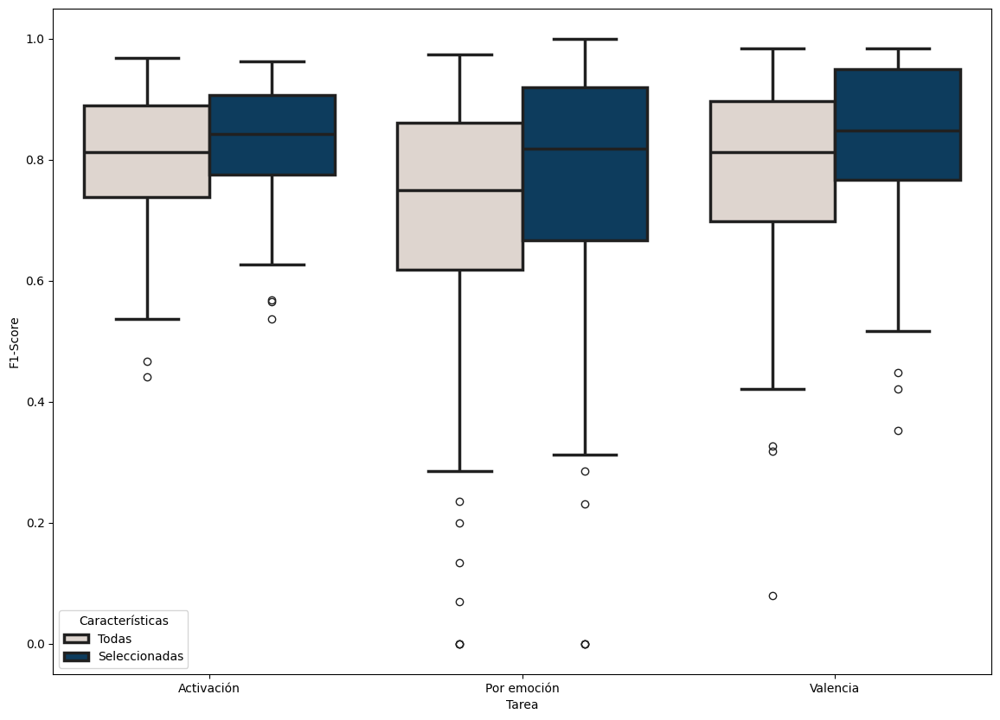

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the CSV file
evaluation_results = pd.read_csv('evaluation_results.csv')

# Define textures for the box plots
box_textures = {
    "Todas": "//",  # Diagonal lines for "Todas"
    "Seleccionadas": "xx"  # Crosshatch pattern for "Seleccionadas"
}

# Rename 'All Features' to 'Todas' and 'Selected Features' to 'Seleccionadas' in the dataset
evaluation_results['Feature Set'] = evaluation_results['Feature Set'].replace({
    'All Features': 'Todas',
    'Selected Features': 'Seleccionadas'
})

# Map 'Task' to reorder and rename the labels to Spanish
task_order = ['Activación', 'Por emoción', 'Valencia']
evaluation_results['Task'] = evaluation_results['Task'].replace({
    'Arousal': 'Activación',
    'Original': 'Por emoción',
    'Valence': 'Valencia'
})

# Create the box plot with texturization or different shades for B&W compatibility
plt.figure(figsize=(14, 10))

# Use different shades of gray for better differentiation in black and white
sns.boxplot(x='Task', y='F1-Score', hue='Feature Set', data=evaluation_results, palette=["#e1d5cc", "#003e6a"],
            linewidth=2.5, dodge=True, order=task_order)

# Apply textures to the boxes
for i, patch in enumerate(plt.gca().artists):
    if i % 2 == 0:  # Even index for 'Todas'
        patch.set_hatch(box_textures['Todas'])
        patch.set_edgecolor('#e1d5cc')
        patch.set_facecolor('#e1d5cc')
    else:  # Odd index for 'Seleccionadas'
        patch.set_hatch(box_textures['Seleccionadas'])
        patch.set_edgecolor('#003e6a')
        patch.set_facecolor('#003e6a')

# Adjust the legend and axis labels to Spanish
plt.legend(title='Características')
plt.xlabel('Tarea')
plt.ylabel('F1-Score')

# Save the plot as an image
plt.savefig('F1_Score_Comparison_Boxplot_BW.png')

# Show the plot
plt.show()

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split

# Prepare the data for IMU feature selection
X_imu = imu_features_df.drop(columns=['Unnamed: 0', 'Dog Name', 'Trial Name'])  # Assuming 'DogName' and 'TrialType' are non-predictive columns
y_imu = imu_features_df['Trial Name']  # Assuming 'TrialType' is the target variable

# Split the data into training and testing sets
X_train_imu, X_test_imu, y_train_imu, y_test_imu = train_test_split(X_imu, y_imu, test_size=0.2, random_state=42)

# Apply Random Forest for feature selection
rf_imu = RandomForestClassifier(n_estimators=100, random_state=42)
rf_imu.fit(X_train_imu, y_train_imu)

# Select features based on importance
selector_imu = SelectFromModel(rf_imu, prefit=True)
selected_features_imu = X_train_imu.columns[(selector_imu.get_support())]

# Initialize counts for selected features
selected_inertial = {'accelerometry': 0, 'gyroscope': 0}

# Classify the selected features
for feature in selected_features_imu:
    if 'Acc' in feature:
        selected_inertial['accelerometry'] += 1
    elif 'Gyr' in feature:
        selected_inertial['gyroscope'] += 1

# Convert to series for visualization
distribution_inertial_series = pd.Series(selected_inertial)

# Display the distribution for verification
distribution_inertial_series


,0
accelerometry,22
gyroscope,60


In [ ]:
# Prepare the data for IMU feature selection
X_phys = phys_features_df.drop(columns=['Unnamed: 0', 'Dog Name', 'Trial Name'])  # Assuming 'DogName' and 'TrialType' are non-predictive columns
y_phys = phys_features_df['Trial Name']  # Assuming 'TrialType' is the target variable

# Split the data into training and testing sets
X_train_phys, X_test_phys, y_train_phys, y_test_phys = train_test_split(X_phys, y_phys, test_size=0.2, random_state=42)

# Apply Random Forest for feature selection
rf_phys = RandomForestClassifier(n_estimators=100, random_state=42)
rf_phys.fit(X_train_phys, y_train_phys)

# Select features based on importance
selector_phys = SelectFromModel(rf_phys, prefit=True)
selected_features_phys = X_train_phys.columns[(selector_phys.get_support())]

# Initialize counts for selected features
selected_phys = {'Heart Rate': 0, 'Temperature': 0}

# Classify the selected features
for feature in selected_features_phys:
    if 'HR' in feature:
        selected_phys['Heart Rate'] += 1
    elif 'Temp' in feature:
        selected_phys['Temperature'] += 1

# Convert to series for visualization
distribution_phys_series = pd.Series(selected_phys)

# Display the distribution for verification
distribution_phys_series

,0
Heart Rate,9
Temperature,12


In [ ]:
# Prepare the data for IMU feature selection
X_visual = visual_features_df.drop(columns=['Dog Name', 'Trial Name'])  # Assuming 'DogName' and 'TrialType' are non-predictive columns
y_visual = visual_features_df['Trial Name']  # Assuming 'TrialType' is the target variable

# Split the data into training and testing sets
X_train_visual, X_test_visual, y_train_visual, y_test_visual = train_test_split(X_visual, y_visual, test_size=0.2, random_state=42)

# Apply Random Forest for feature selection
rf_visual = RandomForestClassifier(n_estimators=100, random_state=42)
rf_visual.fit(X_train_visual, y_train_visual)

# Select features based on importance
selector_visual = SelectFromModel(rf_visual, prefit=True)
selected_features_visual = X_train_visual.columns[(selector_visual.get_support())]

# List of position features for verification
position_features = [
    'x_nose', 'y_nose', 'x_upper_jaw', 'y_upper_jaw', 'x_right_earbase', 'y_right_earbase',
    'x_right_earend', 'y_right_earend', 'x_left_earbase', 'y_left_earbase', 'x_left_earend',
    'y_left_earend', 'x_throat_end', 'y_throat_end', 'x_back_base', 'y_back_base',
    'x_tail_base', 'y_tail_base', 'x_tail_end', 'y_tail_end', 'x_front_left_thai',
    'y_front_left_thai', 'x_front_left_knee', 'y_front_left_knee', 'x_front_left_paw',
    'y_front_left_paw', 'x_front_right_thai', 'y_front_right_thai', 'x_front_right_knee',
    'y_front_right_knee', 'x_front_right_paw', 'y_front_right_paw', 'x_back_left_thai',
    'y_back_left_thai', 'x_back_left_knee', 'y_back_left_knee', 'x_back_left_paw',
    'y_back_left_paw', 'x_back_right_thai', 'y_back_right_thai', 'x_back_right_knee',
    'y_back_right_knee', 'x_back_right_paw', 'y_back_right_paw', 'X1', 'Y1', 'X2', 'Y2',
    'Center X', 'Center Y'
]
# Initialize counts for selected features
selected_visual = {'Position': 0, 'Calculated': 0}

# Verify which of the selected features are position features
selected_position_features = [feature for feature in selected_features_visual if feature in position_features]

# Count the number of selected position and calculated features
selected_visual['Position'] = len(selected_position_features)
selected_visual['Calculated'] = len(selected_features_visual) - selected_visual['Position']

# Convert to series for visualization
distribution_visual_series = pd.Series(selected_visual)

# Display the distribution for verification
distribution_visual_series

,0
Position,45
Calculated,15


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split
import pandas as pd

# Function to get selected features and threshold
def get_selected_features_and_threshold(X, y, rf_model):
    # Train the model
    rf_model.fit(X, y)

    # Initialize the selector with prefit=False to fit the model within the selector
    selector = SelectFromModel(estimator=rf_model, prefit=False)
    selector.fit(X, y)  # Fit selector to the data

    # Get selected features
    selected_features = X.columns[(selector.get_support())]

    # Get threshold used for feature selection
    threshold = selector.threshold_

    return selected_features, threshold

# Prepare the data for IMU feature selection
X_imu = imu_features_df.drop(columns=['Unnamed: 0', 'Dog Name', 'Trial Name'])
y_imu = imu_features_df['Trial Name']

# Split the data into training and testing sets
X_train_imu, X_test_imu, y_train_imu, y_test_imu = train_test_split(X_imu, y_imu, test_size=0.2, random_state=42)

# Apply Random Forest for feature selection and get selected features and threshold
rf_imu = RandomForestClassifier(n_estimators=100, random_state=42)
selected_features_imu, threshold_imu = get_selected_features_and_threshold(X_train_imu, y_train_imu, rf_imu)

print("IMU Selected Features:", selected_features_imu)
print("IMU Selection Threshold:", threshold_imu)

# Prepare the data for physiological feature selection
X_phys = phys_features_df.drop(columns=['Unnamed: 0', 'Dog Name', 'Trial Name'])
y_phys = phys_features_df['Trial Name']

# Split the data into training and testing sets
X_train_phys, X_test_phys, y_train_phys, y_test_phys = train_test_split(X_phys, y_phys, test_size=0.2, random_state=42)

# Apply Random Forest for feature selection and get selected features and threshold
rf_phys = RandomForestClassifier(n_estimators=100, random_state=42)
selected_features_phys, threshold_phys = get_selected_features_and_threshold(X_train_phys, y_train_phys, rf_phys)

print("Physiological Selected Features:", selected_features_phys)
print("Physiological Selection Threshold:", threshold_phys)

# Prepare the data for visual feature selection
X_visual = visual_features_df.drop(columns=['Dog Name', 'Trial Name'])
y_visual = visual_features_df['Trial Name']

# Split the data into training and testing sets
X_train_visual, X_test_visual, y_train_visual, y_test_visual = train_test_split(X_visual, y_visual, test_size=0.2, random_state=42)

# Apply Random Forest for feature selection and get selected features and threshold
rf_visual = RandomForestClassifier(n_estimators=100, random_state=42)
selected_features_visual, threshold_visual = get_selected_features_and_threshold(X_train_visual, y_train_visual, rf_visual)

print("Visual Selected Features:", selected_features_visual)
print("Visual Selection Threshold:", threshold_visual)

# Store the selected features and thresholds in dictionaries
selected_features_dict = {
    'IMU': {
        'features': selected_features_imu.tolist(),
        'threshold': threshold_imu
    },
    'Physiological': {
        'features': selected_features_phys.tolist(),
        'threshold': threshold_phys
    },
    'Visual': {
        'features': selected_features_visual.tolist(),
        'threshold': threshold_visual
    }
}

# Output the complete list of selected features and thresholds
selected_features_dict


IMU Selected Features: Index(['AccMagnitude_ECDF Percentile_0', 'AccMagnitude_Histogram_7',
       'AccMagnitude_Median', 'AccMagnitude_Min', 'AccX_ECDF Percentile_0',
       'AccX_ECDF Percentile_1', 'AccX_Histogram_5', 'AccX_Median',
       'AccX_Median absolute deviation', 'AccY_ECDF Percentile_0',
       'AccY_ECDF Percentile_1', 'AccY_Histogram_4', 'AccY_Histogram_5',
       'AccY_Mean', 'AccY_Median', 'AccY_Min', 'AccZ_ECDF Percentile_1',
       'AccZ_Histogram_4', 'AccZ_Histogram_5', 'AccZ_Histogram_6', 'AccZ_Mean',
       'AccZ_Median', 'GyrMagnitude_Absolute energy',
       'GyrMagnitude_Average power', 'GyrMagnitude_ECDF Percentile_0',
       'GyrMagnitude_ECDF Percentile_1', 'GyrMagnitude_Histogram_6',
       'GyrMagnitude_Histogram_7', 'GyrMagnitude_Histogram_8',
       'GyrMagnitude_Histogram_9', 'GyrMagnitude_Kurtosis', 'GyrMagnitude_Max',
       'GyrMagnitude_Mean', 'GyrMagnitude_Median', 'GyrMagnitude_Min',
       'GyrMagnitude_Peak to peak distance', 'GyrMagnitude_Root

{'IMU': {'features': ['AccMagnitude_ECDF Percentile_0',
   'AccMagnitude_Histogram_7',
   'AccMagnitude_Median',
   'AccMagnitude_Min',
   'AccX_ECDF Percentile_0',
   'AccX_ECDF Percentile_1',
   'AccX_Histogram_5',
   'AccX_Median',
   'AccX_Median absolute deviation',
   'AccY_ECDF Percentile_0',
   'AccY_ECDF Percentile_1',
   'AccY_Histogram_4',
   'AccY_Histogram_5',
   'AccY_Mean',
   'AccY_Median',
   'AccY_Min',
   'AccZ_ECDF Percentile_1',
   'AccZ_Histogram_4',
   'AccZ_Histogram_5',
   'AccZ_Histogram_6',
   'AccZ_Mean',
   'AccZ_Median',
   'GyrMagnitude_Absolute energy',
   'GyrMagnitude_Average power',
   'GyrMagnitude_ECDF Percentile_0',
   'GyrMagnitude_ECDF Percentile_1',
   'GyrMagnitude_Histogram_6',
   'GyrMagnitude_Histogram_7',
   'GyrMagnitude_Histogram_8',
   'GyrMagnitude_Histogram_9',
   'GyrMagnitude_Kurtosis',
   'GyrMagnitude_Max',
   'GyrMagnitude_Mean',
   'GyrMagnitude_Median',
   'GyrMagnitude_Min',
   'GyrMagnitude_Peak to peak distance',
   'GyrMagni

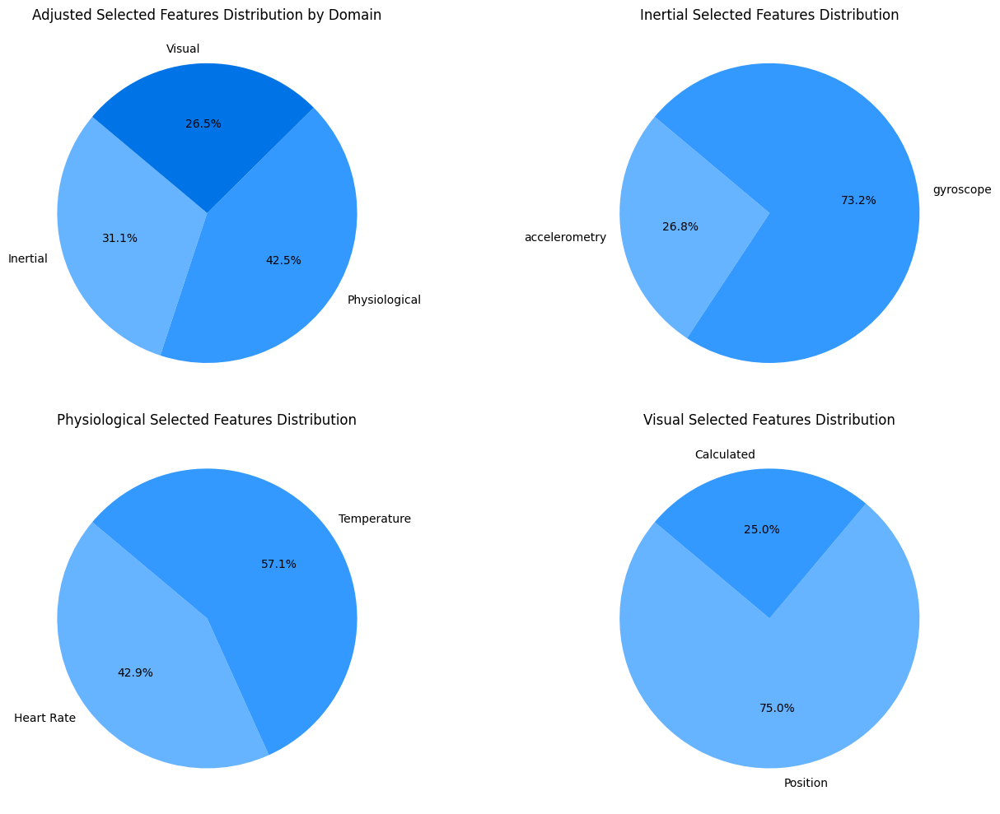

In [ ]:
# Create combined pie charts with the adjusted overall distribution included
fig, axs = plt.subplots(2, 2, figsize=(14, 10))
colors = ['#66b3ff', '#3399ff', '#0073e6', '#005b96', '#003f6b']

# Adjusted overall selected features distribution for multimodal data
axs[0, 0].pie(adjusted_distribution_series.values, labels=adjusted_distribution_series.index, autopct='%1.1f%%', startangle=140, colors=colors[:3])
axs[0, 0].set_title('Adjusted Selected Features Distribution by Domain')

# Inertial selected features distribution (gyroscope vs accelerometry)
axs[0, 1].pie(distribution_inertial_series.values, labels=distribution_inertial_series.index, autopct='%1.1f%%', startangle=140, colors=colors[:2])
axs[0, 1].set_title('Inertial Selected Features Distribution')

# Physiological selected features distribution (temperature vs heart rate)
axs[1, 0].pie(distribution_phys_series.values, labels=distribution_phys_series.index, autopct='%1.1f%%', startangle=140, colors=colors[:2])
axs[1, 0].set_title('Physiological Selected Features Distribution')

# Visual selected features distribution (position vs calculated)
axs[1, 1].pie(distribution_visual_series.values, labels=distribution_visual_series.index, autopct='%1.1f%%', startangle=140, colors=colors[:2])
axs[1, 1].set_title('Visual Selected Features Distribution')

plt.tight_layout()
plt.show()

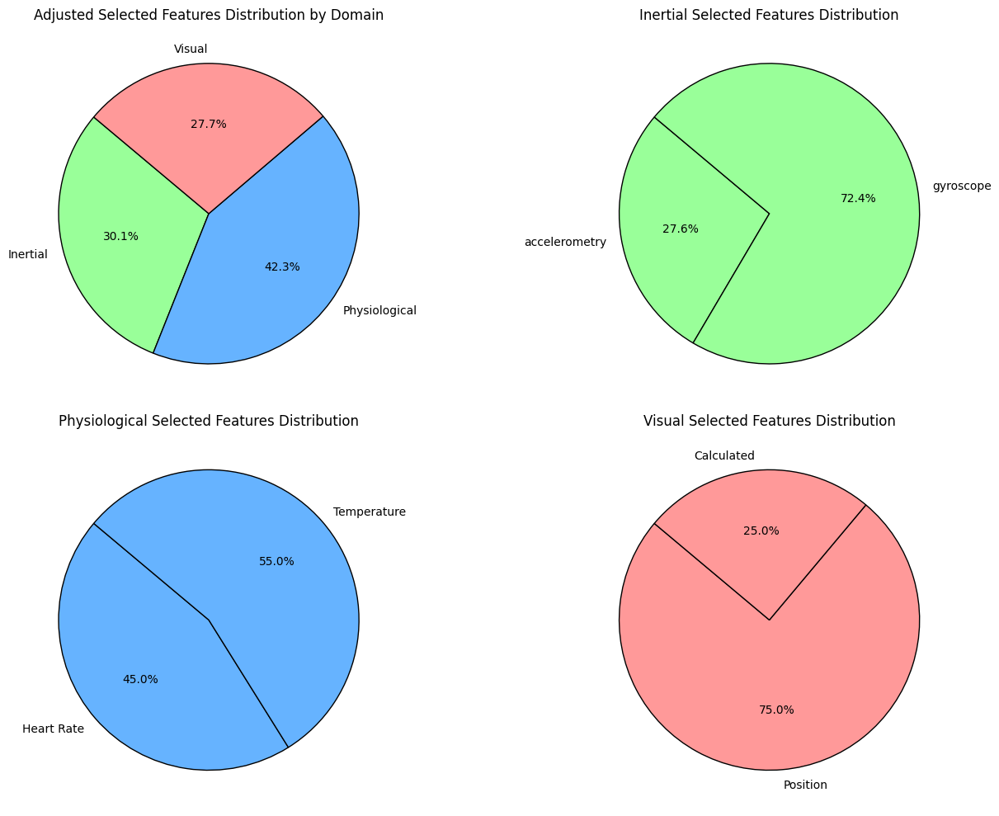

In [ ]:
import matplotlib.pyplot as plt

# Create combined pie charts with the adjusted overall distribution included
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# Define colors and textures for each category
colors = ['#99ff99', '#66b3ff', '#ff9999']  # Blue for Inertial, Red for Physiological, Green for Visual
textures = ['*', '+', '-']  # Different hatches for different categories

# Adjusted overall selected features distribution for multimodal data
wedges, texts, autotexts = axs[0, 0].pie(adjusted_distribution_series.values, labels=adjusted_distribution_series.index,
                                         autopct='%1.1f%%', startangle=140, colors=colors, wedgeprops=dict(edgecolor='black'))

axs[0, 0].set_title('Adjusted Selected Features Distribution by Domain')

# Inertial selected features distribution (gyroscope vs accelerometry)
wedges, texts, autotexts = axs[0, 1].pie(distribution_inertial_series.values, labels=distribution_inertial_series.index,
                                         autopct='%1.1f%%', startangle=140, colors=[colors[0], colors[0]], wedgeprops=dict(edgecolor='black'))

axs[0, 1].set_title('Inertial Selected Features Distribution')

# Physiological selected features distribution (temperature vs heart rate)
wedges, texts, autotexts = axs[1, 0].pie(distribution_phys_series.values, labels=distribution_phys_series.index,
                                         autopct='%1.1f%%', startangle=140, colors=[colors[1], colors[1]], wedgeprops=dict(edgecolor='black'))

axs[1, 0].set_title('Physiological Selected Features Distribution')

# Visual selected features distribution (position vs calculated)
wedges, texts, autotexts = axs[1, 1].pie(distribution_visual_series.values, labels=distribution_visual_series.index,
                                         autopct='%1.1f%%', startangle=140, colors=[colors[2], colors[2]], wedgeprops=dict(edgecolor='black'))

axs[1, 1].set_title('Visual Selected Features Distribution')

plt.tight_layout()
plt.show()


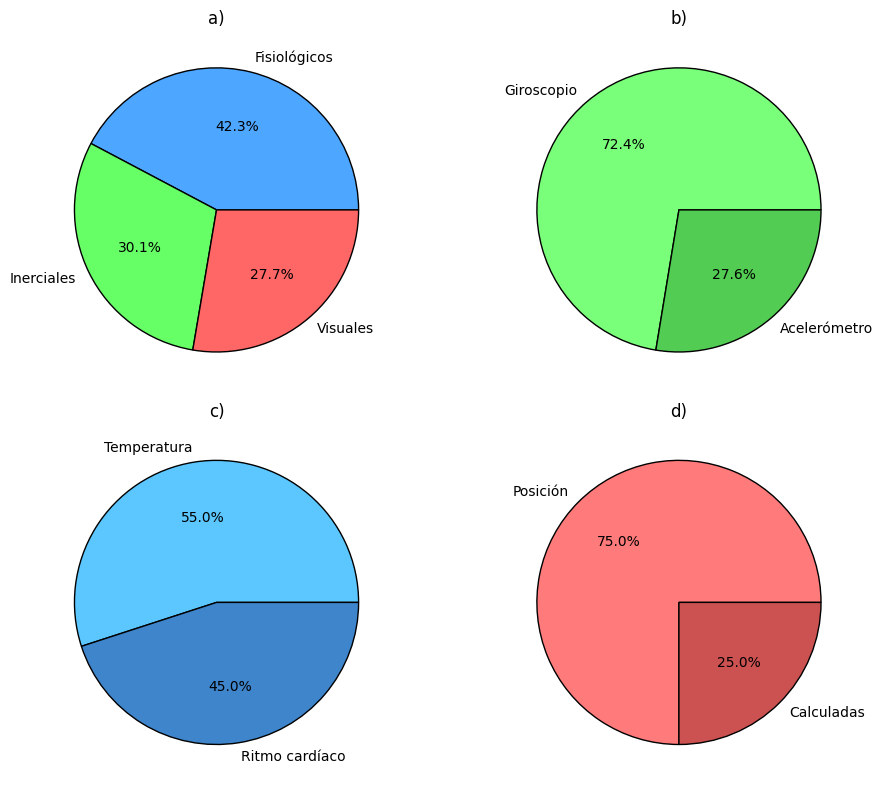

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Function to adjust brightness
def adjust_brightness(color, factor):
    color = mcolors.to_rgb(color)
    return tuple(min(1, max(0, c * factor)) for c in color)

# Original colors
colors_a = ['#4da6ff', '#66ff66', '#ff6666']  # Multimodal colors

# Adjusting colors for individual mode pie charts
colors_b = [adjust_brightness('#66ff66', 1.2), adjust_brightness('#66ff66', 0.8)]
colors_c = [adjust_brightness('#4da6ff', 1.2), adjust_brightness('#4da6ff', 0.8)]
colors_d = [adjust_brightness('#ff6666', 1.2), adjust_brightness('#ff6666', 0.8)]

# Data for the pie charts
data_a = [42.3, 30.1, 27.7]
labels_a = ['Fisiológicos', 'Inerciales', 'Visuales']

data_b = [72.4, 27.6]
labels_b = ['Giroscopio', 'Acelerómetro']

data_c = [55.0, 45.0]
labels_c = ['Temperatura', 'Ritmo cardíaco']

data_d = [75.0, 25.0]
labels_d = ['Posición', 'Calculadas']

# Create figure with subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 8))

# Subplot a)
axs[0, 0].pie(data_a, labels=labels_a, autopct='%1.1f%%', colors=colors_a, wedgeprops=dict(edgecolor='black'))
axs[0, 0].set_title('a)')

# Subplot b)
axs[0, 1].pie(data_b, labels=labels_b, autopct='%1.1f%%', colors=colors_b, wedgeprops=dict(edgecolor='black'))
axs[0, 1].set_title('b)')

# Subplot c)
axs[1, 0].pie(data_c, labels=labels_c, autopct='%1.1f%%', colors=colors_c, wedgeprops=dict(edgecolor='black'))
axs[1, 0].set_title('c)')

# Subplot d)
axs[1, 1].pie(data_d, labels=labels_d, autopct='%1.1f%%', colors=colors_d, wedgeprops=dict(edgecolor='black'))
axs[1, 1].set_title('d)')

# Adjust layout
plt.tight_layout()

# Save the plot as an image file (optional)
plt.savefig('multimodal_data_distribution_toned.png')

# Show the plot
plt.show()


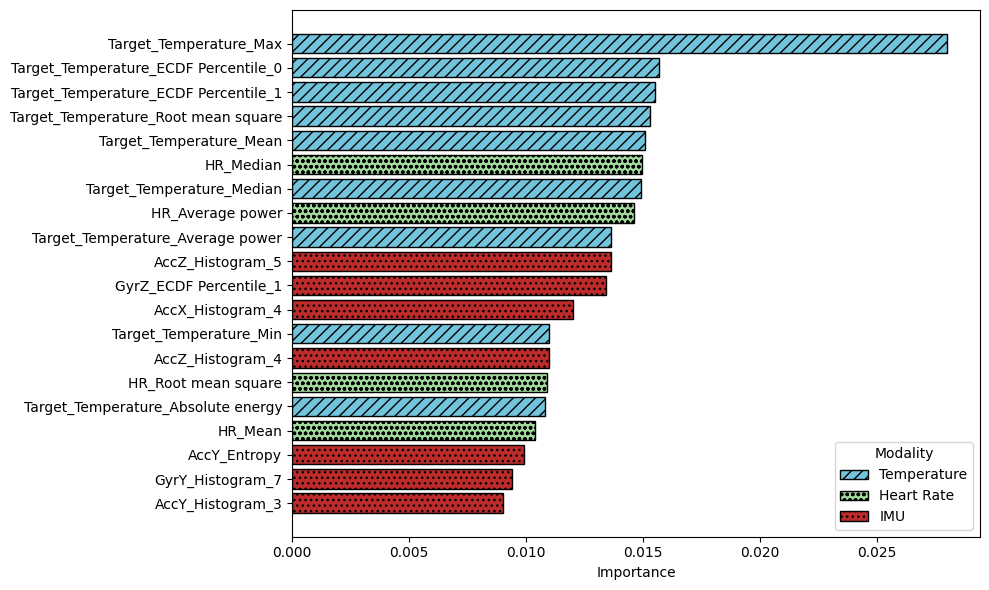

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Final corrected features and importances
features = [
    "Target_Temperature_Max", "Target_Temperature_ECDF Percentile_0",
    "Target_Temperature_ECDF Percentile_1", "Target_Temperature_Root mean square",
    "Target_Temperature_Mean", "HR_Median", "Target_Temperature_Median",
    "HR_Average power", "Target_Temperature_Average power", "AccZ_Histogram_5",
    "GyrZ_ECDF Percentile_1", "AccX_Histogram_4", "Target_Temperature_Min",
    "AccZ_Histogram_4", "HR_Root mean square", "Target_Temperature_Absolute energy",
    "HR_Mean", "AccY_Entropy", "GyrY_Histogram_7", "AccY_Histogram_3"
]

importance = [
    0.028, 0.0157, 0.0155, 0.0153, 0.0151, 0.01495, 0.01493, 0.01462, 0.01362, 0.01361,
    0.0134, 0.012, 0.011, 0.011, 0.0109, 0.0108, 0.0104, 0.0099, 0.0094, 0.009
]
# Create legend handles
legend_elements = [
    mpatches.Patch(facecolor="#72C3DC", hatch="///", edgecolor='black', label="Temperature"),
    mpatches.Patch(facecolor="#A1D99B", hatch="ooo", edgecolor='black', label="Heart Rate"),
    mpatches.Patch(facecolor="#bd2b2b", hatch="...", edgecolor='black', label="IMU")
]

# Assign modality to each for styling
modality = []
for f in features:
    if "Temperature" in f:
        modality.append("Temperature")
    elif "HR" in f:
        modality.append("Heart Rate")
    else:
        modality.append("IMU")

# DataFrame for plotting
df = pd.DataFrame({'Feature': features, 'Importance': importance, 'Modality': modality})

# Color and hatch by modality
color_map = {"Temperature": "#72C3DC", "Heart Rate": "#A1D99B", "IMU": "#bd2b2b"}
hatch_map = {"Temperature": "///", "Heart Rate": "ooo", "IMU": "..."}
colors = [color_map[m] for m in df["Modality"]]
hatches = [hatch_map[m] for m in df["Modality"]]

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.barh(df["Feature"], df["Importance"], color=colors, edgecolor='black')

# Apply hatching
for bar, hatch in zip(bars, hatches):
    bar.set_hatch(hatch)

ax.legend(handles=legend_elements, title="Modality", loc="lower right")
# Labeling and formatting
plt.xlabel("Importance")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


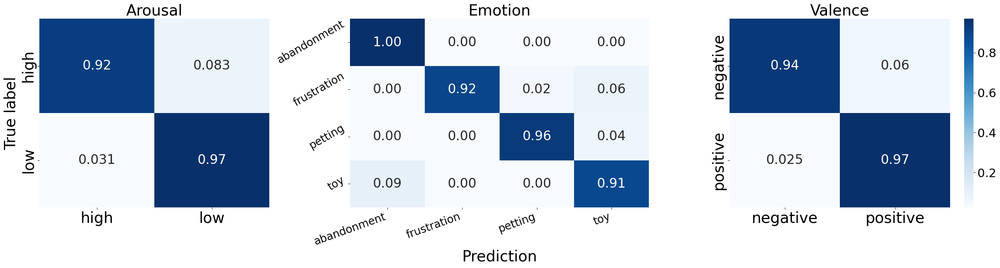

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from matplotlib import gridspec

#Results based on outcomes from the model training and testing using multimodal data
cm_arousal = np.array([[0.92, 0.083],
                       [0.031, 0.97]])

cm_emotion = np.array([[1.00, 0.00, 0.00, 0.00],
                       [0.00, 0.92, 0.02, 0.06],
                       [0.00, 0.00, 0.96, 0.043],
                       [0.088, 0.00, 0.00, 0.91]])

cm_valence = np.array([[0.94, 0.06],
                       [0.025, 0.97]])


fig = plt.figure(figsize=(26, 7))  # Increase total width
gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1.3, 1.2])  # Wider third plot

# Define subplots
ax0 = plt.subplot(gs[0])
ax1 = plt.subplot(gs[1])
ax2 = plt.subplot(gs[2])

# Plot Arousal
sns.heatmap(cm_arousal, annot=True, fmt=".3", cmap="Blues", xticklabels=labels_arousal,
            yticklabels=labels_arousal, ax=ax0, cbar=False, linewidths=0, linecolor='black', annot_kws={"size": 24}, )
ax0.set_title("Arousal", fontsize=28)
ax0.set_ylabel("True label", fontsize=28)
ax0.tick_params(axis='both', labelsize=28)

# Plot Emotion
sns.heatmap(cm_emotion, annot=True, fmt=".2f", cmap="Blues", xticklabels=labels_emotion,
            yticklabels=labels_emotion, ax=ax1, cbar=False, linewidths=0, linecolor='black', annot_kws={"size": 24})
ax1.set_title("Emotion", fontsize=28)
ax1.set_xlabel("Prediction", fontsize=28)
ax1.set_ylabel("", fontsize=28)
ax1.tick_params(axis='both', labelsize=28)
plt.setp(ax1.get_xticklabels(), rotation=20, ha="right", fontsize=20)
plt.setp(ax1.get_yticklabels(), rotation=30, fontsize=20)

# Plot Valence (now wider)
heatmap = sns.heatmap(cm_valence, annot=True, fmt=".3", cmap="Blues", xticklabels=labels_valence,
            yticklabels=labels_valence, ax=ax2, cbar=True, linewidths=0, linecolor='black', annot_kws={"size": 24})
ax2.set_title("Valence", fontsize=28)
ax2.set_ylabel("", fontsize=28)
ax2.tick_params(axis='both', labelsize=28)

# Make colorbar tick labels larger
cbar = heatmap.collections[0].colorbar
cbar.ax.tick_params(labelsize=22)

plt.tight_layout()
plt.savefig("confusion_matrices.pdf", dpi=200, format='pdf')
plt.show()
